# Imports

In [1]:
#  !pip install tsai
# !pip install optuna
# !pip install joblib


In [1]:
import time
import json
import os



import pandas as pd
import warnings
warnings.filterwarnings('ignore')

import numpy as np


import torch
print(torch.__version__)  # Should print a compatible version
print(torch.cuda.is_available())

import tsai
from tsai.basics import*
from tsai.inference import load_learner
from sklearn.metrics import mean_squared_error, mean_absolute_error

import optuna
import joblib



import matplotlib.pyplot as plt
%matplotlib inline



2.2.2+cu121
True


In [2]:
print("NumPy version:", np.__version__)
print("Pandas version:", pd.__version__)
print("PyTorch version:", torch.__version__)
print("TSAI version:", tsai.__version__)

NumPy version: 1.26.4
Pandas version: 2.2.2
PyTorch version: 2.2.2+cu121
TSAI version: 0.3.9


In [3]:
import tsai
print(tsai.__version__)


0.3.9


In [4]:
my_setup

<function tsai.imports.my_setup(*pkgs)>

In [5]:
os.getcwd()

'/scratch/us2055/Oil_Price/Notebooks'

In [6]:
master_df = pd.read_csv("../Data/time_series_data.csv")

# Data Cleaning and Preprocessing

In [4]:
master_df

,Date,S&P 500,Interest Rate,VIX,OVX,USO,DXY,Crude Oil
0,01/01/21,NaN,0.09,NaN,NaN,NaN,89.94,NaN
1,02/01/21,NaN,0.09,NaN,NaN,NaN,NaN,NaN
2,03/01/21,NaN,0.09,NaN,NaN,NaN,NaN,NaN
3,04/01/21,3700.65,0.09,26.97,42.12,32.38,89.87,47.47
4,05/01/21,3726.86,0.09,25.34,40.39,33.94,89.44,49.78
...,...,...,...,...,...,...,...,...
1396,28/10/24,5823.52,NaN,NaN,42.96,70.43,104.32,67.65
1397,29/10/24,5832.92,NaN,NaN,42.47,69.66,104.32,NaN
1398,30/10/24,5813.67,NaN,NaN,41.13,71.36,103.99,NaN
1399,31/10/24,5705.45,NaN,NaN,48.79,73.08,103.98,NaN


In [5]:
master_df.columns = ['date', 's_p_500', 'interest_rate', 'vix', 'ovx', 'uso', 'dxy', 'crude']

In [6]:
df_crude = master_df[['date','crude']]

In [7]:
df_crude

,date,crude
0,01/01/21,NaN
1,02/01/21,NaN
2,03/01/21,NaN
3,04/01/21,47.47
4,05/01/21,49.78
...,...,...
1396,28/10/24,67.65
1397,29/10/24,NaN
1398,30/10/24,NaN
1399,31/10/24,NaN


In [8]:
df_crude['crude_fixed'] = df_crude['crude'].fillna(method='ffill')


SettingWithCopyError: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [9]:
df_crude = df_crude.iloc[3:]
df_crude.reset_index(drop = True, inplace = True)

In [10]:
df_crude

,date,crude,crude_fixed
0,04/01/21,47.47,47.47
1,05/01/21,49.78,49.78
2,06/01/21,50.45,50.45
3,07/01/21,50.63,50.63
4,08/01/21,52.14,52.14
...,...,...,...
1393,28/10/24,67.65,67.65
1394,29/10/24,NaN,67.65
1395,30/10/24,NaN,67.65
1396,31/10/24,NaN,67.65


In [11]:
zero_counts = (df_crude['crude_fixed'] == 0).sum()
print(zero_counts)


34


In [12]:
df_crude['crude_fixed'] = df_crude['crude_fixed'].replace(0).fillna(method='ffill')


SettingWithCopyError: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [13]:
zero_counts = (df_crude['crude_fixed'] == 0).sum()
print(zero_counts)


0


In [14]:
df_crude['date'] = pd.to_datetime(df_crude['date'], format='%d/%m/%y') #important as not doing this will lead to issues with tsai splits

SettingWithCopyError: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [15]:
crude_modeling_df = df_crude[['date', 'crude_fixed']]
crude_modeling_df.columns = ['date', 'crude']

crude_modeling_df

,date,crude
0,2021-01-04,47.47
1,2021-01-05,49.78
2,2021-01-06,50.45
3,2021-01-07,50.63
4,2021-01-08,52.14
...,...,...
1393,2024-10-28,67.65
1394,2024-10-29,67.65
1395,2024-10-30,67.65
1396,2024-10-31,67.65


# Data Loading

In [2]:
master_df = pd.read_csv("../Outputs/Data_Master.csv")

In [3]:
crude_modeling_df = master_df[['Date', 'crude']]

In [4]:

# Convert the 'Date' column to datetime
crude_modeling_df['Date'] = pd.to_datetime(crude_modeling_df['Date'])


SettingWithCopyError: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [21]:
def smape(A, F):
    return 100/len(A) * np.sum(2 * np.abs(F - A) / (np.abs(A) + np.abs(F)))

# EDA

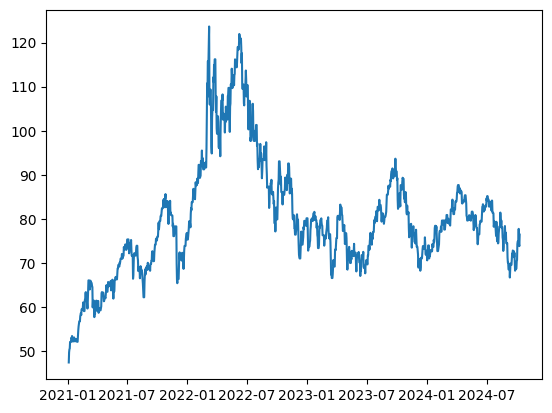

In [8]:
plt.plot(crude_modeling_df['Date'], crude_modeling_df['crude'])

## Splits

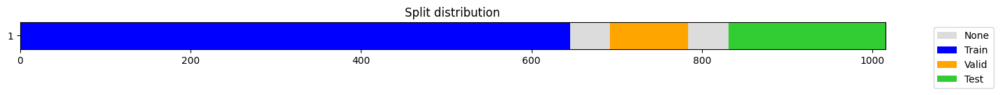

((#645) [0,1,2,3,4,5,6,7,8,9...],
 (#92) [692,693,694,695,696,697,698,699,700,701...],
 (#184) [831,832,833,834,835,836,837,838,839,840...])

In [17]:
datetime_col = 'date'
fcst_history = 336 # # steps in the past
fcst_horizon = 48  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                valid_size=valid_size, test_size=test_size)
splits


In [24]:
train_data = crude_modeling_df.iloc[splits[0]]
test_data = crude_modeling_df.iloc[splits[2]]
val_data = crude_modeling_df.iloc[splits[1]]

In [25]:
train_data

,date,crude
0,2021-01-04,47.47
1,2021-01-05,49.78
2,2021-01-06,50.45
3,2021-01-07,50.63
4,2021-01-08,52.14
...,...,...
640,2022-10-06,88.90
641,2022-10-07,93.07
642,2022-10-08,93.07
643,2022-10-09,93.07


## Standardization

In [26]:
scaler = StandardScaler()

In [27]:
scaled_crude_modeling_df = crude_modeling_df.copy()

In [28]:
scaler.fit(train_data[['crude']])
scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

In [29]:
scaled_crude_modeling_df

,date,crude
0,2021-01-04,-1.887099
1,2021-01-05,-1.759268
2,2021-01-06,-1.722191
3,2021-01-07,-1.712230
4,2021-01-08,-1.628669
...,...,...
1393,2024-10-28,-0.770372
1394,2024-10-29,-0.770372
1395,2024-10-30,-0.770372
1396,2024-10-31,-0.770372


In [30]:
scaled_train_data = scaled_crude_modeling_df.iloc[splits[0]]
scaled_test_data = scaled_crude_modeling_df.iloc[splits[2]]
scaled_val_data = scaled_crude_modeling_df.iloc[splits[1]]

## Sliding Window

In [31]:
x_vars = 'crude'
y_vars = 'crude'


In [32]:
x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
x.shape, y.shape

((1015, 1, 336), (1015, 1, 48))

In [33]:
x_tensor = torch.tensor(x, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32)  # or dtype=torch.int64 for classi


In [34]:
x_tensor.dtype

torch.float32

In [402]:
# Convert each fastcore foundation list to a standard Python list
splits = [list(split) for split in splits]
splits = [np.array(split, dtype=np.int32) for split in splits]

## Model Building

In [35]:
arch_config = dict(
    n_layers=3,  # number of encoder layers
    n_heads=4,  # number of heads
    d_model=16,  # dimension of model
    d_ff=128,  # dimension of fully connected network
    attn_dropout=0.1, # dropout applied to the attention weights
    dropout=0.3,  # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len=10,  # length of the patch applied to the time series to create patches
    stride=1,  # stride used when creating patches
    padding_patch=True,  # padding_patch
)


In [36]:
learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size=64,
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae], cbs=ShowGraph())

In [37]:
learn.summary()

not enough values to plot a chart


PatchTST (Input shape: 64 x 1 x 336)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 1 x 48         
RevIN                                     2          True      
____________________________________________________________________________
                     64 x 1 x 337        
ReplicationPad1d                                               
____________________________________________________________________________
                     64 x 10 x 328       
Unfold                                                         
____________________________________________________________________________
                     64 x 1 x 328 x 16   
Linear                                    176        True      
Dropout                                                        
Linear                                    272        True      
Linear                                    272        True      
Linear                                    272       

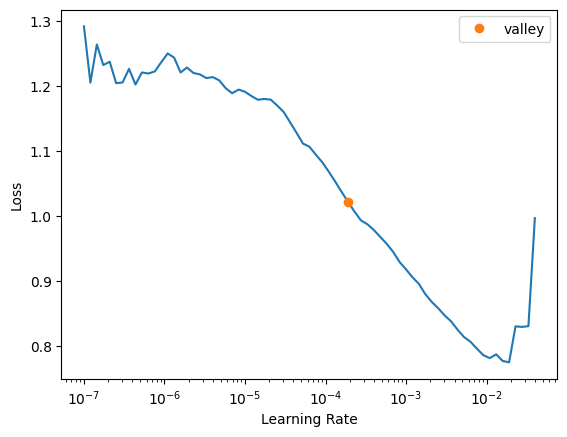

In [38]:
lr_max = learn.lr_find().valley

epoch,train_loss,valid_loss,mse,mae,time
0,1.105680,0.110633,0.110633,0.283471,00:00
1,0.878733,0.349673,0.349673,0.516303,00:00
2,0.711575,0.422488,0.422488,0.559946,00:00
3,0.600282,0.415681,0.415681,0.556230,00:00
4,0.521262,0.423568,0.423568,0.566459,00:00
5,0.464025,0.462052,0.462052,0.594425,00:00
6,0.419710,0.460633,0.460633,0.594369,00:00
7,0.386226,0.442155,0.442155,0.582883,00:00
8,0.359602,0.430750,0.430750,0.575481,00:00
9,0.339811,0.425394,0.425394,0.571866,00:00


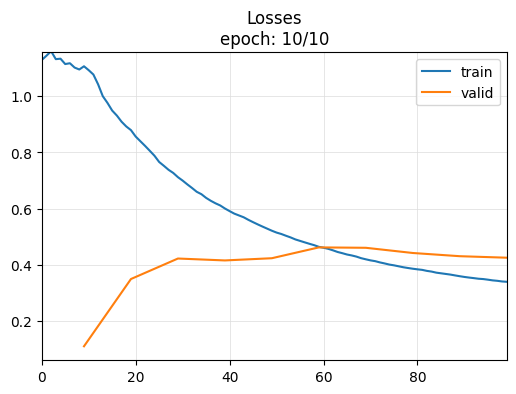

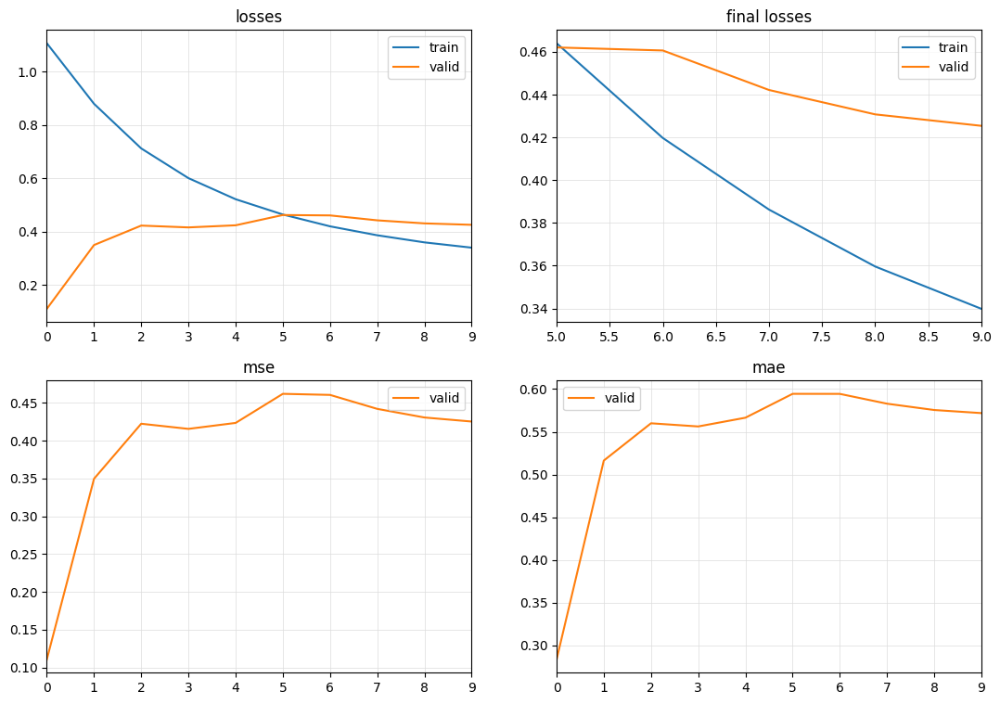

In [39]:
n_epochs = 10
learn.fit_one_cycle(n_epochs, lr_max =lr_max)
learn.export('patchTST.pt')

In [40]:
learn.export('patchTST.pt')

In [42]:
from tsai.inference import load_learner
from sklearn.metrics import mean_squared_error, mean_absolute_error

learn = load_learner('patchTST.pt')
scaled_preds, *_ = learn.get_X_preds(x[splits[1]])
scaled_preds = to_np(scaled_preds)
print(f"scaled_preds.shape: {scaled_preds.shape}")

scaled_y_true = y[splits[1]]
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true.flatten(), scaled_preds.flatten())
results_df


scaled_preds.shape: (92, 1, 48)


,mse,mae
valid,0.425394,0.571866


In [43]:
learn = load_learner('patchTST.pt')
y_test_preds, *_ = learn.get_X_preds(x[splits[2]])
y_test_preds = to_np(y_test_preds)
print(f"y_test_preds.shape: {y_test_preds.shape}")

y_test = y[splits[2]]
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["test", "mse"] = mean_squared_error(y_test.flatten(), y_test_preds.flatten())
results_df.loc["test", "mae"] = mean_absolute_error(y_test.flatten(), y_test_preds.flatten())
results_df

y_test_preds.shape: (184, 1, 48)


,mse,mae
test,0.153932,0.298572


In [44]:
    x_test = x[splits[2]]
    y_test = y[splits[2]]

    inverse_scale_y_preds = scaler.inverse_transform(y_test_preds.reshape(-1, 1)).flatten().reshape(184, 1, 48)
    inverse_scale_y_true = (scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()).reshape(184, 1, 48)
    inverse_scale_x_test = scaler.inverse_transform(x_test.reshape(-1, 1)).flatten().reshape(184, 1, 336)

array([84.86245 , 86.488106, 87.27215 , ..., 66.930115, 67.97325 ,
       63.96171 ], dtype=float32)

In [485]:
y_test_preds.shape

(184, 1, 48)

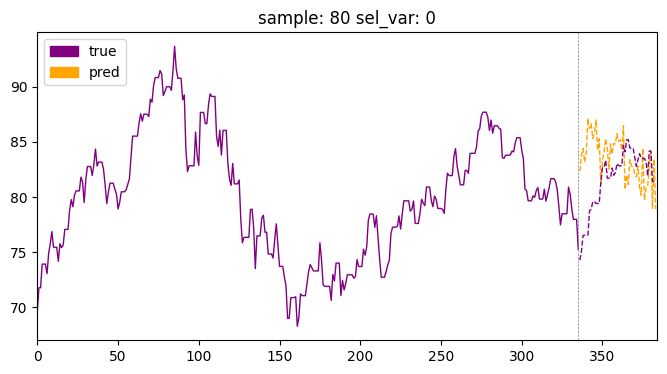

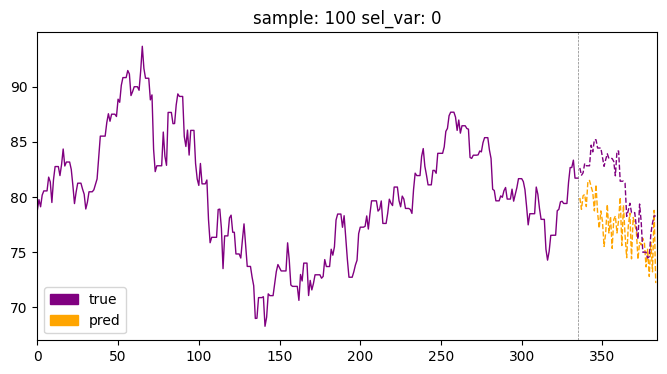

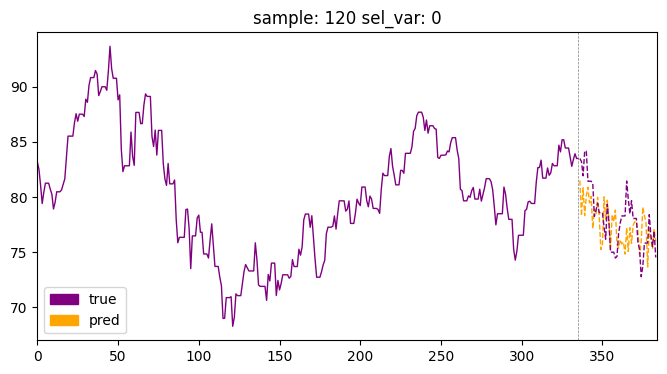

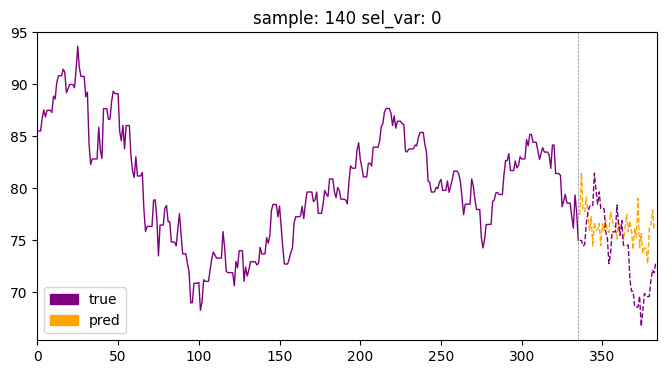

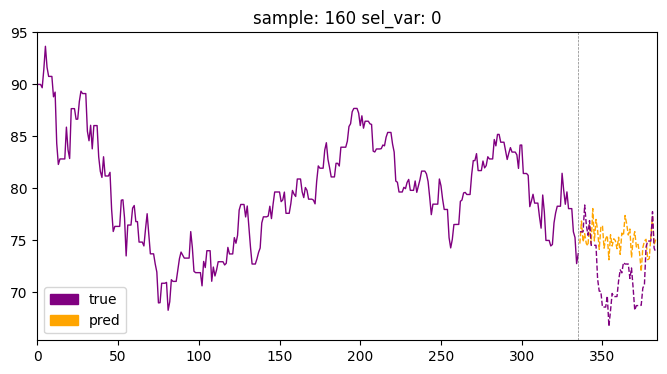

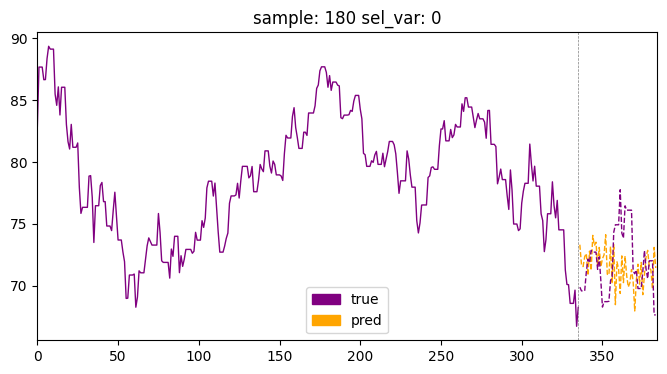

In [45]:


for id in range (80,200, 20):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


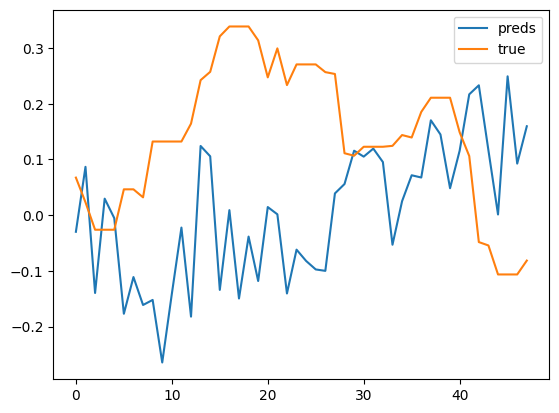

In [46]:
plt.plot(y_test_preds[4][0], label = 'preds')
plt.plot(y_test[4][0], label = 'true')
plt.legend()

In [413]:
y_preds_tensor = torch.tensor(y_test_preds)


y_test = y[splits[2]]
y_test_tensor = torch.tensor(y_test)

In [414]:
y_test_tensor.shape


torch.Size([184, 1, 48])

In [415]:
append_preds = y_preds_tensor[-1, 0, 1:]
append_preds

append_true = y_test_tensor[-1, 0, 1:]


In [416]:
first_preds = y_preds_tensor[:, 0, 0]

first_true = y_test_tensor[:, 0, 0]

first_preds_with_final = torch.cat((first_preds, append_preds))

first_true_with_final = torch.cat((first_true, append_true))


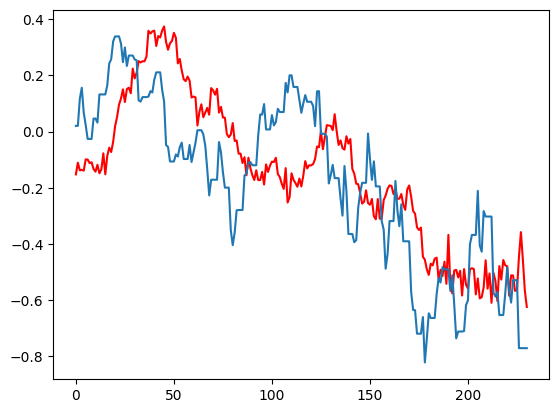

In [417]:
plt.plot(first_preds_with_final, c = 'r')
plt.plot(first_true_with_final)

In [418]:
splits[0][-1]

644

In [419]:
splits[1][0]

692

In [420]:
splits[1][-1]

783

In [421]:
splits[2][0]

831

In [422]:
#all sample predictions are valid and independent. Give 250 it gives the next 50.

#can access these to see how the model is doing over the next horizon

#however if you take the first from each, there will be a lag. if you input 250 the model outputs the next 50 you take first

#but when you input the next 250, it contains the true value for what you predicted, the model hence, predicts from
#true value and hence, if i take the first from each, it does not make any sense.



In [56]:
def objective(trial):

    HPs = {   'fcst_history': trial.suggest_int("fcst_history", 50, 400, step=50), # 'step' defines the granularity of the exploration
              'fcst_horizon': trial.suggest_int("fcst_horizon", 16, 128, step= 16),
              'batch_size': trial.suggest_int("batch_size", 8, 128, step=8),
              'epochs': trial.suggest_int("epochs", 5, 20, step = 1),
              'n_layers': trial.suggest_int("n_layers", 2, 6, step = 2),
              'n_heads': trial.suggest_int("n_heads", 2, 6, step = 2),
              'd_model': trial.suggest_int("d_model", 16, 128, step = 8),
              'd_ff': trial.suggest_int("d_ff", 16, 256, step = 8),
              'attn_dropout': trial.suggest_float("attn_dropout", 0, 0.5, step=0.1),
              'dropout': trial.suggest_float("dropout", 0, 0.5, step=0.1),
              'patch_len': trial.suggest_int("patch_len", 1, 20, step=10),
              'stride': trial.suggest_int("stride", 1, 5, step=1)

           
              }

    try: 
        loss = train_model(HPs)
        return loss
    except Exception as e: 
        print(f'Study failed because {e}.')
        return None
      
  


In [33]:
def data_preparation(HPs):



  #setting basic params
  datetime_col = 'date'
  fcst_history = HPs['fcst_history']
  fcst_horizon = HPs['fcst_horizon']
  valid_size   = 0.1
  test_size    = 0.2

  #getting cross-val splots

  splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                  valid_size=valid_size, test_size=test_size)

  train_data = crude_modeling_df.iloc[splits[0]]
  test_data = crude_modeling_df.iloc[splits[2]]
  val_data = crude_modeling_df.iloc[splits[1]]

  #scaling post cross-validation
  scaler = StandardScaler()
  scaled_crude_modeling_df = crude_modeling_df.copy()
  scaler.fit(train_data[['crude']])
  scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

  #doing the sliding window step

  x_vars = 'crude'
  y_vars = 'crude'

  x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
  x.shape, y.shape

  x_tensor = torch.tensor(x, dtype=torch.float32)
  y_tensor = torch.tensor(y, dtype=torch.float32)

  return splits, x_tensor, y_tensor, x, y









In [48]:
def train_model(HPs):

    splits, x_tensor, y_tensor, x, y = data_preparation(HPs)

    arch_config = dict(
    n_layers= HPs['n_layers'],  # number of encoder layers
    n_heads = HPs['n_heads'],  # number of heads
    d_model= HPs['d_model'],  # dimension of model
    d_ff= HPs['d_ff'],  # dimension of fully connected network
    attn_dropout= HPs['attn_dropout'], # dropout applied to the attention weights
    dropout= HPs['dropout'], # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len= HPs['patch_len'],  # length of the patch applied to the time series to create patches
    stride= HPs['stride'],  # stride used when creating patches
    padding_patch= True,  # padding_patch
    #batch_size = HPs['batch_size']         
    )

    #modelling
    learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size = HPs['batch_size'],
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae])

    lr_max = learn.lr_find().valley
    learn.fit_one_cycle(HPs['epochs'], lr_max =lr_max)
    learn.export('patchTST.pt')

    #validation set inference
    learn = load_learner('patchTST.pt')
    scaled_preds, *_ = learn.get_X_preds(x[splits[1]])
    scaled_preds = to_np(scaled_preds)
    print(f"scaled_preds.shape: {scaled_preds.shape}")

    scaled_y_true = y[splits[1]]
    loss = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
    results_df = pd.DataFrame(columns=["mse", "mae"])
    results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
    results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true.flatten(), scaled_preds.flatten())




  





    return loss











[I 2024-11-05 01:15:21,026] Using an existing study with name 'oil_price_patch' instead of creating a new one.


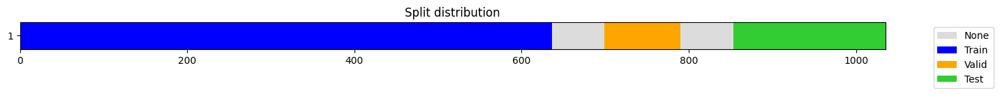

epoch,train_loss,valid_loss,mse,mae,time
0,1.158744,0.140038,0.140038,0.320273,00:00
1,0.967761,0.322934,0.322934,0.516632,00:00
2,0.842975,0.477494,0.477494,0.630022,00:00
3,0.765084,0.509270,0.509270,0.647357,00:00
4,0.706890,0.503895,0.503895,0.642678,00:00


[I 2024-11-05 01:15:26,799] Trial 829 finished with value: 0.5038946553790145 and parameters: {'fcst_history': 300, 'fcst_horizon': 64, 'batch_size': 128, 'epochs': 5, 'n_layers': 6, 'n_heads': 4, 'd_model': 128, 'd_ff': 176, 'attn_dropout': 0.30000000000000004, 'dropout': 0.4, 'patch_len': 1, 'stride': 2}. Best is trial 15 with value: 0.07396565575092504.


scaled_preds.shape: (91, 1, 64)


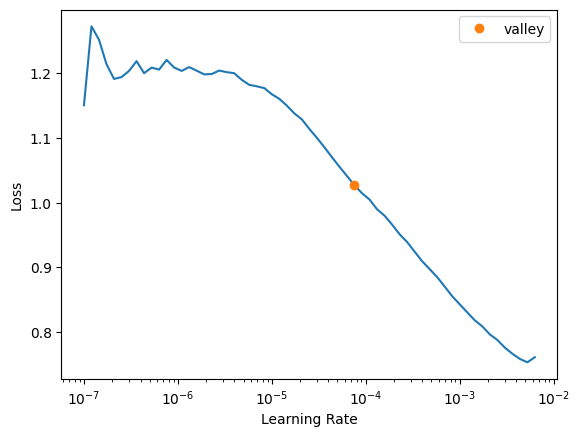

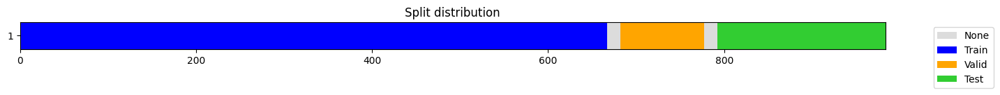

[W 2024-11-05 01:15:27,368] Trial 830 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:27,369] Trial 830 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


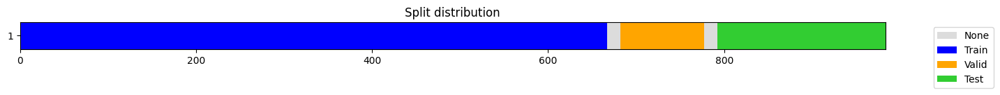

[W 2024-11-05 01:15:27,775] Trial 831 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:27,775] Trial 831 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


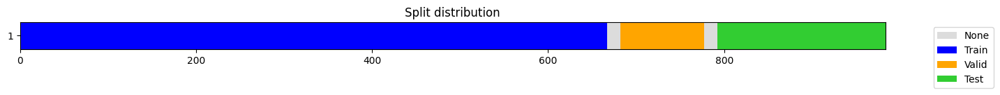

[W 2024-11-05 01:15:28,150] Trial 832 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:28,151] Trial 832 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


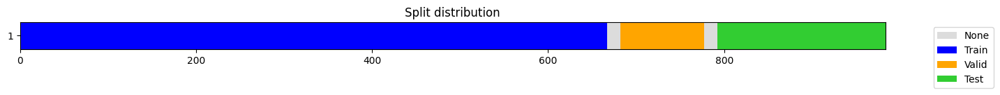

[W 2024-11-05 01:15:28,530] Trial 833 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:28,531] Trial 833 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


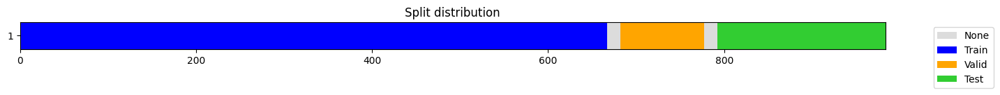

[W 2024-11-05 01:15:28,899] Trial 834 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:28,900] Trial 834 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


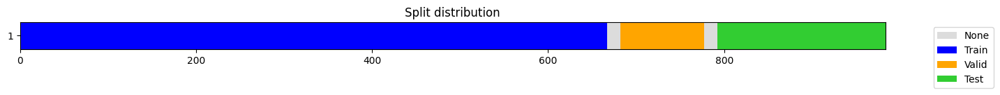

[W 2024-11-05 01:15:29,271] Trial 835 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:29,272] Trial 835 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


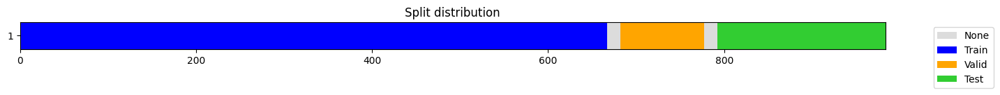

[W 2024-11-05 01:15:29,632] Trial 836 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:29,633] Trial 836 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


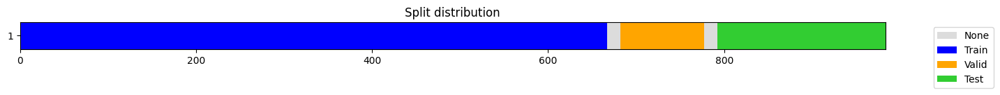

[W 2024-11-05 01:15:30,011] Trial 837 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:30,012] Trial 837 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


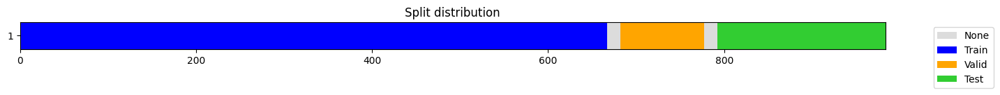

[W 2024-11-05 01:15:30,395] Trial 838 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:30,395] Trial 838 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


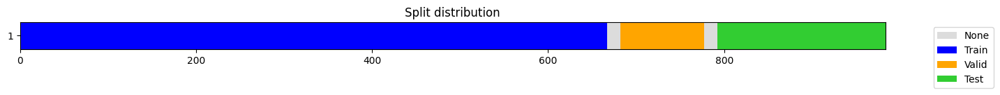

[W 2024-11-05 01:15:30,767] Trial 839 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:30,768] Trial 839 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


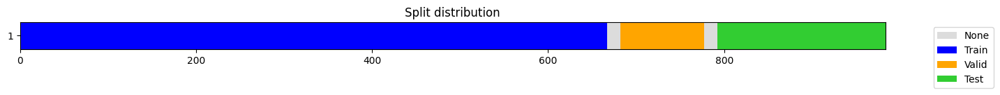

[W 2024-11-05 01:15:31,125] Trial 840 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:31,125] Trial 840 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


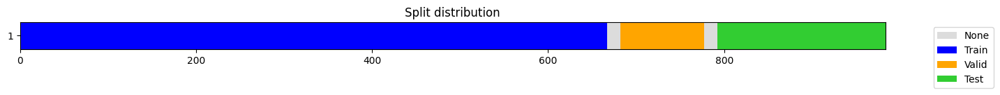

[W 2024-11-05 01:15:31,505] Trial 841 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 12, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:31,505] Trial 841 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


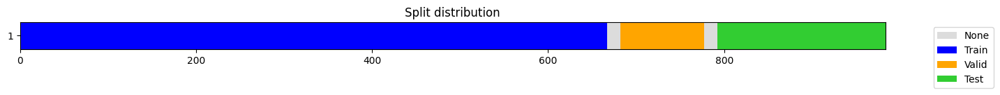

[W 2024-11-05 01:15:31,858] Trial 842 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:31,859] Trial 842 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


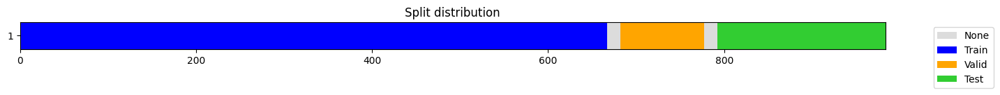

[W 2024-11-05 01:15:32,233] Trial 843 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:32,233] Trial 843 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


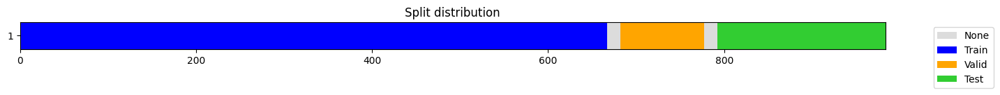

[W 2024-11-05 01:15:32,592] Trial 844 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:32,592] Trial 844 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


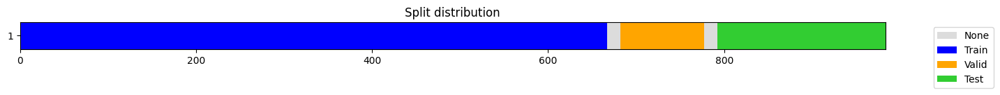

[W 2024-11-05 01:15:32,957] Trial 845 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:32,957] Trial 845 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


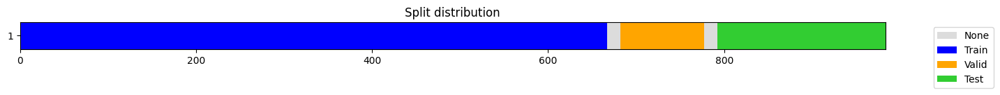

[W 2024-11-05 01:15:33,334] Trial 846 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 168, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:33,335] Trial 846 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


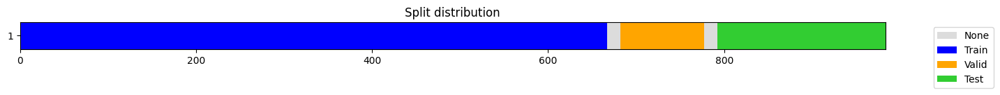

[W 2024-11-05 01:15:33,737] Trial 847 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:33,738] Trial 847 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


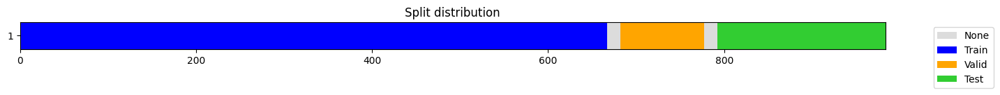

[W 2024-11-05 01:15:34,098] Trial 848 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:34,098] Trial 848 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


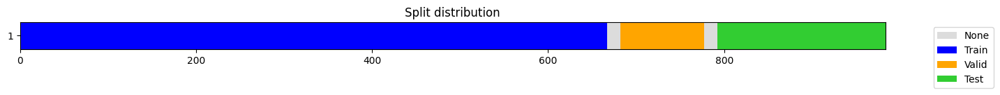

[W 2024-11-05 01:15:34,454] Trial 849 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:34,455] Trial 849 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


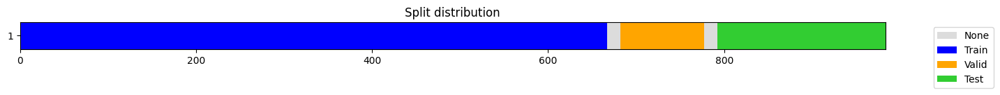

[W 2024-11-05 01:15:34,803] Trial 850 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:34,803] Trial 850 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


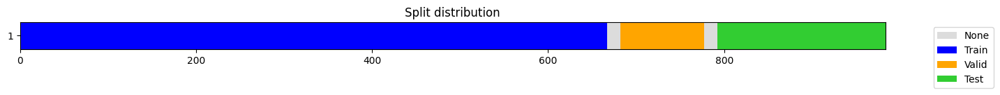

[W 2024-11-05 01:15:35,164] Trial 851 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:35,165] Trial 851 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


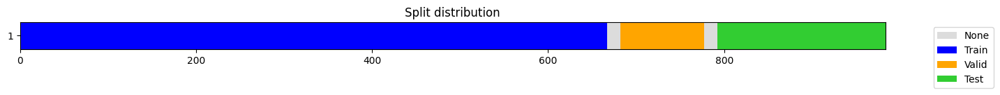

[W 2024-11-05 01:15:35,539] Trial 852 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:35,539] Trial 852 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


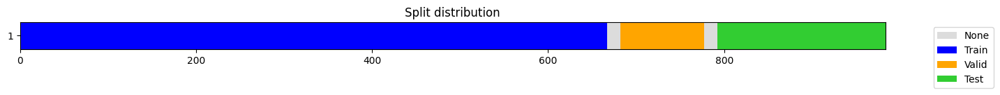

[W 2024-11-05 01:15:35,929] Trial 853 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:35,929] Trial 853 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


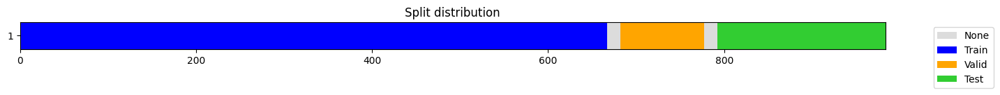

[W 2024-11-05 01:15:36,297] Trial 854 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:36,297] Trial 854 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


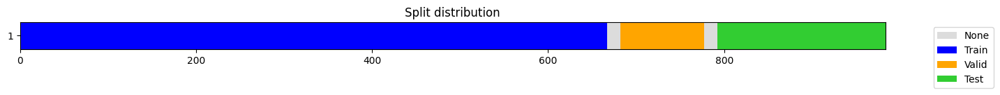

[W 2024-11-05 01:15:36,676] Trial 855 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:36,676] Trial 855 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


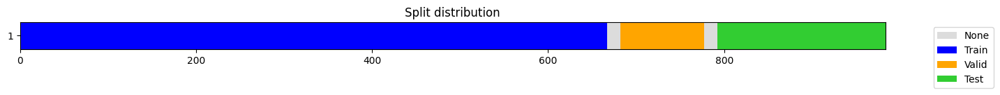

[W 2024-11-05 01:15:37,050] Trial 856 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:37,050] Trial 856 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


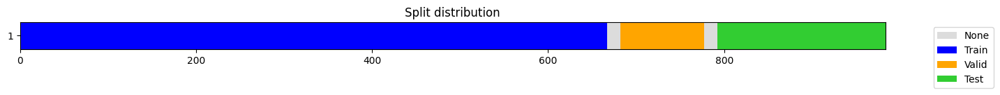

[W 2024-11-05 01:15:37,423] Trial 857 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:37,424] Trial 857 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


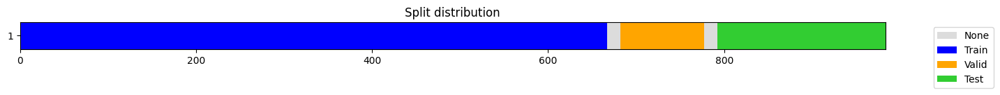

[W 2024-11-05 01:15:37,779] Trial 858 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:37,780] Trial 858 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


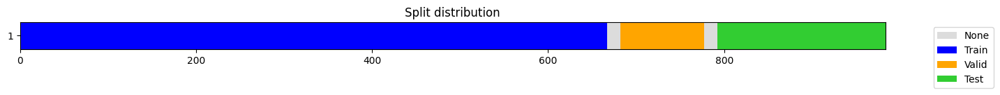

[W 2024-11-05 01:15:38,132] Trial 859 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:38,133] Trial 859 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


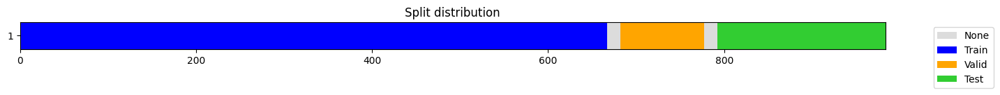

[W 2024-11-05 01:15:38,867] Trial 860 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:38,868] Trial 860 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


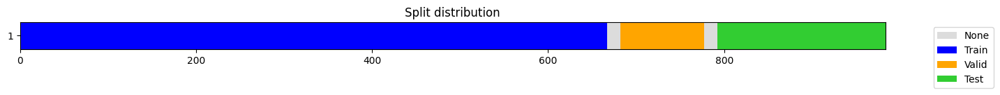

[W 2024-11-05 01:15:39,217] Trial 861 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:39,218] Trial 861 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


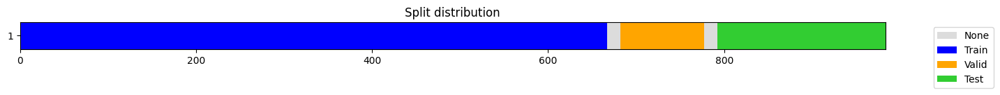

[W 2024-11-05 01:15:39,597] Trial 862 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:39,597] Trial 862 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


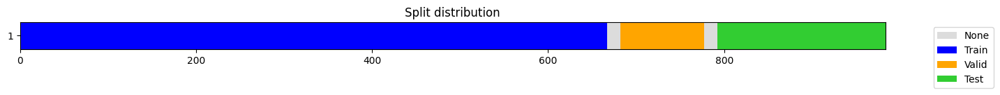

[W 2024-11-05 01:15:39,966] Trial 863 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:39,967] Trial 863 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


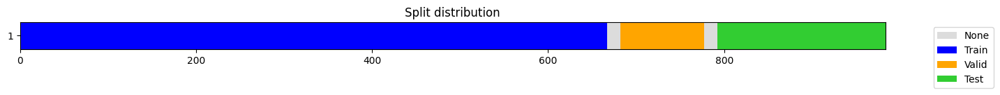

[W 2024-11-05 01:15:40,325] Trial 864 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:40,325] Trial 864 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


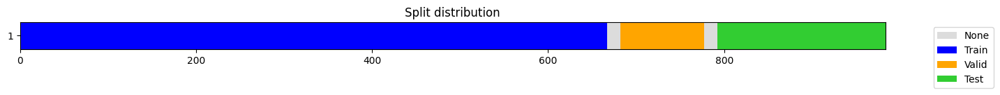

[W 2024-11-05 01:15:40,681] Trial 865 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:40,681] Trial 865 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


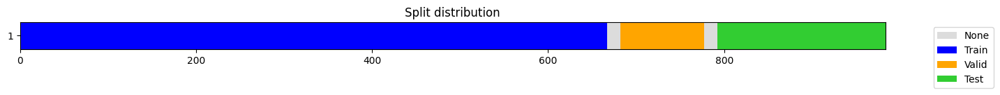

[W 2024-11-05 01:15:41,031] Trial 866 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:41,031] Trial 866 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


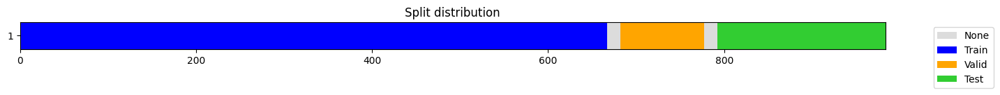

[W 2024-11-05 01:15:41,388] Trial 867 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:41,388] Trial 867 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


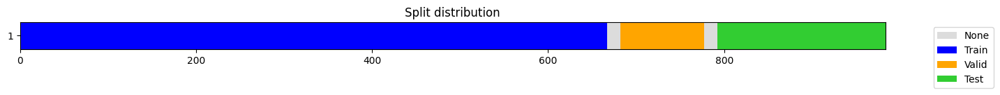

[W 2024-11-05 01:15:41,756] Trial 868 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:41,756] Trial 868 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


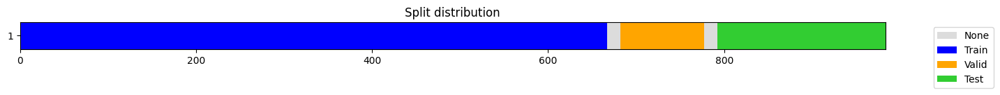

[W 2024-11-05 01:15:42,121] Trial 869 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:42,122] Trial 869 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


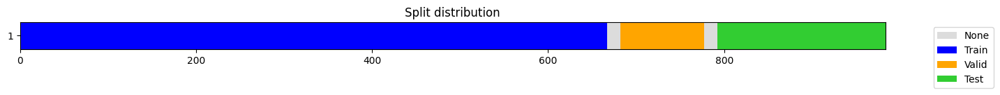

[W 2024-11-05 01:15:42,476] Trial 870 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:42,476] Trial 870 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


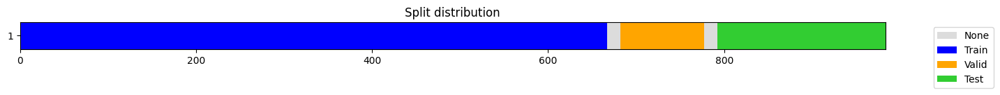

[W 2024-11-05 01:15:42,830] Trial 871 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:42,830] Trial 871 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


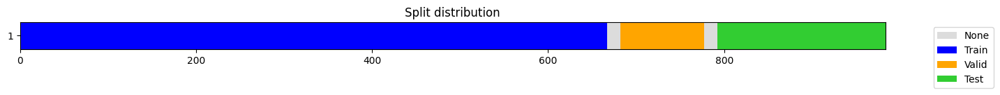

[W 2024-11-05 01:15:43,204] Trial 872 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 200, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:43,205] Trial 872 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


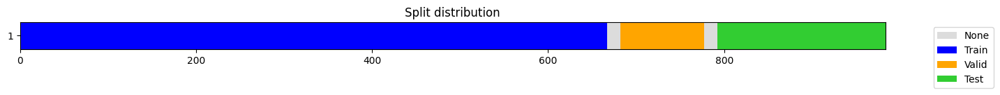

[W 2024-11-05 01:15:43,567] Trial 873 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:43,568] Trial 873 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


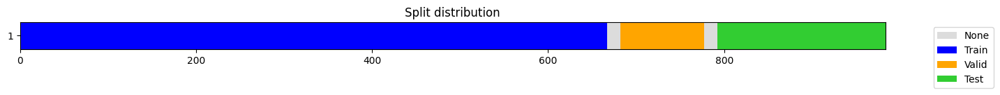

[W 2024-11-05 01:15:43,913] Trial 874 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:43,914] Trial 874 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


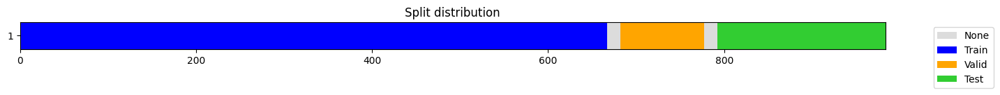

[W 2024-11-05 01:15:44,261] Trial 875 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:44,261] Trial 875 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


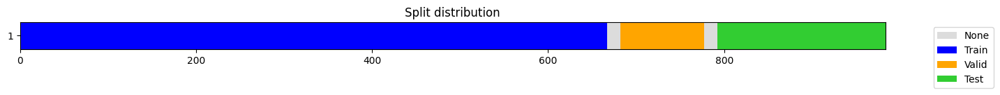

[W 2024-11-05 01:15:44,624] Trial 876 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:44,624] Trial 876 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


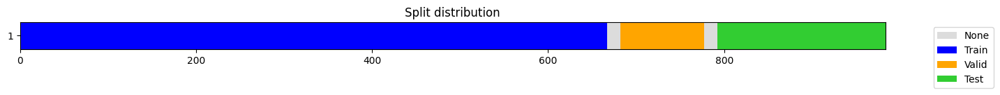

[W 2024-11-05 01:15:44,986] Trial 877 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:44,987] Trial 877 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


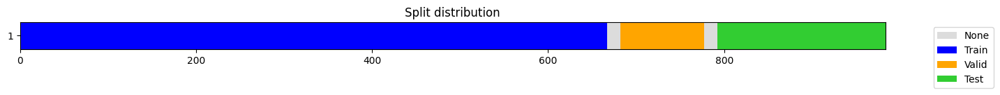

[W 2024-11-05 01:15:45,355] Trial 878 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:45,355] Trial 878 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


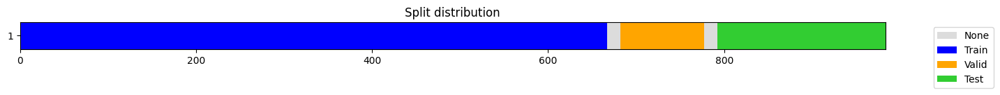

[W 2024-11-05 01:15:45,723] Trial 879 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:45,724] Trial 879 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


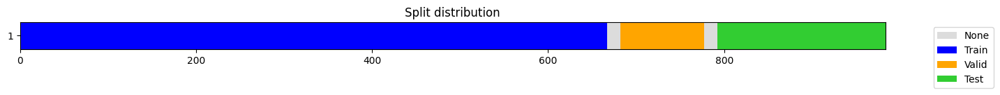

[W 2024-11-05 01:15:46,082] Trial 880 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:46,082] Trial 880 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


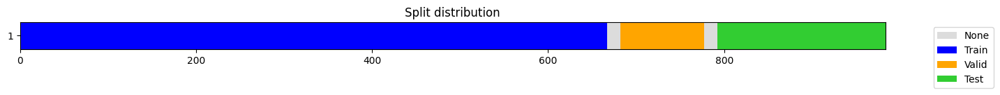

[W 2024-11-05 01:15:46,441] Trial 881 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:46,441] Trial 881 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


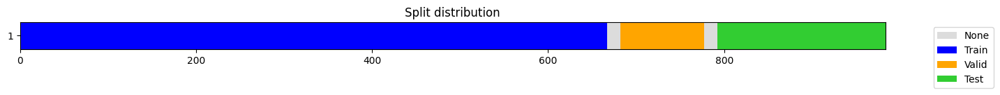

[W 2024-11-05 01:15:46,794] Trial 882 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:46,795] Trial 882 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


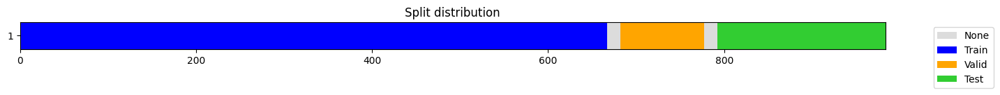

[W 2024-11-05 01:15:47,153] Trial 883 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:47,154] Trial 883 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


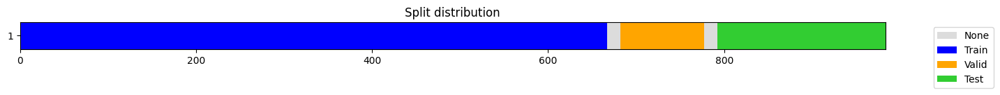

[W 2024-11-05 01:15:47,506] Trial 884 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:47,506] Trial 884 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


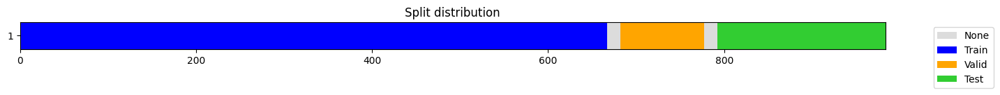

[W 2024-11-05 01:15:47,860] Trial 885 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:47,861] Trial 885 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


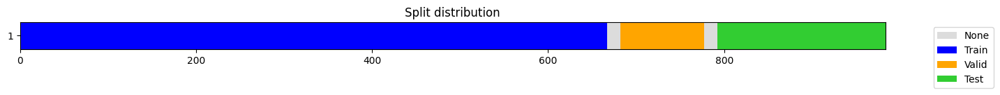

[W 2024-11-05 01:15:48,214] Trial 886 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:48,214] Trial 886 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


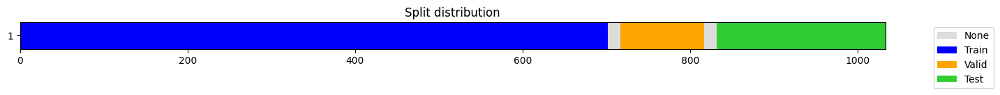

[W 2024-11-05 01:15:48,563] Trial 887 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:48,564] Trial 887 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


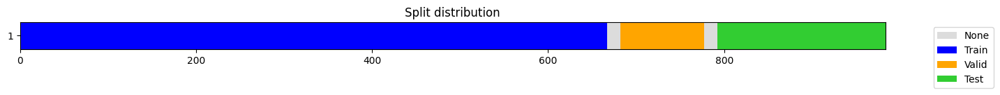

[W 2024-11-05 01:15:48,919] Trial 888 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:48,920] Trial 888 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


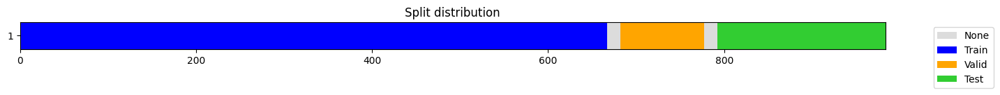

[W 2024-11-05 01:15:49,268] Trial 889 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:49,269] Trial 889 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


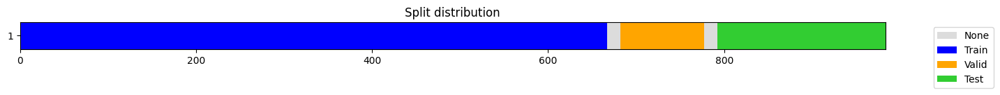

[W 2024-11-05 01:15:49,625] Trial 890 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:49,626] Trial 890 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


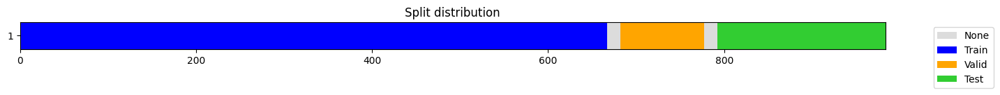

[W 2024-11-05 01:15:49,977] Trial 891 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 168, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:49,978] Trial 891 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


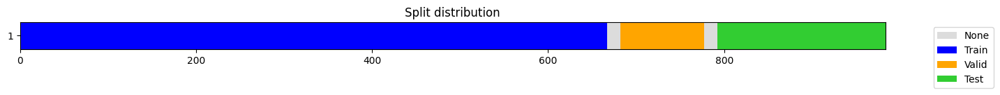

[W 2024-11-05 01:15:50,342] Trial 892 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:50,342] Trial 892 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


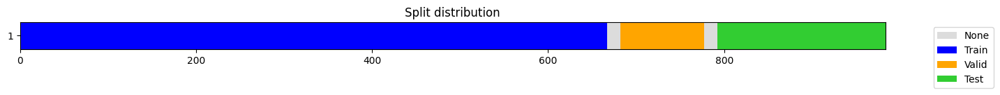

[W 2024-11-05 01:15:50,697] Trial 893 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:50,697] Trial 893 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


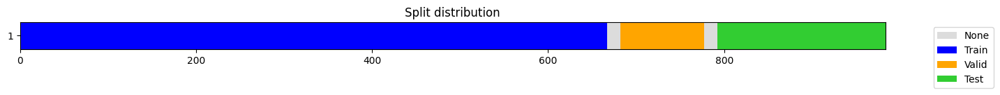

[W 2024-11-05 01:15:51,062] Trial 894 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:51,062] Trial 894 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


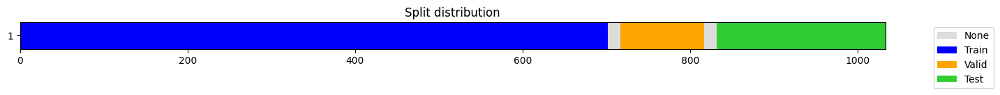

[W 2024-11-05 01:15:51,427] Trial 895 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:51,427] Trial 895 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


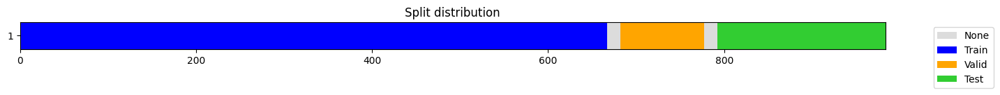

[W 2024-11-05 01:15:51,792] Trial 896 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:51,792] Trial 896 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


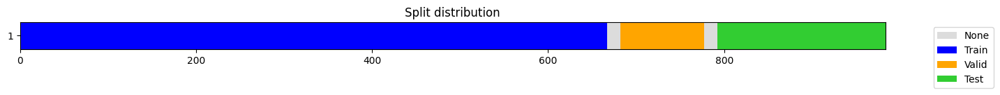

[W 2024-11-05 01:15:52,219] Trial 897 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:52,219] Trial 897 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


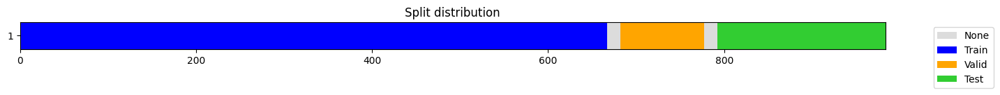

[W 2024-11-05 01:15:52,605] Trial 898 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:52,606] Trial 898 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


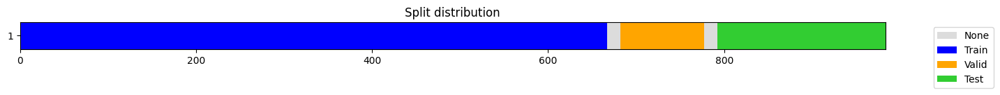

[W 2024-11-05 01:15:52,971] Trial 899 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:52,971] Trial 899 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


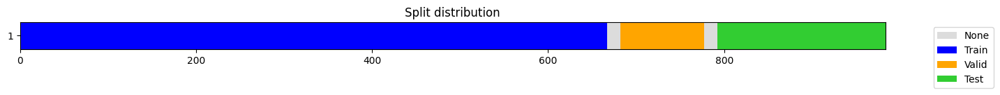

[W 2024-11-05 01:15:53,344] Trial 900 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:53,345] Trial 900 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


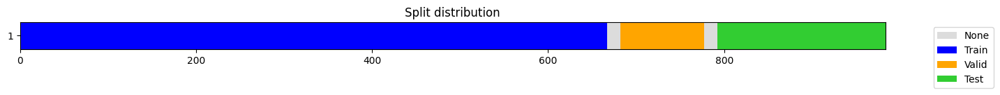

[W 2024-11-05 01:15:53,730] Trial 901 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:53,731] Trial 901 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


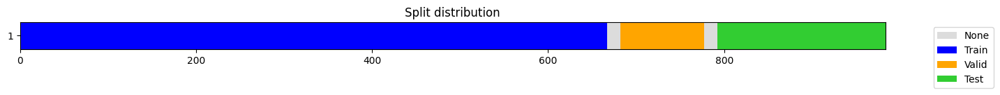

[W 2024-11-05 01:15:54,174] Trial 902 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:54,175] Trial 902 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


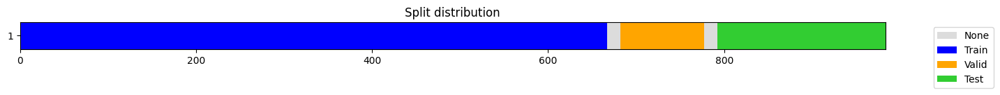

[W 2024-11-05 01:15:54,529] Trial 903 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.30000000000000004, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:54,529] Trial 903 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


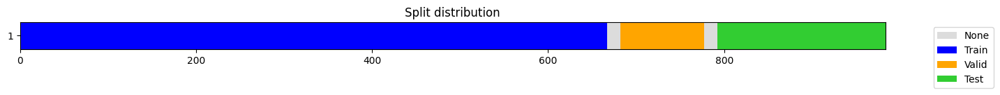

[W 2024-11-05 01:15:54,904] Trial 904 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 168, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:54,905] Trial 904 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


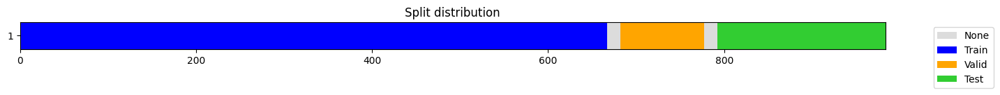

[W 2024-11-05 01:15:55,283] Trial 905 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:55,284] Trial 905 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


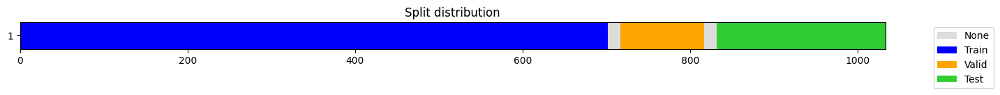

[W 2024-11-05 01:15:55,637] Trial 906 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:55,637] Trial 906 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


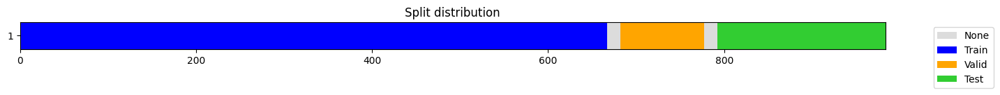

[W 2024-11-05 01:15:55,998] Trial 907 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:55,999] Trial 907 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


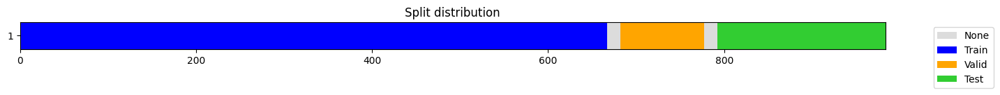

[W 2024-11-05 01:15:56,364] Trial 908 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:56,364] Trial 908 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


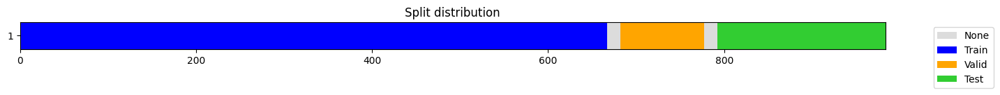

[W 2024-11-05 01:15:56,731] Trial 909 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 9, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:56,732] Trial 909 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


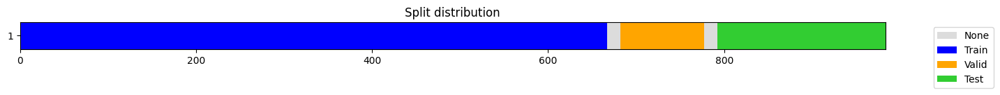

[W 2024-11-05 01:15:57,114] Trial 910 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:57,115] Trial 910 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


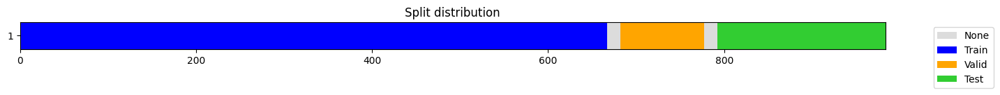

[W 2024-11-05 01:15:57,477] Trial 911 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:57,478] Trial 911 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


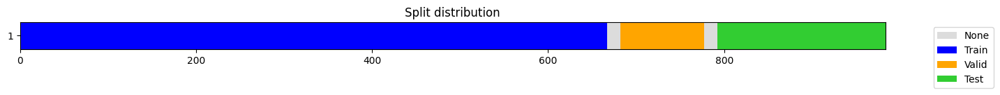

[W 2024-11-05 01:15:57,872] Trial 912 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:57,873] Trial 912 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


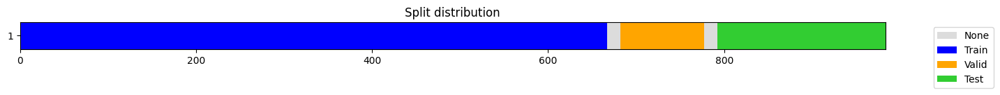

[W 2024-11-05 01:15:58,263] Trial 913 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:58,263] Trial 913 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


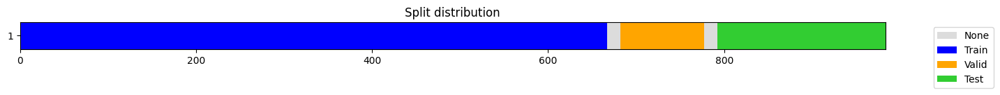

[W 2024-11-05 01:15:58,649] Trial 914 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:58,649] Trial 914 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


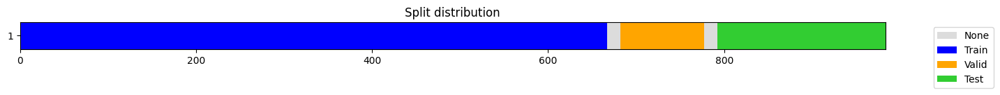

[W 2024-11-05 01:15:59,069] Trial 915 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:59,069] Trial 915 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


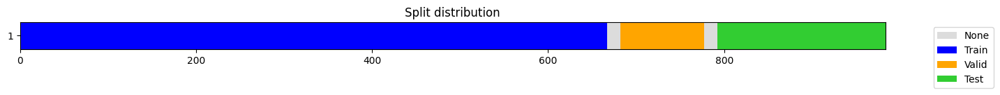

[W 2024-11-05 01:15:59,445] Trial 916 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 168, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:59,446] Trial 916 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


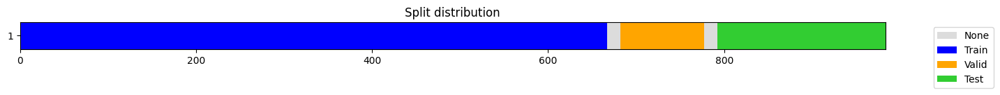

[W 2024-11-05 01:15:59,816] Trial 917 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 48, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:15:59,817] Trial 917 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


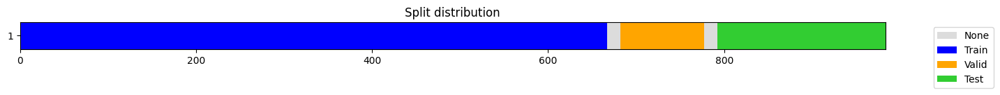

[W 2024-11-05 01:16:00,176] Trial 918 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:00,177] Trial 918 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


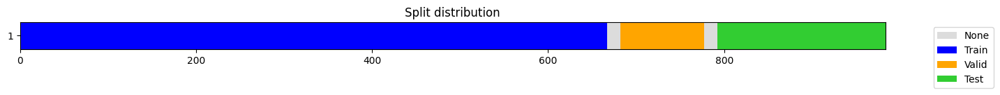

[W 2024-11-05 01:16:00,568] Trial 919 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:00,568] Trial 919 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


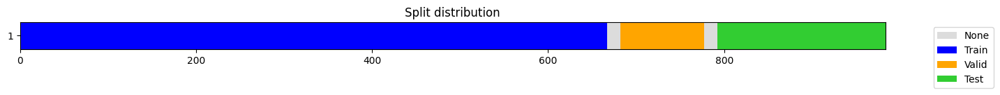

[W 2024-11-05 01:16:00,924] Trial 920 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:00,924] Trial 920 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


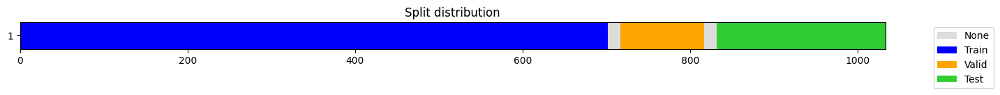

[W 2024-11-05 01:16:01,277] Trial 921 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:01,278] Trial 921 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


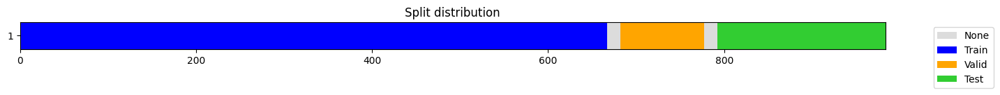

[W 2024-11-05 01:16:01,634] Trial 922 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:01,635] Trial 922 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


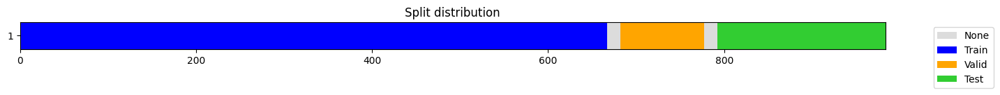

[W 2024-11-05 01:16:02,001] Trial 923 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:02,002] Trial 923 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


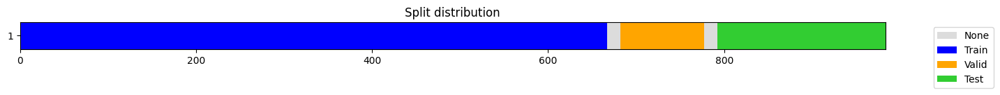

[W 2024-11-05 01:16:02,363] Trial 924 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:02,364] Trial 924 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


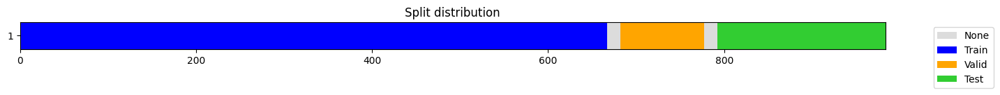

[W 2024-11-05 01:16:02,736] Trial 925 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:02,737] Trial 925 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


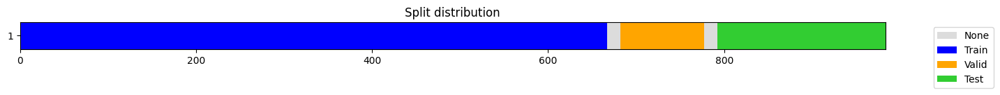

[W 2024-11-05 01:16:03,110] Trial 926 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:03,111] Trial 926 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


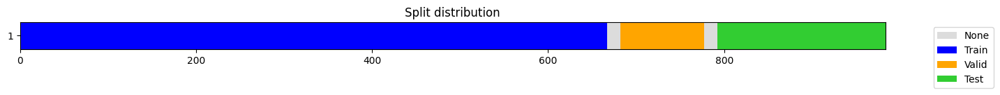

[W 2024-11-05 01:16:03,471] Trial 927 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:03,471] Trial 927 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


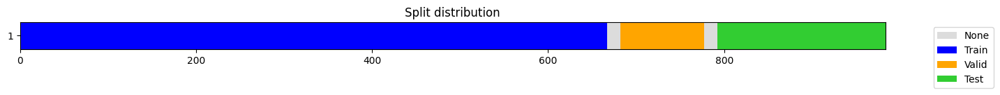

[W 2024-11-05 01:16:03,832] Trial 928 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:03,833] Trial 928 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


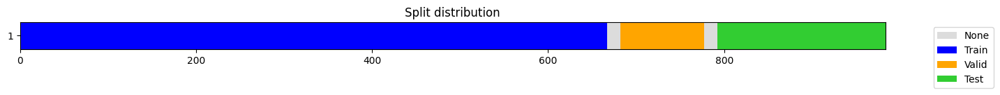

[W 2024-11-05 01:16:04,201] Trial 929 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:04,201] Trial 929 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


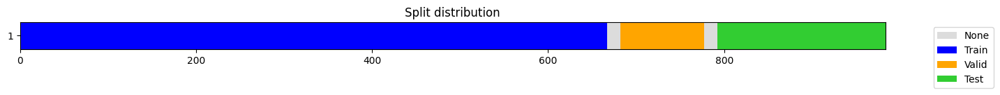

[W 2024-11-05 01:16:04,571] Trial 930 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:04,572] Trial 930 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


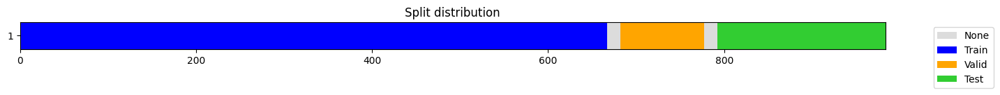

[W 2024-11-05 01:16:04,943] Trial 931 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:04,943] Trial 931 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


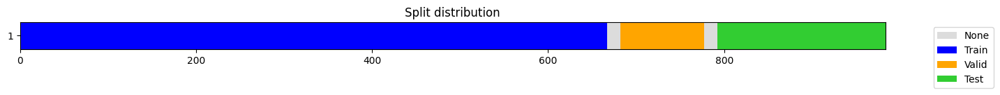

[W 2024-11-05 01:16:05,313] Trial 932 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:05,313] Trial 932 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


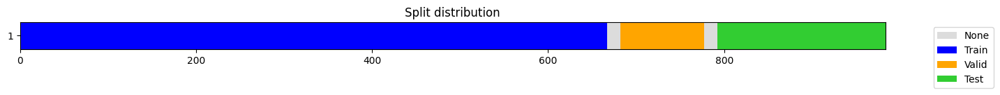

[W 2024-11-05 01:16:05,687] Trial 933 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:05,688] Trial 933 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


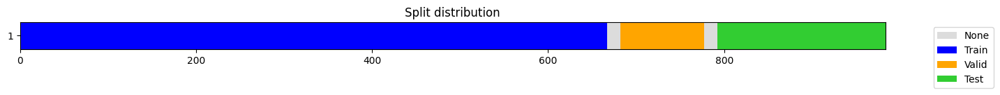

[W 2024-11-05 01:16:06,066] Trial 934 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:06,066] Trial 934 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


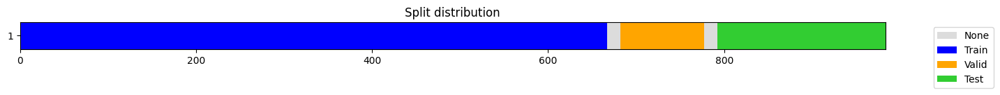

[W 2024-11-05 01:16:06,423] Trial 935 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:06,423] Trial 935 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


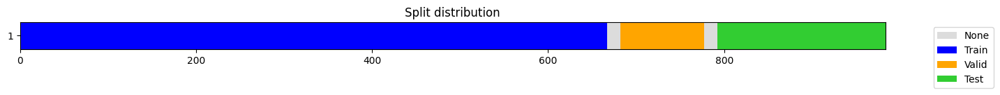

[W 2024-11-05 01:16:06,780] Trial 936 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:06,781] Trial 936 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


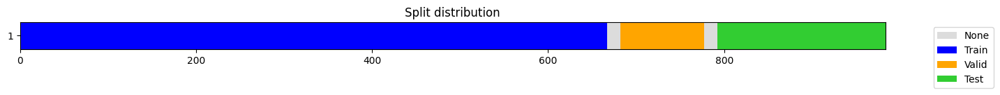

[W 2024-11-05 01:16:07,141] Trial 937 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:07,142] Trial 937 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


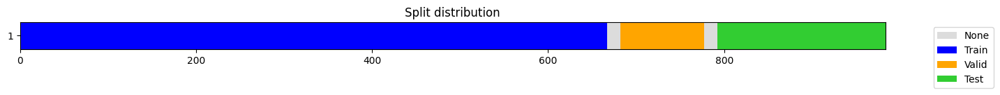

[W 2024-11-05 01:16:07,548] Trial 938 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:07,548] Trial 938 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


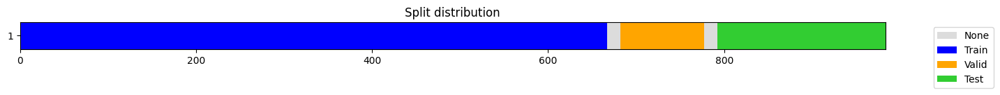

[W 2024-11-05 01:16:07,949] Trial 939 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:07,950] Trial 939 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


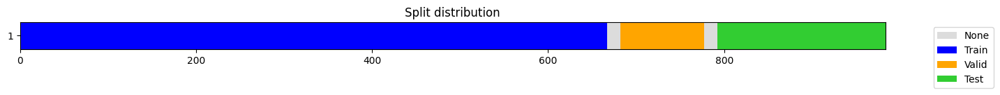

[W 2024-11-05 01:16:08,317] Trial 940 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 168, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:08,318] Trial 940 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


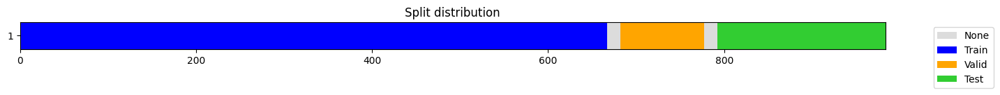

[W 2024-11-05 01:16:08,688] Trial 941 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:08,689] Trial 941 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


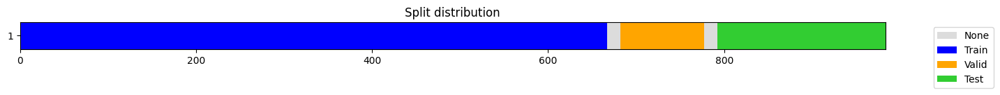

[W 2024-11-05 01:16:09,060] Trial 942 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:09,060] Trial 942 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


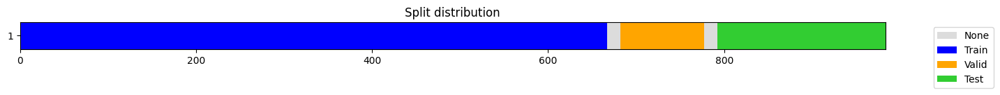

[W 2024-11-05 01:16:09,443] Trial 943 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:09,444] Trial 943 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


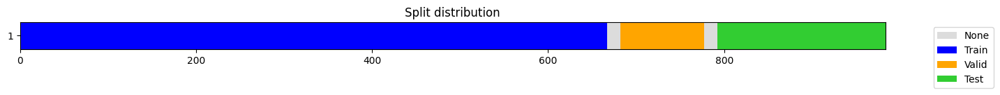

[W 2024-11-05 01:16:09,906] Trial 944 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:09,907] Trial 944 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


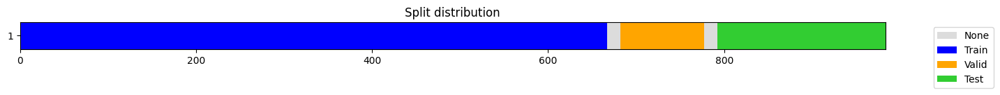

[W 2024-11-05 01:16:10,267] Trial 945 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:10,268] Trial 945 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


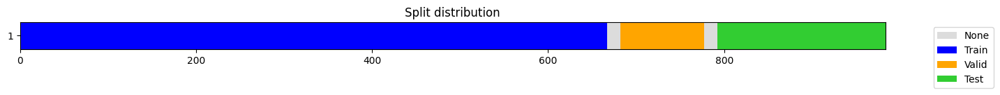

[W 2024-11-05 01:16:10,640] Trial 946 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:10,641] Trial 946 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


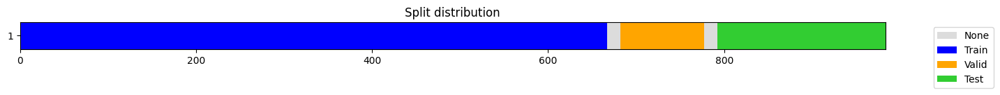

[W 2024-11-05 01:16:10,998] Trial 947 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:10,998] Trial 947 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


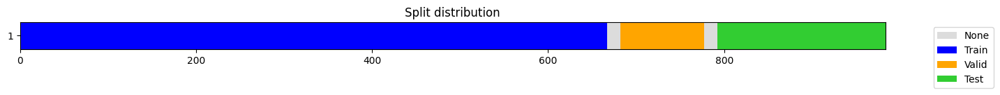

[W 2024-11-05 01:16:11,358] Trial 948 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:11,359] Trial 948 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


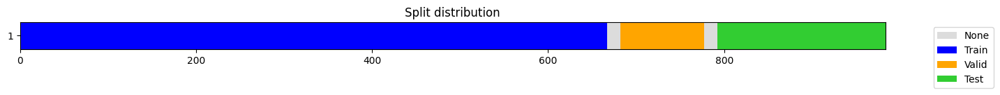

[W 2024-11-05 01:16:11,710] Trial 949 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:11,710] Trial 949 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


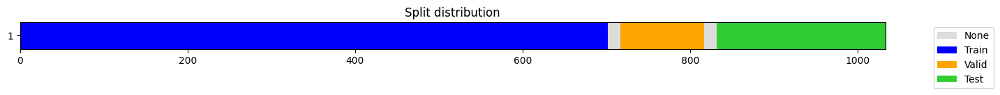

[W 2024-11-05 01:16:12,094] Trial 950 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:12,095] Trial 950 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


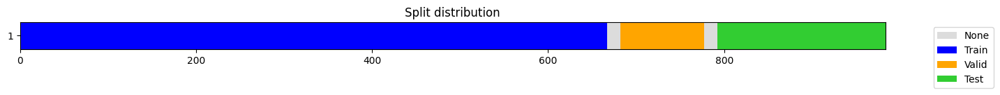

[W 2024-11-05 01:16:12,460] Trial 951 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:12,461] Trial 951 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


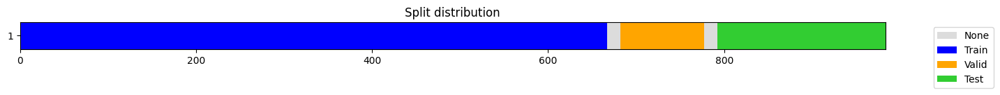

[W 2024-11-05 01:16:12,847] Trial 952 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:12,848] Trial 952 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


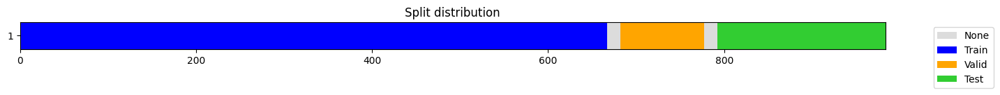

[W 2024-11-05 01:16:13,196] Trial 953 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 128, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:13,197] Trial 953 failed with value None.


Study failed because d_model (128) must be divisible by n_heads (6).


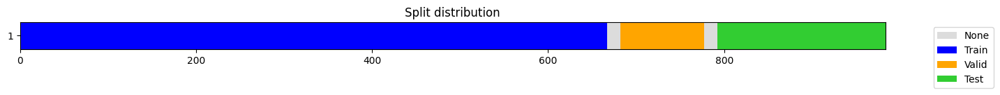

[W 2024-11-05 01:16:13,559] Trial 954 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:13,559] Trial 954 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


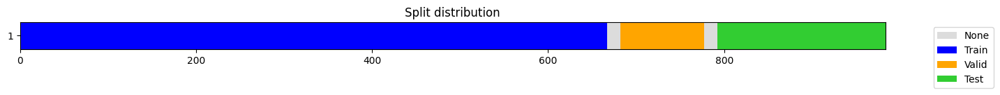

[W 2024-11-05 01:16:13,922] Trial 955 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:13,922] Trial 955 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


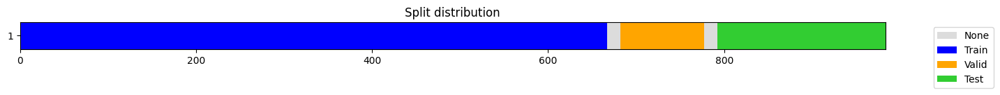

[W 2024-11-05 01:16:14,281] Trial 956 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:14,282] Trial 956 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


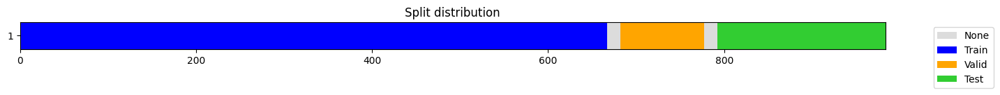

[W 2024-11-05 01:16:14,699] Trial 957 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:14,700] Trial 957 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


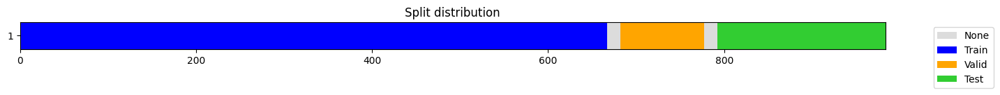

[W 2024-11-05 01:16:15,054] Trial 958 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:15,054] Trial 958 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


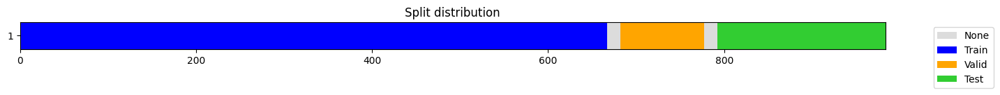

[W 2024-11-05 01:16:15,399] Trial 959 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:15,399] Trial 959 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


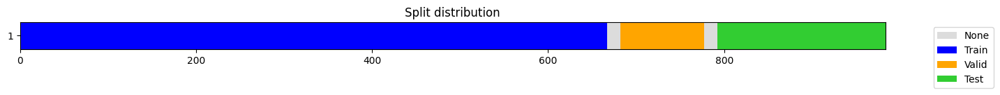

[W 2024-11-05 01:16:15,766] Trial 960 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:15,766] Trial 960 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


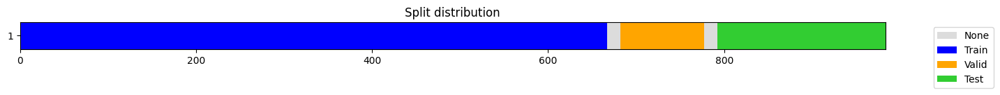

[W 2024-11-05 01:16:16,121] Trial 961 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:16,122] Trial 961 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


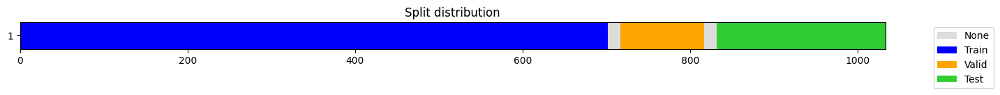

[W 2024-11-05 01:16:16,485] Trial 962 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:16,486] Trial 962 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


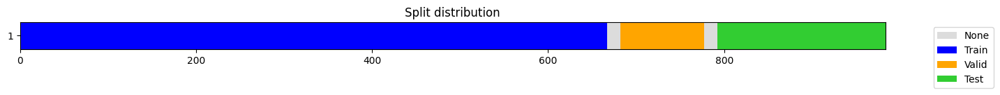

[W 2024-11-05 01:16:16,839] Trial 963 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:16,840] Trial 963 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


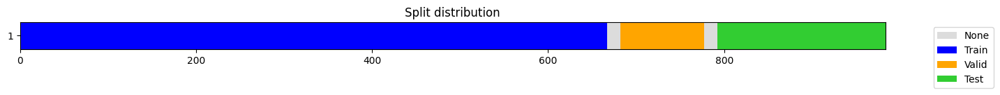

[W 2024-11-05 01:16:17,207] Trial 964 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:17,208] Trial 964 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


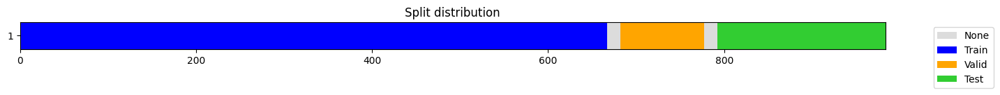

[W 2024-11-05 01:16:17,567] Trial 965 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:17,568] Trial 965 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


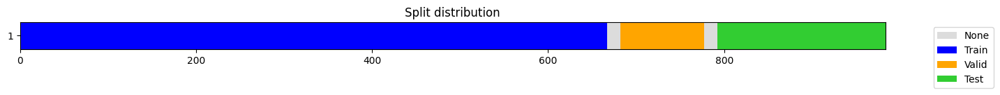

[W 2024-11-05 01:16:17,935] Trial 966 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:17,936] Trial 966 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


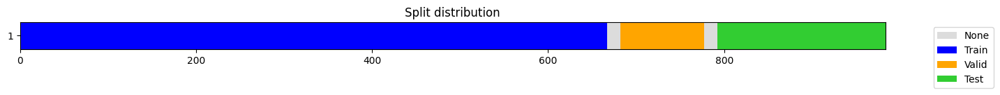

[W 2024-11-05 01:16:18,293] Trial 967 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:18,293] Trial 967 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


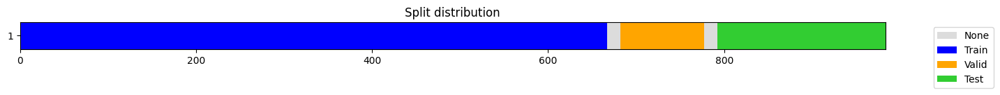

[W 2024-11-05 01:16:18,659] Trial 968 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:18,660] Trial 968 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


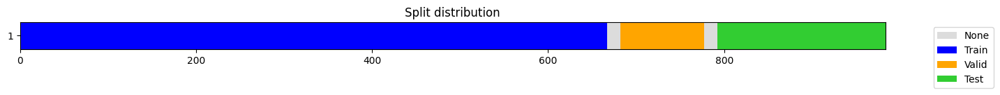

[W 2024-11-05 01:16:19,027] Trial 969 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 200, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:19,027] Trial 969 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


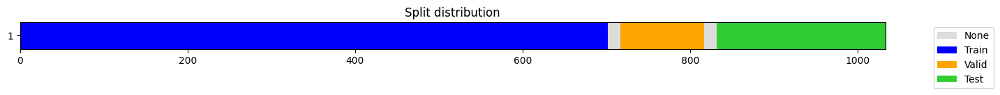

[W 2024-11-05 01:16:19,401] Trial 970 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:19,402] Trial 970 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


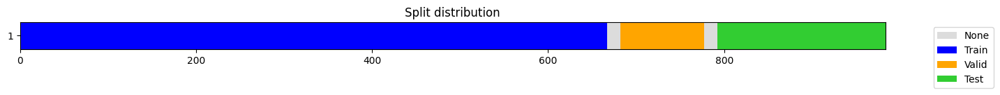

[W 2024-11-05 01:16:19,782] Trial 971 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:19,782] Trial 971 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


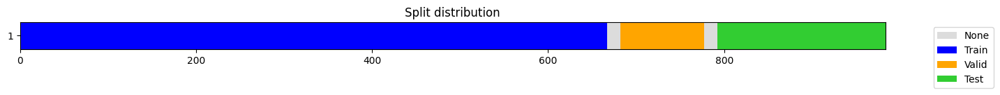

[W 2024-11-05 01:16:20,173] Trial 972 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:20,173] Trial 972 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


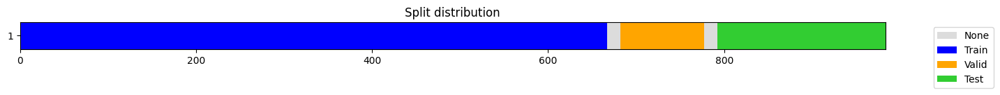

[W 2024-11-05 01:16:20,539] Trial 973 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 48, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:20,539] Trial 973 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


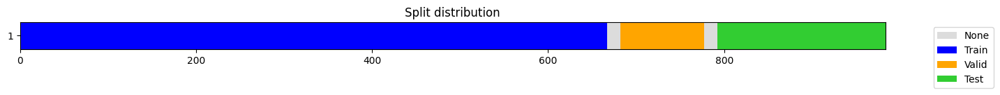

[W 2024-11-05 01:16:20,902] Trial 974 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:20,903] Trial 974 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


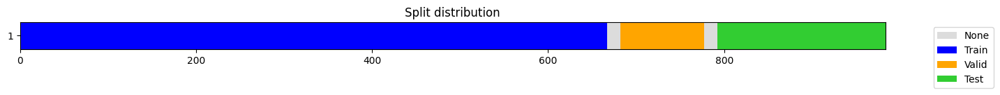

[W 2024-11-05 01:16:21,265] Trial 975 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:21,266] Trial 975 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


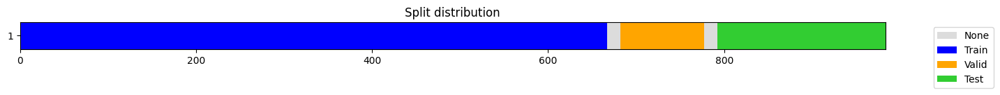

[W 2024-11-05 01:16:21,625] Trial 976 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:21,626] Trial 976 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


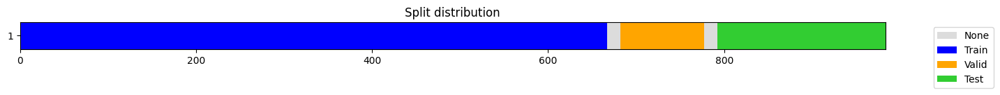

[W 2024-11-05 01:16:21,991] Trial 977 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:21,992] Trial 977 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


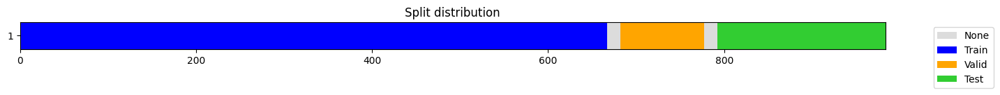

[W 2024-11-05 01:16:22,355] Trial 978 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:22,356] Trial 978 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


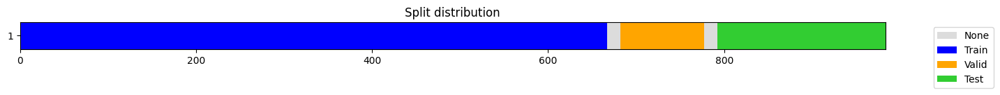

[W 2024-11-05 01:16:22,722] Trial 979 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:22,722] Trial 979 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


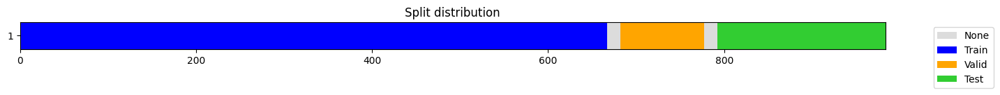

[W 2024-11-05 01:16:23,076] Trial 980 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:23,076] Trial 980 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


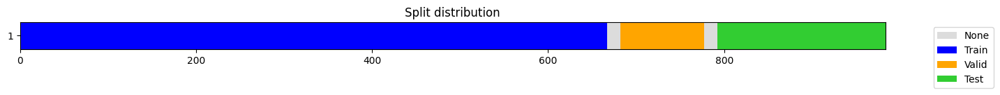

[W 2024-11-05 01:16:23,434] Trial 981 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:23,435] Trial 981 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


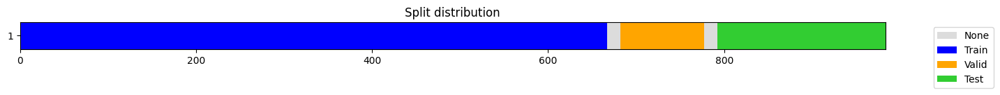

[W 2024-11-05 01:16:23,801] Trial 982 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 3} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:23,802] Trial 982 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


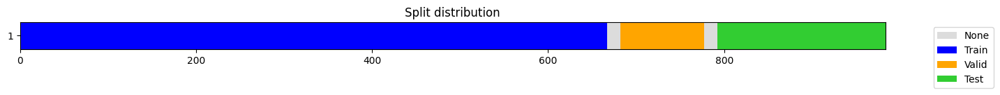

[W 2024-11-05 01:16:24,157] Trial 983 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 3} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:24,157] Trial 983 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


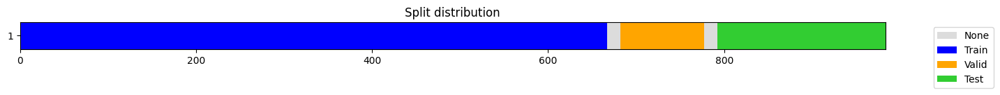

[W 2024-11-05 01:16:24,540] Trial 984 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:24,540] Trial 984 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


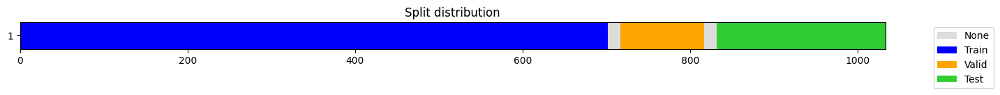

[W 2024-11-05 01:16:24,910] Trial 985 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:24,910] Trial 985 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


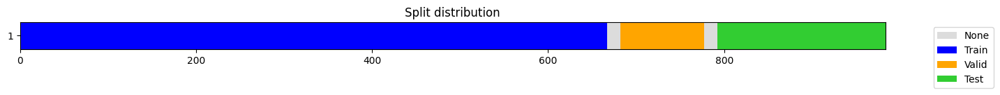

[W 2024-11-05 01:16:25,274] Trial 986 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:25,274] Trial 986 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


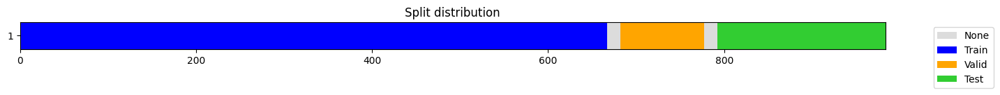

[W 2024-11-05 01:16:25,663] Trial 987 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:25,664] Trial 987 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


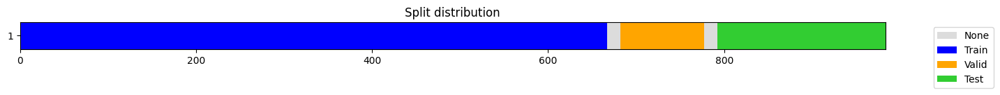

[W 2024-11-05 01:16:26,033] Trial 988 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:26,033] Trial 988 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


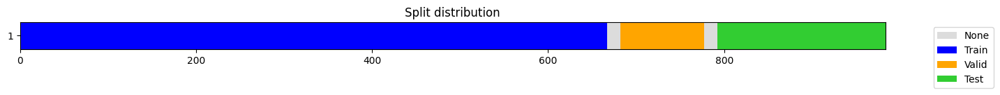

[W 2024-11-05 01:16:26,426] Trial 989 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:26,427] Trial 989 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


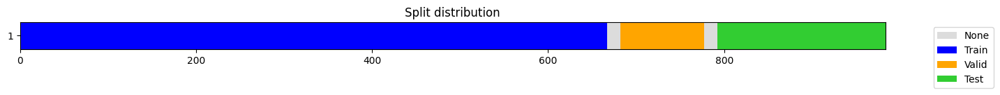

[W 2024-11-05 01:16:26,794] Trial 990 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:26,795] Trial 990 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


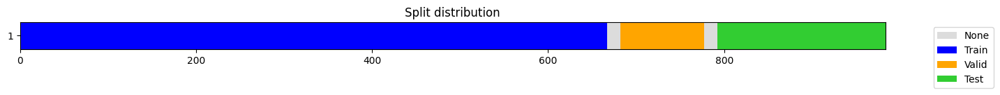

[W 2024-11-05 01:16:27,163] Trial 991 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:27,163] Trial 991 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


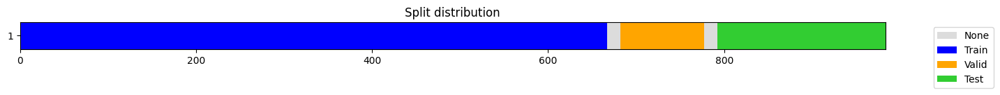

[W 2024-11-05 01:16:27,522] Trial 992 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:27,522] Trial 992 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


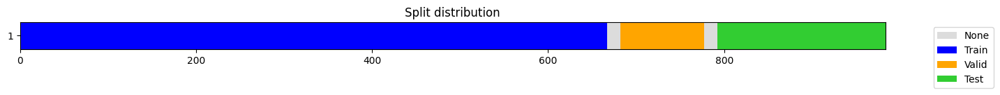

[W 2024-11-05 01:16:27,875] Trial 993 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:27,876] Trial 993 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


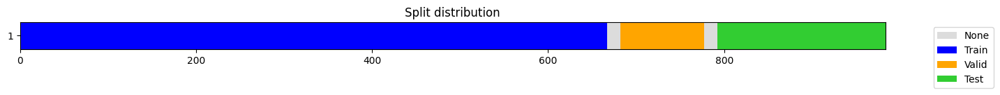

[W 2024-11-05 01:16:28,243] Trial 994 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 200, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:28,244] Trial 994 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


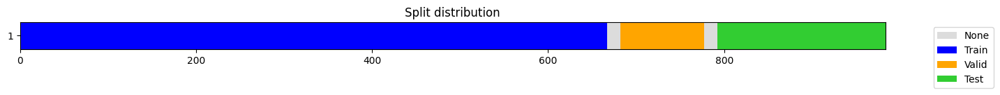

[W 2024-11-05 01:16:28,603] Trial 995 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:28,604] Trial 995 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


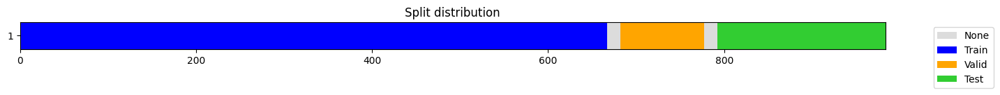

[W 2024-11-05 01:16:28,955] Trial 996 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:28,956] Trial 996 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


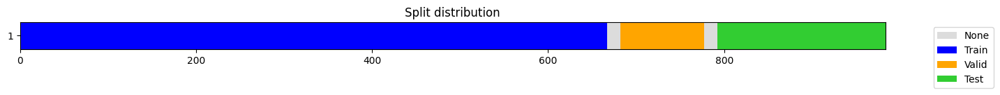

[W 2024-11-05 01:16:29,718] Trial 997 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:29,719] Trial 997 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


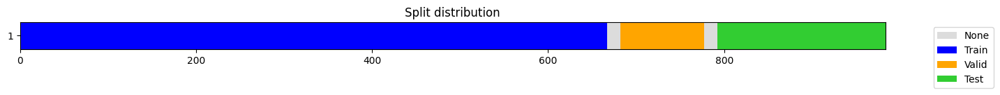

[W 2024-11-05 01:16:30,087] Trial 998 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 3} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:30,087] Trial 998 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


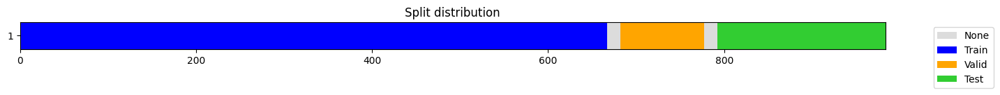

[W 2024-11-05 01:16:30,437] Trial 999 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:30,438] Trial 999 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


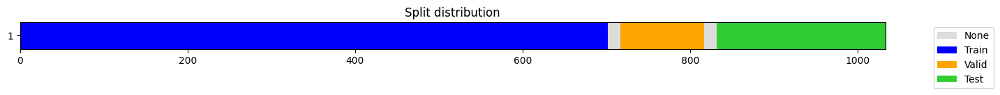

[W 2024-11-05 01:16:30,791] Trial 1000 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:30,791] Trial 1000 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


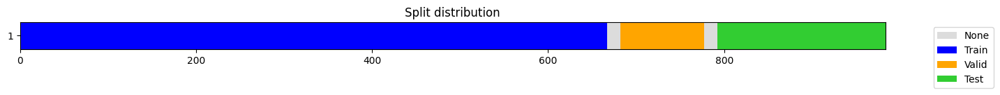

[W 2024-11-05 01:16:31,162] Trial 1001 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:31,162] Trial 1001 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


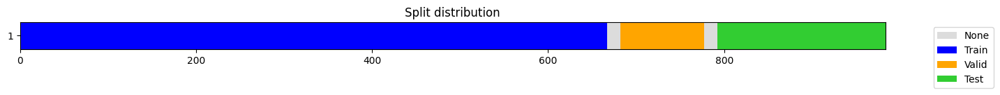

[W 2024-11-05 01:16:31,521] Trial 1002 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:31,521] Trial 1002 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


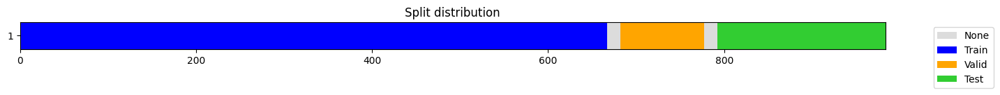

[W 2024-11-05 01:16:31,881] Trial 1003 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:31,882] Trial 1003 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


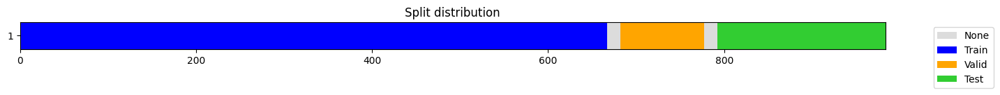

[W 2024-11-05 01:16:32,256] Trial 1004 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:32,256] Trial 1004 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


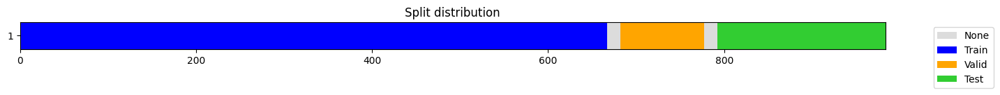

[W 2024-11-05 01:16:32,606] Trial 1005 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:32,606] Trial 1005 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


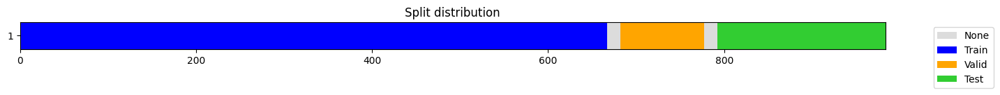

[W 2024-11-05 01:16:32,956] Trial 1006 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:32,956] Trial 1006 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


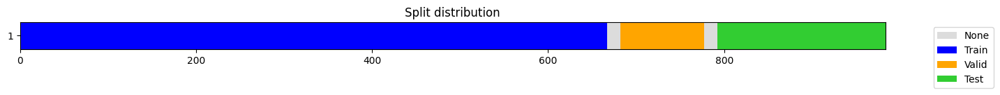

[W 2024-11-05 01:16:33,326] Trial 1007 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:33,327] Trial 1007 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


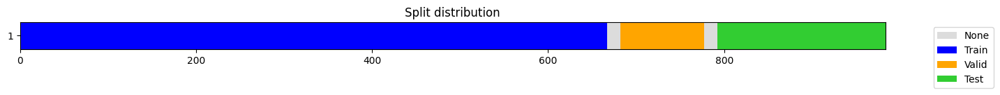

[W 2024-11-05 01:16:33,686] Trial 1008 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:33,687] Trial 1008 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


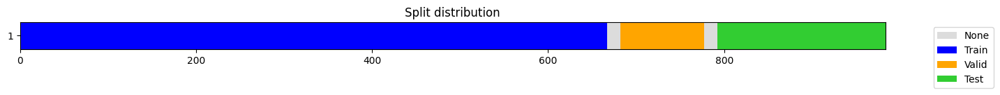

[W 2024-11-05 01:16:34,049] Trial 1009 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:34,049] Trial 1009 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


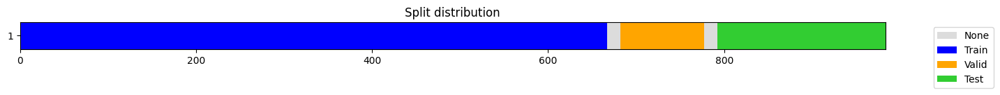

[W 2024-11-05 01:16:34,414] Trial 1010 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 168, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:34,415] Trial 1010 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


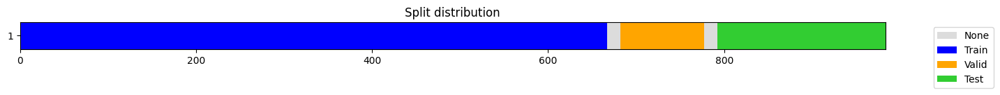

[W 2024-11-05 01:16:34,759] Trial 1011 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:34,759] Trial 1011 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


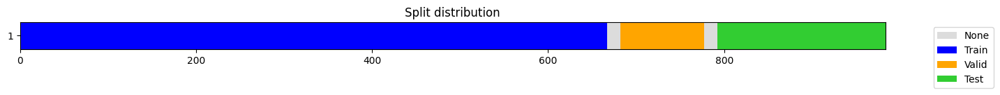

[W 2024-11-05 01:16:35,108] Trial 1012 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 11, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:35,109] Trial 1012 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


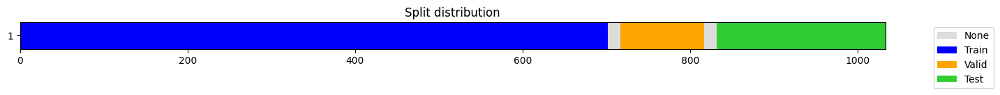

[W 2024-11-05 01:16:35,462] Trial 1013 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:35,463] Trial 1013 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


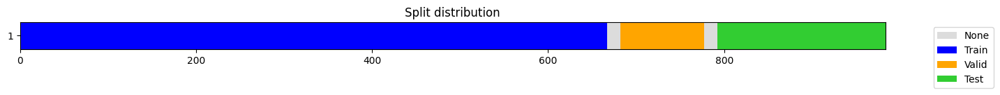

[W 2024-11-05 01:16:35,824] Trial 1014 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:35,824] Trial 1014 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


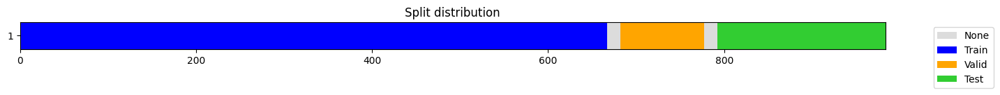

[W 2024-11-05 01:16:36,145] Trial 1015 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:36,145] Trial 1015 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


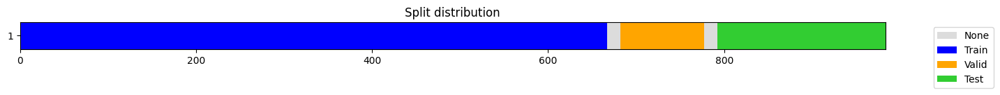

[W 2024-11-05 01:16:36,510] Trial 1016 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:36,511] Trial 1016 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


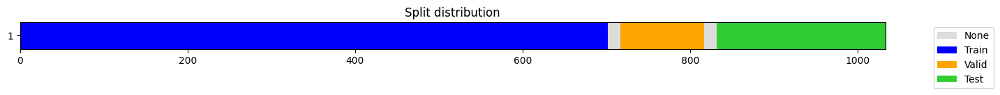

[W 2024-11-05 01:16:36,871] Trial 1017 failed with parameters: {'fcst_history': 350, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:36,872] Trial 1017 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


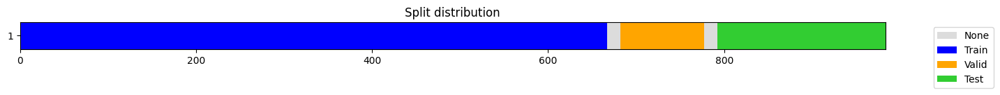

[W 2024-11-05 01:16:37,241] Trial 1018 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:37,241] Trial 1018 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


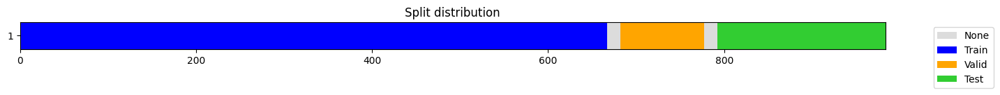

[W 2024-11-05 01:16:37,600] Trial 1019 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:37,600] Trial 1019 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


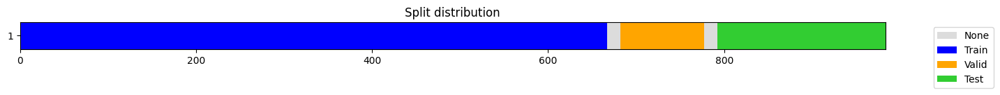

[W 2024-11-05 01:16:37,953] Trial 1020 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:37,954] Trial 1020 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


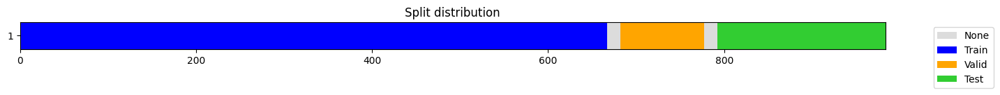

[W 2024-11-05 01:16:38,315] Trial 1021 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:38,315] Trial 1021 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


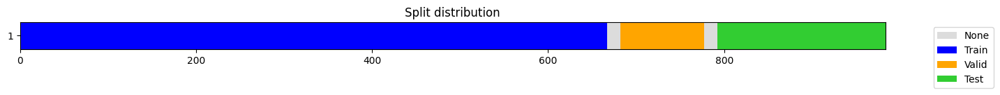

[W 2024-11-05 01:16:38,678] Trial 1022 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 32, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:38,679] Trial 1022 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


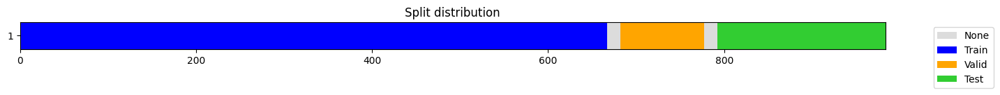

[W 2024-11-05 01:16:39,031] Trial 1023 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:39,032] Trial 1023 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


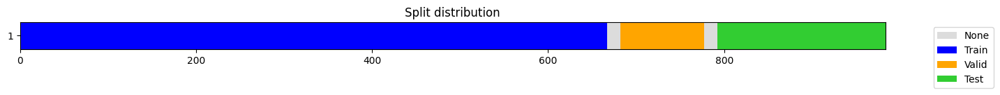

[W 2024-11-05 01:16:39,389] Trial 1024 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 112, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:39,390] Trial 1024 failed with value None.


Study failed because d_model (112) must be divisible by n_heads (6).


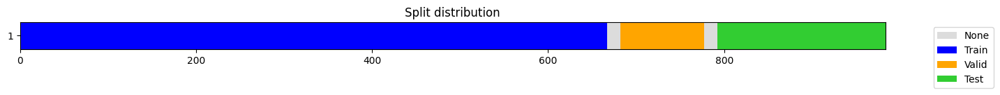

[W 2024-11-05 01:16:39,750] Trial 1025 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:39,750] Trial 1025 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


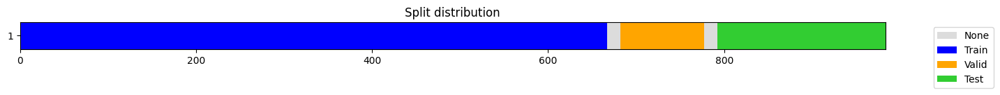

[W 2024-11-05 01:16:40,113] Trial 1026 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:40,114] Trial 1026 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


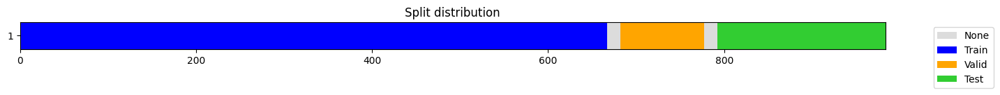

[W 2024-11-05 01:16:40,469] Trial 1027 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 184, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:40,469] Trial 1027 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


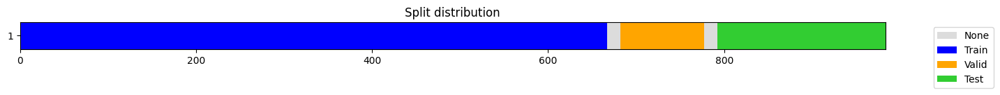

[W 2024-11-05 01:16:40,821] Trial 1028 failed with parameters: {'fcst_history': 400, 'fcst_horizon': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 6, 'n_heads': 6, 'd_model': 104, 'd_ff': 176, 'attn_dropout': 0.4, 'dropout': 0.30000000000000004, 'patch_len': 11, 'stride': 5} because of the following error: The value None could not be cast to float..
[W 2024-11-05 01:16:40,821] Trial 1028 failed with value None.


Study failed because d_model (104) must be divisible by n_heads (6).


['oil_price_patch.pkl']

In [57]:
study = optuna.create_study(direction="minimize",
                            sampler=optuna.samplers.TPESampler(),
                            study_name='oil_price_patch',
                            storage='sqlite:///oil_price_patch.db', 
                            load_if_exists=True)

study.optimize(objective, n_trials=200)
joblib.dump(study, "oil_price_patch.pkl")

In [54]:
joblib.dump(study, "oil_price_patch.pkl")

['oil_price_patch.pkl']

In [58]:
print("Number of trials:", len(study.trials))
 

Number of trials: 1029


In [59]:
study

In [19]:
study = joblib.load("oil_price_patch.pkl")
print("Best trial until now:")
print(" Value: ", study.best_trial.value)
print(" Params: ")
for key, value in study.best_trial.params.items():
    print(f"    {key}: {value}")

Best trial until now:
 Value:  0.07396565575092504
 Params: 
    fcst_history: 50
    fcst_horizon: 16
    batch_size: 20
    epochs: 14
    n_layers: 4
    n_heads: 2
    d_model: 112
    d_ff: 224
    attn_dropout: 0.2
    dropout: 0.30000000000000004
    patch_len: 11
    stride: 2


In [20]:
HPs = study.best_trial.params

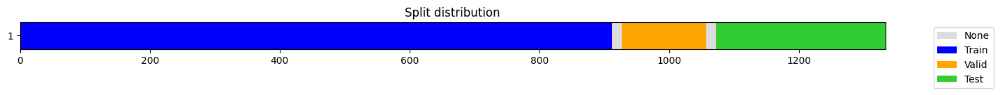

In [44]:
  datetime_col = 'date'
  fcst_history = HPs['fcst_history']
  fcst_horizon = HPs['fcst_horizon']
  valid_size   = 0.1
  test_size    = 0.2

  #getting cross-val splots

  splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                  valid_size=valid_size, test_size=test_size)

  train_data = crude_modeling_df.iloc[splits[0]]
  test_data = crude_modeling_df.iloc[splits[2]]
  val_data = crude_modeling_df.iloc[splits[1]]

  #scaling post cross-validation
  scaler = StandardScaler()
  scaled_crude_modeling_df = crude_modeling_df.copy()
  scaler.fit(train_data[['crude']])
  scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

  #doing the sliding window step

  x_vars = 'crude'
  y_vars = 'crude'

  x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
  x.shape, y.shape

  x_tensor = torch.tensor(x, dtype=torch.float32)
  y_tensor = torch.tensor(y, dtype=torch.float32)




epoch,train_loss,valid_loss,mse,mae,time
0,0.194112,0.074561,0.074561,0.213674,00:01
1,0.147101,0.071642,0.071642,0.205532,00:00
2,0.131227,0.075562,0.075562,0.211384,00:01
3,0.121249,0.075693,0.075693,0.210253,00:01
4,0.112729,0.079401,0.079401,0.214845,00:00
5,0.107820,0.086800,0.086800,0.229155,00:01
6,0.102105,0.080966,0.080966,0.218564,00:01
7,0.096941,0.071002,0.071002,0.205819,00:01
8,0.095149,0.069960,0.069960,0.203216,00:01
9,0.090040,0.073402,0.073402,0.206431,00:01


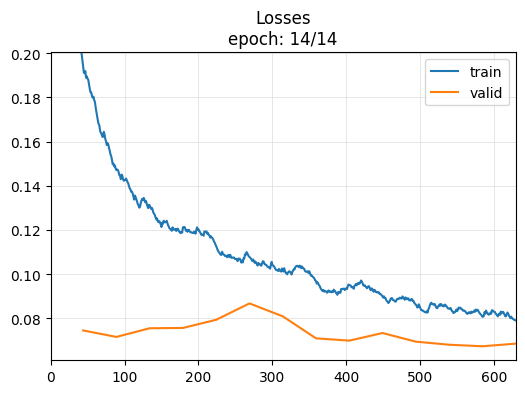

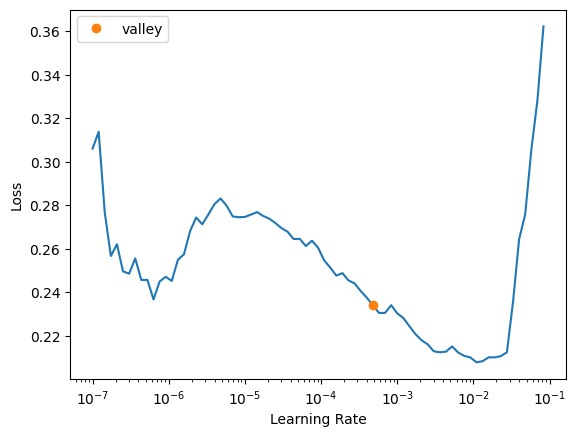

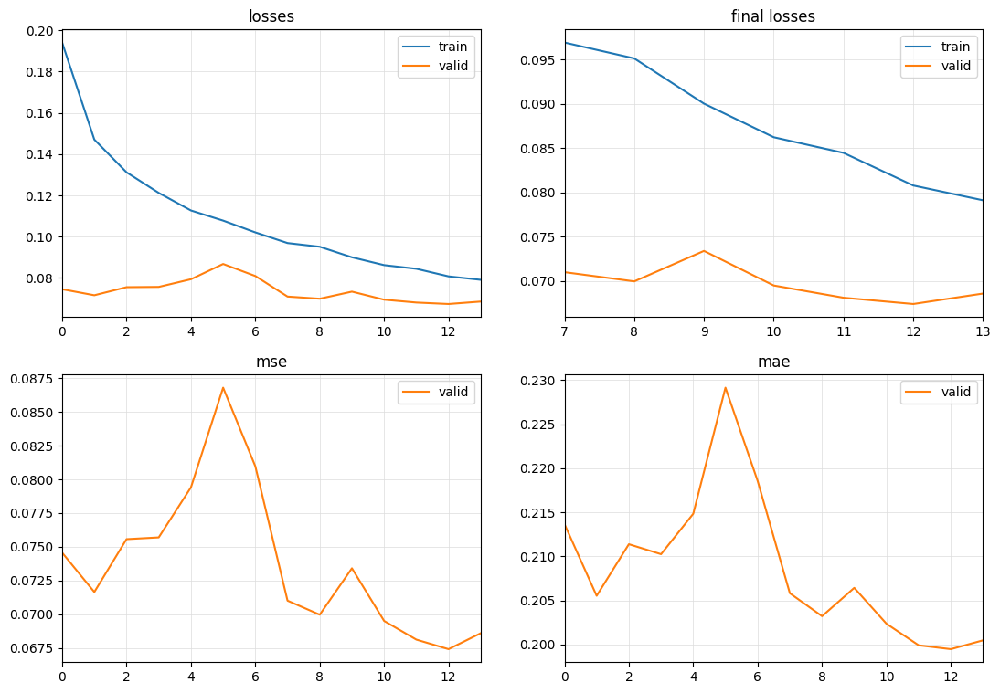

In [45]:
   

    arch_config = dict(
    n_layers= HPs['n_layers'],  # number of encoder layers
    n_heads = HPs['n_heads'],  # number of heads
    d_model= HPs['d_model'],  # dimension of model
    d_ff= HPs['d_ff'],  # dimension of fully connected network
    attn_dropout= HPs['attn_dropout'], # dropout applied to the attention weights
    dropout= HPs['dropout'], # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len= HPs['patch_len'],  # length of the patch applied to the time series to create patches
    stride= HPs['stride'],  # stride used when creating patches
    padding_patch= True,  # padding_patch
    #batch_size = HPs['batch_size']         
    )

    #modelling
    learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size = HPs['batch_size'],
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae], cbs=ShowGraph())

    lr_max = learn.lr_find().valley
    learn.fit_one_cycle(HPs['epochs'], lr_max =lr_max)
    learn.export('patchTST.pt')

    #validation set inference
  



In [46]:
learn = load_learner('patchTST.pt')
scaled_preds, *_ = learn.get_X_preds(x[splits[1]])
scaled_preds = to_np(scaled_preds)
print(f"scaled_preds.shape: {scaled_preds.shape}")

scaled_y_true = y[splits[1]]
loss = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true.flatten(), scaled_preds.flatten())

results_df

scaled_preds.shape: (130, 1, 16)


,mse,mae
valid,0.068585,0.200477


In [47]:
learn = load_learner('patchTST.pt')
y_test_preds, *_ = learn.get_X_preds(x[splits[2]])
y_test_preds = to_np(y_test_preds)
print(f"y_test_preds.shape: {y_test_preds.shape}")

y_test = y[splits[2]]
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["test", "mse"] = mean_squared_error(y_test.flatten(), y_test_preds.flatten())
results_df.loc["test", "mae"] = mean_absolute_error(y_test.flatten(), y_test_preds.flatten())
results_df






y_test_preds.shape: (261, 1, 16)


,mse,mae
test,0.044023,0.170001


In [48]:

x_test = x[splits[2]]
y_test = y[splits[2]]


inverse_scale_y_preds = scaler.inverse_transform(y_test_preds.reshape(-1, 1)).flatten().reshape(261, 1, 16)
inverse_scale_y_true = (scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()).reshape(261, 1, 16)
inverse_scale_x_test = scaler.inverse_transform(x_test.reshape(-1, 1)).flatten().reshape(261, 1, 50)

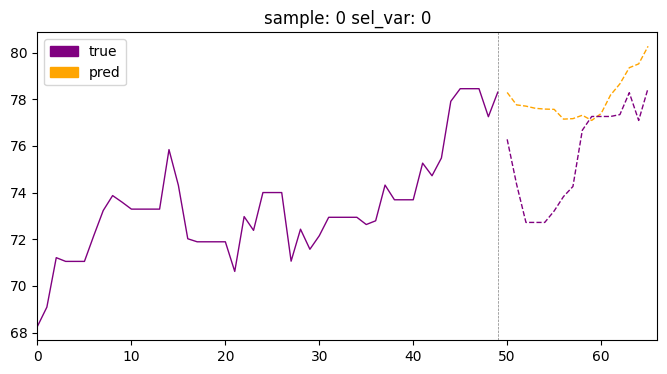

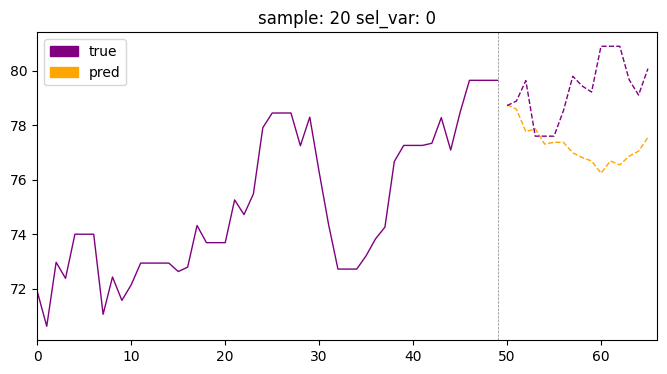

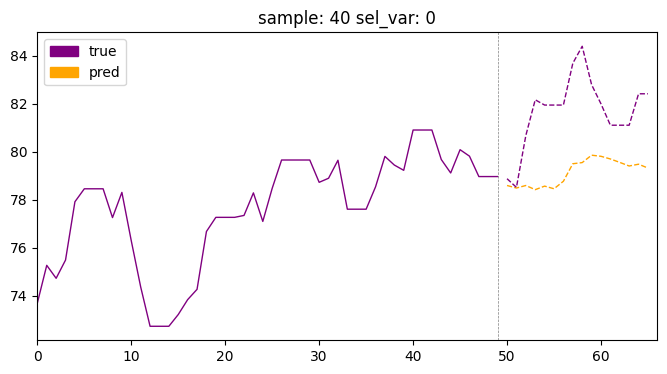

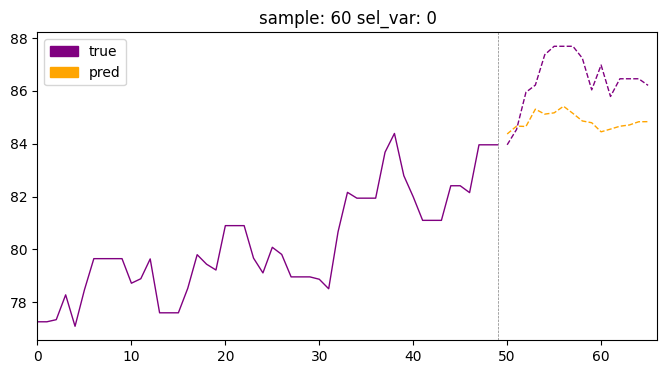

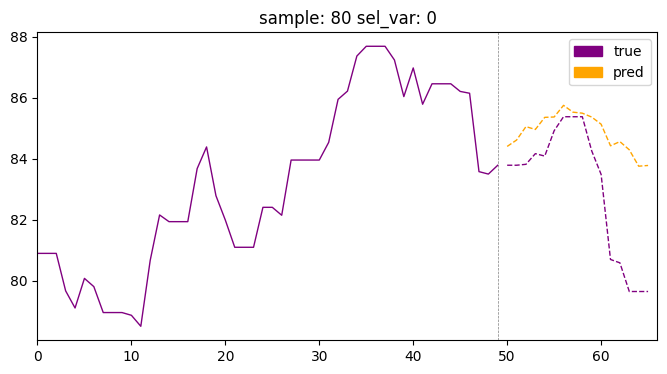

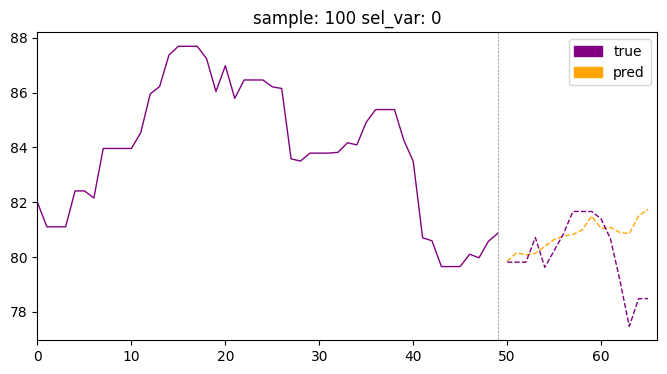

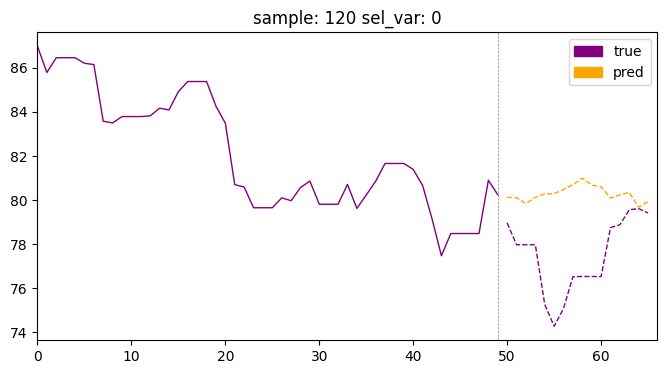

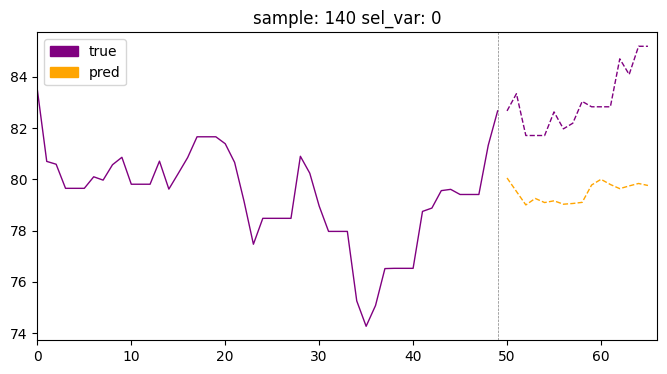

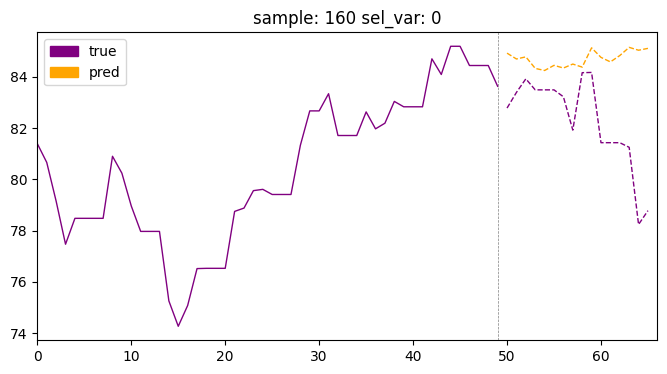

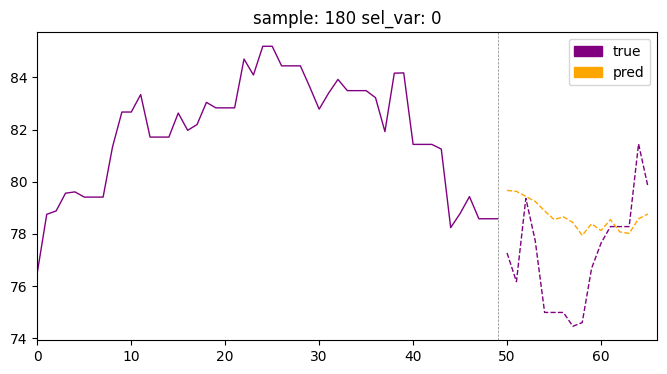

In [49]:
for id in range (0,200, 20):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


In [50]:
x_test = torch.tensor(x_test)
y_test = torch.tensor(y_test)
y_test_preds = torch.tensor(y_test_preds)



y_preds_one = y_test_preds[:, 0, 0]
y_true_one = y_test[:, 0, 0]

y_preds_last = y_test_preds[-1, 0, 1:]
y_true_last = y_test[-1, 0, 1:]

y_preds_appended = torch.cat((y_preds_one, y_preds_last))
y_true_appended = torch.cat((y_true_one, y_true_last))

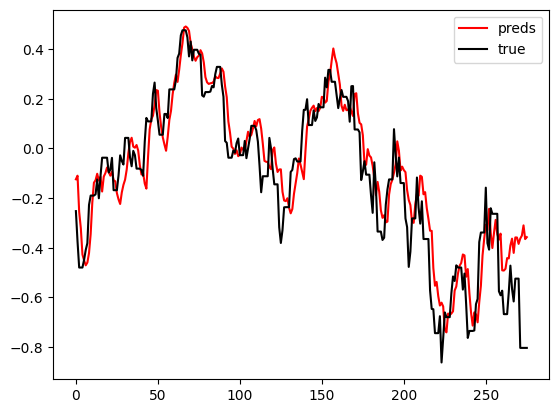

In [51]:
plt.plot(y_preds_appended, c = 'r', label = 'preds')
plt.plot(y_true_appended, c = 'k', label = 'true')
plt.legend()

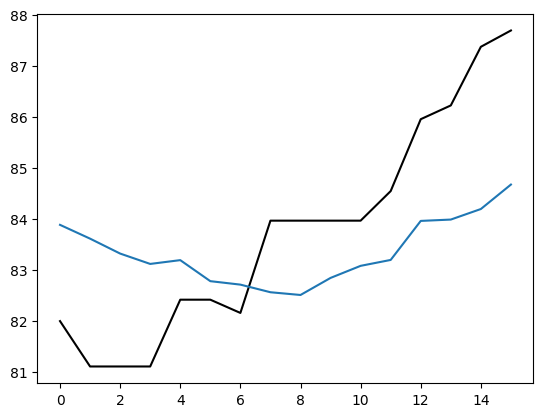

In [57]:
plt.plot(inverse_scale_y_true[50, 0, :], c = 'k')
plt.plot(inverse_scale_y_preds[50, 0, :])

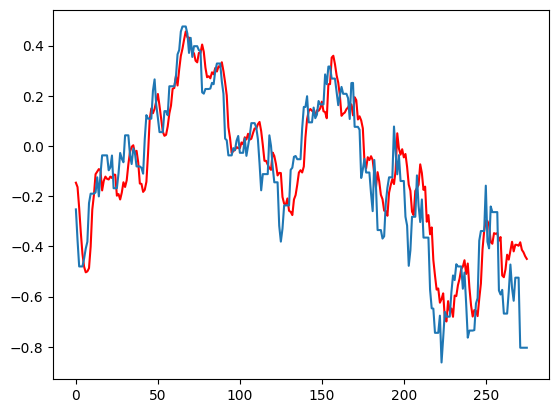

In [43]:
y_preds_tensor = torch.tensor(y_test_preds)


y_test = y[splits[2]]
y_test_tensor = torch.tensor(y_test)

append_preds = y_preds_tensor[-1, 0, 1:]
append_preds

append_true = y_test_tensor[-1, 0, 1:]


first_preds = y_preds_tensor[:, 0, 0]

first_true = y_test_tensor[:, 0, 0]

first_preds_with_final = torch.cat((first_preds, append_preds))

first_true_with_final = torch.cat((first_true, append_true))

plt.plot(first_preds_with_final, c = 'r')
plt.plot(first_true_with_final)

# Optuna Large

## Tuning

In [12]:
import optuna

def objective(trial):
    # Suggest hyperparameters
    fcst_history = trial.suggest_int("fcst_history", 16, 128, step=16)
    n_heads = trial.suggest_int("n_heads", 1, 4, step=1)
    d_model = trial.suggest_int("d_model", 16, 128, step=8)
    patch_len = trial.suggest_int("patch_len", 0, fcst_history, step=16)
    
    # Prune trial if d_model is not divisible by n_heads
    if d_model % n_heads != 0:
        print(f"Pruning trial: d_model ({d_model}) is not divisible by n_heads ({n_heads})")
        raise optuna.exceptions.TrialPruned()
    
    # Prune trial if patch_len is greater than fcst_history
    if patch_len > fcst_history:
        print(f"Pruning trial: patch_len ({patch_len}) is greater than fcst_history ({fcst_history})")
        raise optuna.exceptions.TrialPruned()

    if patch_len == 0:
        print(f"Pruning trial: patch_len ({patch_len}) is greater than fcst_history ({fcst_history})")
        raise optuna.exceptions.TrialPruned()

    # Define other hyperparameters
    HPs = {
        'fcst_history': fcst_history,
        'batch_size': trial.suggest_int("batch_size", 8, 128, step=8),
        'epochs': trial.suggest_int("epochs", 5, 20, step=5),
        'n_layers': trial.suggest_int("n_layers", 1, 4, step=1),
        'n_heads': n_heads,
        'd_model': d_model,
        'd_ff': trial.suggest_int("d_ff", 16, 256, step=8),
        'attn_dropout': trial.suggest_float("attn_dropout", 0, 0.5, step=0.1),
        'dropout': trial.suggest_float("dropout", 0, 0.5, step=0.1),
        'stride': trial.suggest_int("stride", 1, 5, step=1),
        'patch_len': patch_len
    }

    # Your evaluation logic here
    try:
        loss = train_model(HPs)  # Replace with your training logic
        return loss
    except Exception as e:
        print(f"Trial failed: {e}")
        return None


In [13]:
def data_preparation(HPs):



  #setting basic params
  datetime_col = 'Date'
  fcst_history = HPs['fcst_history']
  fcst_horizon = 96
  valid_size   = 0.1
  test_size    = 0.2

  #getting cross-val splots

  splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                  valid_size=valid_size, test_size=test_size)

  train_data = crude_modeling_df.iloc[splits[0]]
  test_data = crude_modeling_df.iloc[splits[2]]
  val_data = crude_modeling_df.iloc[splits[1]]

  #scaling post cross-validation
  scaler = StandardScaler()
  scaled_crude_modeling_df = crude_modeling_df.copy()
  scaler.fit(train_data[['crude']])
  scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

  #doing the sliding window step

  x_vars = 'crude'
  y_vars = 'crude'

  x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
  x.shape, y.shape

  x_tensor = torch.tensor(x, dtype=torch.float32)
  y_tensor = torch.tensor(y, dtype=torch.float32)

  return splits, x_tensor, y_tensor, x, y









In [14]:
def train_model(HPs):

    splits, x_tensor, y_tensor, x, y = data_preparation(HPs)

    arch_config = dict(
    n_layers= HPs['n_layers'],  # number of encoder layers
    n_heads = HPs['n_heads'],  # number of heads
    d_model= HPs['d_model'],  # dimension of model
    d_ff= HPs['d_ff'],  # dimension of fully connected network
    attn_dropout= HPs['attn_dropout'], # dropout applied to the attention weights
    dropout= HPs['dropout'], # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len= HPs['patch_len'],  # length of the patch applied to the time series to create patches
    stride= HPs['stride'],  # stride used when creating patches
    padding_patch= True,  # padding_patch
    #batch_size = HPs['batch_size']         
    )

    #modelling
    learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size = HPs['batch_size'],
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae])

    lr_max = learn.lr_find().valley
    learn.fit_one_cycle(HPs['epochs'], lr_max =lr_max)
    learn.export('patchTST.pt')

    #validation set inference
    learn = load_learner('patchTST.pt')
    scaled_preds, *_ = learn.get_X_preds(x[splits[1]])
    scaled_preds = to_np(scaled_preds)
    print(f"scaled_preds.shape: {scaled_preds.shape}")

    scaled_y_true = y[splits[1]]
    loss = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
    results_df = pd.DataFrame(columns=["mse", "mae"])
    results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
    results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true.flatten(), scaled_preds.flatten())




  





    return loss











In [12]:
# study = optuna.create_study(direction="minimize",
#                             sampler=optuna.samplers.TPESampler(),
#                             study_name='patchtst_large_tune',
#                             storage='sqlite:///patchtst_large_tune.db', 
#                             load_if_exists=True)

# for i in range(50):
#     study.optimize(objective, n_trials=10)
#     joblib.dump(study, "patchtst_large_tune.pkl")

## Best Large Model

In [154]:
study = joblib.load("patchtst_large_tune.pkl")
sorted_trials = sorted(study.trials, key=lambda trial: trial.values[0] if trial.values else float('inf'))
len(sorted_trials)

506

In [155]:
value = sorted_trials[0].value
print(value)
HPs = sorted_trials[0].params
HPs

0.19132562498486202


{'fcst_history': 48,
 'n_heads': 4,
 'd_model': 16,
 'patch_len': 32,
 'batch_size': 104,
 'epochs': 20,
 'n_layers': 1,
 'd_ff': 168,
 'attn_dropout': 0.4,
 'dropout': 0.30000000000000004,
 'stride': 1}

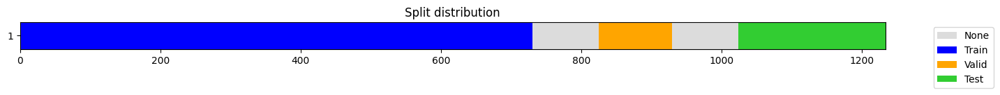

In [156]:
  datetime_col = 'Date'
  fcst_history = HPs['fcst_history']
  fcst_horizon = 96
  valid_size   = 0.1
  test_size    = 0.2

  #getting cross-val splots

  splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                  valid_size=valid_size, test_size=test_size)

  train_data = crude_modeling_df.iloc[splits[0]]
  test_data = crude_modeling_df.iloc[splits[2]]
  val_data = crude_modeling_df.iloc[splits[1]]

  #scaling post cross-validation
  scaler = StandardScaler()
  scaled_crude_modeling_df = crude_modeling_df.copy()
  scaler.fit(train_data[['crude']])
  scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

  #doing the sliding window step

  x_vars = 'crude'
  y_vars = 'crude'

  x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
  x.shape, y.shape

  x_tensor = torch.tensor(x, dtype=torch.float32)
  y_tensor = torch.tensor(y, dtype=torch.float32)




epoch,train_loss,valid_loss,mse,mae,time
0,0.523721,0.367323,0.367323,0.522456,00:00
1,0.501166,0.325067,0.325067,0.479389,00:00
2,0.475760,0.293041,0.293041,0.443719,00:00
3,0.463301,0.282444,0.282444,0.432663,00:00
4,0.453043,0.292461,0.292461,0.451913,00:00
5,0.444600,0.276722,0.276722,0.434943,00:00
6,0.435219,0.276147,0.276147,0.428651,00:00
7,0.428705,0.280168,0.280168,0.433330,00:00
8,0.420742,0.278552,0.278552,0.442160,00:00
9,0.412068,0.257040,0.257040,0.414902,00:00


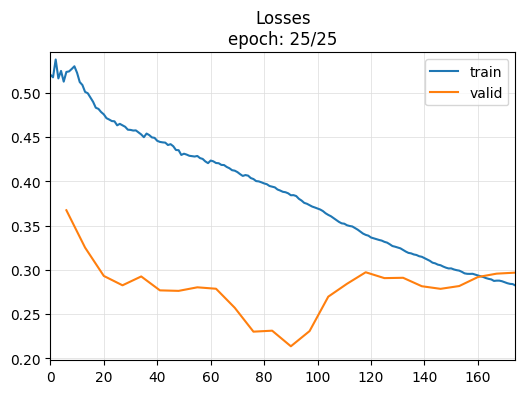

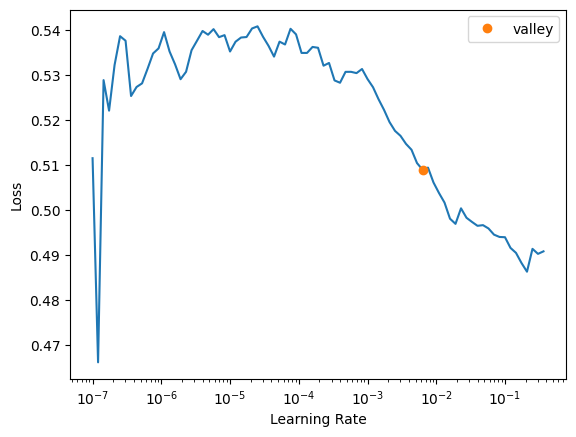

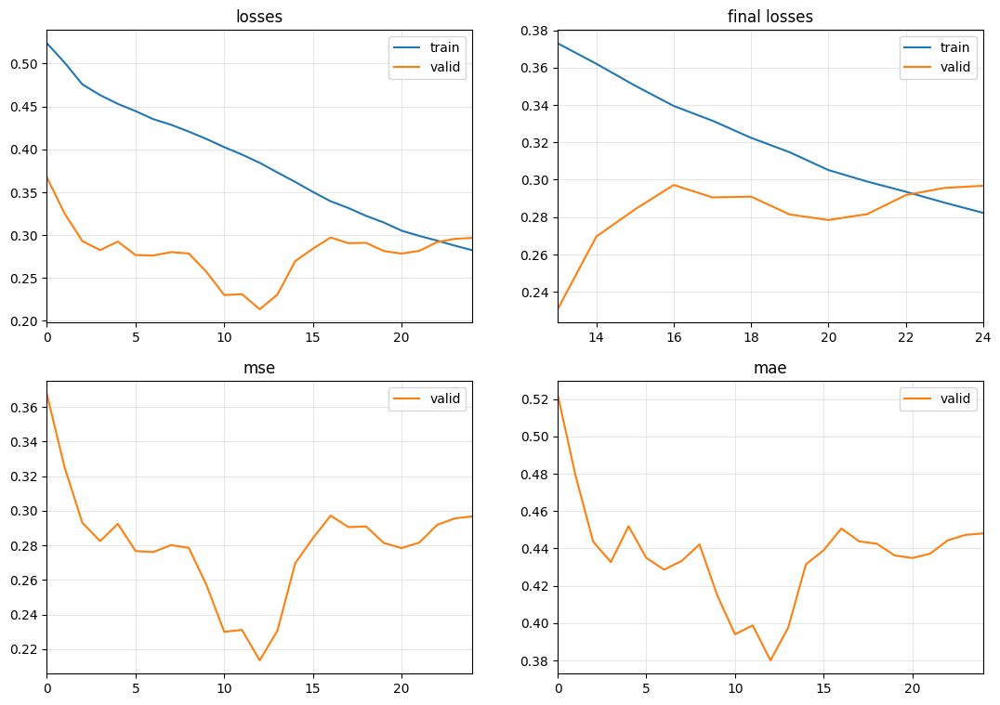

In [157]:
   

    arch_config = dict(
    n_layers= HPs['n_layers'],  # number of encoder layers
    n_heads = HPs['n_heads'],  # number of heads
    d_model= HPs['d_model'],  # dimension of model
    d_ff= HPs['d_ff'],  # dimension of fully connected network
    attn_dropout= HPs['attn_dropout'], # dropout applied to the attention weights
    dropout= HPs['dropout'], # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len= HPs['patch_len'],  # length of the patch applied to the time series to create patches
    stride= HPs['stride'],  # stride used when creating patches
    padding_patch= True,  # padding_patch
    #batch_size = HPs['batch_size']         
    )

    #modelling
    learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size = HPs['batch_size'],
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae], cbs=ShowGraph())

    lr_max = learn.lr_find().valley
    learn.fit_one_cycle(HPs['epochs'] +5, lr_max =lr_max)
    learn.export('patchTST.pt')

    #validation set inference
  



In [158]:
learn = load_learner('patchTST.pt')
scaled_preds_train, *_ = learn.get_X_preds(x[splits[0]])
scaled_preds_train = to_np(scaled_preds_train)
print(f"scaled_preds.shape: {scaled_preds_train.shape}")

scaled_y_train = y[splits[0]]
loss = mean_squared_error(scaled_y_train.flatten(), scaled_preds_train.flatten())
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_train.flatten(), scaled_preds_train.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_train.flatten(), scaled_preds_train.flatten())

results_df

scaled_preds.shape: (730, 1, 96)


,mse,mae
valid,0.215766,0.346788


In [159]:

x_train = x[splits[0]]
y_train = y[splits[0]]


inverse_scale_y_preds = scaler.inverse_transform(scaled_preds_train.reshape(-1, 1)).flatten().reshape(730, 1, 96)
inverse_scale_y_true = (scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()).reshape(730, 1, 96)
inverse_scale_x_test = scaler.inverse_transform(x_train.reshape(-1, 1)).flatten().reshape(730, 1, 48)


results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,mse,mae
valid,63.102115,5.930531


In [160]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,smape
valid,7.026968


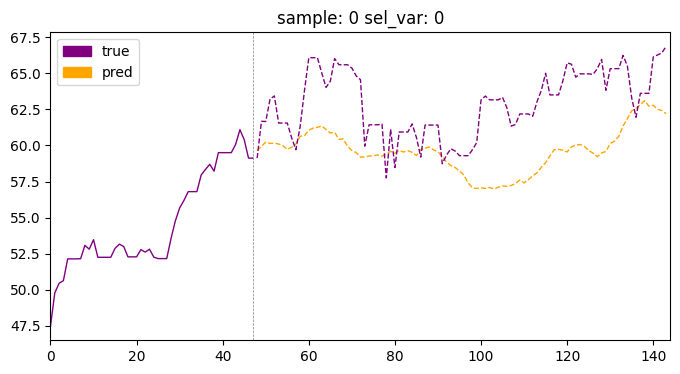

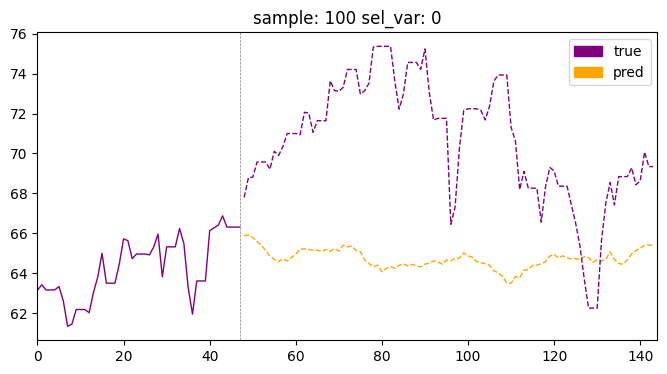

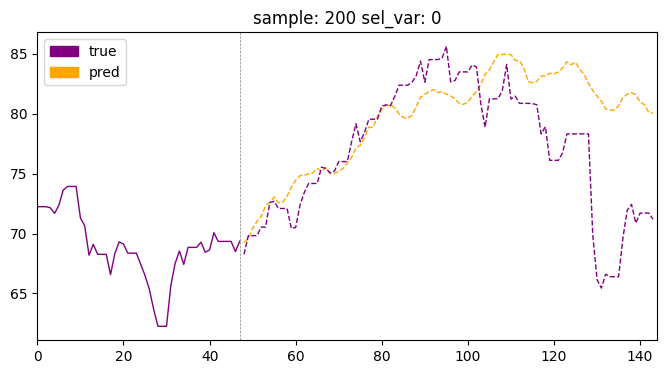

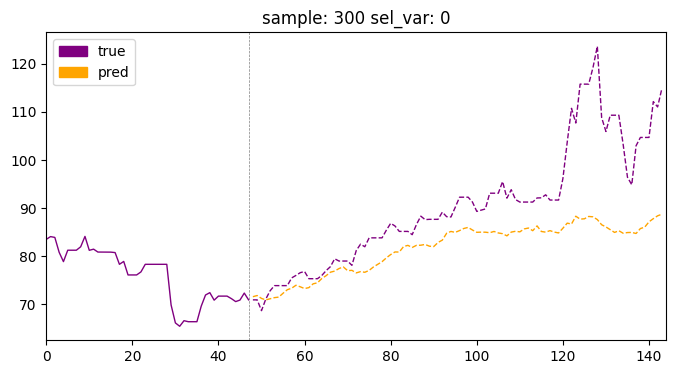

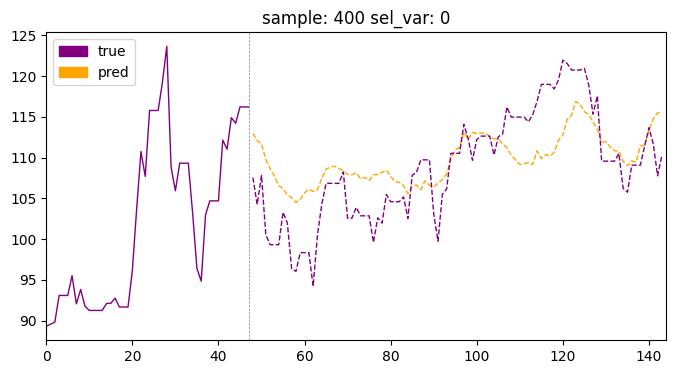

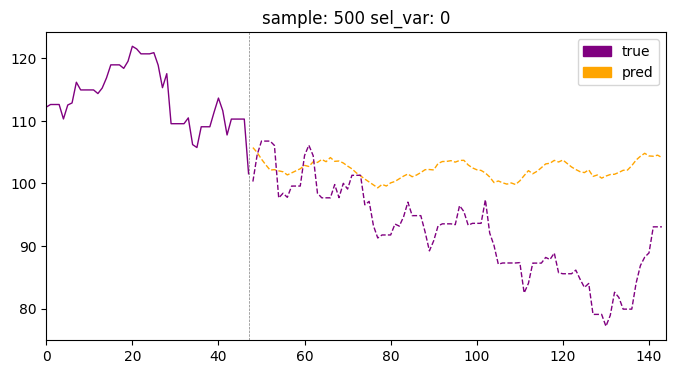

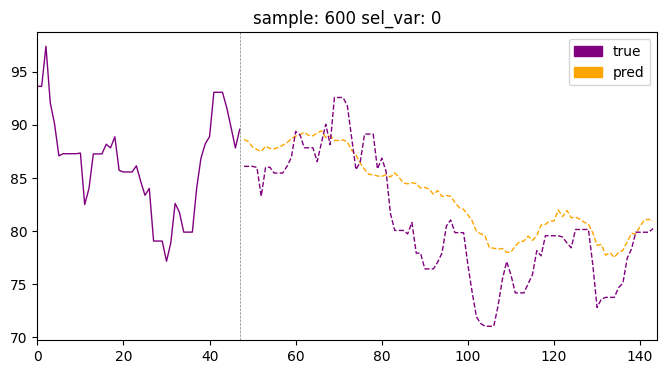

In [161]:
for id in range (0,700, 100):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


In [162]:
learn = load_learner('patchTST.pt')
scaled_preds_val, *_ = learn.get_X_preds(x[splits[1]])
scaled_preds_val = to_np(scaled_preds_val)
print(f"scaled_preds.shape: {scaled_preds_val.shape}")

scaled_y_true_val = y[splits[1]]
loss = mean_squared_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())

results_df

scaled_preds.shape: (104, 1, 96)


,mse,mae
valid,0.296774,0.448069


In [163]:

x_val = x[splits[1]]
y_val = y[splits[1]]


inverse_scale_y_preds = scaler.inverse_transform(scaled_preds_val.reshape(-1, 1)).flatten().reshape(104, 1, 96)
inverse_scale_y_true = (scaler.inverse_transform(y_val.reshape(-1, 1)).flatten()).reshape(104, 1, 96)
inverse_scale_x_test = scaler.inverse_transform(x_val.reshape(-1, 1)).flatten().reshape(104, 1, 48)


results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())\

results_df

,mse,mae
valid,86.793247,7.662572


In [164]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,smape
valid,9.6455


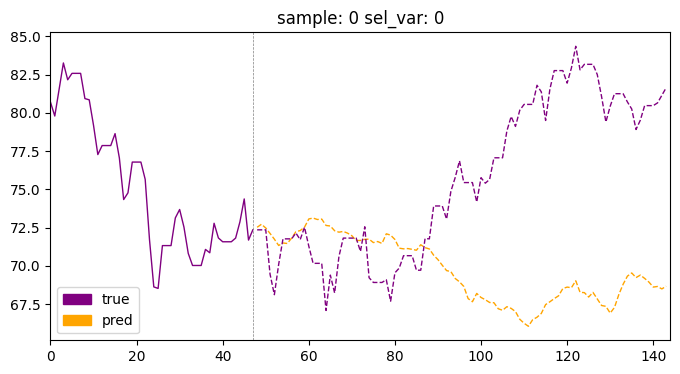

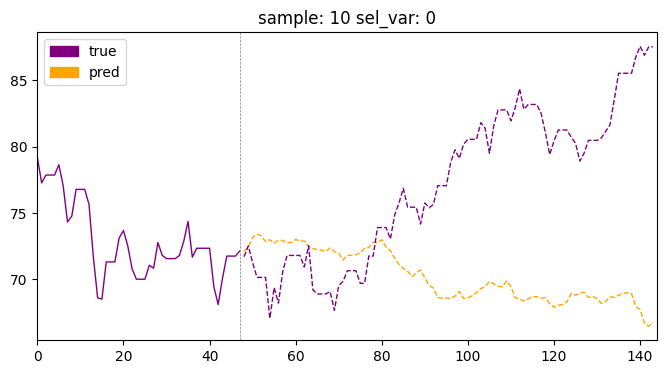

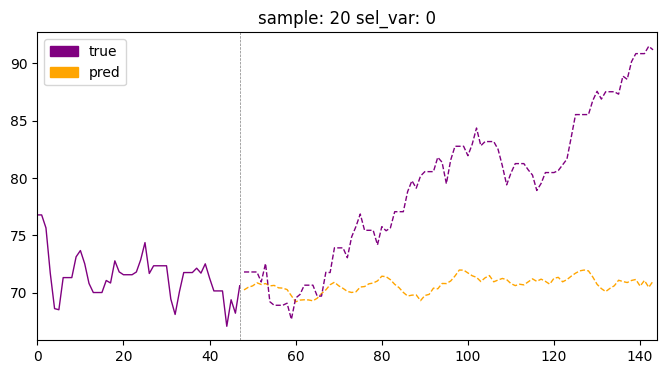

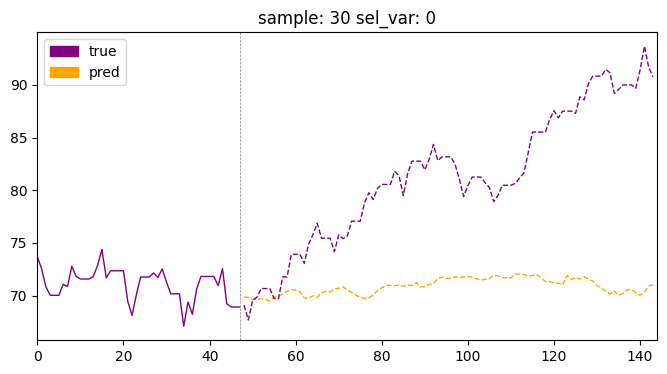

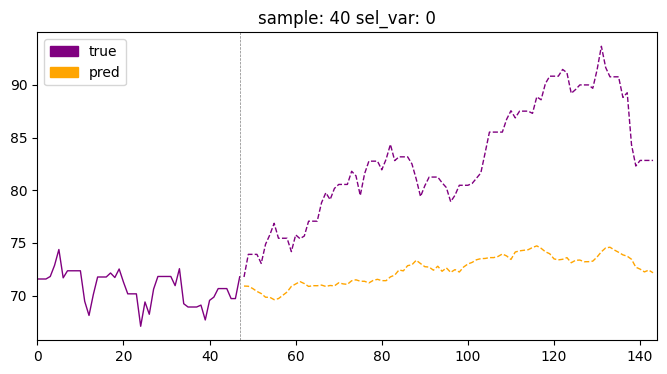

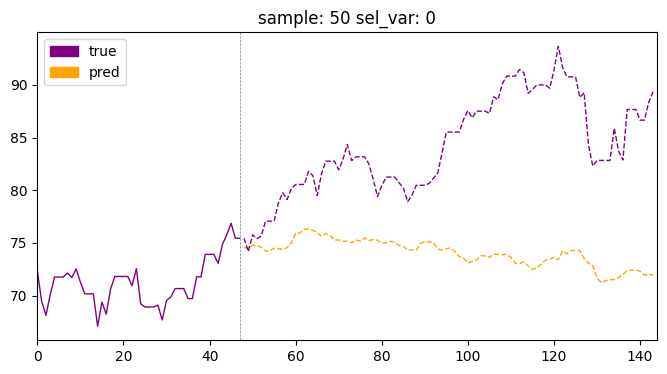

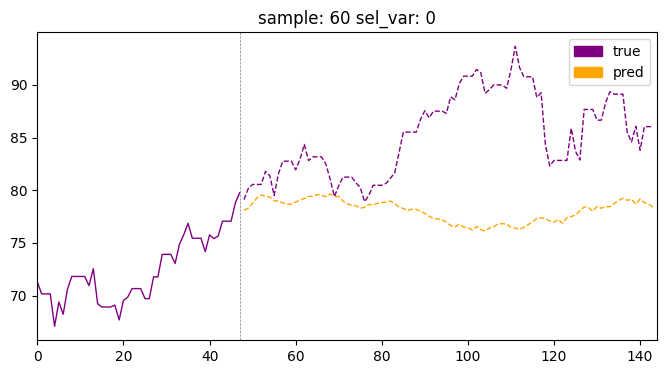

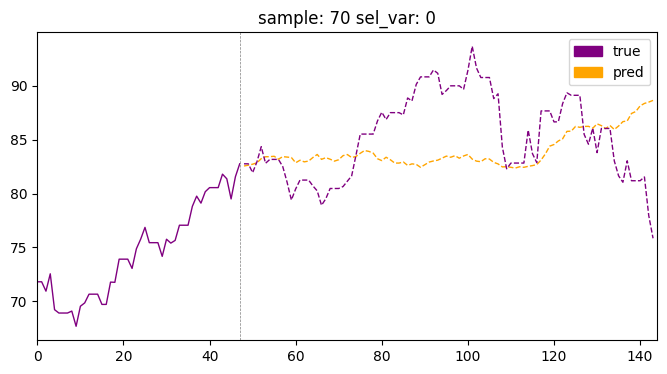

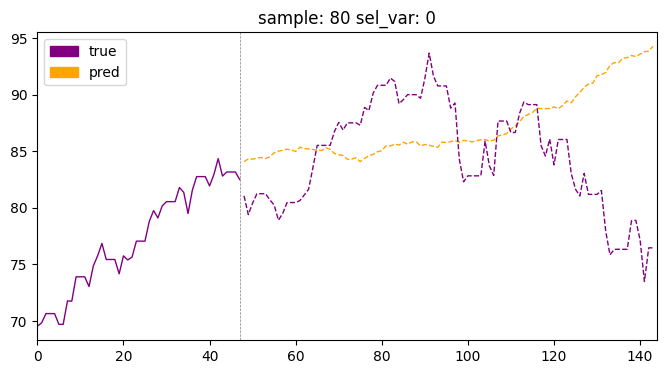

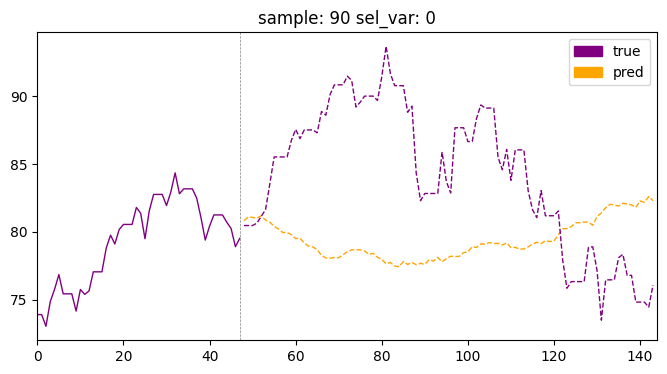

In [165]:
for id in range (0,100, 10):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


In [166]:
learn = load_learner('patchTST.pt')
y_test_preds, *_ = learn.get_X_preds(x[splits[2]])
y_test_preds = to_np(y_test_preds)
print(f"y_test_preds.shape: {y_test_preds.shape}")

y_test = y[splits[2]]
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["test", "mse"] = mean_squared_error(y_test.flatten(), y_test_preds.flatten())
results_df.loc["test", "mae"] = mean_absolute_error(y_test.flatten(), y_test_preds.flatten())
results_df






y_test_preds.shape: (209, 1, 96)


,mse,mae
test,0.148383,0.306526


In [167]:

x_test = x[splits[2]]
y_test = y[splits[2]]


inverse_scale_y_preds = scaler.inverse_transform(y_test_preds.reshape(-1, 1)).flatten().reshape(209, 1, 96)
inverse_scale_y_true = (scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()).reshape(209, 1, 96)
inverse_scale_x_test = scaler.inverse_transform(x_test.reshape(-1, 1)).flatten().reshape(209, 1, 48)


results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,mse,mae
valid,43.395331,5.241999


In [168]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,smape
valid,6.649473


In [75]:
y_test.shape

(209, 1, 96)

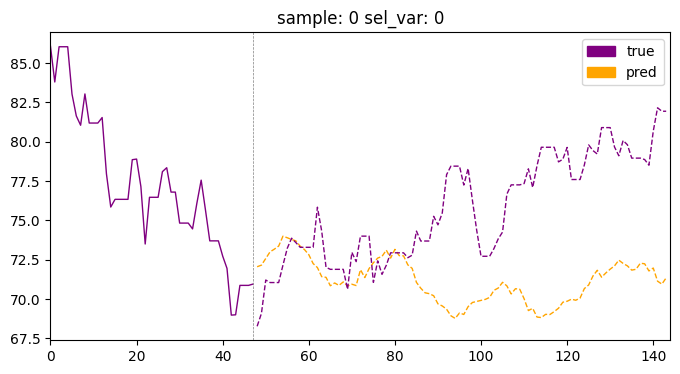

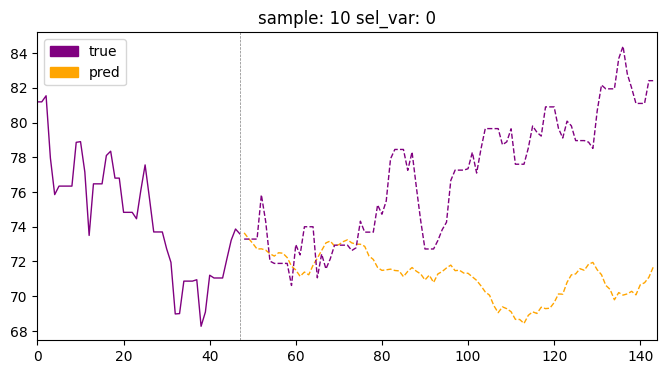

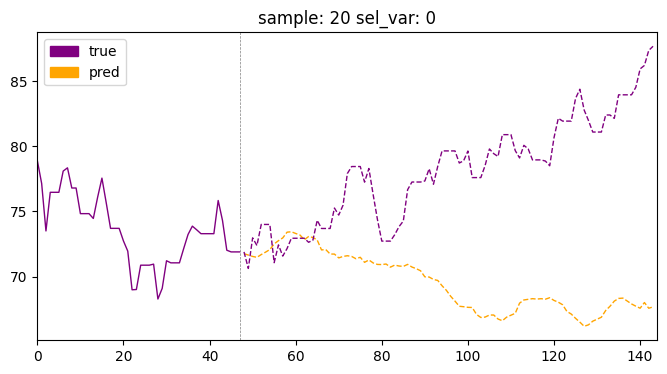

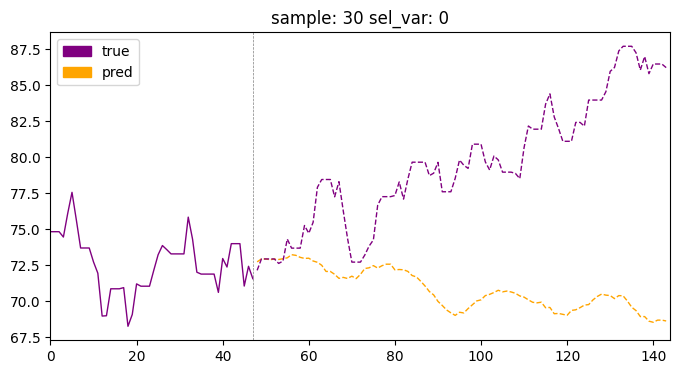

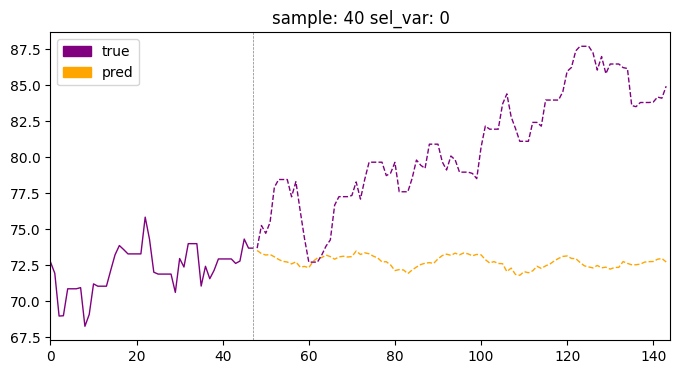

...

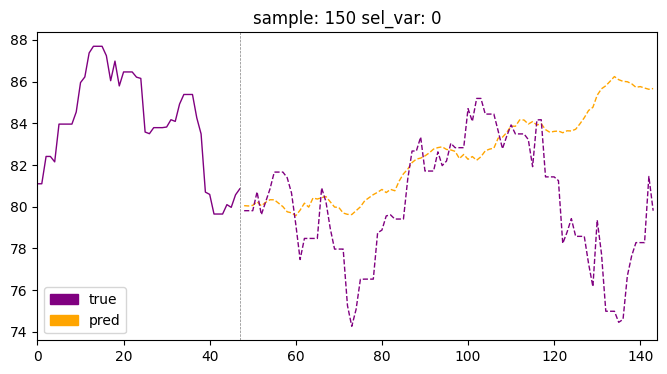

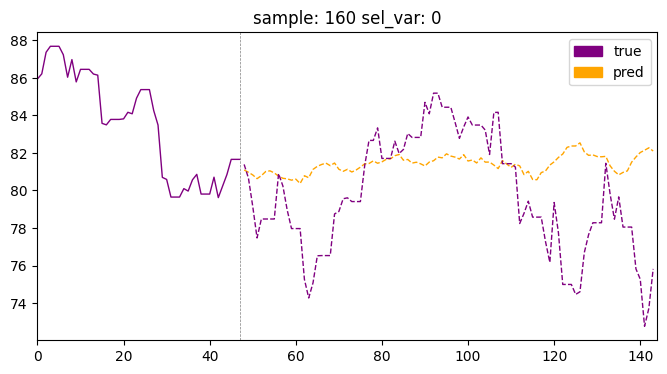

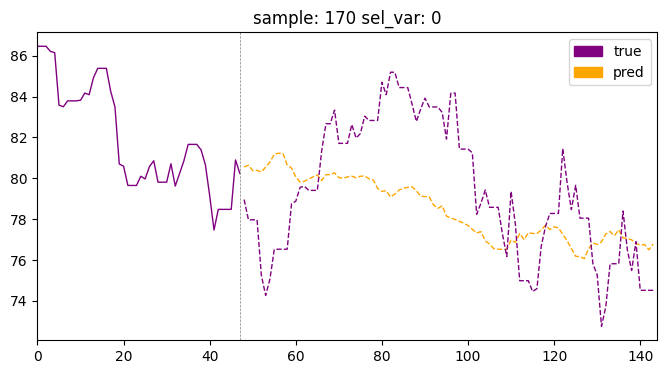

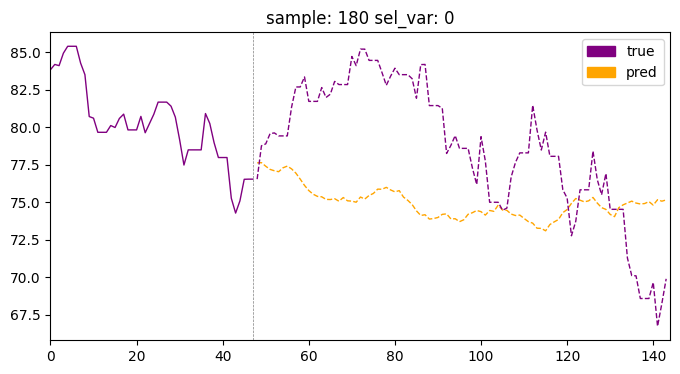

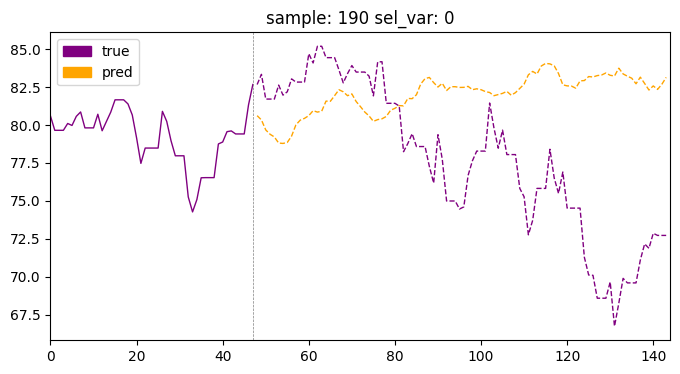

In [169]:
for id in range (0,200, 10):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


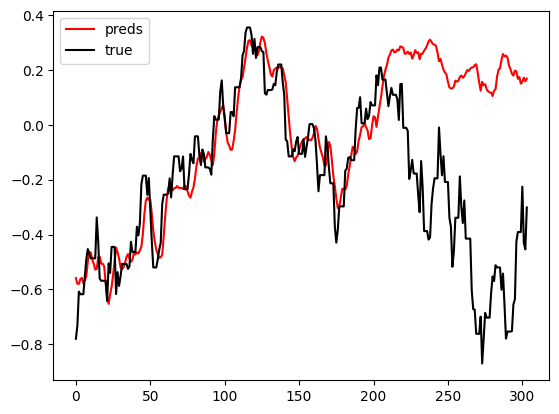

In [170]:
x_test = torch.tensor(x_test)
y_test = torch.tensor(y_test)
y_test_preds = torch.tensor(y_test_preds)



y_preds_one = y_test_preds[:, 0, 0]
y_true_one = y_test[:, 0, 0]

y_preds_last = y_test_preds[-1, 0, 1:]
y_true_last = y_test[-1, 0, 1:]

y_preds_appended = torch.cat((y_preds_one, y_preds_last))
y_true_appended = torch.cat((y_true_one, y_true_last))



plt.plot(y_preds_appended, c = 'r', label = 'preds')
plt.plot(y_true_appended, c = 'k', label = 'true')
plt.legend()


# Optuna Small

## Tune

In [54]:
# def objective(trial):
#     # Suggest `fcst_history` first


#     HPs = {
#         'fcst_history': trial.suggest_int("fcst_history", 16, 128, step=16),
#         'batch_size': trial.suggest_int("batch_size", 8, 128, step=8),
#         'epochs': trial.suggest_int("epochs", 5, 20, step=5),
#         'n_layers': trial.suggest_int("n_layers", 1, 4, step=1),  # encoder_layers
#         'n_heads': trial.suggest_int("n_heads", 1, 4, step=2),
#         'd_model': trial.suggest_int("d_model", 16, 128, step=8),
#         'd_ff': trial.suggest_int("d_ff", 16, 256, step=8),
#         'attn_dropout': trial.suggest_float("attn_dropout", 0, 0.5, step=0.1),
#         'dropout': trial.suggest_float("dropout", 0, 0.5, step=0.1),
#         'patch_len': trial.suggest_int("patch_len", 0, 128, step=16),
#         'stride': trial.suggest_int("stride", 1, 5, step=1)
#     }

#     try:
#         loss = train_model(HPs)
#         return loss
#     except Exception as e:
#         print(f'Study failed because {e}.')
#         return None


In [7]:
import optuna

def objective(trial):
    # Suggest hyperparameters
    fcst_history = trial.suggest_int("fcst_history", 16, 128, step=16)
    n_heads = trial.suggest_int("n_heads", 1, 4, step=1)
    d_model = trial.suggest_int("d_model", 16, 128, step=8)
    patch_len = trial.suggest_int("patch_len", 0, fcst_history, step=16)
    
    # Prune trial if d_model is not divisible by n_heads
    if d_model % n_heads != 0:
        print(f"Pruning trial: d_model ({d_model}) is not divisible by n_heads ({n_heads})")
        raise optuna.exceptions.TrialPruned()
    
    # Prune trial if patch_len is greater than fcst_history
    if patch_len > fcst_history:
        print(f"Pruning trial: patch_len ({patch_len}) is greater than fcst_history ({fcst_history})")
        raise optuna.exceptions.TrialPruned()

    if patch_len == 0:
        print(f"Pruning trial: patch_len ({patch_len}) is greater than fcst_history ({fcst_history})")
        raise optuna.exceptions.TrialPruned()

    # Define other hyperparameters
    HPs = {
        'fcst_history': fcst_history,
        'batch_size': trial.suggest_int("batch_size", 8, 128, step=8),
        'epochs': trial.suggest_int("epochs", 5, 20, step=5),
        'n_layers': trial.suggest_int("n_layers", 1, 4, step=1),
        'n_heads': n_heads,
        'd_model': d_model,
        'd_ff': trial.suggest_int("d_ff", 16, 256, step=8),
        'attn_dropout': trial.suggest_float("attn_dropout", 0, 0.5, step=0.1),
        'dropout': trial.suggest_float("dropout", 0, 0.5, step=0.1),
        'stride': trial.suggest_int("stride", 1, 5, step=1),
        'patch_len': patch_len
    }

    # Your evaluation logic here
    try:
        loss = train_model(HPs)  # Replace with your training logic
        return loss
    except Exception as e:
        print(f"Trial failed: {e}")
        return None


In [5]:
def data_preparation(HPs):



  #setting basic params
  datetime_col = 'Date'
  fcst_history = HPs['fcst_history']
  fcst_horizon = 16
  valid_size   = 0.1
  test_size    = 0.2

  #getting cross-val splots

  splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                  valid_size=valid_size, test_size=test_size)

  train_data = crude_modeling_df.iloc[splits[0]]
  test_data = crude_modeling_df.iloc[splits[2]]
  val_data = crude_modeling_df.iloc[splits[1]]

  #scaling post cross-validation
  scaler = StandardScaler()
  scaled_crude_modeling_df = crude_modeling_df.copy()
  scaler.fit(train_data[['crude']])
  scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

  #doing the sliding window step

  x_vars = 'crude'
  y_vars = 'crude'

  x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
  x.shape, y.shape

  x_tensor = torch.tensor(x, dtype=torch.float32)
  y_tensor = torch.tensor(y, dtype=torch.float32)

  return splits, x_tensor, y_tensor, x, y









In [9]:
def train_model(HPs):

    splits, x_tensor, y_tensor, x, y = data_preparation(HPs)

    arch_config = dict(
    n_layers= HPs['n_layers'],  # number of encoder layers
    n_heads = HPs['n_heads'],  # number of heads
    d_model= HPs['d_model'],  # dimension of model
    d_ff= HPs['d_ff'],  # dimension of fully connected network
    attn_dropout= HPs['attn_dropout'], # dropout applied to the attention weights
    dropout= HPs['dropout'], # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len= HPs['patch_len'],  # length of the patch applied to the time series to create patches
    stride= HPs['stride'],  # stride used when creating patches
    padding_patch= True,  # padding_patch
    #batch_size = HPs['batch_size']         
    )

    #modelling
    learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size = HPs['batch_size'],
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae])

    lr_max = learn.lr_find().valley
    learn.fit_one_cycle(HPs['epochs'], lr_max =lr_max)
    learn.export('patchTST.pt')

    #validation set inference
    learn = load_learner('patchTST.pt')
    scaled_preds, *_ = learn.get_X_preds(x[splits[1]])
    scaled_preds = to_np(scaled_preds)
    print(f"scaled_preds.shape: {scaled_preds.shape}")

    scaled_y_true = y[splits[1]]
    loss = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
    results_df = pd.DataFrame(columns=["mse", "mae"])
    results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
    results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true.flatten(), scaled_preds.flatten())




  





    return loss











[I 2024-12-14 04:40:43,268] Using an existing study with name 'patchtst_small_refined_tune' instead of creating a new one.


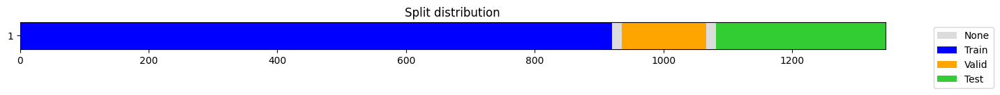

epoch,train_loss,valid_loss,mse,mae,time
0,0.130163,0.091423,0.091423,0.248409,00:00
1,0.127278,0.081181,0.081181,0.231656,00:00
2,0.120596,0.071888,0.071888,0.213183,00:00
3,0.115589,0.066616,0.066616,0.203923,00:00
4,0.111831,0.064736,0.064736,0.199979,00:00
5,0.108066,0.064801,0.064801,0.198583,00:00
6,0.105959,0.062740,0.062740,0.195314,00:00
7,0.103718,0.063845,0.063845,0.196932,00:00
8,0.101809,0.061975,0.061975,0.193214,00:00
9,0.100576,0.063988,0.063988,0.196734,00:00


[I 2024-12-14 04:40:54,844] Trial 510 finished with value: 0.06300533718515916 and parameters: {'fcst_history': 16, 'n_heads': 2, 'd_model': 120, 'patch_len': 16, 'batch_size': 120, 'epochs': 20, 'n_layers': 3, 'd_ff': 40, 'attn_dropout': 0.0, 'dropout': 0.1, 'stride': 4}. Best is trial 374 with value: 0.06034616421404482.


scaled_preds.shape: (132, 1, 16)


['patchtst_small_redined_tune.pkl']

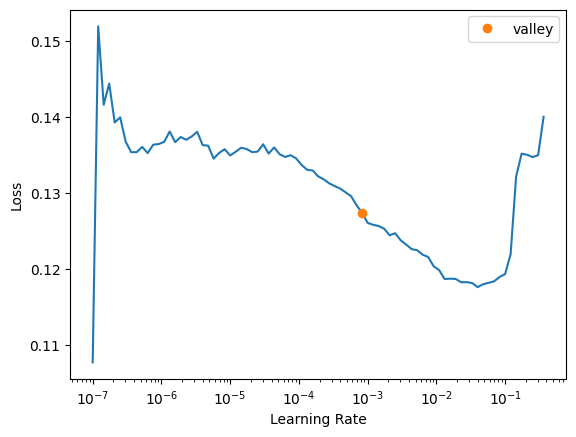

In [10]:
study = optuna.create_study(direction="minimize",
                            sampler=optuna.samplers.TPESampler(),
                            study_name='patchtst_small_refined_tune',
                            storage='sqlite:///patchtst_small_redined_tune.db', 
                            load_if_exists=True)

study.optimize(objective, n_trials=1)
joblib.dump(study, "patchtst_small_redined_tune.pkl")

## Best Small Model

In [129]:
study = joblib.load("patchtst_small_tune.pkl")
sorted_trials = sorted(study.trials, key=lambda trial: trial.values[0] if trial.values else float('inf'))
len(sorted_trials)

933

In [131]:
value = sorted_trials[0].value
print(value)
HPs = sorted_trials[0].params
HPs

0.057311441188558035


{'fcst_history': 96,
 'batch_size': 24,
 'epochs': 20,
 'n_layers': 3,
 'n_heads': 1,
 'd_model': 120,
 'd_ff': 152,
 'attn_dropout': 0.1,
 'dropout': 0.30000000000000004,
 'patch_len': 96,
 'stride': 2}

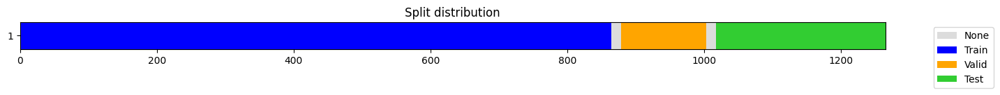

In [132]:
  datetime_col = 'Date'
  fcst_history = HPs['fcst_history']
  fcst_horizon = 16
  valid_size   = 0.1
  test_size    = 0.2

  #getting cross-val splots

  splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                  valid_size=valid_size, test_size=test_size)

  train_data = crude_modeling_df.iloc[splits[0]]
  test_data = crude_modeling_df.iloc[splits[2]]
  val_data = crude_modeling_df.iloc[splits[1]]

  #scaling post cross-validation
  scaler = StandardScaler()
  scaled_crude_modeling_df = crude_modeling_df.copy()
  scaler.fit(train_data[['crude']])
  scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

  #doing the sliding window step

  x_vars = 'crude'
  y_vars = 'crude'

  x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
  x.shape, y.shape

  x_tensor = torch.tensor(x, dtype=torch.float32)
  y_tensor = torch.tensor(y, dtype=torch.float32)




epoch,train_loss,valid_loss,mse,mae,time
0,0.309535,0.168774,0.168774,0.350491,00:00
1,0.225364,0.072311,0.072311,0.217194,00:00
2,0.175950,0.069295,0.069295,0.213370,00:00
3,0.151974,0.080931,0.080931,0.229492,00:00
4,0.137830,0.083731,0.083731,0.238205,00:00
5,0.129421,0.062276,0.062276,0.205747,00:00
6,0.118907,0.093895,0.093895,0.237674,00:00
7,0.120637,0.070622,0.070622,0.212440,00:00
8,0.115977,0.100024,0.100024,0.267958,00:00
9,0.114431,0.070821,0.070821,0.207192,00:00


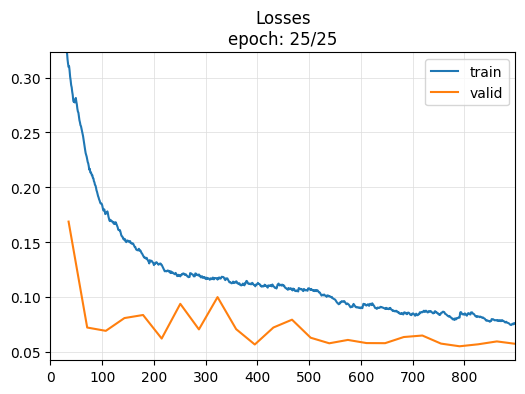

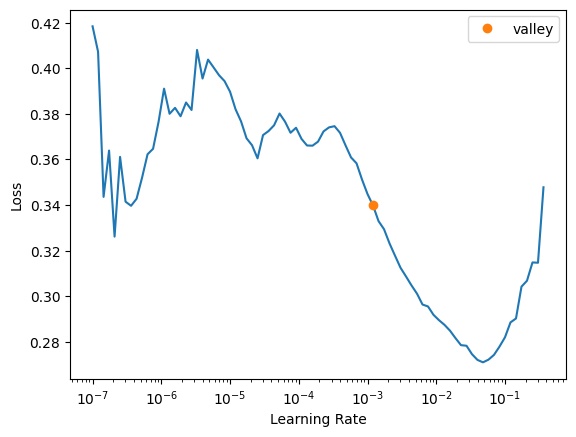

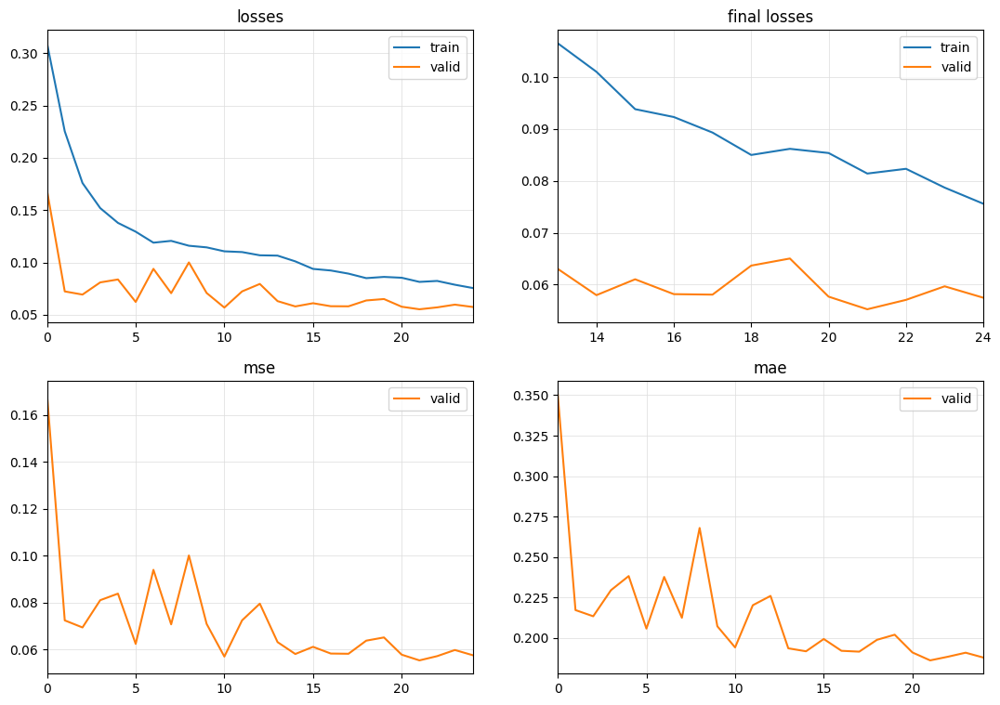

In [134]:
   

    arch_config = dict(
    n_layers= HPs['n_layers'],  # number of encoder layers
    n_heads = HPs['n_heads'],  # number of heads
    d_model= HPs['d_model'],  # dimension of model
    d_ff= HPs['d_ff'],  # dimension of fully connected network
    attn_dropout= HPs['attn_dropout'], # dropout applied to the attention weights
    dropout= HPs['dropout'], # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len= HPs['patch_len'],  # length of the patch applied to the time series to create patches
    stride= HPs['stride'],  # stride used when creating patches
    padding_patch= True,  # padding_patch
    #batch_size = HPs['batch_size']         
    )

    #modelling
    learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size = HPs['batch_size'],
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae], cbs=ShowGraph())

    lr_max = learn.lr_find().valley
    learn.fit_one_cycle(HPs['epochs'] +5, lr_max =lr_max)
    learn.export('patchTST.pt')

    #validation set inference
  



In [136]:
learn = load_learner('patchTST.pt')
scaled_preds_train, *_ = learn.get_X_preds(x[splits[0]])
scaled_preds_train = to_np(scaled_preds_train)
print(f"scaled_preds.shape: {scaled_preds_train.shape}")

scaled_y_train = y[splits[0]]
loss = mean_squared_error(scaled_y_train.flatten(), scaled_preds_train.flatten())
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_train.flatten(), scaled_preds_train.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_train.flatten(), scaled_preds_train.flatten())

results_df

scaled_preds.shape: (864, 1, 16)


,mse,mae
valid,0.05416,0.17418


In [138]:

x_train = x[splits[0]]
y_train = y[splits[0]]


inverse_scale_y_preds = scaler.inverse_transform(scaled_preds_train.reshape(-1, 1)).flatten().reshape(864, 1, 16)
inverse_scale_y_true = (scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()).reshape(864, 1, 16)
inverse_scale_x_test = scaler.inverse_transform(x_train.reshape(-1, 1)).flatten().reshape(864, 1, 96)



results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,mse,mae
valid,13.736648,2.773953


In [140]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,smape
valid,3.367626


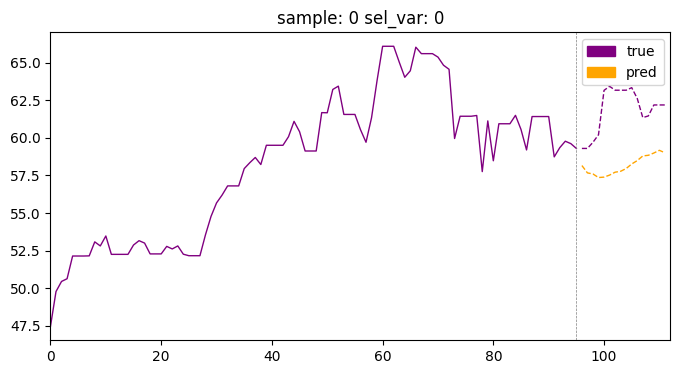

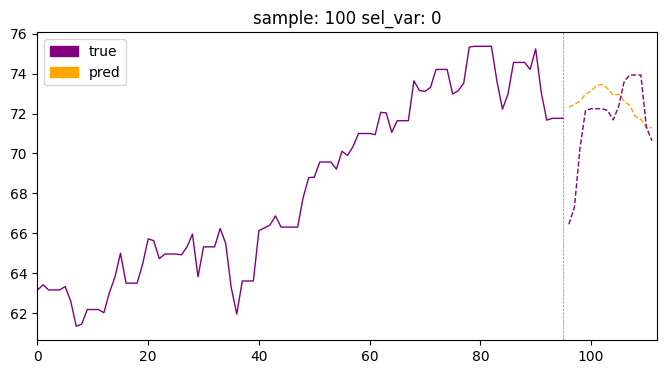

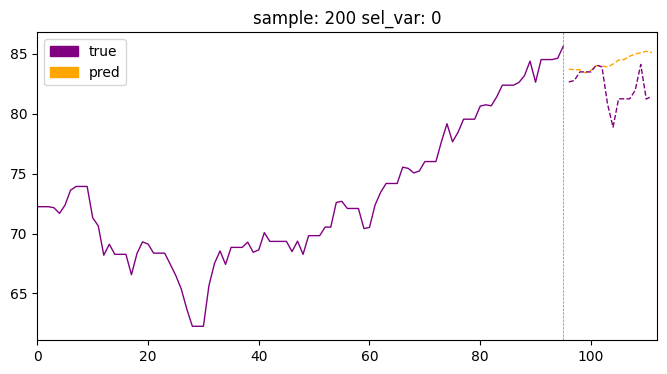

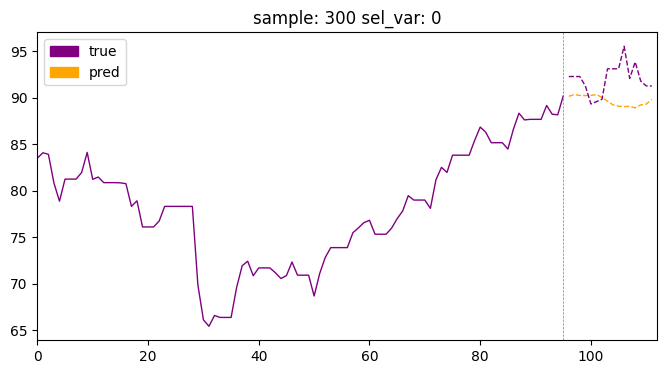

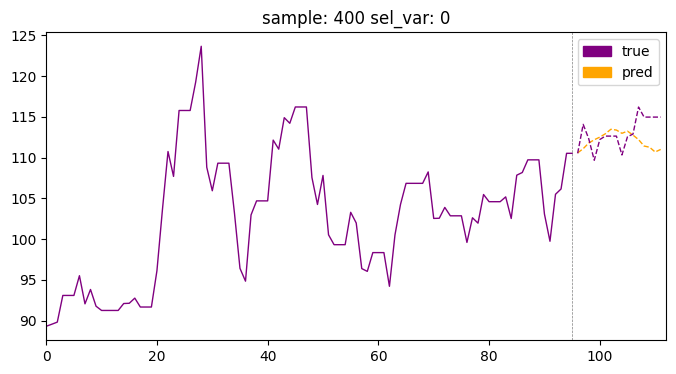

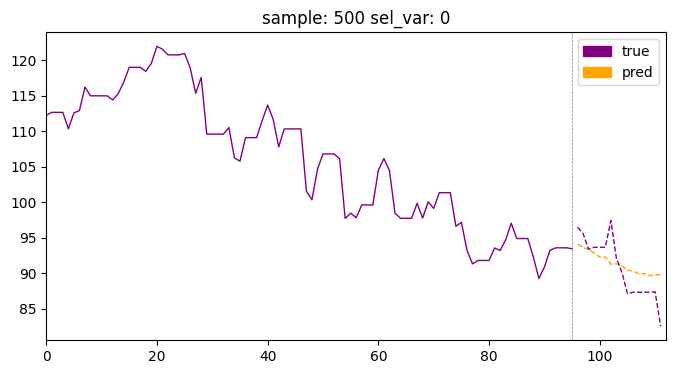

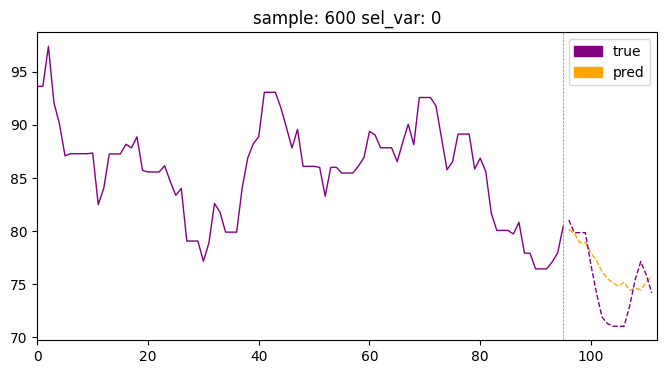

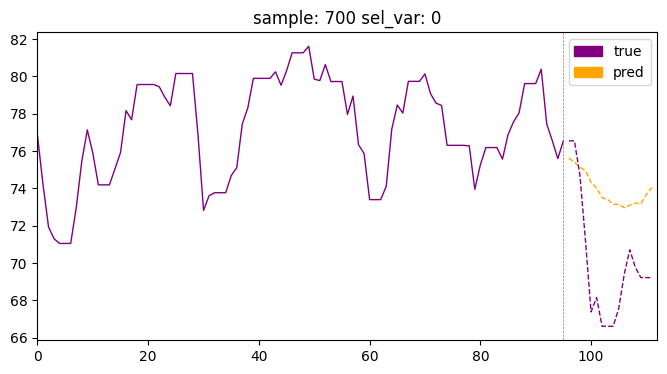

In [141]:
for id in range (0,800, 100):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


In [142]:
learn = load_learner('patchTST.pt')
scaled_preds_val, *_ = learn.get_X_preds(x[splits[1]])
scaled_preds_val = to_np(scaled_preds_val)
print(f"scaled_preds.shape: {scaled_preds_val.shape}")

scaled_y_true_val = y[splits[1]]
loss = mean_squared_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())

results_df

scaled_preds.shape: (124, 1, 16)


,mse,mae
valid,0.057464,0.187861


In [144]:

x_val = x[splits[1]]
y_val = y[splits[1]]


inverse_scale_y_preds = scaler.inverse_transform(scaled_preds_val.reshape(-1, 1)).flatten().reshape(124, 1, 16)
inverse_scale_y_true = (scaler.inverse_transform(y_val.reshape(-1, 1)).flatten()).reshape(124, 1, 16)
inverse_scale_x_test = scaler.inverse_transform(x_val.reshape(-1, 1)).flatten().reshape(124, 1, 96)


results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df

,mse,mae
valid,14.574704,2.991841


In [145]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df

,smape
valid,3.805737


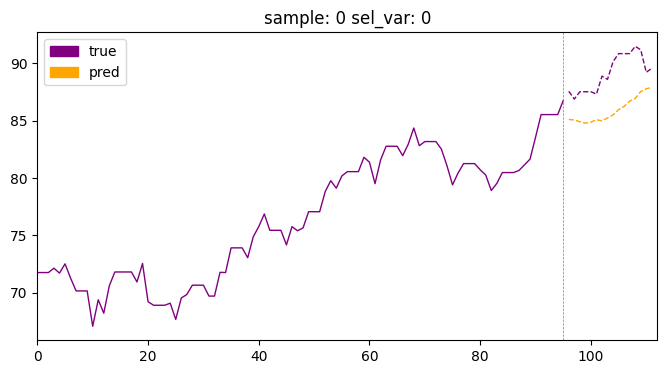

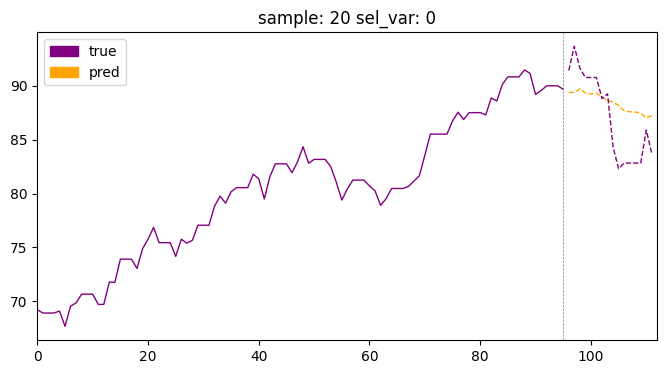

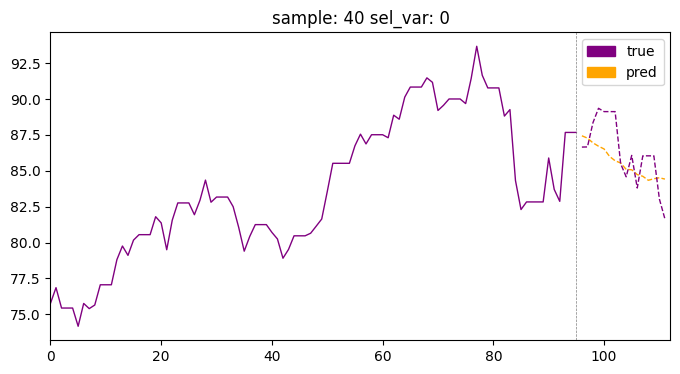

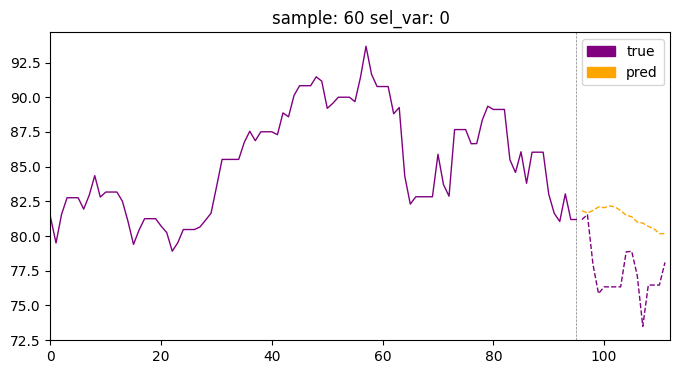

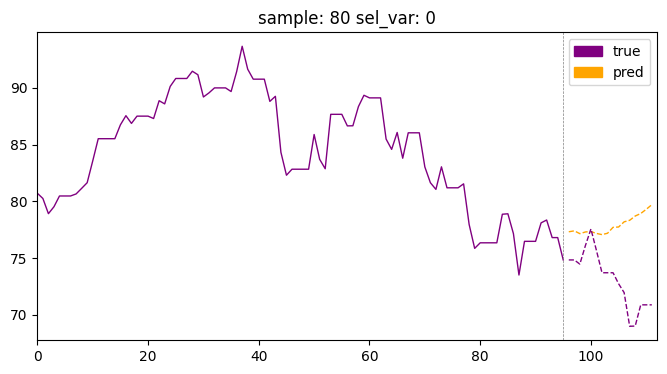

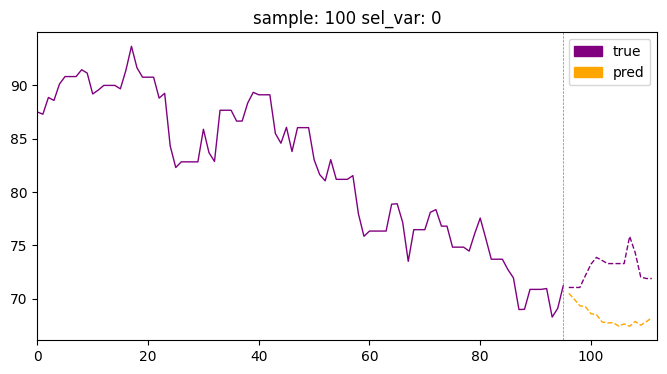

In [146]:
for id in range (0,120, 20):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


In [147]:
learn = load_learner('patchTST.pt')
y_test_preds, *_ = learn.get_X_preds(x[splits[2]])
y_test_preds = to_np(y_test_preds)
print(f"y_test_preds.shape: {y_test_preds.shape}")

y_test = y[splits[2]]
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["test", "mse"] = mean_squared_error(y_test.flatten(), y_test_preds.flatten())
results_df.loc["test", "mae"] = mean_absolute_error(y_test.flatten(), y_test_preds.flatten())
results_df






y_test_preds.shape: (247, 1, 16)


,mse,mae
test,0.037459,0.155343


In [148]:

x_test = x[splits[2]]
y_test = y[splits[2]]


inverse_scale_y_preds = scaler.inverse_transform(y_test_preds.reshape(-1, 1)).flatten().reshape(247, 1, 16)
inverse_scale_y_true = (scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()).reshape(247, 1, 16)
inverse_scale_x_test = scaler.inverse_transform(x_test.reshape(-1, 1)).flatten().reshape(247, 1, 96)


results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,mse,mae
valid,9.500836,2.473959


In [149]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,smape
valid,3.158792


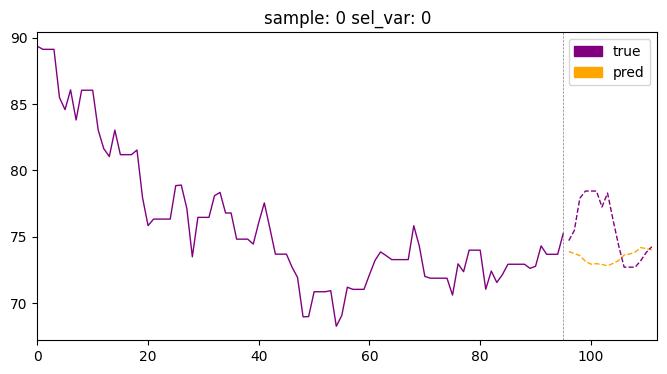

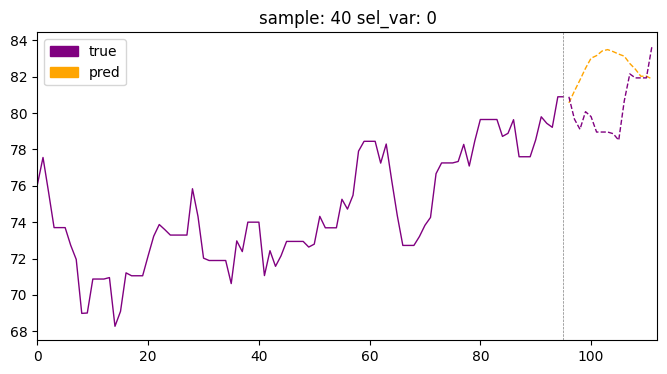

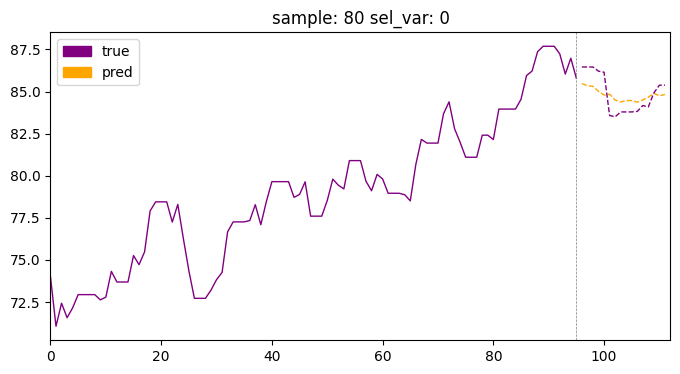

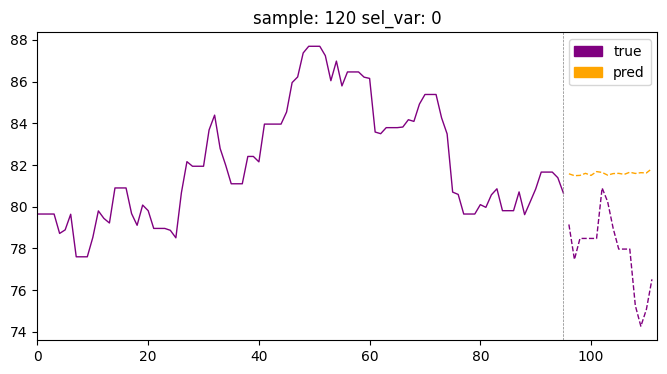

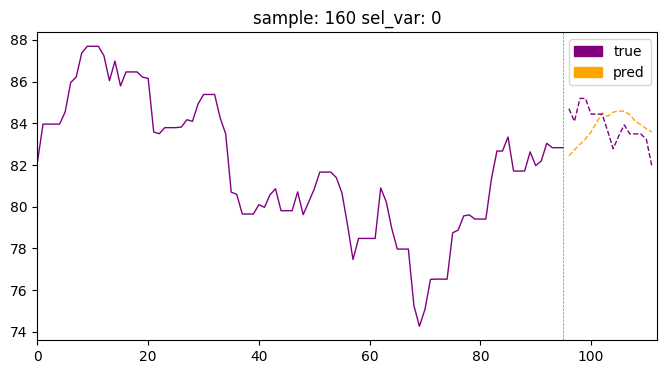

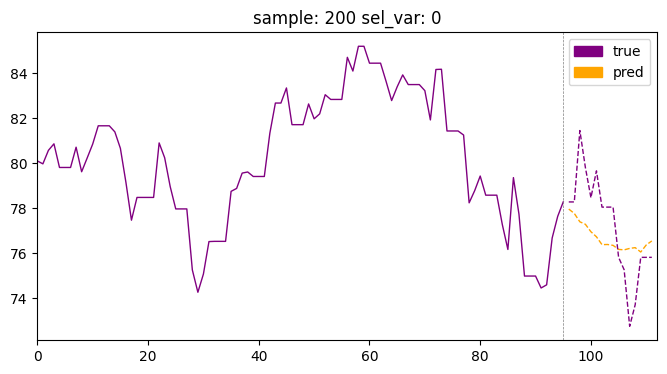

In [150]:
for id in range (0,240, 40):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


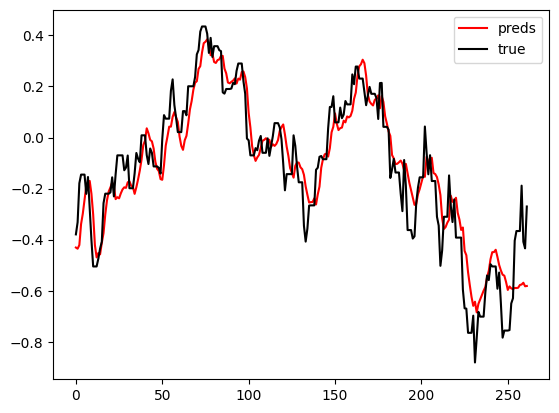

In [151]:
x_test = torch.tensor(x_test)
y_test = torch.tensor(y_test)
y_test_preds = torch.tensor(y_test_preds)



y_preds_one = y_test_preds[:, 0, 0]
y_true_one = y_test[:, 0, 0]

y_preds_last = y_test_preds[-1, 0, 1:]
y_true_last = y_test[-1, 0, 1:]

y_preds_appended = torch.cat((y_preds_one, y_preds_last))
y_true_appended = torch.cat((y_true_one, y_true_last))



plt.plot(y_preds_appended, c = 'r', label = 'preds')
plt.plot(y_true_appended, c = 'k', label = 'true')
plt.legend()


# Optuna Medium

## Tune

In [6]:

def objective(trial):
    # Suggest hyperparameters
    fcst_history = trial.suggest_int("fcst_history", 16, 128, step=16)
    n_heads = trial.suggest_int("n_heads", 1, 4, step=1)
    d_model = trial.suggest_int("d_model", 16, 128, step=8)
    patch_len = trial.suggest_int("patch_len", 0, fcst_history, step=16)
    
    # Prune trial if d_model is not divisible by n_heads
    if d_model % n_heads != 0:
        print(f"Pruning trial: d_model ({d_model}) is not divisible by n_heads ({n_heads})")
        raise optuna.exceptions.TrialPruned()
    
    # Prune trial if patch_len is greater than fcst_history
    if patch_len > fcst_history:
        print(f"Pruning trial: patch_len ({patch_len}) is greater than fcst_history ({fcst_history})")
        raise optuna.exceptions.TrialPruned()

    if patch_len == 0:
        print(f"Pruning trial: patch_len ({patch_len}) is greater than fcst_history ({fcst_history})")
        raise optuna.exceptions.TrialPruned()

    # Define other hyperparameters
    HPs = {
        'fcst_history': fcst_history,
        'batch_size': trial.suggest_int("batch_size", 8, 128, step=8),
        'epochs': trial.suggest_int("epochs", 5, 20, step=5),
        'n_layers': trial.suggest_int("n_layers", 1, 4, step=1),
        'n_heads': n_heads,
        'd_model': d_model,
        'd_ff': trial.suggest_int("d_ff", 16, 256, step=8),
        'attn_dropout': trial.suggest_float("attn_dropout", 0, 0.5, step=0.1),
        'dropout': trial.suggest_float("dropout", 0, 0.5, step=0.1),
        'stride': trial.suggest_int("stride", 1, 5, step=1),
        'patch_len': patch_len
    }

    # Your evaluation logic here
    try:
        loss = train_model(HPs)  # Replace with your training logic
        return loss
    except Exception as e:
        print(f"Trial failed: {e}")
        return None


In [7]:
def data_preparation(HPs):



  #setting basic params
  datetime_col = 'Date'
  fcst_history = HPs['fcst_history']
  fcst_horizon = 48
  valid_size   = 0.1
  test_size    = 0.2

  #getting cross-val splots

  splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                  valid_size=valid_size, test_size=test_size)

  train_data = crude_modeling_df.iloc[splits[0]]
  test_data = crude_modeling_df.iloc[splits[2]]
  val_data = crude_modeling_df.iloc[splits[1]]

  #scaling post cross-validation
  scaler = StandardScaler()
  scaled_crude_modeling_df = crude_modeling_df.copy()
  scaler.fit(train_data[['crude']])
  scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

  #doing the sliding window step

  x_vars = 'crude'
  y_vars = 'crude'

  x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
  x.shape, y.shape

  x_tensor = torch.tensor(x, dtype=torch.float32)
  y_tensor = torch.tensor(y, dtype=torch.float32)

  return splits, x_tensor, y_tensor, x, y









In [8]:
def train_model(HPs):

    splits, x_tensor, y_tensor, x, y = data_preparation(HPs)

    arch_config = dict(
    n_layers= HPs['n_layers'],  # number of encoder layers
    n_heads = HPs['n_heads'],  # number of heads
    d_model= HPs['d_model'],  # dimension of model
    d_ff= HPs['d_ff'],  # dimension of fully connected network
    attn_dropout= HPs['attn_dropout'], # dropout applied to the attention weights
    dropout= HPs['dropout'], # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len= HPs['patch_len'],  # length of the patch applied to the time series to create patches
    stride= HPs['stride'],  # stride used when creating patches
    padding_patch= True,  # padding_patch
    #batch_size = HPs['batch_size']         
    )

    #modelling
    learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size = HPs['batch_size'],
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae])

    lr_max = learn.lr_find().valley
    learn.fit_one_cycle(HPs['epochs'], lr_max =lr_max)
    learn.export('patchTST.pt')

    #validation set inference
    learn = load_learner('patchTST.pt')
    scaled_preds, *_ = learn.get_X_preds(x[splits[1]])
    scaled_preds = to_np(scaled_preds)
    print(f"scaled_preds.shape: {scaled_preds.shape}")

    scaled_y_true = y[splits[1]]
    loss = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
    results_df = pd.DataFrame(columns=["mse", "mae"])
    results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true.flatten(), scaled_preds.flatten())
    results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true.flatten(), scaled_preds.flatten())




  





    return loss











[I 2024-12-14 15:09:55,690] Using an existing study with name 'patchtst_medium_tune' instead of creating a new one.
[I 2024-12-14 15:09:55,923] Trial 395 pruned. 


Pruning trial: patch_len (0) is greater than fcst_history (16)


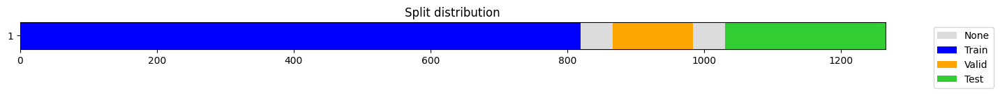

epoch,train_loss,valid_loss,mse,mae,time
0,0.355368,0.273546,0.273546,0.451959,00:00
1,0.310189,0.207503,0.207503,0.385760,00:00
2,0.281164,0.194384,0.194384,0.363883,00:00
3,0.260657,0.190867,0.190867,0.358240,00:00
4,0.238232,0.175107,0.175107,0.339513,00:00
5,0.223638,0.217591,0.217591,0.372068,00:00
6,0.210437,0.165538,0.165538,0.328079,00:00
7,0.192559,0.148053,0.148053,0.303949,00:00
8,0.175743,0.167155,0.167155,0.323832,00:00
9,0.166921,0.141887,0.141887,0.293856,00:00


[I 2024-12-14 15:10:07,086] Trial 396 finished with value: 0.14389861775206428 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


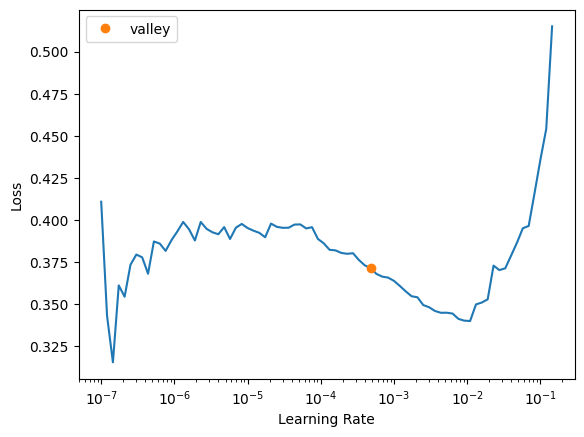

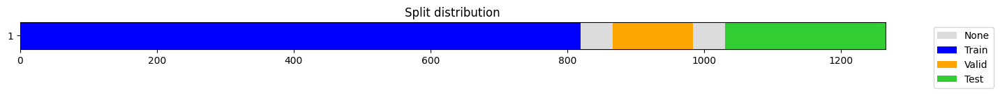

epoch,train_loss,valid_loss,mse,mae,time
0,0.293179,0.235107,0.235107,0.402774,00:00
1,0.265359,0.194177,0.194177,0.358804,00:00
2,0.239148,0.192767,0.192767,0.340453,00:00
3,0.224089,0.233901,0.233901,0.360467,00:00
4,0.214583,0.186926,0.186926,0.339858,00:00
5,0.211526,0.214875,0.214875,0.349901,00:00
6,0.191716,0.205830,0.205830,0.345351,00:00
7,0.177629,0.168467,0.168467,0.319239,00:00
8,0.160420,0.172365,0.172365,0.314725,00:00
9,0.149173,0.231288,0.231288,0.371129,00:00


[I 2024-12-14 15:10:21,721] Trial 397 finished with value: 0.16713469642209822 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 16, 'epochs': 20, 'n_layers': 2, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


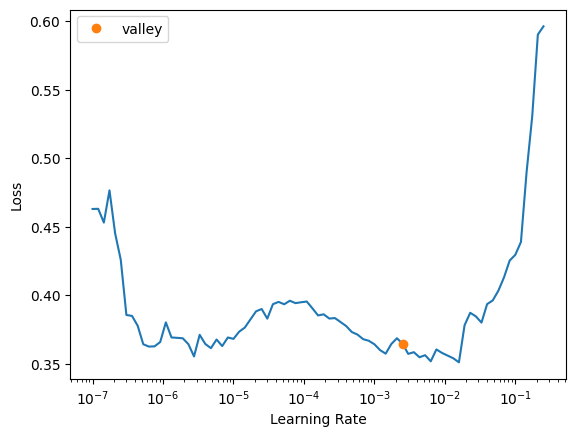

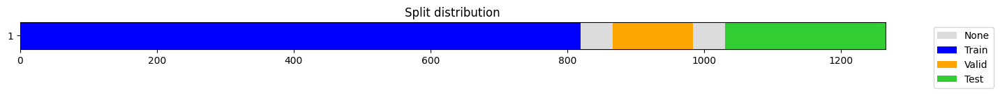

epoch,train_loss,valid_loss,mse,mae,time
0,0.349764,0.250943,0.250943,0.431402,00:00
1,0.302461,0.229637,0.229637,0.400568,00:00
2,0.270744,0.190002,0.190002,0.355747,00:00
3,0.256938,0.184252,0.184252,0.347726,00:00
4,0.240468,0.192443,0.192443,0.357933,00:00
5,0.218344,0.172113,0.172113,0.332350,00:00
6,0.192870,0.156362,0.156362,0.310616,00:00
7,0.171239,0.160214,0.160214,0.312650,00:00
8,0.155672,0.167720,0.167720,0.328614,00:00
9,0.142996,0.164810,0.164810,0.326460,00:00


[I 2024-12-14 15:10:32,986] Trial 398 finished with value: 0.1549173936388767 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


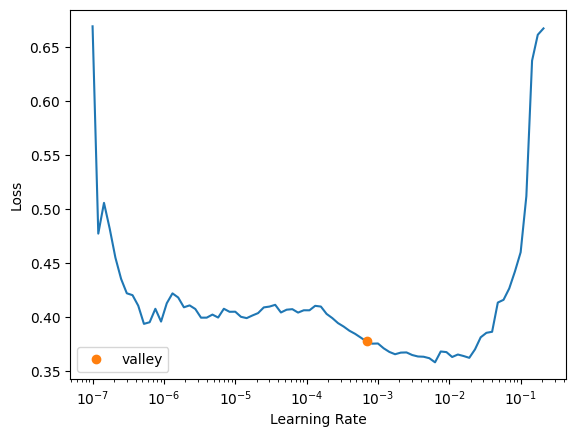

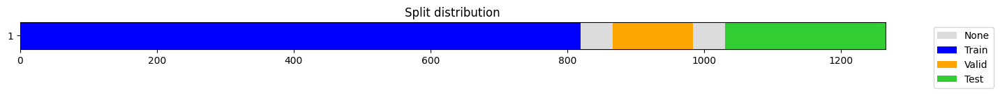

epoch,train_loss,valid_loss,mse,mae,time
0,0.381034,0.311650,0.311650,0.488401,00:00
1,0.331338,0.222546,0.222546,0.403021,00:00
2,0.297878,0.198327,0.198327,0.372024,00:00
3,0.272400,0.204817,0.204817,0.372557,00:00
4,0.255189,0.189973,0.189973,0.356102,00:00
5,0.236231,0.182013,0.182013,0.345479,00:00
6,0.221311,0.222894,0.222894,0.382034,00:00
7,0.200520,0.213010,0.213010,0.373216,00:00
8,0.183443,0.207640,0.207640,0.370938,00:00
9,0.170688,0.205387,0.205387,0.371278,00:00


[I 2024-12-14 15:10:44,303] Trial 399 finished with value: 0.20153072445146075 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 224, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


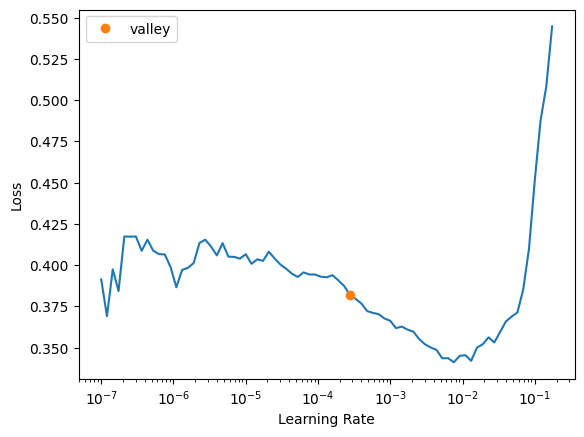

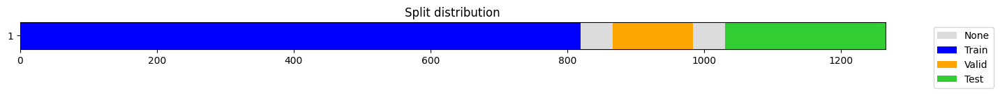

epoch,train_loss,valid_loss,mse,mae,time
0,0.377004,0.325385,0.325385,0.496833,00:00
1,0.337448,0.242806,0.242806,0.418473,00:00
2,0.299077,0.206994,0.206994,0.381904,00:00
3,0.276838,0.203884,0.203884,0.377526,00:00
4,0.263132,0.212328,0.212328,0.383234,00:00
5,0.255452,0.213413,0.213413,0.383451,00:00
6,0.247406,0.204845,0.204845,0.370071,00:00
7,0.242973,0.225644,0.225644,0.395338,00:00
8,0.236837,0.186350,0.186350,0.356166,00:00
9,0.227179,0.195969,0.195969,0.364581,00:00


[I 2024-12-14 15:10:58,082] Trial 400 finished with value: 0.19966022495017036 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 5}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


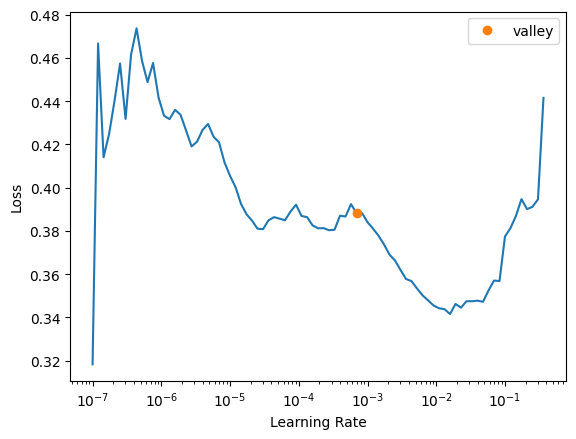

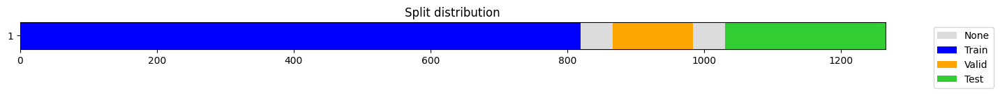

epoch,train_loss,valid_loss,mse,mae,time
0,0.378973,0.336675,0.336675,0.509629,00:00
1,0.347738,0.253153,0.253153,0.433175,00:00
2,0.312705,0.209436,0.209436,0.385841,00:00
3,0.285855,0.192893,0.192893,0.363011,00:00
4,0.267129,0.179990,0.179990,0.342145,00:00
5,0.250411,0.182398,0.182398,0.346956,00:00
6,0.233450,0.200039,0.200039,0.361097,00:00
7,0.216306,0.183906,0.183906,0.344404,00:00
8,0.196514,0.182562,0.182562,0.336114,00:00
9,0.176433,0.197851,0.197851,0.352036,00:00


[I 2024-12-14 15:11:06,135] Trial 401 finished with value: 0.20745523383013095 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 48, 'epochs': 20, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.0, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


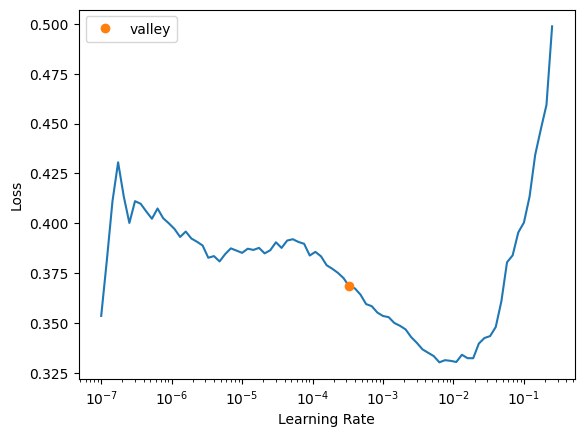

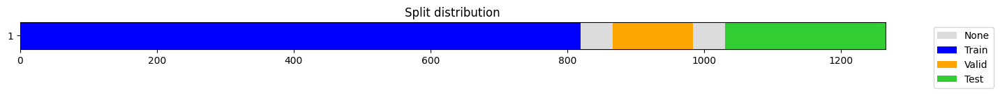

epoch,train_loss,valid_loss,mse,mae,time
0,0.356320,0.285450,0.285450,0.463688,00:00
1,0.306236,0.211048,0.211048,0.390032,00:00
2,0.274821,0.202831,0.202831,0.373552,00:00
3,0.255830,0.173599,0.173599,0.340717,00:00
4,0.233203,0.165177,0.165177,0.329311,00:00
5,0.216800,0.153166,0.153166,0.313434,00:00
6,0.197039,0.165740,0.165740,0.328069,00:00
7,0.183551,0.174636,0.174636,0.336859,00:00
8,0.173846,0.182238,0.182238,0.338759,00:00
9,0.166595,0.175982,0.175982,0.329207,00:00


[I 2024-12-14 15:11:23,486] Trial 402 finished with value: 0.15307579806417218 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 16, 'epochs': 20, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


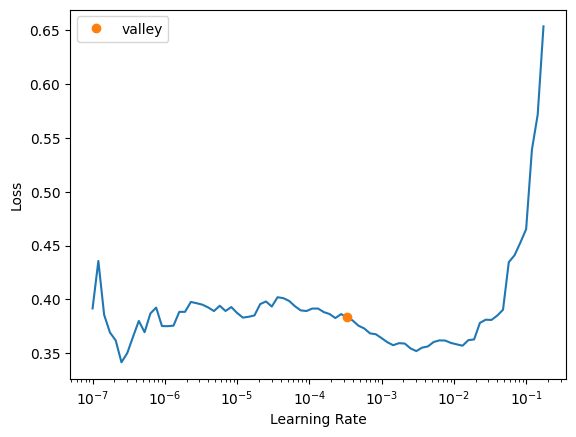

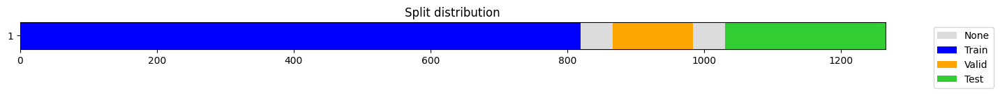

epoch,train_loss,valid_loss,mse,mae,time
0,0.326811,0.224938,0.224938,0.404632,00:00
1,0.288358,0.203961,0.203961,0.375135,00:00
2,0.261531,0.189578,0.189578,0.355429,00:00
3,0.250013,0.202860,0.202860,0.363598,00:00
4,0.232998,0.189599,0.189599,0.348147,00:00
5,0.211958,0.140549,0.140549,0.293454,00:00
6,0.188760,0.136117,0.136117,0.291572,00:00
7,0.176196,0.115181,0.115181,0.263510,00:00
8,0.159862,0.151012,0.151012,0.305277,00:00
9,0.144092,0.117358,0.117358,0.267907,00:00


[I 2024-12-14 15:11:35,706] Trial 403 finished with value: 0.13361206281261176 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


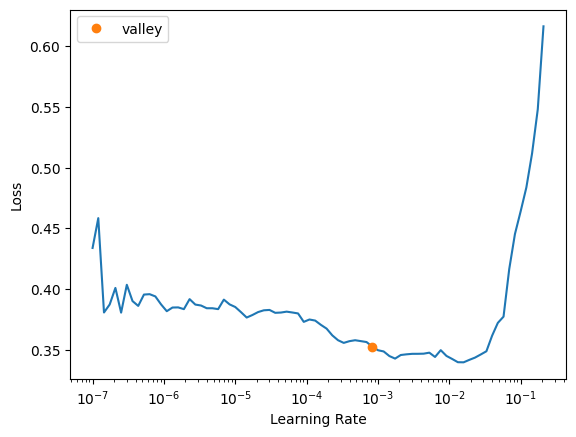

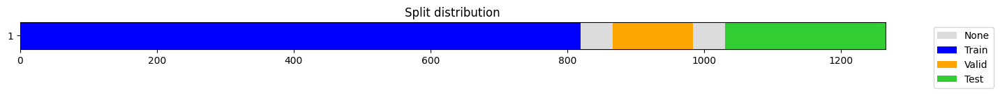

epoch,train_loss,valid_loss,mse,mae,time
0,0.346354,0.260404,0.260404,0.438926,00:00
1,0.298401,0.205868,0.205868,0.379431,00:00
2,0.271626,0.184270,0.184270,0.353131,00:00
3,0.250614,0.174060,0.174060,0.337836,00:00
4,0.234735,0.192051,0.192051,0.355065,00:00
5,0.215596,0.180278,0.180278,0.339139,00:00
6,0.200225,0.152321,0.152321,0.313420,00:00
7,0.179368,0.152688,0.152688,0.304699,00:00
8,0.166553,0.193437,0.193437,0.343350,00:00
9,0.153248,0.152555,0.152555,0.307592,00:00


[I 2024-12-14 15:11:47,863] Trial 404 finished with value: 0.16817417292914455 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 3}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


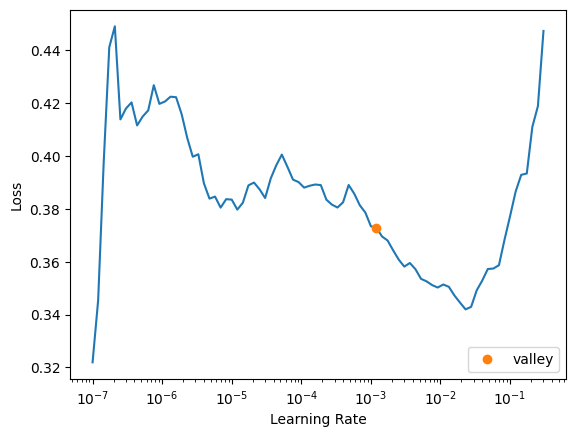

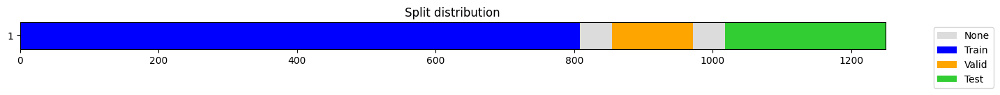

epoch,train_loss,valid_loss,mse,mae,time
0,0.380573,0.253302,0.253302,0.429228,00:00
1,0.306094,0.208374,0.208374,0.380335,00:00
2,0.269853,0.210306,0.210306,0.376562,00:00
3,0.238773,0.207366,0.207366,0.368346,00:00
4,0.215356,0.186817,0.186817,0.357320,00:00
5,0.194860,0.199811,0.199811,0.355529,00:00
6,0.176651,0.207326,0.207326,0.376181,00:00
7,0.160398,0.204943,0.204943,0.369146,00:00
8,0.147186,0.215173,0.215173,0.370853,00:00
9,0.140428,0.207773,0.207773,0.372507,00:00


[I 2024-12-14 15:12:01,016] Trial 405 finished with value: 0.2021070847139687 and parameters: {'fcst_history': 80, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 16, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (116, 1, 48)


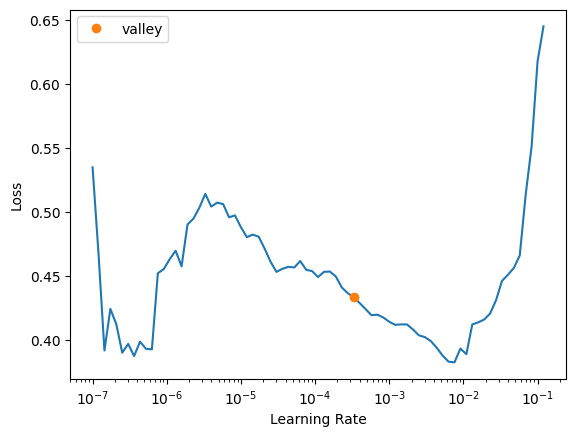

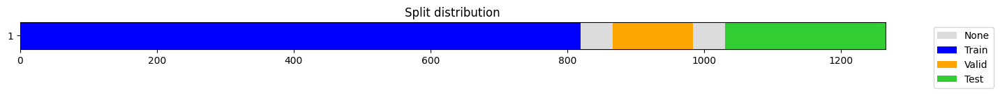

epoch,train_loss,valid_loss,mse,mae,time
0,0.389377,0.351069,0.351069,0.525352,00:00
1,0.373664,0.294938,0.294938,0.476594,00:00
2,0.348032,0.220362,0.220362,0.398956,00:00
3,0.324252,0.206583,0.206583,0.381911,00:00
4,0.303899,0.187097,0.187097,0.357587,00:00
5,0.287312,0.183247,0.183247,0.348629,00:00
6,0.273185,0.196930,0.196930,0.359620,00:00
7,0.261771,0.180048,0.180048,0.345890,00:00
8,0.251054,0.197441,0.197441,0.362640,00:00
9,0.242437,0.185026,0.185026,0.351546,00:00


[I 2024-12-14 15:12:05,404] Trial 406 finished with value: 0.169591971039518 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 112, 'epochs': 20, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 4}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


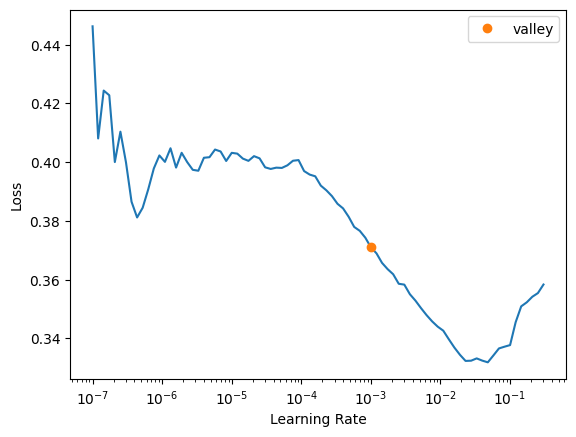

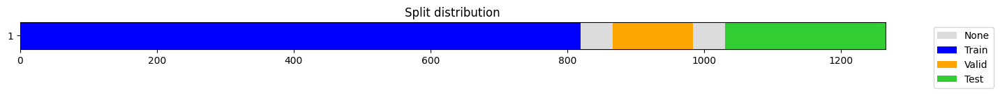

epoch,train_loss,valid_loss,mse,mae,time
0,0.336601,0.248313,0.248313,0.428127,00:00
1,0.293530,0.205360,0.205360,0.378038,00:00
2,0.268095,0.224901,0.224901,0.384317,00:00
3,0.254350,0.225940,0.225940,0.383173,00:00
4,0.239777,0.187523,0.187523,0.349488,00:00
5,0.218748,0.192202,0.192202,0.353385,00:00
6,0.195428,0.227393,0.227393,0.377298,00:00
7,0.182862,0.138272,0.138272,0.294644,00:00
8,0.165855,0.201214,0.201214,0.345805,00:00
9,0.159836,0.132375,0.132375,0.284692,00:00


[I 2024-12-14 15:12:16,782] Trial 407 finished with value: 0.17043073924277924 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


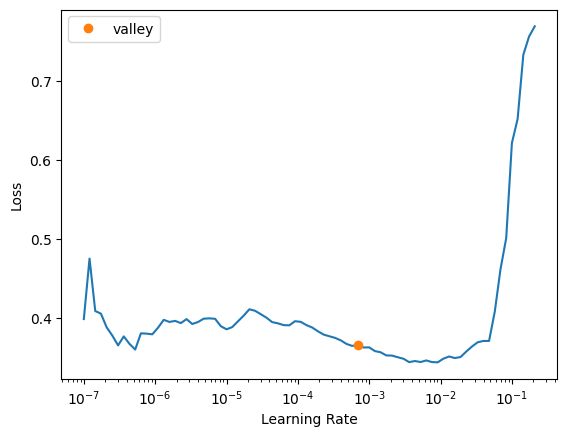

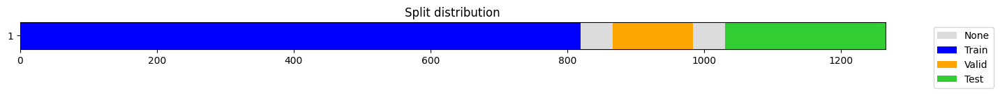

epoch,train_loss,valid_loss,mse,mae,time
0,0.329749,0.218121,0.218121,0.396276,00:00
1,0.286828,0.195177,0.195177,0.366295,00:00
2,0.259887,0.212095,0.212095,0.371120,00:00
3,0.240751,0.236076,0.236076,0.370905,00:00
4,0.214409,0.226212,0.226212,0.368243,00:00
5,0.189388,0.174953,0.174953,0.327477,00:00
6,0.165945,0.189796,0.189796,0.345029,00:00
7,0.152834,0.163087,0.163087,0.311897,00:00
8,0.140314,0.167393,0.167393,0.310075,00:00
9,0.128791,0.218612,0.218612,0.372811,00:00


[I 2024-12-14 15:12:27,951] Trial 408 finished with value: 0.16608422315836277 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 224, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


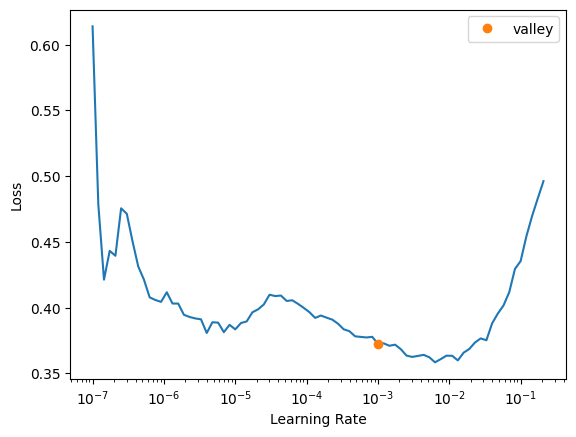

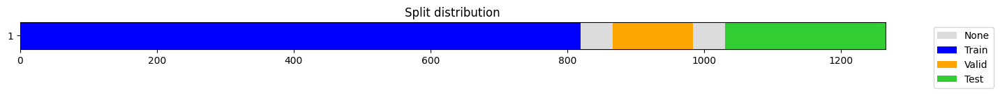

epoch,train_loss,valid_loss,mse,mae,time
0,0.334979,0.225307,0.225307,0.406321,00:00
1,0.290391,0.194153,0.194153,0.362933,00:00
2,0.267504,0.208849,0.208849,0.369184,00:00
3,0.248754,0.172412,0.172412,0.330734,00:00
4,0.231422,0.204125,0.204125,0.355500,00:00
5,0.210488,0.177491,0.177491,0.328312,00:00
6,0.196226,0.154104,0.154104,0.309482,00:00
7,0.176985,0.154764,0.154764,0.314416,00:00
8,0.165382,0.155706,0.155706,0.310526,00:00
9,0.159325,0.172256,0.172256,0.332916,00:00


[I 2024-12-14 15:12:39,154] Trial 409 finished with value: 0.1548882630927735 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 16, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


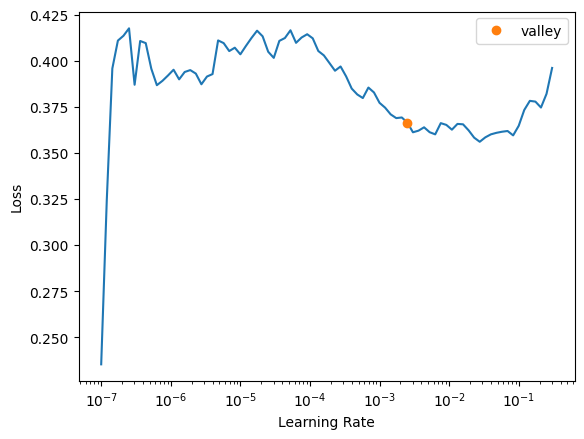

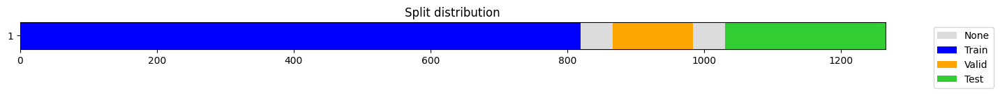

epoch,train_loss,valid_loss,mse,mae,time
0,0.381271,0.328888,0.328888,0.506023,00:00
1,0.348711,0.239695,0.239695,0.422819,00:00
2,0.314958,0.211932,0.211932,0.391461,00:00
3,0.288699,0.197986,0.197986,0.371385,00:00
4,0.269946,0.221620,0.221620,0.385309,00:00
5,0.256574,0.197226,0.197226,0.364491,00:00
6,0.245673,0.196546,0.196546,0.363110,00:00
7,0.236181,0.185259,0.185259,0.349791,00:00
8,0.228260,0.188503,0.188503,0.353553,00:00
9,0.219284,0.201470,0.201470,0.363652,00:00


[I 2024-12-14 15:12:47,945] Trial 410 finished with value: 0.19537569885979397 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


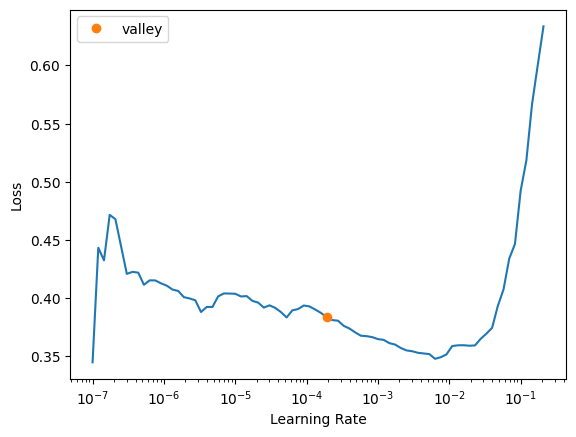

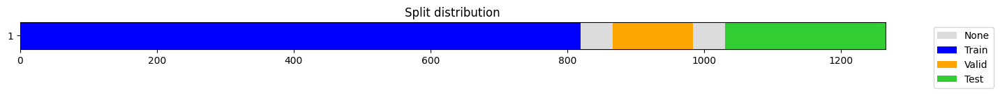

epoch,train_loss,valid_loss,mse,mae,time
0,0.388705,0.321039,0.321039,0.498690,00:00
1,0.340786,0.221195,0.221195,0.402021,00:00
2,0.304806,0.209981,0.209981,0.383612,00:00
3,0.281422,0.203322,0.203322,0.371805,00:00
4,0.264120,0.189220,0.189220,0.355394,00:00
5,0.251040,0.172703,0.172703,0.338581,00:00
6,0.240848,0.190913,0.190913,0.351925,00:00
7,0.227795,0.170476,0.170476,0.332311,00:00
8,0.222132,0.163728,0.163728,0.323626,00:00
9,0.212503,0.187214,0.187214,0.347359,00:00


[I 2024-12-14 15:12:56,691] Trial 411 finished with value: 0.1865526620580085 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


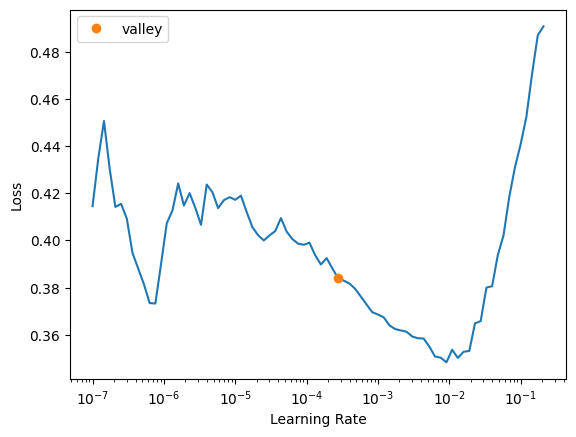

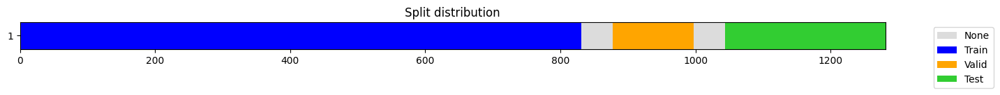

epoch,train_loss,valid_loss,mse,mae,time
0,0.326889,0.260793,0.260793,0.436691,00:00
1,0.286994,0.220840,0.220840,0.394079,00:00
2,0.265794,0.200067,0.200067,0.371168,00:00
3,0.254013,0.215402,0.215402,0.384346,00:00
4,0.242374,0.208431,0.208431,0.369708,00:00
5,0.232707,0.226513,0.226513,0.382209,00:00
6,0.222263,0.272883,0.272883,0.413143,00:00
7,0.211111,0.232263,0.232263,0.383730,00:00
8,0.206614,0.242603,0.242603,0.393905,00:00
9,0.196991,0.237529,0.237529,0.383191,00:00


[I 2024-12-14 15:13:05,237] Trial 412 finished with value: 0.24324473476089475 and parameters: {'fcst_history': 48, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 2, 'd_ff': 176, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (119, 1, 48)


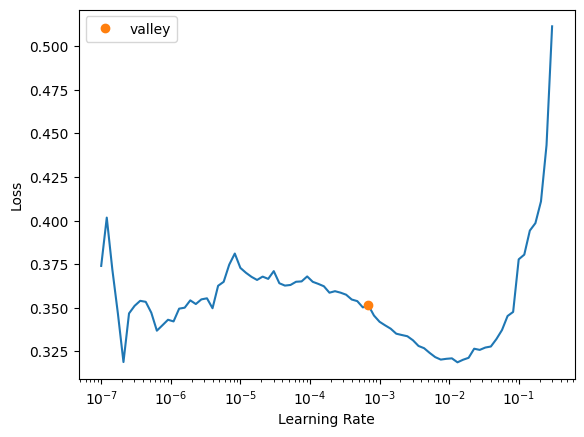

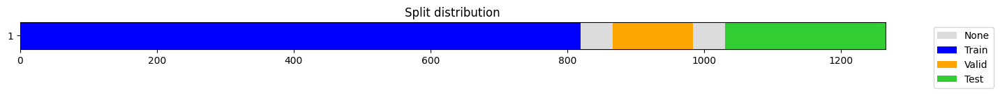

epoch,train_loss,valid_loss,mse,mae,time
0,0.366785,0.282375,0.282375,0.461732,00:00
1,0.323044,0.206699,0.206699,0.384406,00:00
2,0.294867,0.221276,0.221276,0.384358,00:00
3,0.273272,0.178041,0.178041,0.337411,00:00
4,0.255443,0.195870,0.195870,0.353661,00:00
5,0.238247,0.185012,0.185012,0.346317,00:00
6,0.219722,0.142166,0.142166,0.297994,00:00
7,0.201345,0.138581,0.138581,0.298925,00:00
8,0.182966,0.132631,0.132631,0.291545,00:00
9,0.168100,0.140539,0.140539,0.292364,00:00


[I 2024-12-14 15:13:12,448] Trial 413 finished with value: 0.14772382526707856 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 48, 'epochs': 20, 'n_layers': 3, 'd_ff': 160, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


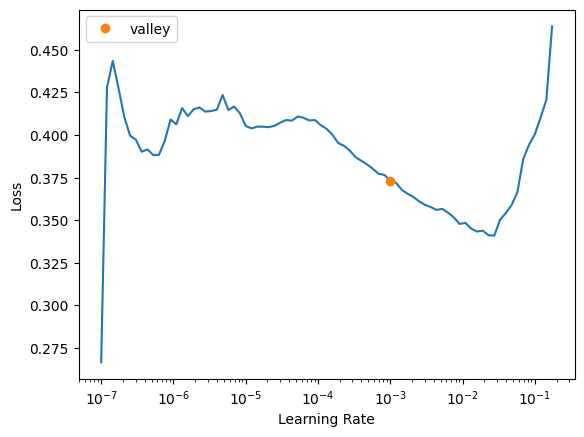

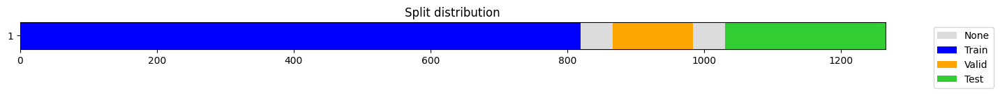

epoch,train_loss,valid_loss,mse,mae,time
0,0.367276,0.314994,0.314994,0.493204,00:00
1,0.331226,0.218175,0.218175,0.398252,00:00
2,0.300414,0.201007,0.201007,0.374297,00:00
3,0.278708,0.200176,0.200176,0.364751,00:00
4,0.260360,0.209010,0.209010,0.370737,00:00
5,0.242533,0.226245,0.226245,0.374366,00:00
6,0.224374,0.211311,0.211311,0.362786,00:00
7,0.208406,0.193976,0.193976,0.344368,00:00
8,0.194484,0.200525,0.200525,0.353960,00:00
9,0.184401,0.181612,0.181612,0.337539,00:00


[I 2024-12-14 15:13:19,878] Trial 414 finished with value: 0.1769043115079932 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


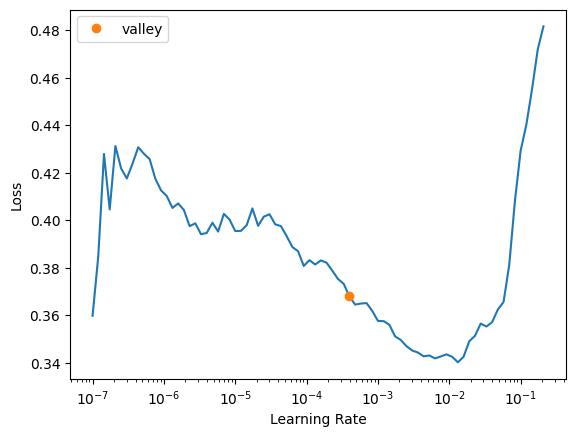

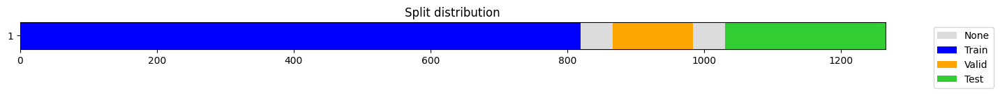

epoch,train_loss,valid_loss,mse,mae,time
0,0.364235,0.277579,0.277579,0.455244,00:00
1,0.316890,0.206169,0.206169,0.382614,00:00
2,0.287434,0.204113,0.204113,0.371942,00:00
3,0.264699,0.187282,0.187282,0.350794,00:00
4,0.246122,0.197041,0.197041,0.357451,00:00
5,0.228503,0.189509,0.189509,0.332534,00:00
6,0.210774,0.178079,0.178079,0.325027,00:00
7,0.191297,0.152860,0.152860,0.307407,00:00
8,0.177695,0.169749,0.169749,0.325668,00:00
9,0.167430,0.152433,0.152433,0.299578,00:00


[I 2024-12-14 15:13:28,842] Trial 415 finished with value: 0.1746165633634581 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


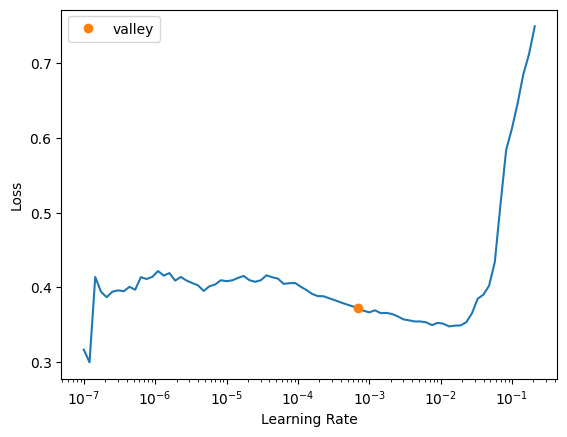

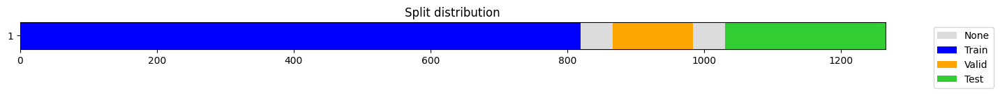

epoch,train_loss,valid_loss,mse,mae,time
0,0.295846,0.213872,0.213872,0.390776,00:00
1,0.263914,0.190477,0.190477,0.355067,00:00
2,0.246993,0.150898,0.150898,0.310564,00:00
3,0.228474,0.155431,0.155431,0.316969,00:00
4,0.222362,0.160745,0.160745,0.323840,00:00
5,0.201651,0.138557,0.138557,0.285968,00:00
6,0.181659,0.142020,0.142020,0.295785,00:00
7,0.163353,0.160586,0.160586,0.312708,00:00
8,0.149266,0.165133,0.165133,0.314151,00:00
9,0.142391,0.154988,0.154988,0.310028,00:00


[I 2024-12-14 15:13:44,623] Trial 416 finished with value: 0.15847026857496807 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 16, 'epochs': 20, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


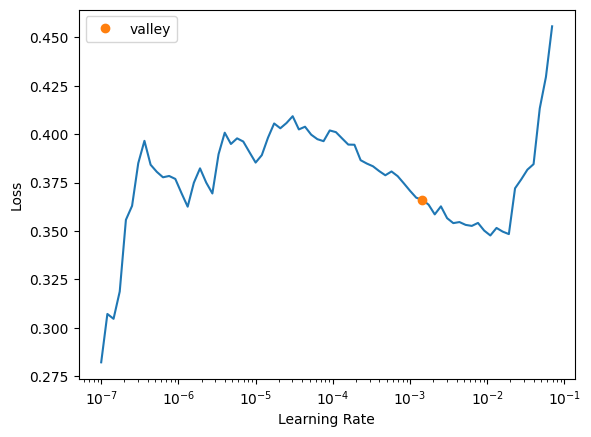

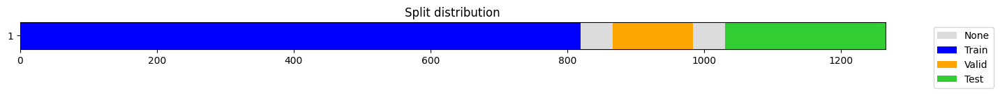

epoch,train_loss,valid_loss,mse,mae,time
0,0.363703,0.293325,0.293325,0.469721,00:00
1,0.318591,0.196812,0.196812,0.372366,00:00
2,0.290658,0.207630,0.207630,0.374485,00:00
3,0.271180,0.193611,0.193611,0.360513,00:00
4,0.253916,0.238207,0.238207,0.400138,00:00
5,0.235178,0.179959,0.179959,0.334525,00:00
6,0.219077,0.191176,0.191176,0.347830,00:00
7,0.206902,0.170376,0.170376,0.326261,00:00
8,0.193452,0.174854,0.174854,0.329415,00:00
9,0.182874,0.224162,0.224162,0.373347,00:00


[I 2024-12-14 15:13:53,766] Trial 417 finished with value: 0.17872474262307694 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 184, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


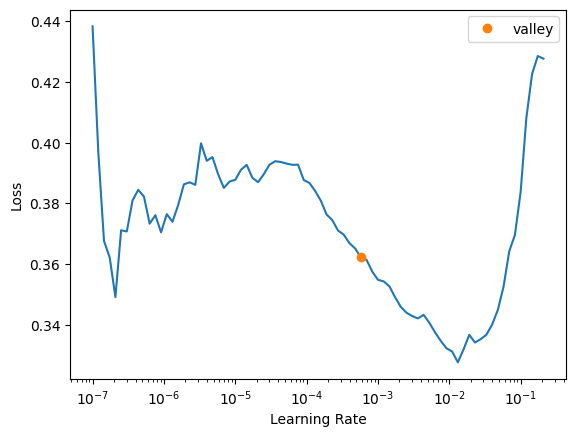

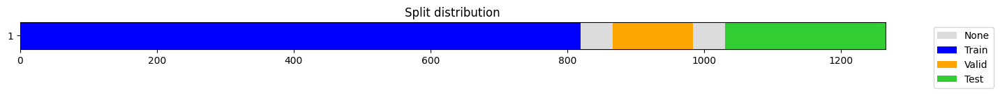

epoch,train_loss,valid_loss,mse,mae,time
0,0.363407,0.289234,0.289234,0.468792,00:00
1,0.317004,0.210190,0.210190,0.388454,00:00
2,0.282942,0.195291,0.195291,0.366263,00:00
3,0.259247,0.192070,0.192070,0.353149,00:00
4,0.244823,0.209223,0.209223,0.370019,00:00
5,0.223978,0.201029,0.201029,0.357927,00:00
6,0.204427,0.185024,0.185024,0.340777,00:00
7,0.188146,0.235849,0.235849,0.386894,00:00
8,0.176009,0.203730,0.203730,0.350872,00:00
9,0.164153,0.184235,0.184235,0.342064,00:00


[I 2024-12-14 15:14:07,542] Trial 418 finished with value: 0.18841320208417828 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 240, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


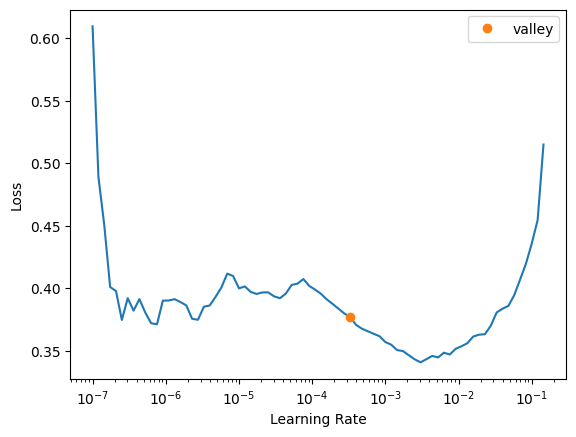

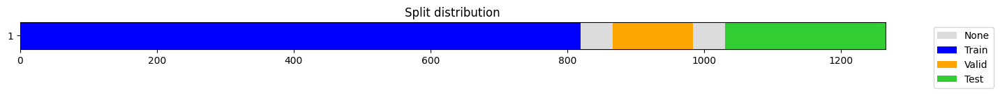

epoch,train_loss,valid_loss,mse,mae,time
0,0.352857,0.275783,0.275783,0.454417,00:00
1,0.307794,0.206798,0.206798,0.383903,00:00
2,0.283285,0.207916,0.207916,0.374913,00:00
3,0.263171,0.214386,0.214386,0.373579,00:00
4,0.241359,0.195446,0.195446,0.345076,00:00
5,0.220443,0.211484,0.211484,0.356385,00:00
6,0.202885,0.181404,0.181404,0.331500,00:00
7,0.190260,0.190405,0.190405,0.338818,00:00
8,0.177520,0.167930,0.167930,0.320984,00:00
9,0.168654,0.204738,0.204738,0.356025,00:00


[I 2024-12-14 15:14:16,614] Trial 419 finished with value: 0.16843000508374134 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 224, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


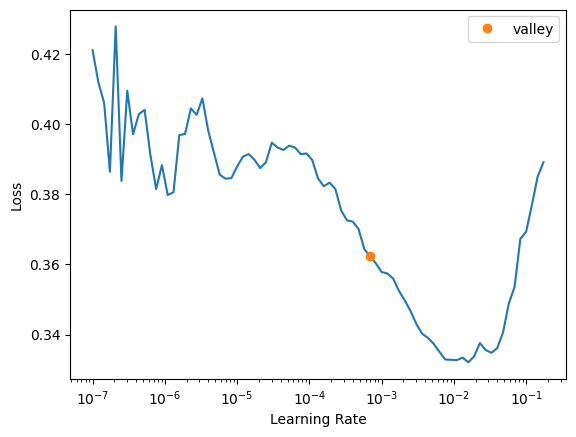

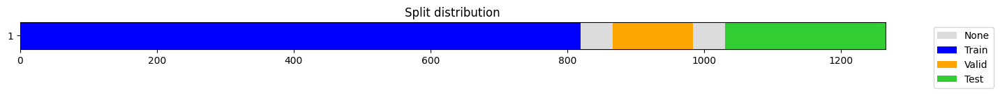

epoch,train_loss,valid_loss,mse,mae,time
0,0.380676,0.313622,0.313622,0.489385,00:00
1,0.330228,0.223281,0.223281,0.403846,00:00
2,0.295956,0.205547,0.205547,0.379754,00:00
3,0.271287,0.203291,0.203291,0.370716,00:00
4,0.254377,0.211220,0.211220,0.372173,00:00
5,0.241431,0.179882,0.179882,0.344224,00:00
6,0.231652,0.169995,0.169995,0.333718,00:00
7,0.222023,0.186587,0.186587,0.349162,00:00
8,0.211376,0.150630,0.150630,0.311496,00:00
9,0.204395,0.155414,0.155414,0.314499,00:00


[I 2024-12-14 15:14:27,804] Trial 420 finished with value: 0.16480925305878394 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


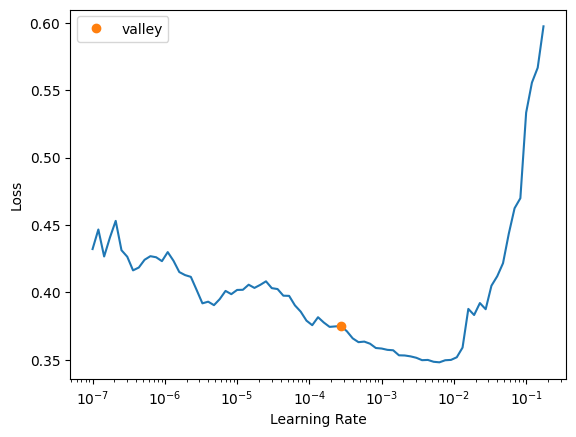

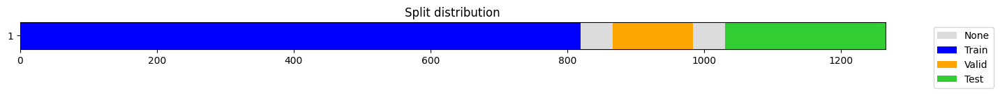

epoch,train_loss,valid_loss,mse,mae,time
0,0.317267,0.211149,0.211149,0.389425,00:00
1,0.281801,0.197258,0.197258,0.366688,00:00
2,0.258323,0.203268,0.203268,0.363278,00:00
3,0.234087,0.168137,0.168137,0.326367,00:00
4,0.215461,0.196190,0.196190,0.358541,00:00
5,0.194200,0.188006,0.188006,0.352899,00:00
6,0.177456,0.215448,0.215448,0.361195,00:00
7,0.164141,0.164499,0.164499,0.313015,00:00
8,0.158484,0.197712,0.197712,0.345522,00:00
9,0.145877,0.177554,0.177554,0.329751,00:00


[I 2024-12-14 15:14:39,067] Trial 421 finished with value: 0.15187152963000483 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


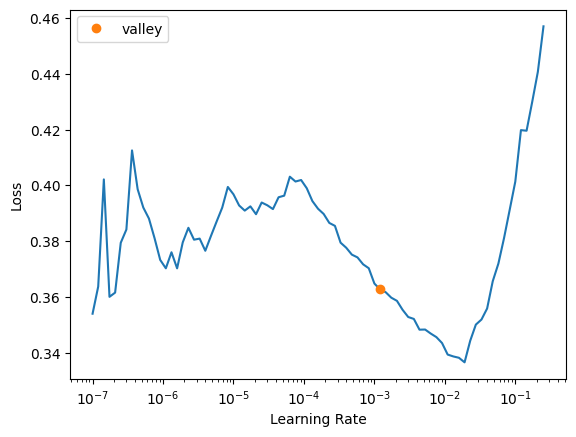

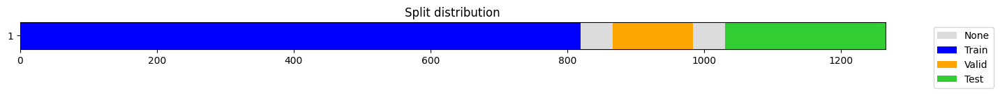

epoch,train_loss,valid_loss,mse,mae,time
0,0.344252,0.235785,0.235785,0.419016,00:00
1,0.302929,0.196322,0.196322,0.370083,00:00
2,0.277461,0.188432,0.188432,0.358240,00:00
3,0.254667,0.181899,0.181899,0.345302,00:00
4,0.232170,0.179018,0.179018,0.340197,00:00
5,0.206593,0.159341,0.159341,0.326226,00:00
6,0.185975,0.171633,0.171633,0.338553,00:00
7,0.170825,0.131743,0.131743,0.291907,00:00
8,0.156579,0.161571,0.161571,0.325469,00:00
9,0.146073,0.148540,0.148540,0.308545,00:00


[I 2024-12-14 15:14:46,152] Trial 422 finished with value: 0.14356734353586562 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.
[I 2024-12-14 15:14:46,255] Trial 423 pruned. 


scaled_preds.shape: (117, 1, 48)
Pruning trial: patch_len (0) is greater than fcst_history (80)


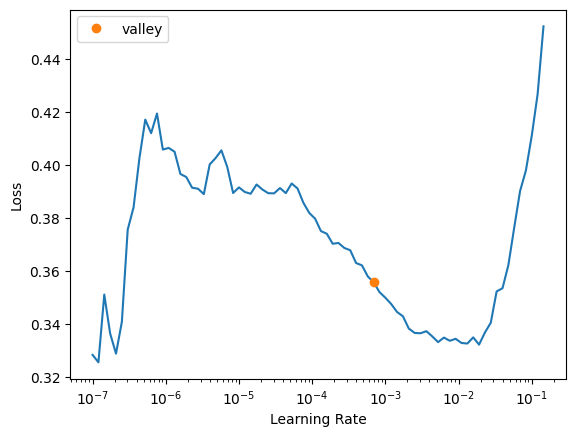

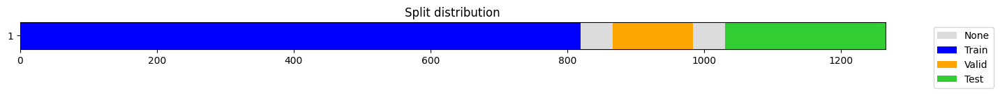

epoch,train_loss,valid_loss,mse,mae,time
0,0.347927,0.250396,0.250396,0.430169,00:00
1,0.301757,0.219508,0.219508,0.387118,00:00
2,0.271757,0.185118,0.185118,0.351546,00:00
3,0.251436,0.205608,0.205608,0.368334,00:00
4,0.226930,0.216104,0.216104,0.370326,00:00
5,0.198991,0.206965,0.206965,0.368263,00:00
6,0.179367,0.149265,0.149265,0.311840,00:00
7,0.157545,0.163522,0.163522,0.322573,00:00
8,0.141168,0.165399,0.165399,0.321892,00:00
9,0.128392,0.181951,0.181951,0.338025,00:00


[I 2024-12-14 15:14:53,422] Trial 424 finished with value: 0.17786407547422683 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.5, 'dropout': 0.1, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


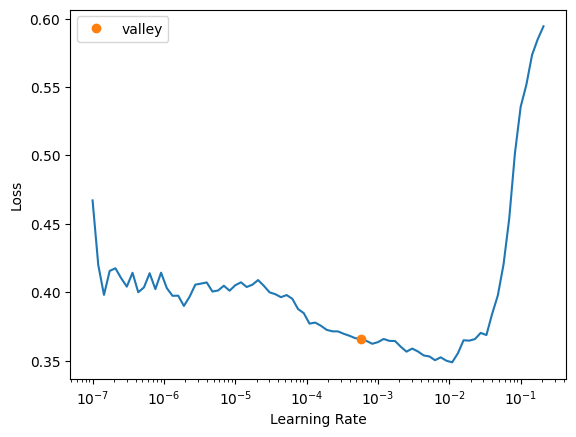

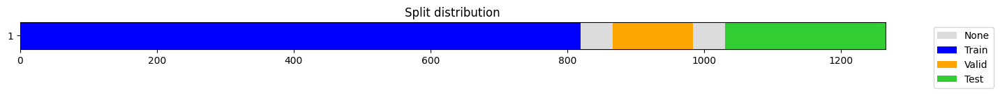

epoch,train_loss,valid_loss,mse,mae,time
0,0.378777,0.309677,0.309677,0.484369,00:00
1,0.327505,0.209905,0.209905,0.386638,00:00
2,0.294630,0.204938,0.204938,0.373629,00:00
3,0.273921,0.196376,0.196376,0.364372,00:00
4,0.257644,0.191010,0.191010,0.359435,00:00
5,0.243958,0.184057,0.184057,0.349322,00:00
6,0.229454,0.177632,0.177632,0.341067,00:00
7,0.216406,0.162616,0.162616,0.320618,00:00
8,0.202195,0.167013,0.167013,0.324985,00:00
9,0.192283,0.173127,0.173127,0.330689,00:00


[I 2024-12-14 15:15:01,412] Trial 425 finished with value: 0.17460540486920353 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


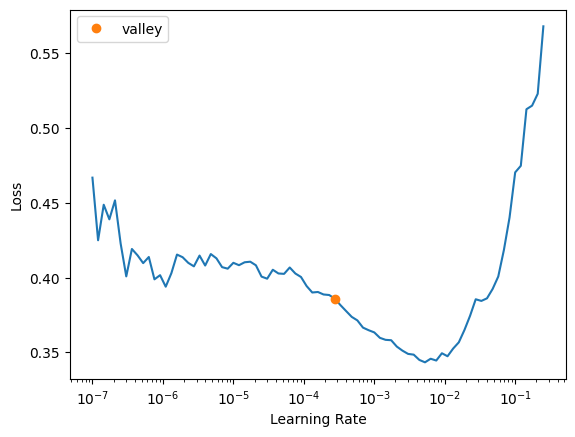

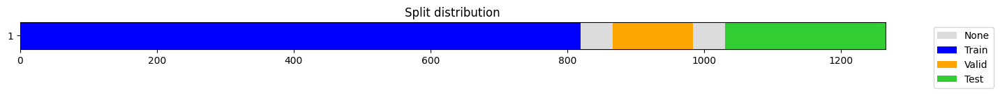

epoch,train_loss,valid_loss,mse,mae,time
0,0.389570,0.333315,0.333315,0.507998,00:00
1,0.347793,0.243227,0.243227,0.424441,00:00
2,0.311283,0.211487,0.211487,0.389782,00:00
3,0.285248,0.219026,0.219026,0.390660,00:00
4,0.269856,0.223946,0.223946,0.391191,00:00
5,0.259232,0.201010,0.201010,0.368263,00:00
6,0.247377,0.191566,0.191566,0.357752,00:00
7,0.237309,0.202383,0.202383,0.368795,00:00
8,0.229396,0.196379,0.196379,0.362025,00:00
9,0.221842,0.201995,0.201995,0.365802,00:00


[I 2024-12-14 15:15:09,037] Trial 426 finished with value: 0.20166164245139118 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 168, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


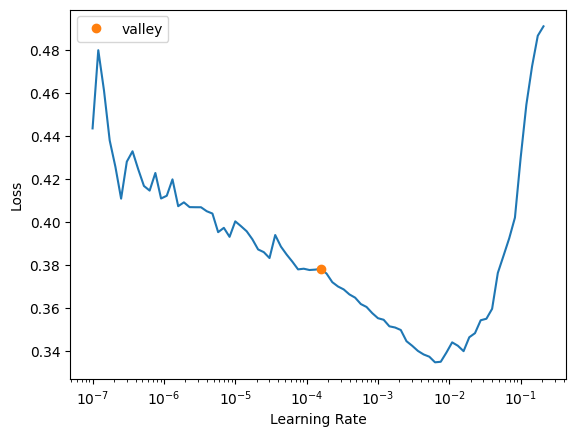

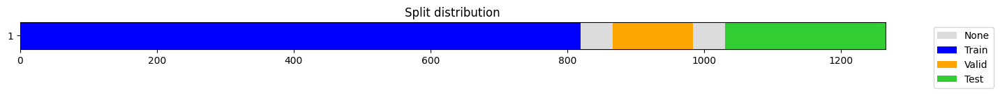

epoch,train_loss,valid_loss,mse,mae,time
0,0.360179,0.259192,0.259192,0.440867,00:00
1,0.308232,0.206670,0.206670,0.379291,00:00
2,0.278776,0.194465,0.194465,0.357390,00:00
3,0.258950,0.210332,0.210332,0.365038,00:00
4,0.234334,0.193469,0.193469,0.338458,00:00
5,0.213080,0.168132,0.168132,0.320010,00:00
6,0.196838,0.185571,0.185571,0.340232,00:00
7,0.181785,0.143451,0.143451,0.291292,00:00
8,0.171205,0.149691,0.149691,0.302068,00:00
9,0.160312,0.151173,0.151173,0.299828,00:00


[I 2024-12-14 15:15:15,677] Trial 427 finished with value: 0.14896331864156334 and parameters: {'fcst_history': 64, 'n_heads': 2, 'd_model': 40, 'patch_len': 16, 'batch_size': 40, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


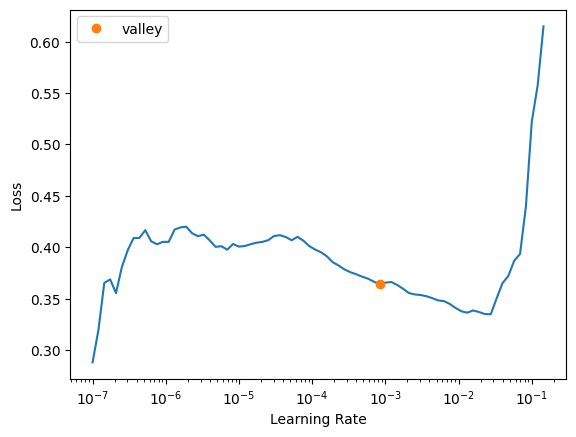

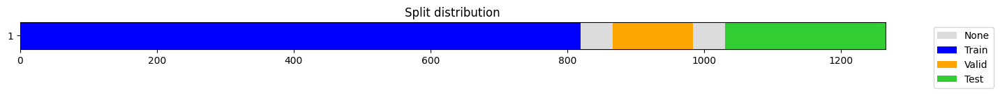

epoch,train_loss,valid_loss,mse,mae,time
0,0.358669,0.278930,0.278930,0.458114,00:00
1,0.314180,0.215974,0.215974,0.392687,00:00
2,0.283476,0.204726,0.204726,0.371313,00:00
3,0.265674,0.185119,0.185119,0.351383,00:00
4,0.248267,0.193251,0.193251,0.355723,00:00
5,0.234263,0.188481,0.188481,0.339539,00:00
6,0.218902,0.172560,0.172560,0.324311,00:00
7,0.203179,0.183757,0.183757,0.336203,00:00
8,0.188122,0.179991,0.179991,0.333942,00:00
9,0.175900,0.174662,0.174662,0.326597,00:00


[I 2024-12-14 15:15:23,445] Trial 428 finished with value: 0.1738914794551025 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.4, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


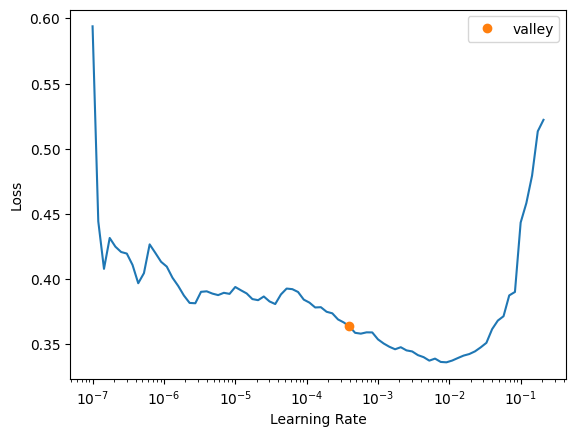

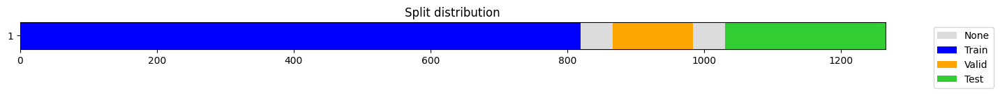

epoch,train_loss,valid_loss,mse,mae,time
0,0.368011,0.291018,0.291018,0.468841,00:00
1,0.315898,0.210015,0.210015,0.386778,00:00
2,0.287534,0.199376,0.199376,0.367411,00:00
3,0.265420,0.203097,0.203097,0.366886,00:00
4,0.248546,0.168989,0.168989,0.333197,00:00
5,0.231792,0.150121,0.150121,0.312035,00:00
6,0.217173,0.156077,0.156077,0.317919,00:00
7,0.203172,0.156677,0.156677,0.321196,00:00
8,0.192776,0.142206,0.142206,0.301810,00:00
9,0.183849,0.148325,0.148325,0.307294,00:00


[I 2024-12-14 15:15:30,544] Trial 429 finished with value: 0.14492572506483037 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 184, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


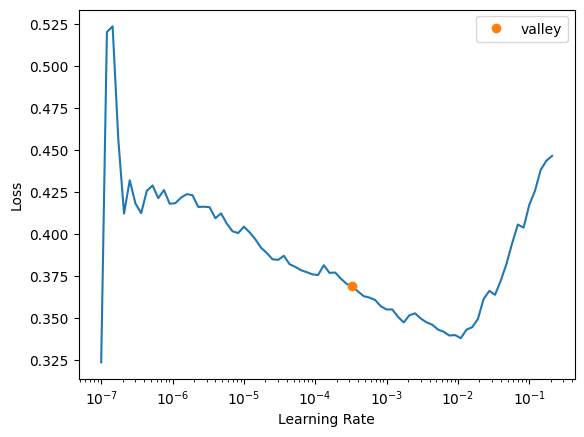

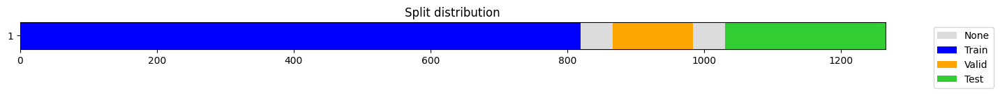

epoch,train_loss,valid_loss,mse,mae,time
0,0.321942,0.202186,0.202186,0.378609,00:00
1,0.277983,0.193835,0.193835,0.356594,00:00
2,0.256906,0.197998,0.197998,0.356644,00:00
3,0.235133,0.160600,0.160600,0.315753,00:00
4,0.210280,0.119528,0.119528,0.271723,00:00
5,0.191545,0.160652,0.160652,0.312515,00:00
6,0.169999,0.147934,0.147934,0.306598,00:00
7,0.154492,0.162276,0.162276,0.316311,00:00
8,0.138245,0.192861,0.192861,0.348476,00:00
9,0.129667,0.151575,0.151575,0.309960,00:00


[I 2024-12-14 15:15:39,401] Trial 430 finished with value: 0.1388271927833194 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


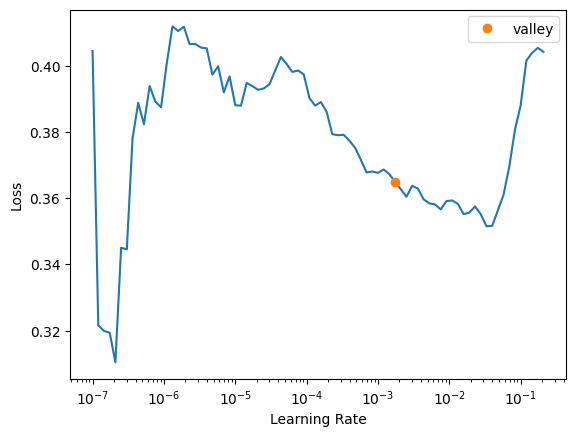

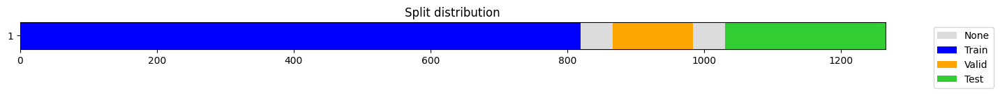

epoch,train_loss,valid_loss,mse,mae,time
0,0.314908,0.209232,0.209232,0.385961,00:00
1,0.278349,0.191005,0.191005,0.356459,00:00
2,0.259325,0.180012,0.180012,0.337663,00:00
3,0.234630,0.161314,0.161314,0.314098,00:00
4,0.213930,0.143417,0.143417,0.298476,00:00
5,0.197493,0.175281,0.175281,0.332303,00:00
6,0.183538,0.143068,0.143068,0.300234,00:00
7,0.168959,0.183241,0.183241,0.328539,00:00
8,0.159691,0.152945,0.152945,0.310486,00:00
9,0.148395,0.203809,0.203809,0.350161,00:00


[I 2024-12-14 15:15:48,551] Trial 431 finished with value: 0.15226758177146196 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 232, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


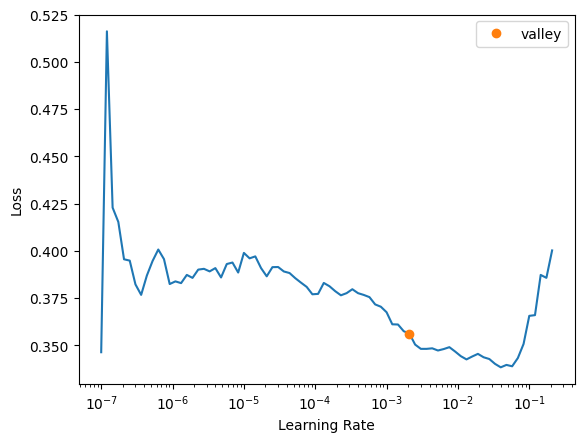

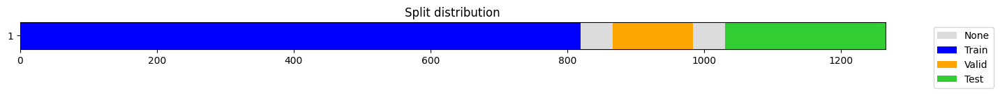

epoch,train_loss,valid_loss,mse,mae,time
0,0.330786,0.217429,0.217429,0.396870,00:00
1,0.290951,0.217284,0.217284,0.384269,00:00
2,0.268781,0.195530,0.195530,0.360002,00:00
3,0.251296,0.192326,0.192326,0.349340,00:00
4,0.218881,0.252322,0.252322,0.394970,00:00
5,0.191039,0.193444,0.193444,0.351932,00:00
6,0.167829,0.178709,0.178709,0.332994,00:00
7,0.148346,0.192691,0.192691,0.346542,00:00
8,0.140515,0.158314,0.158314,0.319947,00:00
9,0.130774,0.165507,0.165507,0.325053,00:00


[I 2024-12-14 15:15:57,395] Trial 432 finished with value: 0.17028300051996073 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


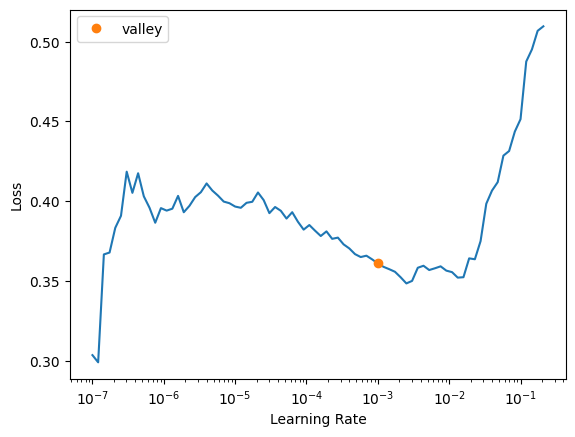

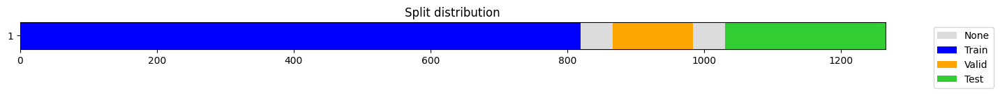

epoch,train_loss,valid_loss,mse,mae,time
0,0.364837,0.285928,0.285928,0.466112,00:00
1,0.317038,0.222295,0.222295,0.399992,00:00
2,0.283283,0.199550,0.199550,0.370003,00:00
3,0.260801,0.174939,0.174939,0.340887,00:00
4,0.247245,0.179206,0.179206,0.342831,00:00
5,0.230562,0.201499,0.201499,0.360968,00:00
6,0.219441,0.186177,0.186177,0.342582,00:00
7,0.207519,0.184602,0.184602,0.340525,00:00
8,0.195299,0.176763,0.176763,0.332093,00:00
9,0.183655,0.183505,0.183505,0.338465,00:00


[I 2024-12-14 15:16:06,237] Trial 433 finished with value: 0.18455401102537425 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 128, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


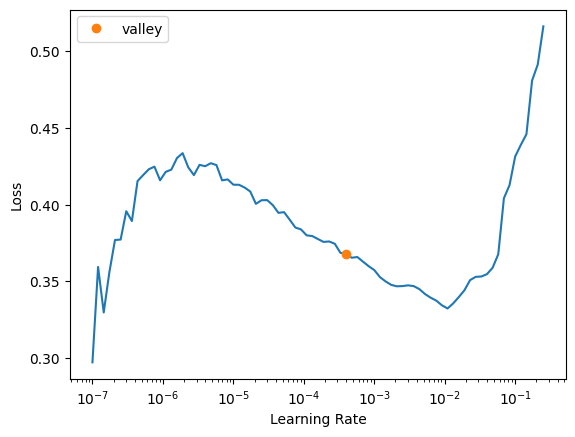

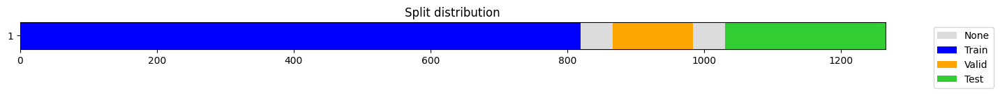

epoch,train_loss,valid_loss,mse,mae,time
0,0.348245,0.246217,0.246217,0.427170,00:00
1,0.298031,0.207000,0.207000,0.376819,00:00
2,0.270161,0.213835,0.213835,0.373157,00:00
3,0.253130,0.191957,0.191957,0.356357,00:00
4,0.234786,0.190730,0.190730,0.355240,00:00
5,0.211879,0.160622,0.160622,0.316721,00:00
6,0.192714,0.151810,0.151810,0.307152,00:00
7,0.176138,0.163714,0.163714,0.323965,00:00
8,0.163616,0.151822,0.151822,0.305836,00:00
9,0.145953,0.156440,0.156440,0.311761,00:00


[I 2024-12-14 15:16:15,070] Trial 434 finished with value: 0.1576323410986606 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


[I 2024-12-14 15:16:15,293] Trial 435 pruned. 


Pruning trial: d_model (32) is not divisible by n_heads (3)


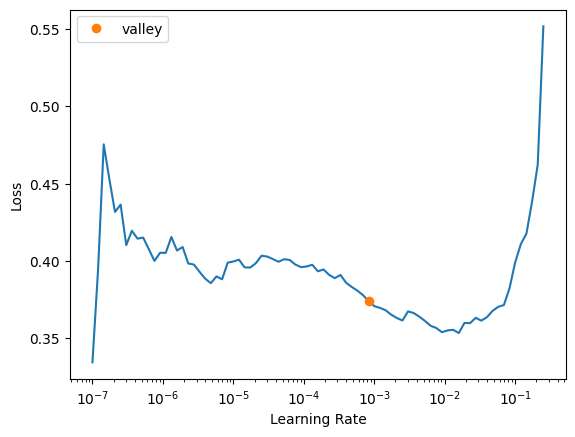

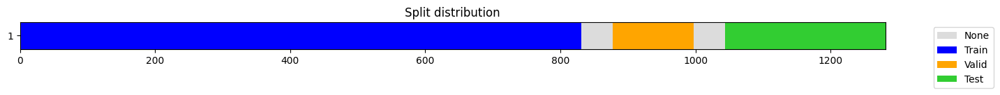

epoch,train_loss,valid_loss,mse,mae,time
0,0.297093,0.215367,0.215367,0.392508,00:00
1,0.266942,0.200673,0.200673,0.368763,00:00
2,0.246747,0.266840,0.266840,0.424181,00:00
3,0.231259,0.271648,0.271648,0.403477,00:00
4,0.219145,0.293985,0.293985,0.427386,00:00
5,0.199003,0.239352,0.239352,0.385634,00:00
6,0.180085,0.208016,0.208016,0.355895,00:00
7,0.170997,0.281810,0.281810,0.420754,00:00
8,0.158979,0.229467,0.229467,0.369412,00:00
9,0.147295,0.268218,0.268218,0.394908,00:00


[I 2024-12-14 15:16:24,079] Trial 436 finished with value: 0.260294033432317 and parameters: {'fcst_history': 48, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 112, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (119, 1, 48)


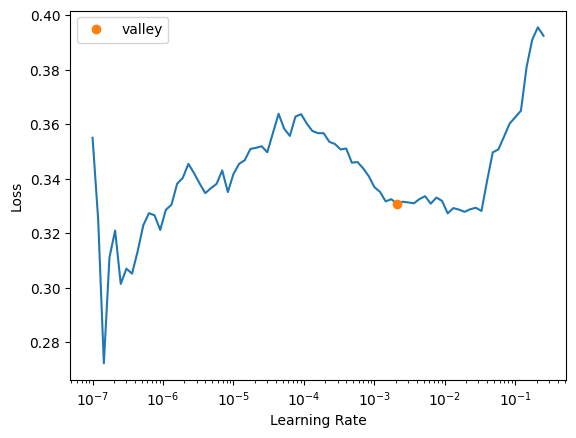

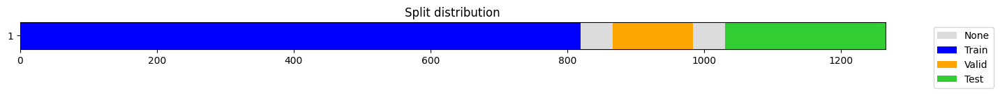

epoch,train_loss,valid_loss,mse,mae,time
0,0.344931,0.243502,0.243502,0.424298,00:00
1,0.299007,0.207198,0.207198,0.378919,00:00
2,0.268913,0.205334,0.205334,0.370578,00:00
3,0.254488,0.194462,0.194462,0.352226,00:00
4,0.233654,0.195765,0.195765,0.350162,00:00
5,0.211240,0.201035,0.201035,0.350013,00:00
6,0.188466,0.179917,0.179917,0.332632,00:00
7,0.170545,0.218835,0.218835,0.365497,00:00
8,0.155428,0.168990,0.168990,0.322314,00:00
9,0.145059,0.173390,0.173390,0.329039,00:00


[I 2024-12-14 15:16:33,168] Trial 437 finished with value: 0.19056712874380732 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.1, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


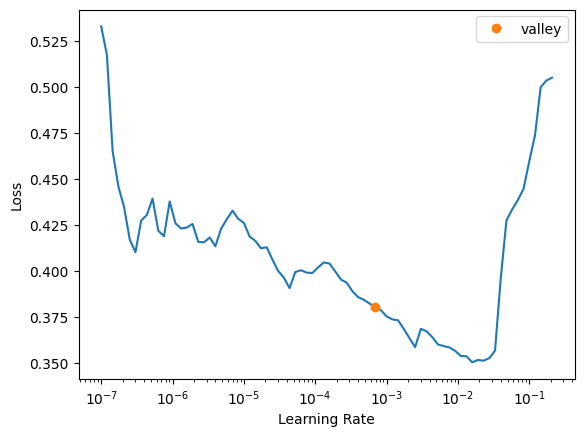

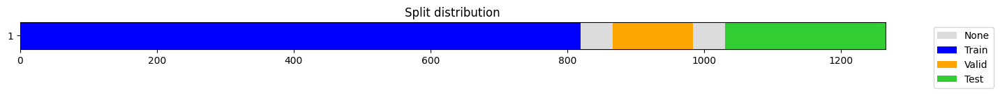

epoch,train_loss,valid_loss,mse,mae,time
0,0.372210,0.291667,0.291667,0.470061,00:00
1,0.324187,0.212762,0.212762,0.389423,00:00
2,0.290403,0.195500,0.195500,0.364754,00:00
3,0.268252,0.179539,0.179539,0.345600,00:00
4,0.252014,0.173876,0.173876,0.337961,00:00
5,0.237932,0.171542,0.171542,0.335240,00:00
6,0.225364,0.164979,0.164979,0.326710,00:00
7,0.210785,0.169022,0.169022,0.329928,00:00
8,0.198002,0.180034,0.180034,0.338874,00:00
9,0.189005,0.180642,0.180642,0.335489,00:00


[I 2024-12-14 15:16:40,214] Trial 438 finished with value: 0.18680031157345175 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


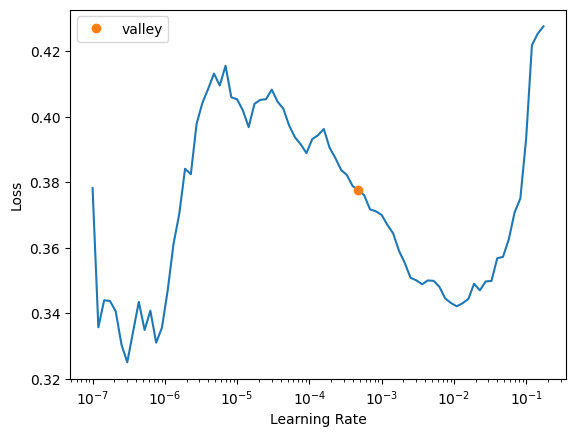

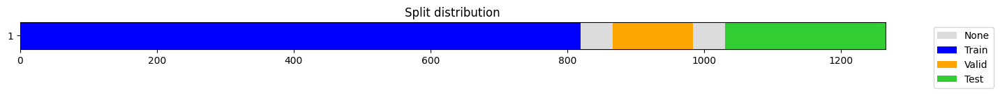

epoch,train_loss,valid_loss,mse,mae,time
0,0.348585,0.248751,0.248751,0.427324,00:00
1,0.297319,0.196002,0.196002,0.370749,00:00
2,0.272681,0.219000,0.219000,0.383400,00:00
3,0.251810,0.202547,0.202547,0.366079,00:00
4,0.230232,0.189094,0.189094,0.339963,00:00
5,0.210645,0.193916,0.193916,0.355609,00:00
6,0.196486,0.162231,0.162231,0.325593,00:00
7,0.180484,0.164409,0.164409,0.324070,00:00
8,0.168458,0.163181,0.163181,0.325866,00:00
9,0.159280,0.157840,0.157840,0.319327,00:00


[I 2024-12-14 15:16:49,074] Trial 439 finished with value: 0.14779120784497787 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


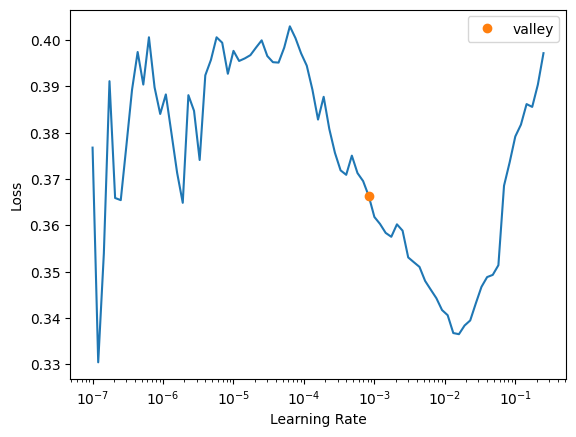

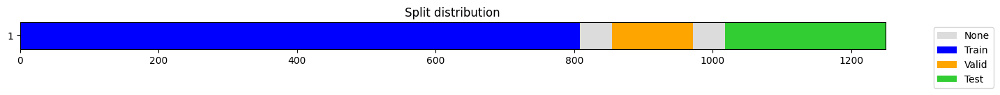

epoch,train_loss,valid_loss,mse,mae,time
0,0.341609,0.211566,0.211566,0.385492,00:00
1,0.301106,0.222738,0.222738,0.386674,00:00
2,0.268683,0.211004,0.211004,0.364512,00:00
3,0.239073,0.151403,0.151403,0.314422,00:00
4,0.209628,0.154462,0.154462,0.311372,00:00
5,0.179332,0.141520,0.141520,0.303311,00:00
6,0.161467,0.160320,0.160320,0.319713,00:00
7,0.145051,0.157279,0.157279,0.318428,00:00
8,0.130867,0.146221,0.146221,0.309480,00:00
9,0.124408,0.148377,0.148377,0.305077,00:00


[I 2024-12-14 15:16:57,733] Trial 440 finished with value: 0.14591040716992282 and parameters: {'fcst_history': 80, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (116, 1, 48)


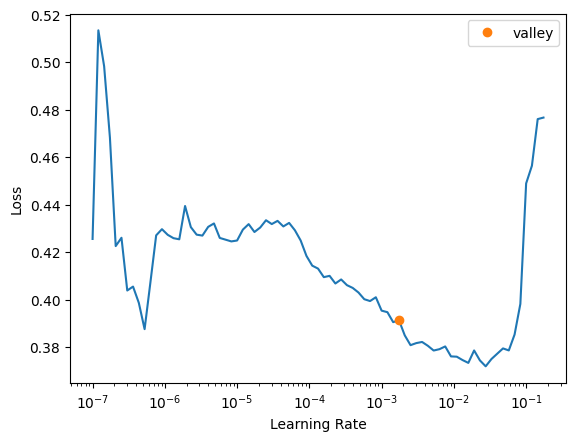

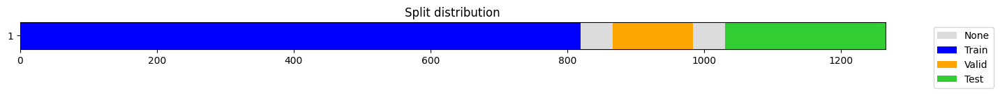

epoch,train_loss,valid_loss,mse,mae,time
0,0.360544,0.288297,0.288297,0.465821,00:00
1,0.316397,0.202270,0.202270,0.379747,00:00
2,0.288252,0.202151,0.202151,0.372508,00:00
3,0.266169,0.194593,0.194593,0.353911,00:00
4,0.246044,0.219867,0.219867,0.376568,00:00
5,0.227363,0.195477,0.195477,0.349934,00:00
6,0.207635,0.203179,0.203179,0.352105,00:00
7,0.195425,0.187480,0.187480,0.340500,00:00
8,0.184828,0.181515,0.181515,0.337401,00:00
9,0.177504,0.190698,0.190698,0.346975,00:00


[I 2024-12-14 15:17:04,845] Trial 441 finished with value: 0.18131500371981202 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 224, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


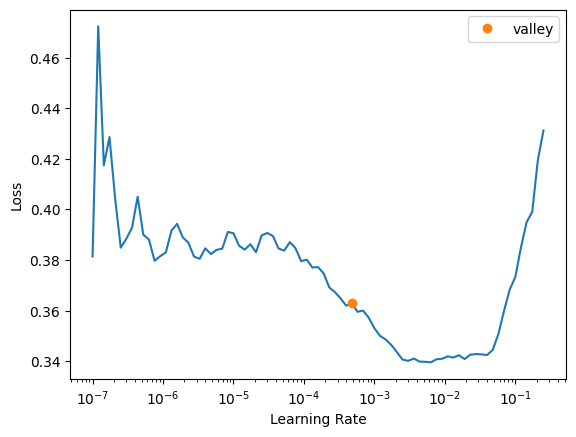

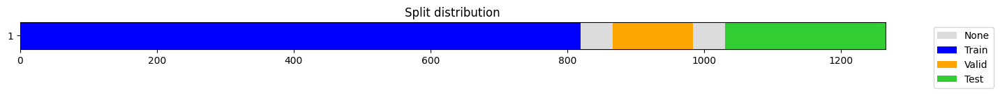

epoch,train_loss,valid_loss,mse,mae,time
0,0.328315,0.211695,0.211695,0.390045,00:00
1,0.281671,0.233796,0.233796,0.396942,00:00
2,0.254189,0.180118,0.180118,0.342072,00:00
3,0.233399,0.169787,0.169787,0.332665,00:00
4,0.211725,0.161040,0.161040,0.317793,00:00
5,0.191965,0.174613,0.174613,0.328663,00:00
6,0.178123,0.155643,0.155643,0.314009,00:00
7,0.166205,0.157511,0.157511,0.312592,00:00
8,0.155657,0.158510,0.158510,0.313626,00:00
9,0.148829,0.160546,0.160546,0.315995,00:00


[I 2024-12-14 15:17:11,617] Trial 442 finished with value: 0.16054611601932656 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 10, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


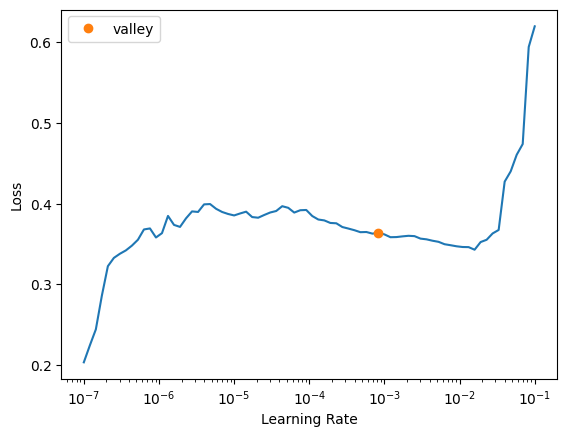

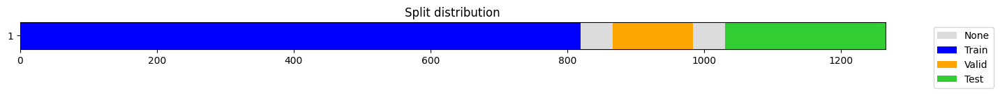

epoch,train_loss,valid_loss,mse,mae,time
0,0.338614,0.227279,0.227279,0.408281,00:00
1,0.298304,0.189042,0.189042,0.356828,00:00
2,0.271685,0.195776,0.195776,0.354799,00:00
3,0.250981,0.218526,0.218526,0.372906,00:00
4,0.231436,0.223826,0.223826,0.369224,00:00
5,0.211443,0.224029,0.224029,0.379643,00:00
6,0.189250,0.190435,0.190435,0.342691,00:00
7,0.171869,0.211455,0.211455,0.364688,00:00
8,0.158008,0.193102,0.193102,0.348097,00:00
9,0.149014,0.222447,0.222447,0.371006,00:00


[I 2024-12-14 15:17:19,526] Trial 443 finished with value: 0.1951500942119215 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 152, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


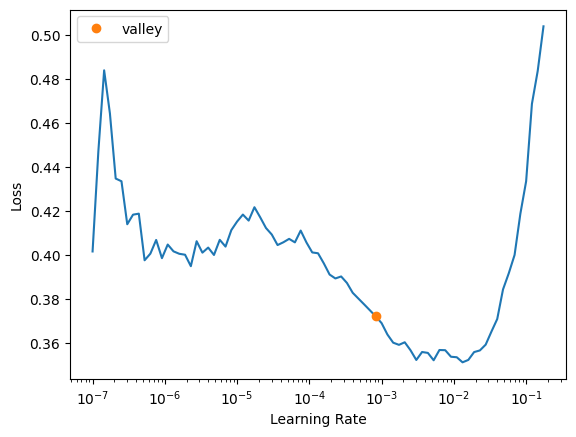

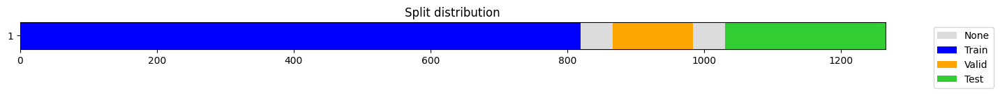

epoch,train_loss,valid_loss,mse,mae,time
0,0.375925,0.301367,0.301367,0.476301,00:00
1,0.322108,0.210833,0.210833,0.388039,00:00
2,0.287757,0.220007,0.220007,0.388935,00:00
3,0.268238,0.182906,0.182906,0.349451,00:00
4,0.249422,0.184096,0.184096,0.350897,00:00
5,0.234347,0.192224,0.192224,0.356385,00:00
6,0.217976,0.170716,0.170716,0.335253,00:00
7,0.204144,0.178676,0.178676,0.341446,00:00
8,0.191069,0.175727,0.175727,0.338923,00:00
9,0.173446,0.192591,0.192591,0.353871,00:00


[I 2024-12-14 15:17:29,205] Trial 444 finished with value: 0.18844375726031934 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


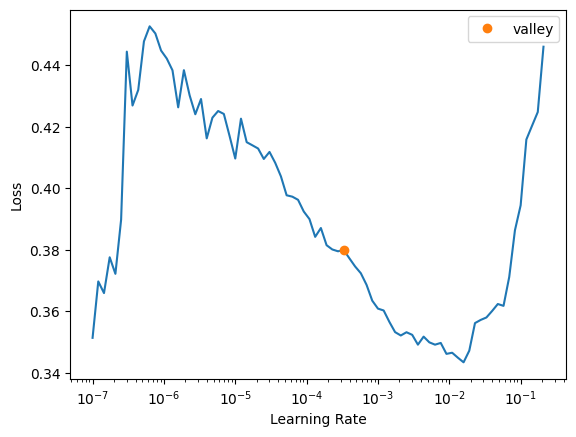

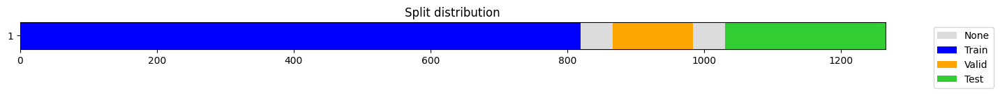

epoch,train_loss,valid_loss,mse,mae,time
0,0.377235,0.305607,0.305607,0.481963,00:00
1,0.330565,0.210196,0.210196,0.388305,00:00
2,0.298663,0.213523,0.213523,0.383232,00:00
3,0.274637,0.196620,0.196620,0.362420,00:00
4,0.257754,0.194392,0.194392,0.358432,00:00
5,0.240795,0.179767,0.179767,0.339239,00:00
6,0.227916,0.210642,0.210642,0.369796,00:00
7,0.209762,0.208487,0.208487,0.364335,00:00
8,0.196887,0.189288,0.189288,0.343127,00:00
9,0.184161,0.180576,0.180576,0.336720,00:00


[I 2024-12-14 15:17:38,852] Trial 445 finished with value: 0.18120858418484598 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.4, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


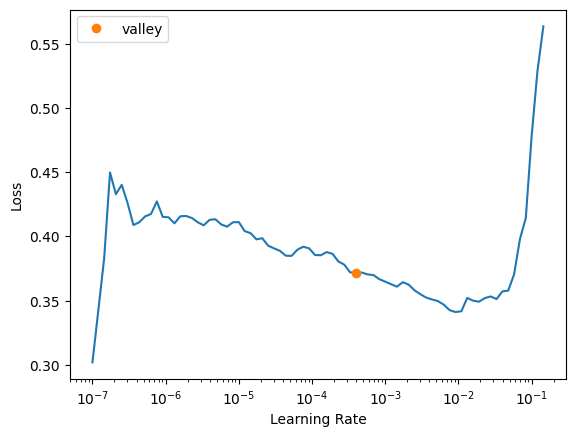

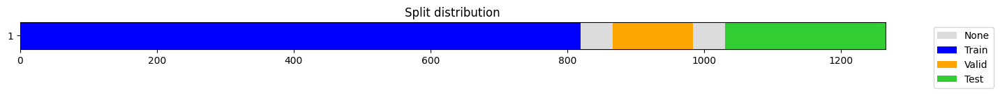

epoch,train_loss,valid_loss,mse,mae,time
0,0.355188,0.271147,0.271147,0.450946,00:00
1,0.307925,0.222667,0.222667,0.398892,00:00
2,0.279853,0.183186,0.183186,0.350927,00:00
3,0.262792,0.206654,0.206654,0.366079,00:00
4,0.240465,0.191244,0.191244,0.340809,00:00
5,0.218823,0.237744,0.237744,0.385853,00:00
6,0.202963,0.277278,0.277278,0.419931,00:00
7,0.190129,0.155664,0.155664,0.311325,00:00
8,0.176740,0.168357,0.168357,0.326249,00:00
9,0.161126,0.161458,0.161458,0.319330,00:00


[I 2024-12-14 15:17:50,303] Trial 446 finished with value: 0.16884673051229604 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 224, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


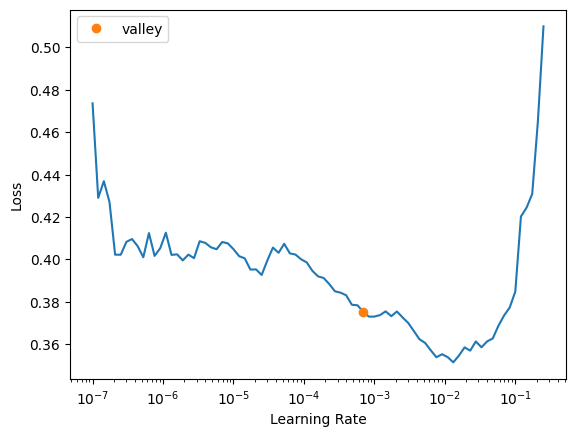

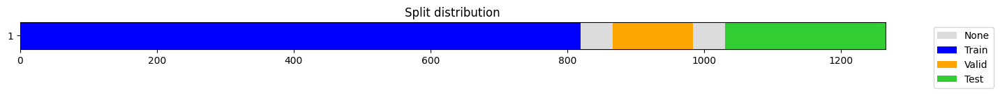

epoch,train_loss,valid_loss,mse,mae,time
0,0.370424,0.302206,0.302206,0.480268,00:00
1,0.326186,0.205699,0.205699,0.383615,00:00
2,0.294615,0.188940,0.188940,0.361150,00:00
3,0.272076,0.187100,0.187100,0.354381,00:00
4,0.255875,0.189388,0.189388,0.355122,00:00
5,0.237090,0.225753,0.225753,0.386130,00:00
6,0.220482,0.187320,0.187320,0.345460,00:00
7,0.204818,0.196990,0.196990,0.355251,00:00
8,0.187680,0.240144,0.240144,0.388820,00:00
9,0.171899,0.171626,0.171626,0.326417,00:00


[I 2024-12-14 15:18:01,051] Trial 447 finished with value: 0.17621176396903687 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 4, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


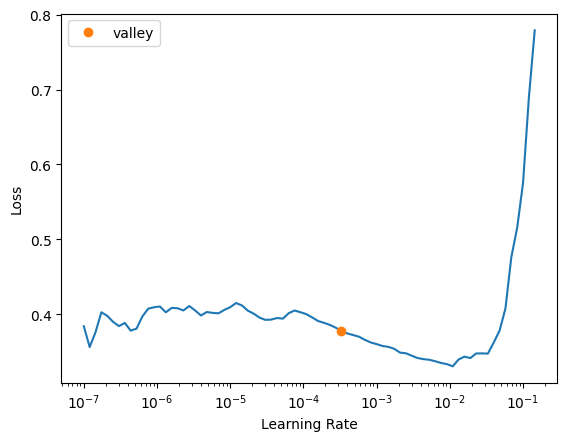

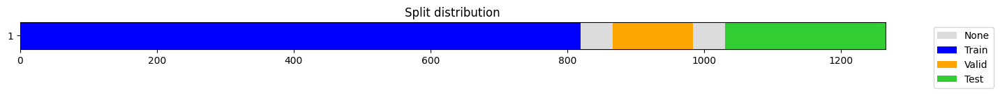

epoch,train_loss,valid_loss,mse,mae,time
0,0.363957,0.299270,0.299270,0.478038,00:00
1,0.318997,0.215977,0.215977,0.393929,00:00
2,0.283162,0.192902,0.192902,0.362720,00:00
3,0.261554,0.199508,0.199508,0.363664,00:00
4,0.247558,0.218982,0.218982,0.386111,00:00
5,0.228022,0.162526,0.162526,0.324400,00:00
6,0.206049,0.193291,0.193291,0.353498,00:00
7,0.185627,0.176819,0.176819,0.335633,00:00
8,0.169001,0.141752,0.141752,0.298499,00:00
9,0.156802,0.174070,0.174070,0.329015,00:00


[I 2024-12-14 15:18:15,158] Trial 448 finished with value: 0.16897969406780378 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.1, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


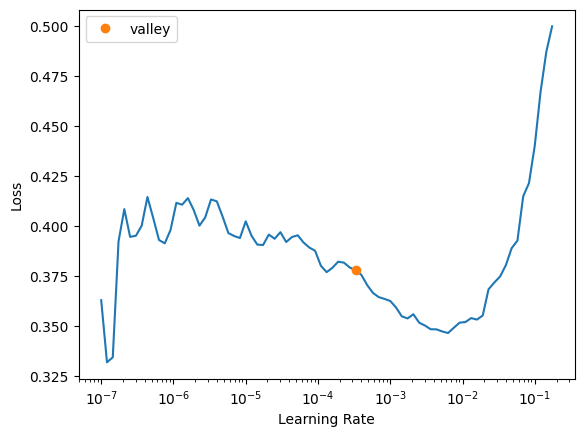

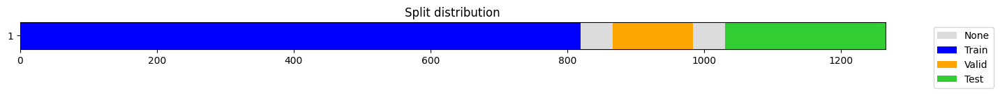

epoch,train_loss,valid_loss,mse,mae,time
0,0.367951,0.295799,0.295799,0.474398,00:00
1,0.324560,0.206553,0.206553,0.383613,00:00
2,0.288851,0.185495,0.185495,0.356559,00:00
3,0.269911,0.183919,0.183919,0.350029,00:00
4,0.254686,0.195394,0.195394,0.362908,00:00
5,0.244056,0.166759,0.166759,0.331102,00:00
6,0.231454,0.193477,0.193477,0.359495,00:00
7,0.218839,0.170111,0.170111,0.337409,00:00
8,0.205697,0.126179,0.126179,0.286444,00:00
9,0.190419,0.126297,0.126297,0.284095,00:00


[I 2024-12-14 15:18:23,431] Trial 449 finished with value: 0.1310139275806959 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


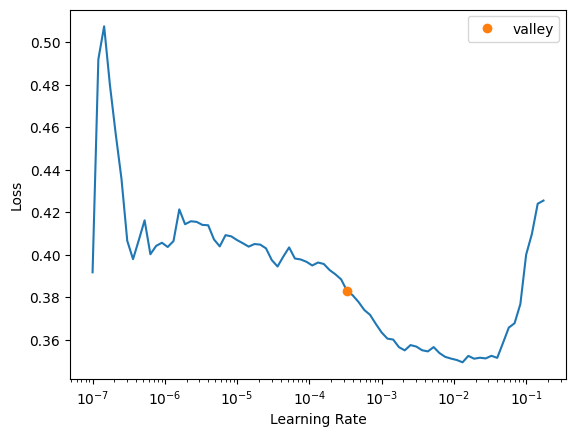

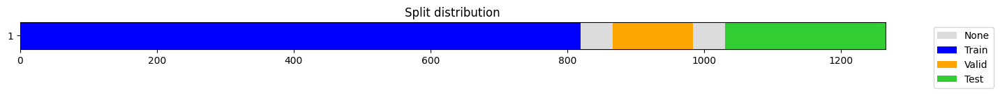

epoch,train_loss,valid_loss,mse,mae,time
0,0.364978,0.295317,0.295317,0.473214,00:00
1,0.319224,0.206168,0.206168,0.383313,00:00
2,0.284689,0.228085,0.228085,0.393966,00:00
3,0.261830,0.239677,0.239677,0.399332,00:00
4,0.241629,0.221543,0.221543,0.381118,00:00
5,0.220730,0.215396,0.215396,0.371686,00:00
6,0.202681,0.222723,0.222723,0.377752,00:00
7,0.186557,0.182129,0.182129,0.336065,00:00
8,0.175743,0.190299,0.190299,0.348138,00:00
9,0.166096,0.181552,0.181552,0.336574,00:00


[I 2024-12-14 15:18:30,527] Trial 450 finished with value: 0.17619524114644863 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


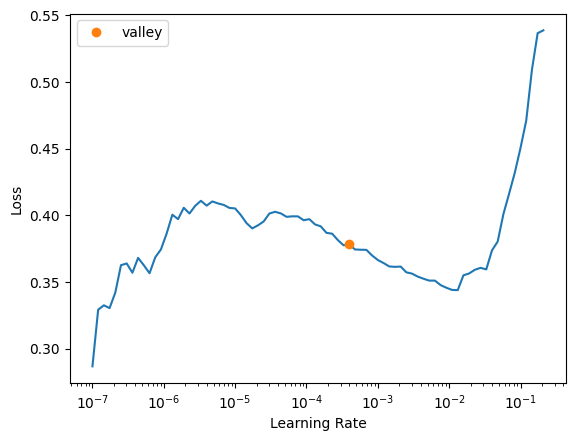

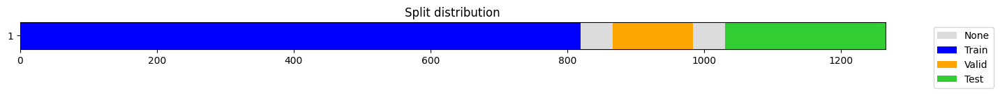

epoch,train_loss,valid_loss,mse,mae,time
0,0.363314,0.280437,0.280437,0.459395,00:00
1,0.317524,0.214715,0.214715,0.390999,00:00
2,0.285931,0.206775,0.206775,0.372799,00:00
3,0.266772,0.184857,0.184857,0.350424,00:00
4,0.248422,0.175393,0.175393,0.339030,00:00
5,0.231354,0.183046,0.183046,0.345735,00:00
6,0.215044,0.158703,0.158703,0.318101,00:00
7,0.206554,0.200793,0.200793,0.360490,00:00
8,0.196415,0.166804,0.166804,0.328799,00:00
9,0.184643,0.165136,0.165136,0.326150,00:00


[I 2024-12-14 15:18:37,602] Trial 451 finished with value: 0.15231495993455635 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 224, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


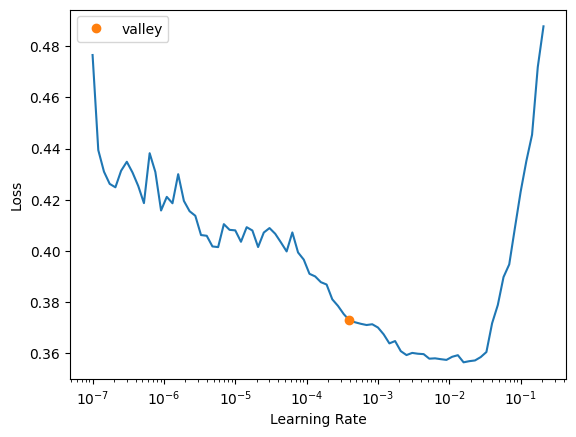

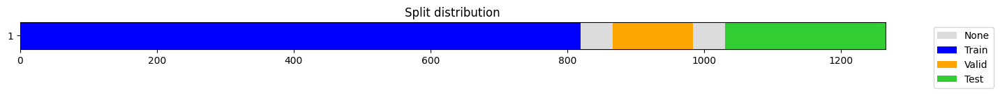

epoch,train_loss,valid_loss,mse,mae,time
0,0.354381,0.272415,0.272415,0.452090,00:00
1,0.309236,0.235056,0.235056,0.407439,00:00
2,0.277275,0.213337,0.213337,0.375388,00:00
3,0.257956,0.228986,0.228986,0.395211,00:00
4,0.232587,0.165161,0.165161,0.337033,00:00
5,0.213909,0.161746,0.161746,0.324403,00:00
6,0.194380,0.237536,0.237536,0.396040,00:00
7,0.178425,0.207785,0.207785,0.370676,00:00
8,0.167311,0.206586,0.206586,0.365245,00:00
9,0.157231,0.198750,0.198750,0.357228,00:00


[I 2024-12-14 15:18:44,635] Trial 452 finished with value: 0.20219814320168916 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 48, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.0, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


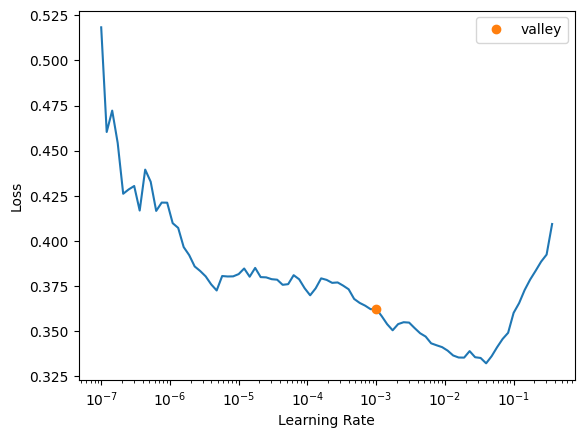

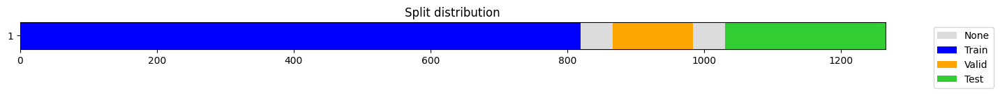

epoch,train_loss,valid_loss,mse,mae,time
0,0.341418,0.237527,0.237527,0.419108,00:00
1,0.297681,0.198636,0.198636,0.368431,00:00
2,0.263333,0.226406,0.226406,0.379336,00:00
3,0.237233,0.194637,0.194637,0.352083,00:00
4,0.218805,0.170910,0.170910,0.327878,00:00
5,0.200508,0.172879,0.172879,0.327247,00:00
6,0.185023,0.174570,0.174570,0.330396,00:00
7,0.169159,0.149828,0.149828,0.308818,00:00
8,0.159490,0.183185,0.183185,0.338419,00:00
9,0.149686,0.224804,0.224804,0.370578,00:00


[I 2024-12-14 15:18:51,732] Trial 453 finished with value: 0.16525491242594084 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


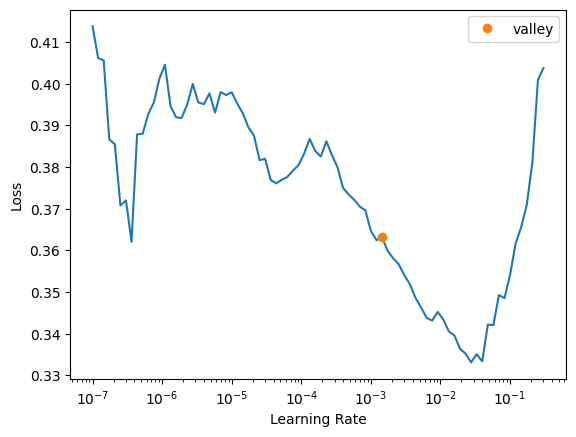

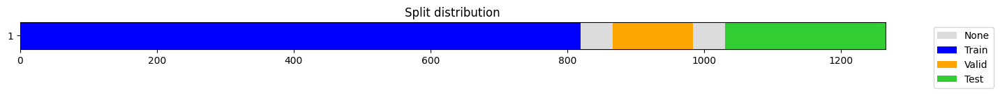

epoch,train_loss,valid_loss,mse,mae,time
0,0.353394,0.250471,0.250471,0.432512,00:00
1,0.313103,0.227802,0.227802,0.399014,00:00
2,0.282513,0.185928,0.185928,0.353405,00:00
3,0.264453,0.185960,0.185960,0.349143,00:00
4,0.245952,0.176946,0.176946,0.332223,00:00
5,0.225153,0.146390,0.146390,0.297418,00:00
6,0.204644,0.173085,0.173085,0.324663,00:00
7,0.188570,0.151966,0.151966,0.307111,00:00
8,0.174476,0.158505,0.158505,0.311857,00:00
9,0.162740,0.154250,0.154250,0.309824,00:00


[I 2024-12-14 15:18:59,118] Trial 454 finished with value: 0.15499858032973474 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 136, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


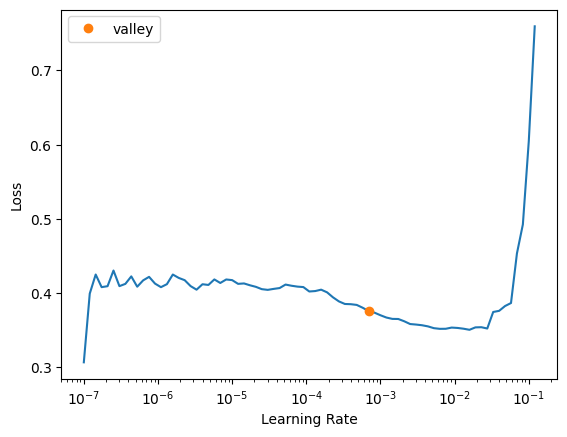

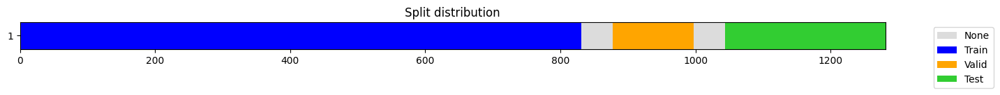

epoch,train_loss,valid_loss,mse,mae,time
0,0.326578,0.256083,0.256083,0.436205,00:00
1,0.286328,0.218847,0.218847,0.390483,00:00
2,0.269475,0.206997,0.206997,0.377878,00:00
3,0.252079,0.215633,0.215633,0.383983,00:00
4,0.240078,0.208082,0.208082,0.368493,00:00
5,0.226566,0.235394,0.235394,0.396234,00:00
6,0.212283,0.218403,0.218403,0.378062,00:00
7,0.194011,0.227224,0.227224,0.379967,00:00
8,0.179754,0.235448,0.235448,0.382640,00:00
9,0.170287,0.218903,0.218903,0.377412,00:00


[I 2024-12-14 15:19:06,367] Trial 455 finished with value: 0.23220651020650387 and parameters: {'fcst_history': 48, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 232, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (119, 1, 48)


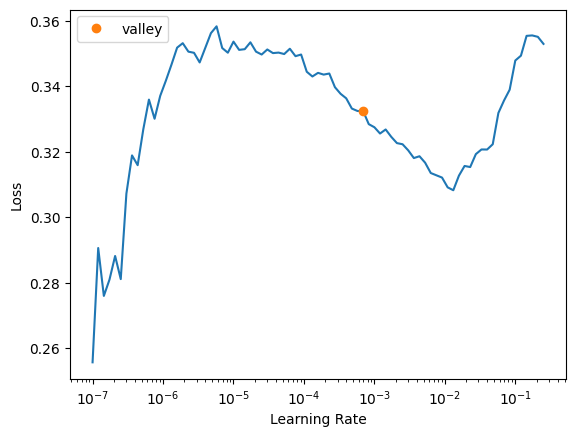

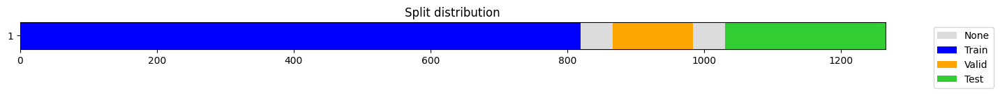

epoch,train_loss,valid_loss,mse,mae,time
0,0.335771,0.218165,0.218165,0.397613,00:00
1,0.290475,0.193197,0.193197,0.361312,00:00
2,0.270720,0.244161,0.244161,0.400262,00:00
3,0.254466,0.209122,0.209122,0.362461,00:00
4,0.224698,0.176450,0.176450,0.326147,00:00
5,0.208321,0.215447,0.215447,0.359152,00:00
6,0.193549,0.278523,0.278523,0.399662,00:00
7,0.179134,0.203319,0.203319,0.352928,00:00
8,0.167496,0.178325,0.178325,0.328324,00:00
9,0.153006,0.206597,0.206597,0.352606,00:00


[I 2024-12-14 15:19:13,460] Trial 456 finished with value: 0.18746044780956425 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 168, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


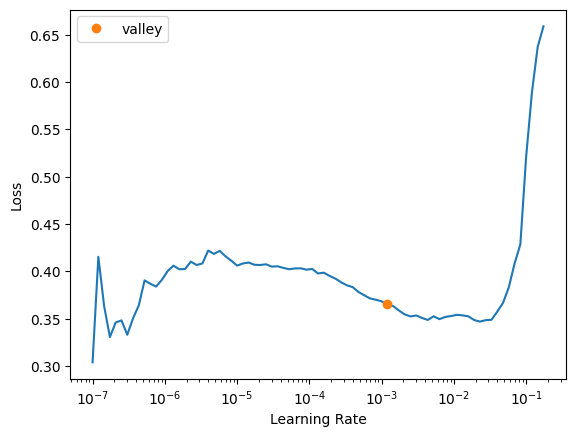

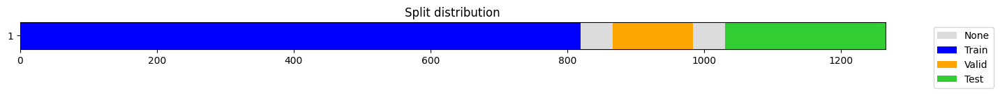

epoch,train_loss,valid_loss,mse,mae,time
0,0.371080,0.294932,0.294932,0.473882,00:00
1,0.324982,0.203831,0.203831,0.380049,00:00
2,0.294431,0.204790,0.204790,0.373300,00:00
3,0.271196,0.199871,0.199871,0.363330,00:00
4,0.251001,0.209550,0.209550,0.363954,00:00
5,0.232699,0.229495,0.229495,0.381690,00:00
6,0.215426,0.202313,0.202313,0.351984,00:00
7,0.204507,0.221734,0.221734,0.369719,00:00
8,0.192088,0.228911,0.228911,0.375859,00:00
9,0.183764,0.209072,0.209072,0.362207,00:00


[I 2024-12-14 15:19:19,503] Trial 457 finished with value: 0.2090648711004996 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 40, 'epochs': 15, 'n_layers': 3, 'd_ff': 176, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


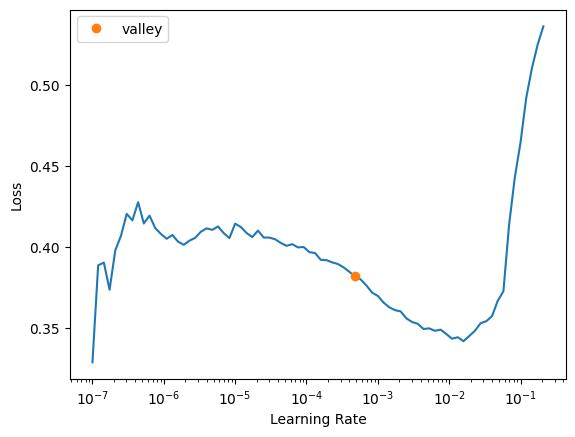

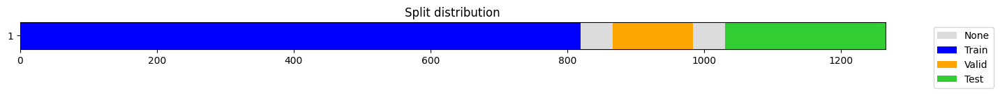

epoch,train_loss,valid_loss,mse,mae,time
0,0.345179,0.253788,0.253788,0.433679,00:00
1,0.302514,0.222499,0.222499,0.393907,00:00
2,0.271791,0.179592,0.179592,0.342071,00:00
3,0.249169,0.171762,0.171762,0.329760,00:00
4,0.223755,0.164741,0.164741,0.318712,00:00
5,0.202295,0.177627,0.177627,0.332274,00:00
6,0.184798,0.178986,0.178986,0.331237,00:00
7,0.166319,0.169486,0.169486,0.323965,00:00
8,0.154796,0.176432,0.176432,0.328585,00:00
9,0.145756,0.160401,0.160401,0.312462,00:00


[I 2024-12-14 15:19:26,525] Trial 458 finished with value: 0.16846081611728406 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.
[I 2024-12-14 15:19:26,633] Trial 459 pruned. 


scaled_preds.shape: (117, 1, 48)
Pruning trial: patch_len (0) is greater than fcst_history (80)


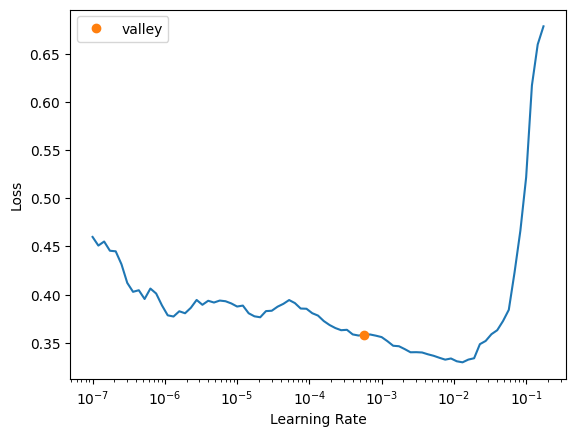

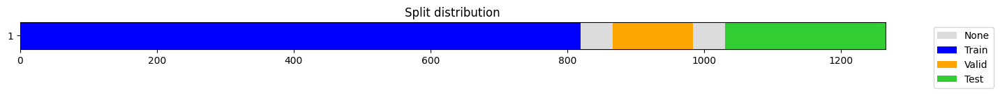

epoch,train_loss,valid_loss,mse,mae,time
0,0.310059,0.199374,0.199374,0.370630,00:00
1,0.277503,0.184237,0.184237,0.349477,00:00
2,0.253650,0.214634,0.214634,0.373901,00:00
3,0.215723,0.151226,0.151226,0.313022,00:00
4,0.188908,0.151738,0.151738,0.321213,00:00
5,0.166404,0.153576,0.153576,0.312177,00:00
6,0.152124,0.143053,0.143053,0.305914,00:00
7,0.143146,0.143996,0.143996,0.301366,00:00
8,0.135257,0.141650,0.141650,0.300866,00:00
9,0.121781,0.139045,0.139045,0.298523,00:00


[I 2024-12-14 15:19:35,749] Trial 460 finished with value: 0.1486412535718632 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


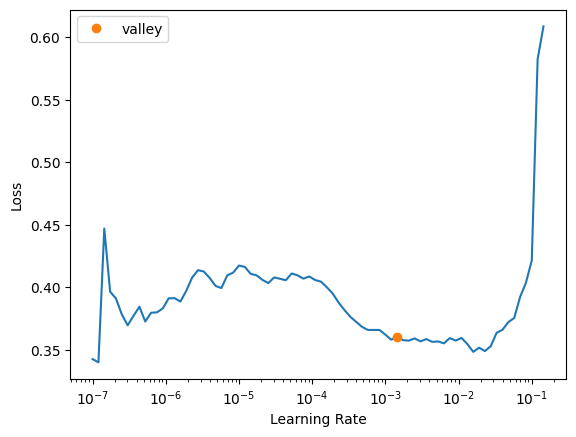

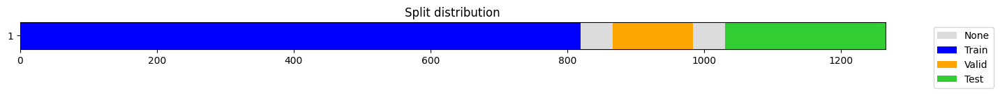

epoch,train_loss,valid_loss,mse,mae,time
0,0.354853,0.276419,0.276419,0.454292,00:00
1,0.313839,0.197022,0.197022,0.372732,00:00
2,0.288529,0.199224,0.199224,0.365499,00:00
3,0.272070,0.199251,0.199251,0.360276,00:00
4,0.258062,0.233407,0.233407,0.390967,00:00
5,0.241038,0.219017,0.219017,0.367975,00:00
6,0.224130,0.211230,0.211230,0.360974,00:00
7,0.207055,0.204568,0.204568,0.353246,00:00
8,0.194885,0.202151,0.202151,0.354367,00:00
9,0.180569,0.189195,0.189195,0.339709,00:00


[I 2024-12-14 15:19:43,276] Trial 461 finished with value: 0.1894591165528824 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 24, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


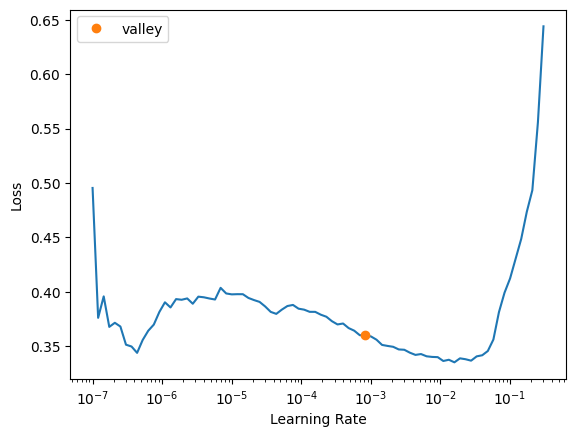

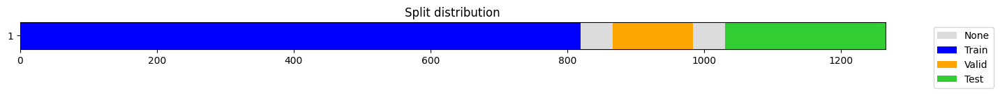

epoch,train_loss,valid_loss,mse,mae,time
0,0.388410,0.325478,0.325478,0.500234,00:00
1,0.343105,0.234473,0.234473,0.415926,00:00
2,0.307543,0.221804,0.221804,0.397163,00:00
3,0.284241,0.198484,0.198484,0.368706,00:00
4,0.266287,0.196848,0.196848,0.362909,00:00
5,0.253807,0.198638,0.198638,0.362946,00:00
6,0.244484,0.197445,0.197445,0.359794,00:00
7,0.233131,0.180951,0.180951,0.342281,00:00
8,0.223180,0.192115,0.192115,0.350992,00:00
9,0.212617,0.177846,0.177846,0.335626,00:00


[I 2024-12-14 15:19:52,362] Trial 462 finished with value: 0.18325876895263493 and parameters: {'fcst_history': 64, 'n_heads': 2, 'd_model': 32, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


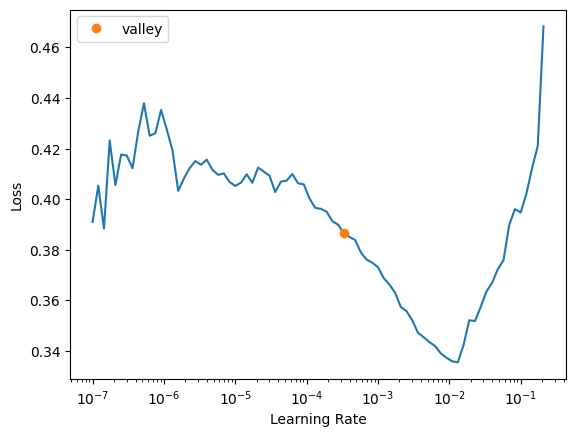

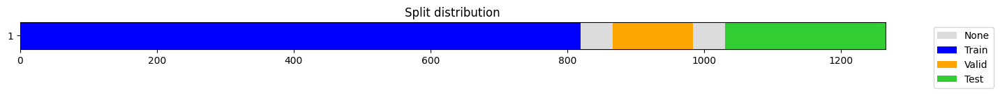

epoch,train_loss,valid_loss,mse,mae,time
0,0.316974,0.219081,0.219081,0.397520,00:00
1,0.280765,0.205347,0.205347,0.373351,00:00
2,0.258393,0.197072,0.197072,0.359444,00:00
3,0.246277,0.145286,0.145286,0.304397,00:00
4,0.218484,0.165143,0.165143,0.326154,00:00
5,0.198083,0.266571,0.266571,0.409058,00:00
6,0.177932,0.204856,0.204856,0.360584,00:00
7,0.156375,0.178077,0.178077,0.341594,00:00
8,0.143376,0.230696,0.230696,0.382706,00:00
9,0.130061,0.150385,0.150385,0.302753,00:00


[I 2024-12-14 15:20:04,072] Trial 463 finished with value: 0.18478557047847366 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 88, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 256, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


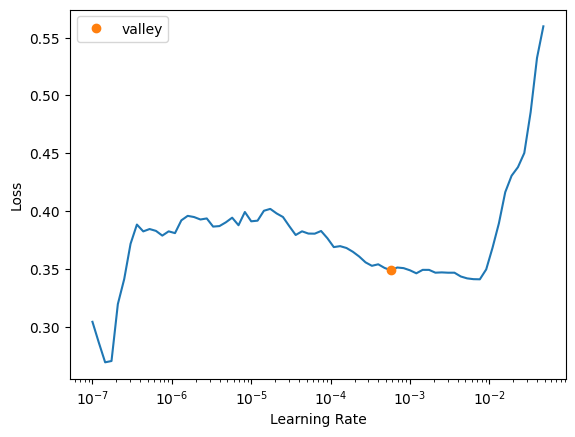

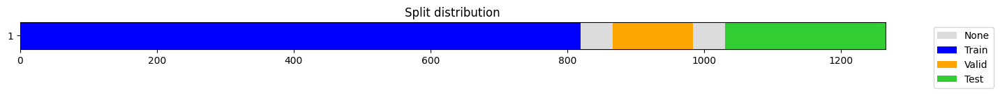

epoch,train_loss,valid_loss,mse,mae,time
0,0.362799,0.284945,0.284945,0.463901,00:00
1,0.307711,0.213930,0.213930,0.391755,00:00
2,0.275420,0.207932,0.207932,0.376200,00:00
3,0.253603,0.195792,0.195792,0.356900,00:00
4,0.245747,0.179847,0.179847,0.347084,00:00
5,0.231787,0.173283,0.173283,0.337580,00:00
6,0.215372,0.186373,0.186373,0.350539,00:00
7,0.198763,0.189528,0.189528,0.347162,00:00
8,0.175498,0.210823,0.210823,0.364787,00:00
9,0.163680,0.205018,0.205018,0.355966,00:00


[I 2024-12-14 15:20:23,763] Trial 464 finished with value: 0.186311910539103 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 16, 'epochs': 20, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


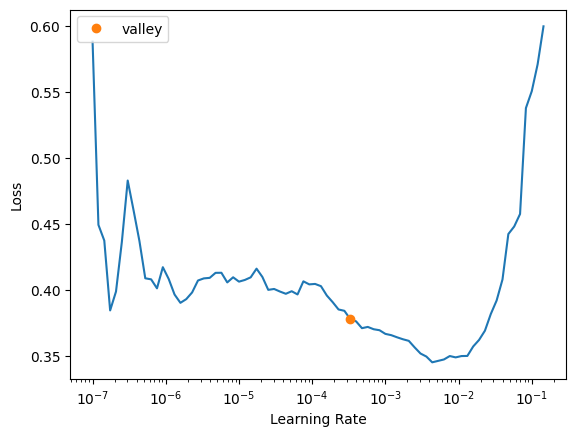

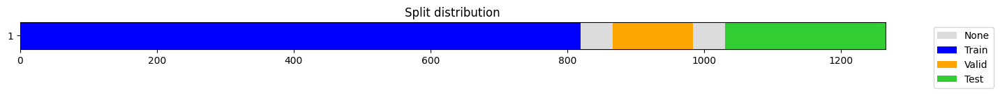

epoch,train_loss,valid_loss,mse,mae,time
0,0.375244,0.298436,0.298436,0.476303,00:00
1,0.329785,0.213424,0.213424,0.391613,00:00
2,0.292222,0.200408,0.200408,0.371932,00:00
3,0.268546,0.197965,0.197965,0.364242,00:00
4,0.252147,0.176395,0.176395,0.345190,00:00
5,0.239119,0.211019,0.211019,0.370641,00:00
6,0.225810,0.200319,0.200319,0.359420,00:00
7,0.211668,0.204823,0.204823,0.360526,00:00
8,0.196957,0.196224,0.196224,0.350510,00:00
9,0.187274,0.197834,0.197834,0.354017,00:00


[I 2024-12-14 15:20:31,358] Trial 465 finished with value: 0.18914823089345842 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 184, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


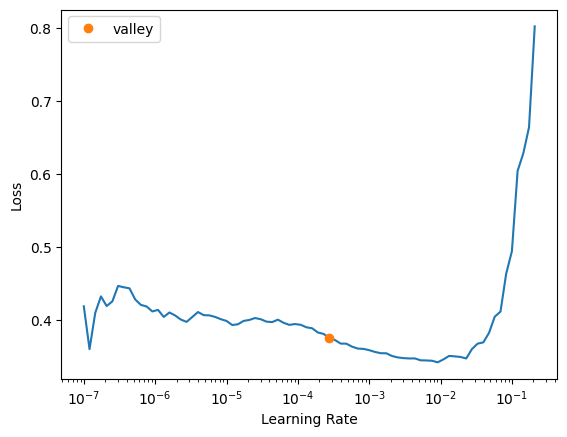

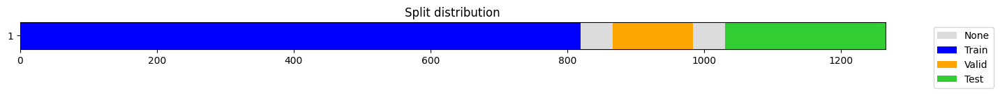

epoch,train_loss,valid_loss,mse,mae,time
0,0.382565,0.325914,0.325914,0.497688,00:00
1,0.344500,0.230762,0.230762,0.408701,00:00
2,0.308286,0.213197,0.213197,0.386196,00:00
3,0.281139,0.196225,0.196225,0.366133,00:00
4,0.262905,0.191726,0.191726,0.358821,00:00
5,0.248137,0.209534,0.209534,0.370099,00:00
6,0.231732,0.184646,0.184646,0.344568,00:00
7,0.216815,0.217147,0.217147,0.375646,00:00
8,0.204863,0.175351,0.175351,0.335351,00:00
9,0.192537,0.203431,0.203431,0.359200,00:00


[I 2024-12-14 15:20:40,355] Trial 466 finished with value: 0.16954504948404425 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 32, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 224, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


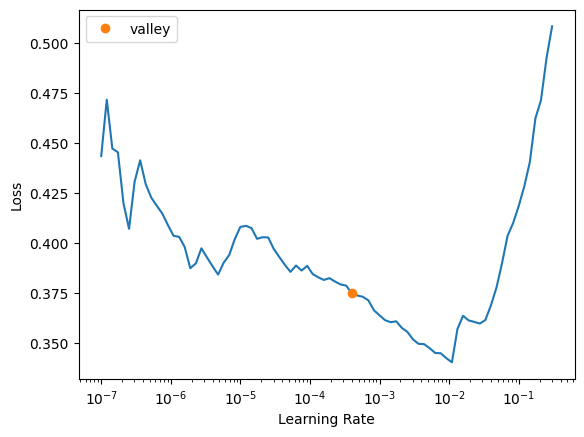

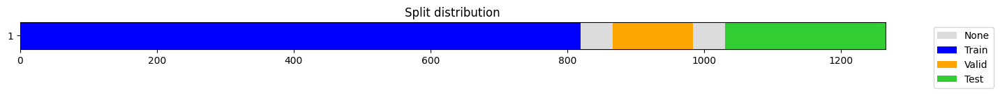

epoch,train_loss,valid_loss,mse,mae,time
0,0.319708,0.213499,0.213499,0.392134,00:00
1,0.281508,0.201816,0.201816,0.370905,00:00
2,0.259791,0.191559,0.191559,0.360178,00:00
3,0.242423,0.164847,0.164847,0.327914,00:00
4,0.234910,0.242316,0.242316,0.387379,00:00
5,0.208875,0.160225,0.160225,0.323302,00:00
6,0.185443,0.198506,0.198506,0.355920,00:00
7,0.168317,0.192525,0.192525,0.345238,00:00
8,0.151342,0.199074,0.199074,0.355670,00:00
9,0.146654,0.184807,0.184807,0.336608,00:00


[I 2024-12-14 15:20:51,648] Trial 467 finished with value: 0.1846289857950861 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 64, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


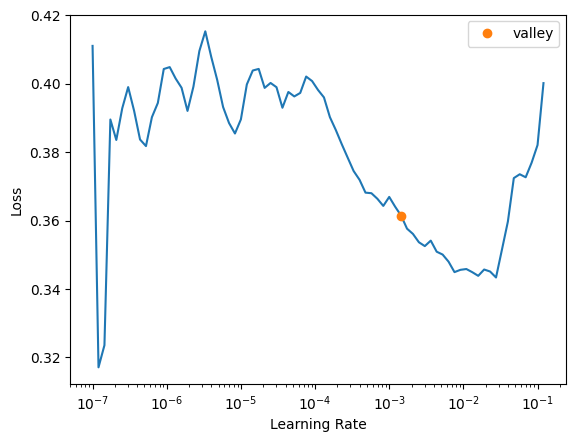

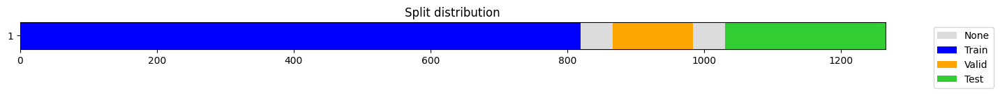

epoch,train_loss,valid_loss,mse,mae,time
0,0.324699,0.216649,0.216649,0.395330,00:00
1,0.288747,0.195969,0.195969,0.360186,00:00
2,0.266608,0.216180,0.216180,0.374081,00:00
3,0.253995,0.188274,0.188274,0.339130,00:00
4,0.232532,0.170664,0.170664,0.326370,00:00
5,0.217848,0.204599,0.204599,0.354796,00:00
6,0.201333,0.160654,0.160654,0.316635,00:00
7,0.187001,0.184651,0.184651,0.335365,00:00
8,0.174237,0.147999,0.147999,0.303740,00:00
9,0.163859,0.179124,0.179124,0.334485,00:00


[I 2024-12-14 15:20:59,187] Trial 468 finished with value: 0.14030107722587024 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


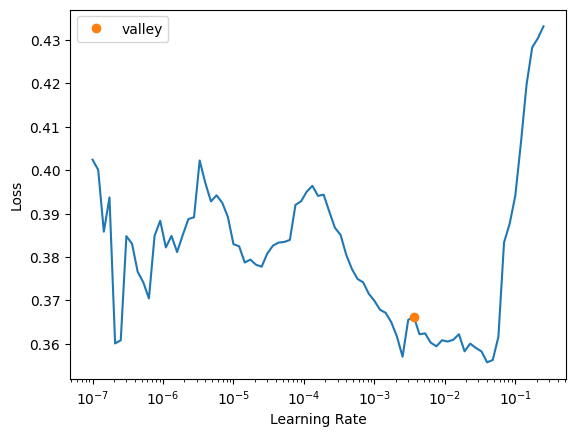

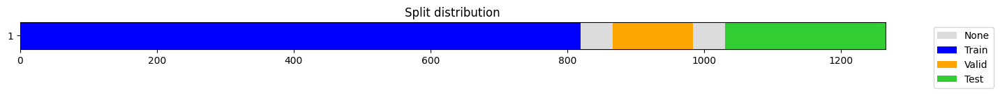

epoch,train_loss,valid_loss,mse,mae,time
0,0.362962,0.302153,0.302153,0.482517,00:00
1,0.324504,0.206564,0.206564,0.382827,00:00
2,0.291089,0.225309,0.225309,0.389448,00:00
3,0.268100,0.208555,0.208555,0.371530,00:00
4,0.248870,0.260646,0.260646,0.400592,00:00
5,0.232702,0.243708,0.243708,0.395888,00:00
6,0.219740,0.210672,0.210672,0.362168,00:00
7,0.206053,0.174881,0.174881,0.330203,00:00
8,0.192261,0.223012,0.223012,0.378265,00:00
9,0.182455,0.170438,0.170438,0.326200,00:00


[I 2024-12-14 15:21:06,689] Trial 469 finished with value: 0.16806531744626763 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


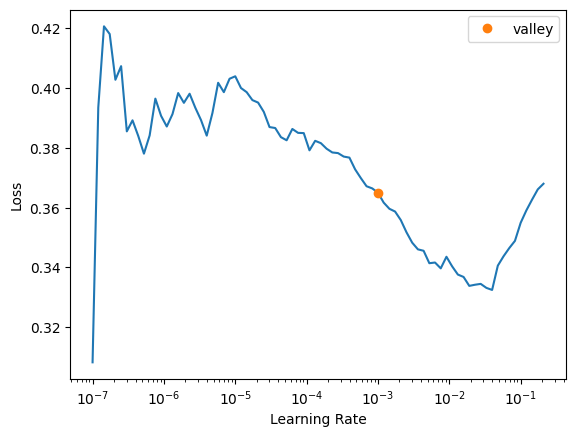

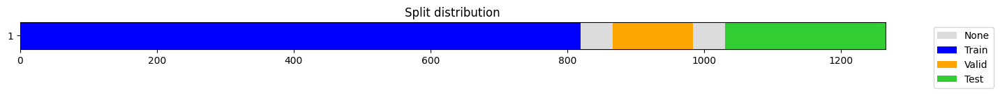

epoch,train_loss,valid_loss,mse,mae,time
0,0.332304,0.213788,0.213788,0.392204,00:00
1,0.287323,0.196349,0.196349,0.361638,00:00
2,0.264282,0.195500,0.195500,0.357446,00:00
3,0.235147,0.215365,0.215365,0.371831,00:00
4,0.212129,0.181869,0.181869,0.334620,00:00
5,0.191140,0.167288,0.167288,0.319706,00:00
6,0.175416,0.169015,0.169015,0.322905,00:00
7,0.162880,0.173116,0.173116,0.329691,00:00
8,0.154770,0.163678,0.163678,0.316838,00:00
9,0.145938,0.166814,0.166814,0.318992,00:00


[I 2024-12-14 15:21:11,425] Trial 470 finished with value: 0.16681425206863146 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 16, 'patch_len': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 3, 'd_ff': 176, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


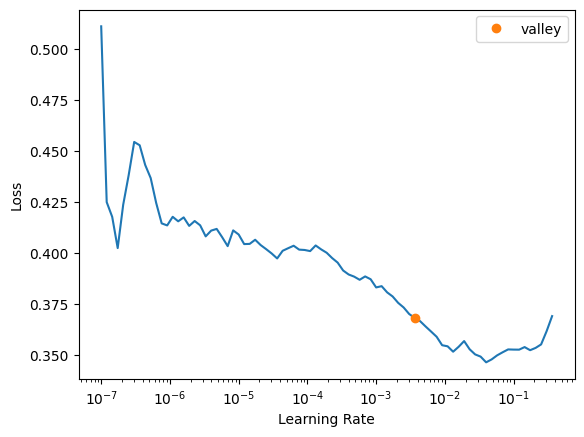

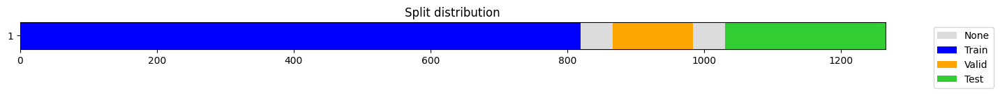

epoch,train_loss,valid_loss,mse,mae,time
0,0.364523,0.292249,0.292249,0.471267,00:00
1,0.328167,0.220316,0.220316,0.398435,00:00
2,0.298759,0.201681,0.201681,0.375406,00:00
3,0.278883,0.196268,0.196268,0.360937,00:00
4,0.269644,0.224417,0.224417,0.383024,00:00
5,0.252832,0.189196,0.189196,0.348229,00:00
6,0.239021,0.187418,0.187418,0.344043,00:00
7,0.225899,0.192701,0.192701,0.349318,00:00
8,0.214874,0.154103,0.154103,0.313303,00:00
9,0.202266,0.183330,0.183330,0.341902,00:00


[I 2024-12-14 15:21:18,657] Trial 471 finished with value: 0.18211729239322721 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 16, 'patch_len': 16, 'batch_size': 48, 'epochs': 20, 'n_layers': 3, 'd_ff': 184, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


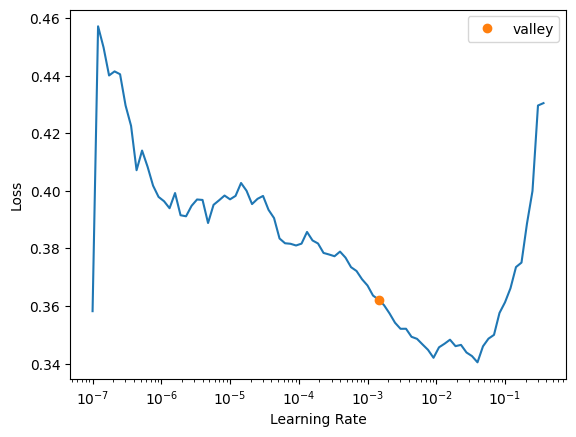

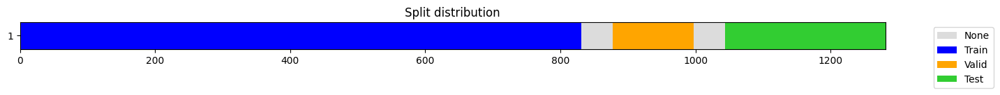

epoch,train_loss,valid_loss,mse,mae,time
0,0.355430,0.303837,0.303837,0.478744,00:00
1,0.319698,0.227895,0.227895,0.406419,00:00
2,0.291170,0.219478,0.219478,0.391037,00:00
3,0.271185,0.207763,0.207763,0.379753,00:00
4,0.257445,0.192688,0.192688,0.361274,00:00
5,0.246440,0.201276,0.201276,0.368385,00:00
6,0.238108,0.207203,0.207203,0.373446,00:00
7,0.232102,0.210868,0.210868,0.375612,00:00
8,0.223738,0.197486,0.197486,0.362930,00:00
9,0.216910,0.209775,0.209775,0.374300,00:00


[I 2024-12-14 15:21:24,781] Trial 472 finished with value: 0.20854841992421277 and parameters: {'fcst_history': 48, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 40, 'epochs': 15, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (119, 1, 48)


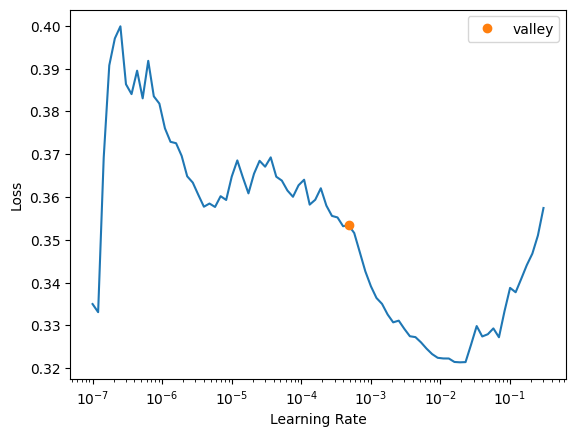

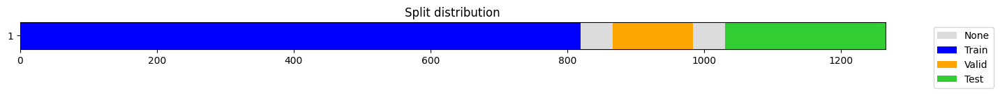

epoch,train_loss,valid_loss,mse,mae,time
0,0.381768,0.313463,0.313463,0.491093,00:00
1,0.333144,0.212399,0.212399,0.390954,00:00
2,0.299843,0.204308,0.204308,0.377951,00:00
3,0.272998,0.193793,0.193793,0.360810,00:00
4,0.251605,0.177079,0.177079,0.337250,00:00
5,0.230410,0.166138,0.166138,0.322385,00:00
6,0.214931,0.210538,0.210538,0.371350,00:00
7,0.196953,0.150077,0.150077,0.305760,00:00
8,0.180180,0.174411,0.174411,0.326238,00:00
9,0.167060,0.143142,0.143142,0.294454,00:00


[I 2024-12-14 15:21:32,377] Trial 473 finished with value: 0.15502919195977685 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 16, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.1, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


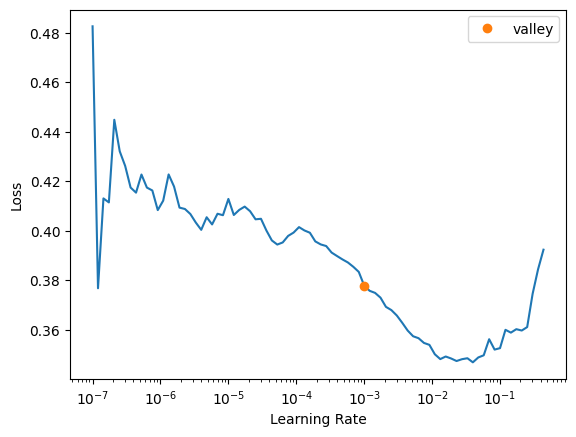

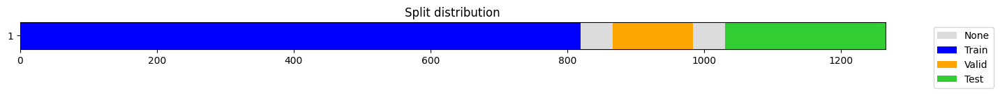

epoch,train_loss,valid_loss,mse,mae,time
0,0.373315,0.304308,0.304308,0.480464,00:00
1,0.326066,0.205023,0.205023,0.381432,00:00
2,0.294902,0.196515,0.196515,0.365372,00:00
3,0.275912,0.212838,0.212838,0.373693,00:00
4,0.261350,0.196362,0.196362,0.355709,00:00
5,0.248356,0.201826,0.201826,0.361894,00:00
6,0.233296,0.164315,0.164315,0.326247,00:00
7,0.217192,0.188576,0.188576,0.347517,00:00
8,0.203646,0.190465,0.190465,0.347495,00:00
9,0.189285,0.162521,0.162521,0.317200,00:00


[I 2024-12-14 15:21:40,055] Trial 474 finished with value: 0.16730476286980053 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 48, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


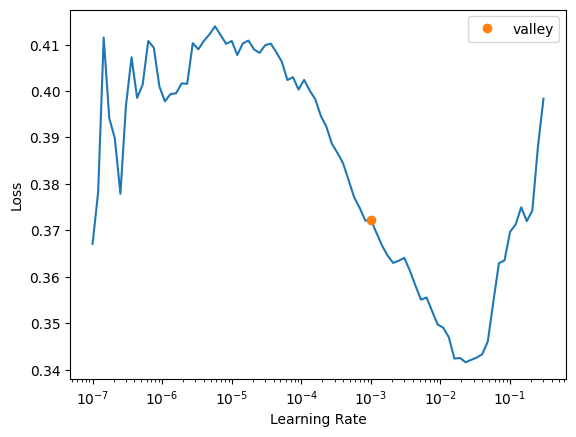

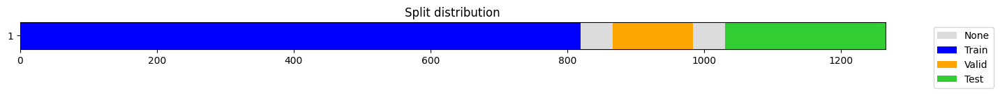

epoch,train_loss,valid_loss,mse,mae,time
0,0.380154,0.319518,0.319518,0.495987,00:00
1,0.339199,0.222852,0.222852,0.404691,00:00
2,0.307921,0.208255,0.208255,0.382155,00:00
3,0.285835,0.206563,0.206563,0.373363,00:00
4,0.268289,0.211877,0.211877,0.374136,00:00
5,0.254221,0.184474,0.184474,0.350363,00:00
6,0.241295,0.198859,0.198859,0.361374,00:00
7,0.227750,0.192957,0.192957,0.350945,00:00
8,0.215403,0.164162,0.164162,0.322244,00:00
9,0.204540,0.172475,0.172475,0.330244,00:00


[I 2024-12-14 15:21:48,466] Trial 475 finished with value: 0.14716003333792163 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 48, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


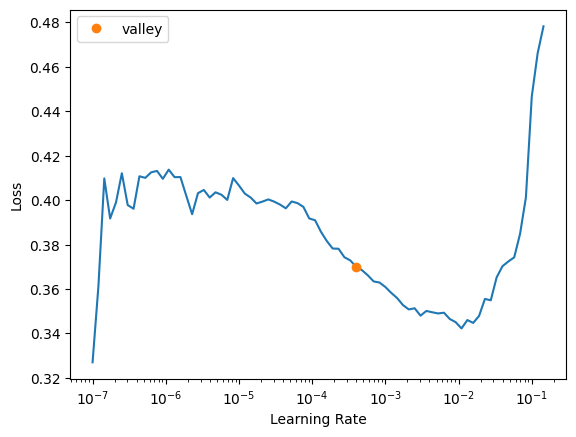

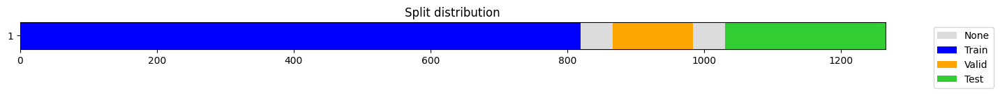

epoch,train_loss,valid_loss,mse,mae,time
0,0.363337,0.278855,0.278855,0.458587,00:00
1,0.316862,0.203676,0.203676,0.380234,00:00
2,0.286678,0.210068,0.210068,0.370821,00:00
3,0.265069,0.242467,0.242467,0.393052,00:00
4,0.248379,0.201808,0.201808,0.354214,00:00
5,0.228316,0.226739,0.226739,0.366987,00:00
6,0.209790,0.216448,0.216448,0.360749,00:00
7,0.191150,0.181603,0.181603,0.334128,00:00
8,0.173818,0.186448,0.186448,0.338310,00:00
9,0.158580,0.184475,0.184475,0.333121,00:00


[I 2024-12-14 15:21:56,759] Trial 476 finished with value: 0.16416098844672966 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


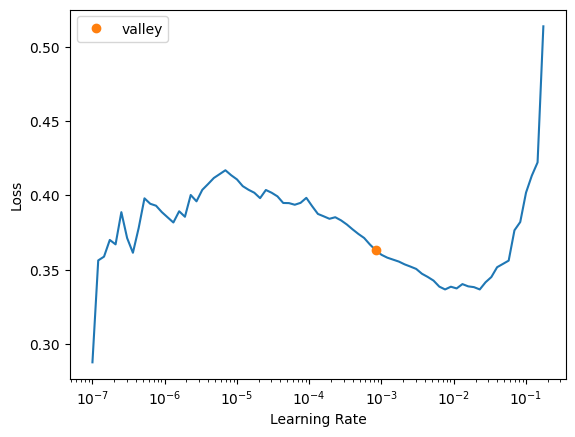

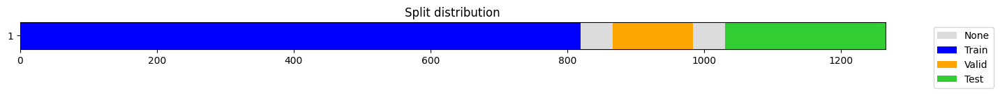

epoch,train_loss,valid_loss,mse,mae,time
0,0.370468,0.299600,0.299600,0.479032,00:00
1,0.323147,0.212171,0.212171,0.390454,00:00
2,0.291085,0.202522,0.202522,0.373767,00:00
3,0.269261,0.203557,0.203557,0.370172,00:00
4,0.253217,0.173114,0.173114,0.340086,00:00
5,0.235324,0.163125,0.163125,0.319870,00:00
6,0.218848,0.187167,0.187167,0.345020,00:00
7,0.204449,0.189172,0.189172,0.347023,00:00
8,0.192339,0.212745,0.212745,0.362981,00:00
9,0.178386,0.182398,0.182398,0.333536,00:00


[I 2024-12-14 15:22:05,591] Trial 477 finished with value: 0.1576283789413267 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 184, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


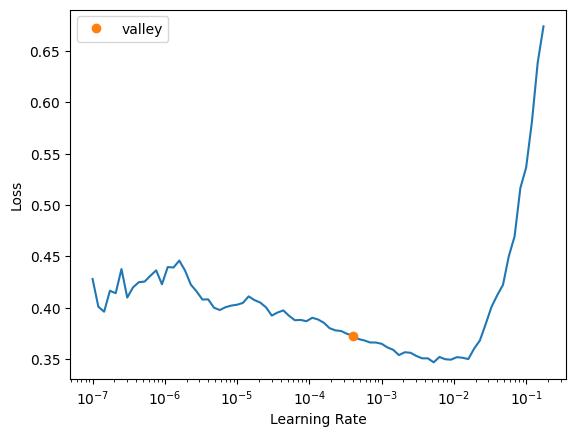

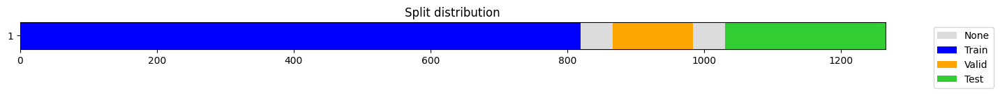

epoch,train_loss,valid_loss,mse,mae,time
0,0.372346,0.301557,0.301557,0.477183,00:00
1,0.326274,0.206696,0.206696,0.383285,00:00
2,0.297639,0.201863,0.201863,0.372838,00:00
3,0.276704,0.202339,0.202339,0.367600,00:00
4,0.256753,0.186450,0.186450,0.348760,00:00
5,0.241165,0.195272,0.195272,0.350896,00:00
6,0.222290,0.231999,0.231999,0.382338,00:00
7,0.205048,0.204285,0.204285,0.360487,00:00
8,0.192035,0.195551,0.195551,0.351721,00:00
9,0.179508,0.169719,0.169719,0.323098,00:00


[I 2024-12-14 15:22:13,044] Trial 478 finished with value: 0.17247836455227533 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 40, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.4, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


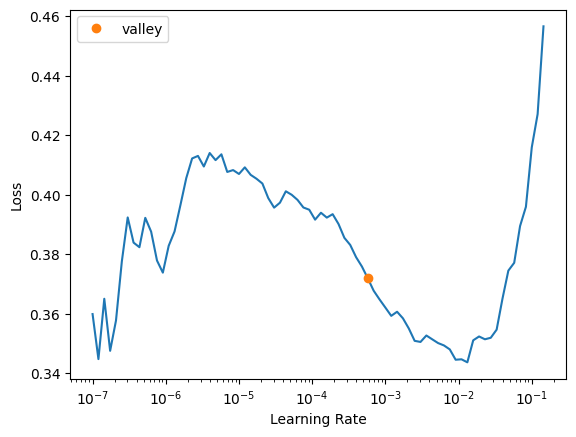

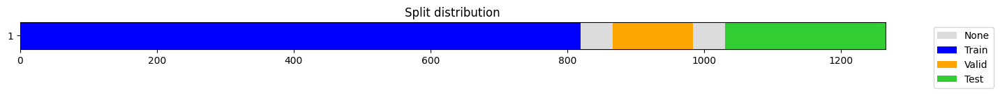

epoch,train_loss,valid_loss,mse,mae,time
0,0.365992,0.301112,0.301112,0.477884,00:00
1,0.322794,0.218420,0.218420,0.395931,00:00
2,0.293294,0.216731,0.216731,0.387068,00:00
3,0.273235,0.225334,0.225334,0.389989,00:00
4,0.260991,0.219788,0.219788,0.383378,00:00
5,0.243123,0.193984,0.193984,0.354639,00:00
6,0.226885,0.200598,0.200598,0.357165,00:00
7,0.209375,0.195161,0.195161,0.349146,00:00
8,0.198023,0.197754,0.197754,0.354982,00:00
9,0.189490,0.194106,0.194106,0.347405,00:00


[I 2024-12-14 15:22:20,094] Trial 479 finished with value: 0.18893270356807557 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


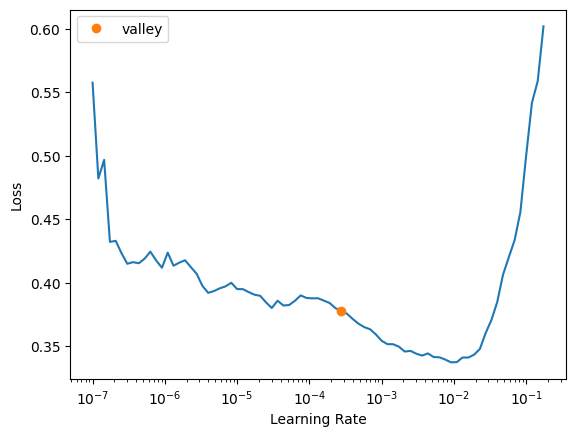

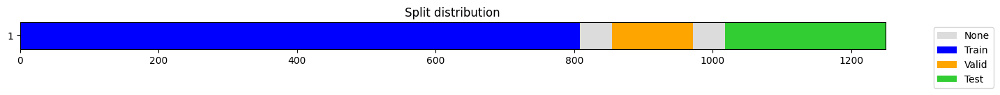

epoch,train_loss,valid_loss,mse,mae,time
0,0.378149,0.257160,0.257160,0.437283,00:00
1,0.322742,0.211615,0.211615,0.383564,00:00
2,0.286709,0.213883,0.213883,0.379155,00:00
3,0.261060,0.208989,0.208989,0.376506,00:00
4,0.227411,0.200355,0.200355,0.371549,00:00
5,0.193192,0.178541,0.178541,0.352027,00:00
6,0.167488,0.199113,0.199113,0.366352,00:00
7,0.147450,0.143025,0.143025,0.310049,00:00
8,0.134144,0.161515,0.161515,0.331223,00:00
9,0.121573,0.163279,0.163279,0.331522,00:00


[I 2024-12-14 15:22:28,871] Trial 480 finished with value: 0.16062747653302267 and parameters: {'fcst_history': 80, 'n_heads': 1, 'd_model': 64, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (116, 1, 48)


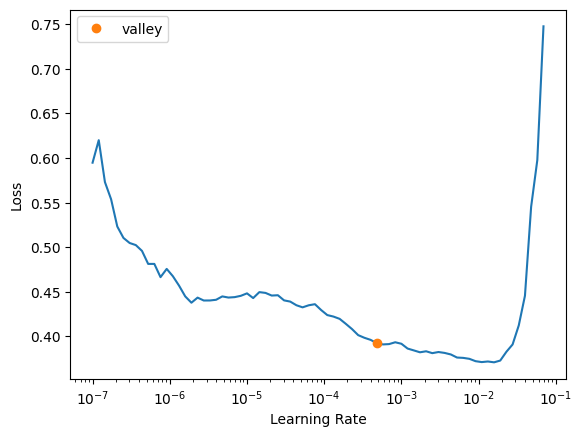

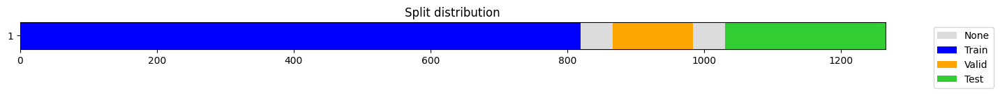

epoch,train_loss,valid_loss,mse,mae,time
0,0.366100,0.276658,0.276658,0.457040,00:00
1,0.317249,0.202035,0.202035,0.379377,00:00
2,0.288971,0.212888,0.212888,0.379275,00:00
3,0.271985,0.205959,0.205959,0.367835,00:00
4,0.255933,0.156513,0.156513,0.319056,00:00
5,0.234888,0.148232,0.148232,0.312370,00:00
6,0.212328,0.119525,0.119525,0.279986,00:00
7,0.192532,0.150571,0.150571,0.303397,00:00
8,0.173971,0.138453,0.138453,0.301337,00:00
9,0.158032,0.186002,0.186002,0.345337,00:00


[I 2024-12-14 15:22:37,687] Trial 481 finished with value: 0.17844497546963597 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 176, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


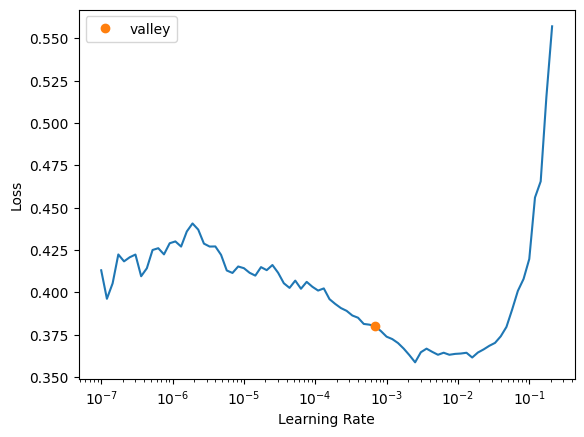

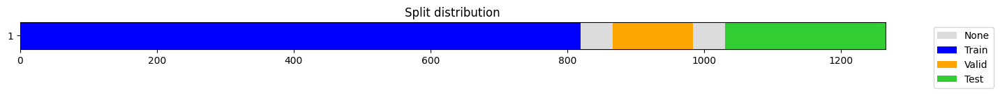

epoch,train_loss,valid_loss,mse,mae,time
0,0.366682,0.278150,0.278150,0.459958,00:00
1,0.323382,0.224841,0.224841,0.400096,00:00
2,0.289711,0.197618,0.197618,0.366642,00:00
3,0.270751,0.182202,0.182202,0.348725,00:00
4,0.251901,0.168419,0.168419,0.330281,00:00
5,0.233596,0.177275,0.177275,0.340501,00:00
6,0.217589,0.165783,0.165783,0.323762,00:00
7,0.203131,0.184789,0.184789,0.341352,00:00
8,0.190487,0.162335,0.162335,0.322410,00:00
9,0.178960,0.169276,0.169276,0.325351,00:00


[I 2024-12-14 15:22:43,981] Trial 482 finished with value: 0.14643125205854635 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 24, 'patch_len': 16, 'batch_size': 40, 'epochs': 15, 'n_layers': 3, 'd_ff': 128, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


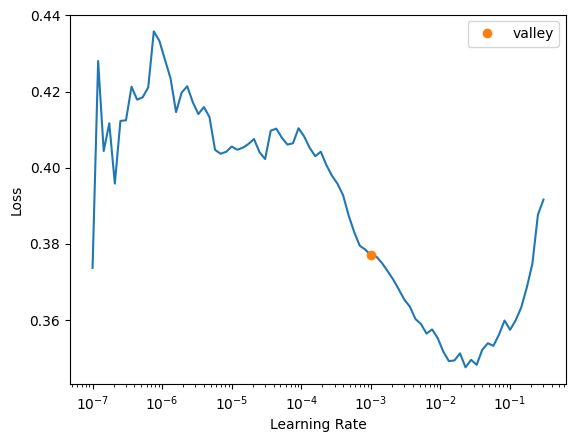

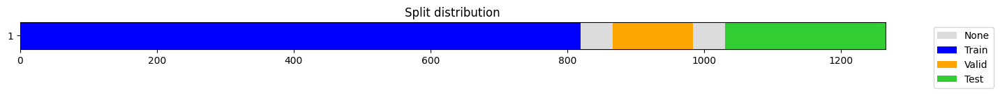

epoch,train_loss,valid_loss,mse,mae,time
0,0.320666,0.216319,0.216319,0.395760,00:00
1,0.285459,0.192521,0.192521,0.357891,00:00
2,0.262881,0.173906,0.173906,0.334467,00:00
3,0.243847,0.210762,0.210762,0.355122,00:00
4,0.221809,0.208813,0.208813,0.352353,00:00
5,0.194995,0.177654,0.177654,0.333214,00:00
6,0.177428,0.170159,0.170159,0.321743,00:00
7,0.163241,0.244803,0.244803,0.399498,00:00
8,0.154303,0.149351,0.149351,0.302816,00:00
9,0.142996,0.227449,0.227449,0.371851,00:00


[I 2024-12-14 15:22:52,757] Trial 483 finished with value: 0.20601524140072483 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


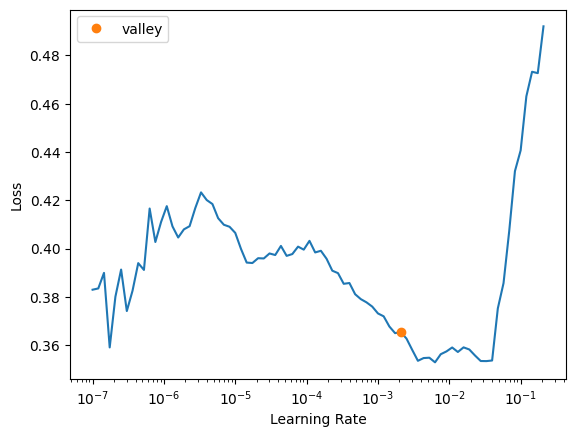

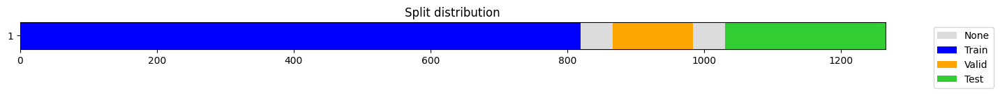

epoch,train_loss,valid_loss,mse,mae,time
0,0.368800,0.303397,0.303397,0.483454,00:00
1,0.333337,0.223099,0.223099,0.404849,00:00
2,0.309040,0.205957,0.205957,0.382701,00:00
3,0.286870,0.198500,0.198500,0.366167,00:00
4,0.269791,0.181674,0.181674,0.348751,00:00
5,0.253326,0.185520,0.185520,0.351920,00:00
6,0.238094,0.192855,0.192855,0.354736,00:00
7,0.225238,0.185395,0.185395,0.346677,00:00
8,0.209846,0.171923,0.171923,0.333272,00:00
9,0.196721,0.181740,0.181740,0.342069,00:00


[I 2024-12-14 15:22:59,629] Trial 484 finished with value: 0.18556115141749713 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 48, 'epochs': 20, 'n_layers': 3, 'd_ff': 120, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


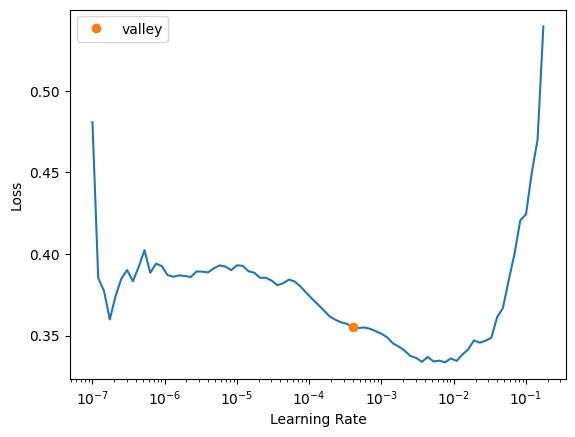

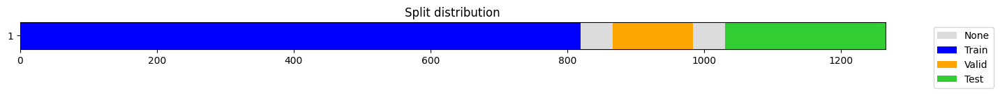

epoch,train_loss,valid_loss,mse,mae,time
0,0.370518,0.300936,0.300936,0.475568,00:00
1,0.319870,0.214973,0.214973,0.394199,00:00
2,0.287101,0.195899,0.195899,0.367017,00:00
3,0.265509,0.195229,0.195229,0.360215,00:00
4,0.249311,0.200582,0.200582,0.362689,00:00
5,0.237547,0.176551,0.176551,0.342594,00:00
6,0.222491,0.175733,0.175733,0.339749,00:00
7,0.208357,0.163197,0.163197,0.326252,00:00
8,0.199205,0.149320,0.149320,0.310344,00:00
9,0.188457,0.182570,0.182570,0.334459,00:00


[I 2024-12-14 15:23:10,938] Trial 485 finished with value: 0.17419691618908725 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 184, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


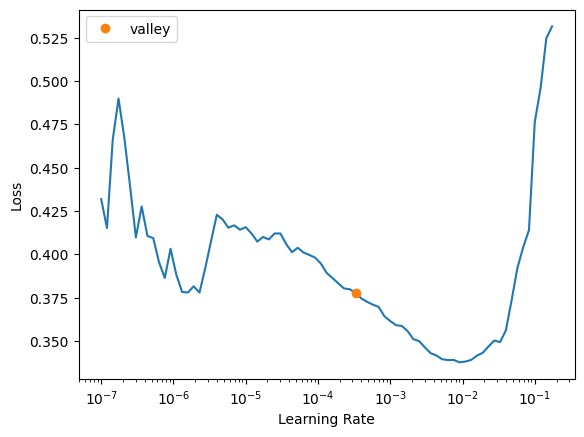

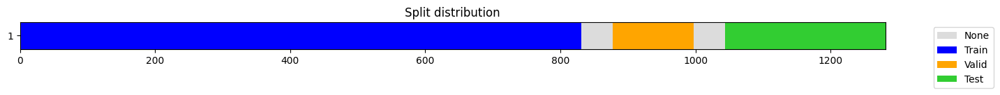

epoch,train_loss,valid_loss,mse,mae,time
0,0.351926,0.298195,0.298195,0.475490,00:00
1,0.324069,0.227448,0.227448,0.408568,00:00
2,0.299469,0.211769,0.211769,0.384817,00:00
3,0.285355,0.202725,0.202725,0.372197,00:00
4,0.271890,0.228899,0.228899,0.394129,00:00
5,0.260215,0.220858,0.220858,0.384322,00:00
6,0.251175,0.224790,0.224790,0.388358,00:00
7,0.242576,0.241343,0.241343,0.395387,00:00
8,0.233360,0.241632,0.241632,0.398226,00:00
9,0.224868,0.230251,0.230251,0.382781,00:00


[I 2024-12-14 15:23:15,407] Trial 486 finished with value: 0.221269418695004 and parameters: {'fcst_history': 48, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 96, 'epochs': 20, 'n_layers': 3, 'd_ff': 160, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (119, 1, 48)


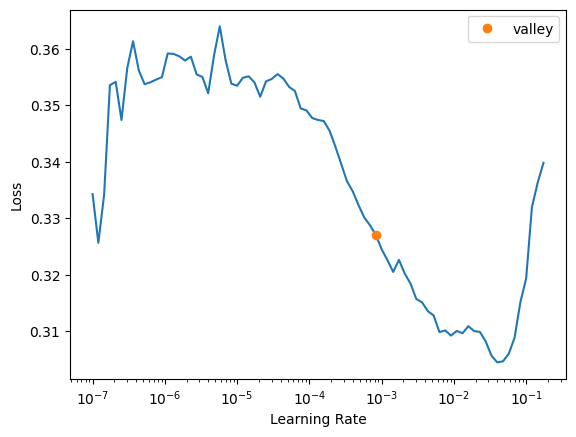

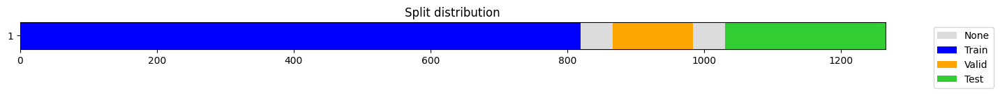

epoch,train_loss,valid_loss,mse,mae,time
0,0.370096,0.293636,0.293636,0.472343,00:00
1,0.322179,0.209078,0.209078,0.385827,00:00
2,0.288762,0.177700,0.177700,0.347264,00:00
3,0.262101,0.183124,0.183124,0.347509,00:00
4,0.241648,0.168923,0.168923,0.333889,00:00
5,0.222981,0.151283,0.151283,0.315649,00:00
6,0.205670,0.173846,0.173846,0.338139,00:00
7,0.190658,0.200809,0.200809,0.361038,00:00
8,0.177986,0.161562,0.161562,0.326192,00:00
9,0.165698,0.161981,0.161981,0.326831,00:00


[I 2024-12-14 15:23:22,521] Trial 487 finished with value: 0.16253392180603213 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 15, 'n_layers': 3, 'd_ff': 200, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


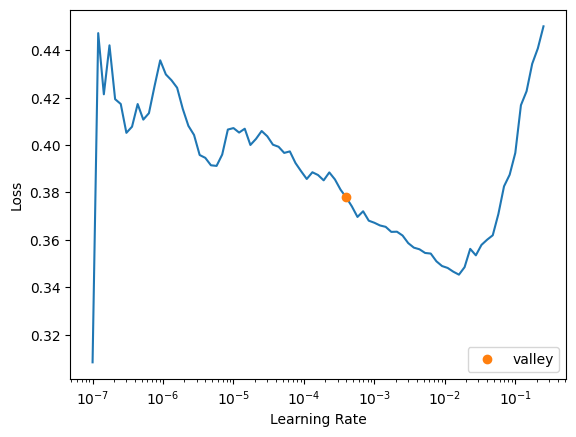

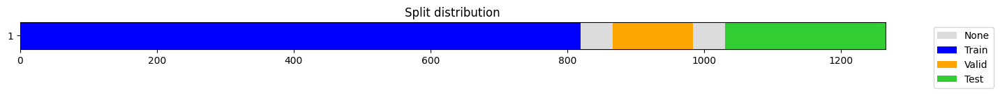

epoch,train_loss,valid_loss,mse,mae,time
0,0.338050,0.222509,0.222509,0.402112,00:00
1,0.295161,0.197895,0.197895,0.365304,00:00
2,0.272453,0.179732,0.179732,0.338053,00:00
3,0.251159,0.142544,0.142544,0.306821,00:00
4,0.230991,0.166325,0.166325,0.330708,00:00
5,0.211531,0.131345,0.131345,0.287571,00:00
6,0.194342,0.144001,0.144001,0.302502,00:00
7,0.181606,0.158089,0.158089,0.315386,00:00
8,0.170002,0.151091,0.151091,0.307896,00:00
9,0.162311,0.147645,0.147645,0.304737,00:00


[I 2024-12-14 15:23:27,392] Trial 488 finished with value: 0.14764521473525824 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 40, 'epochs': 10, 'n_layers': 3, 'd_ff': 240, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


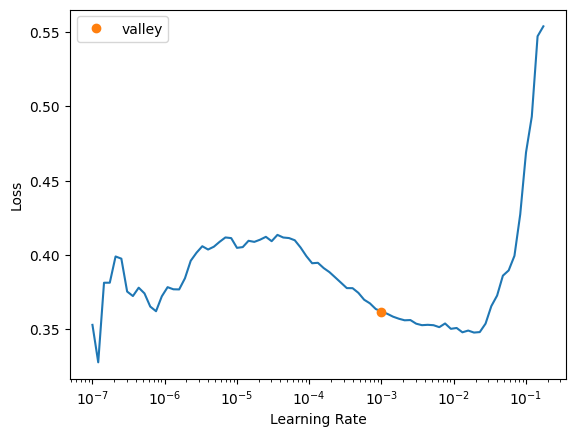

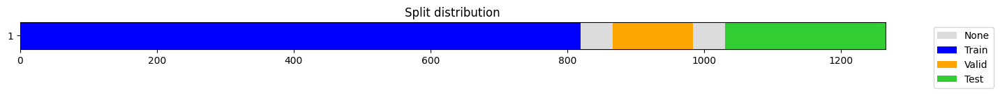

epoch,train_loss,valid_loss,mse,mae,time
0,0.351085,0.256090,0.256090,0.434260,00:00
1,0.301750,0.202570,0.202570,0.376329,00:00
2,0.271065,0.193670,0.193670,0.358392,00:00
3,0.249032,0.203611,0.203611,0.370379,00:00
4,0.223535,0.181938,0.181938,0.341154,00:00
5,0.203536,0.167276,0.167276,0.319743,00:00
6,0.188389,0.181848,0.181848,0.340587,00:00
7,0.170097,0.158984,0.158984,0.319292,00:00
8,0.159975,0.193750,0.193750,0.348515,00:00
9,0.147406,0.192734,0.192734,0.347038,00:00


[I 2024-12-14 15:23:38,611] Trial 489 finished with value: 0.15109434136189837 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 3, 'd_ff': 192, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


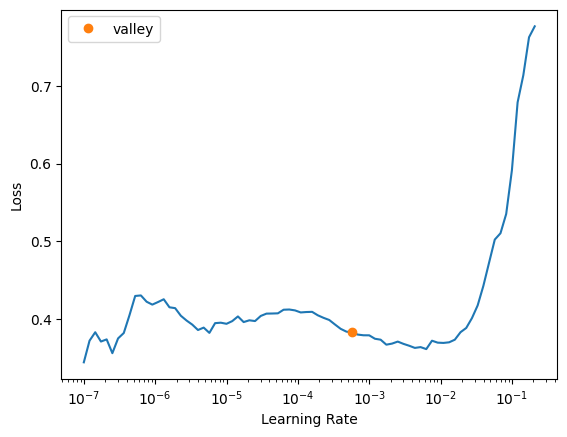

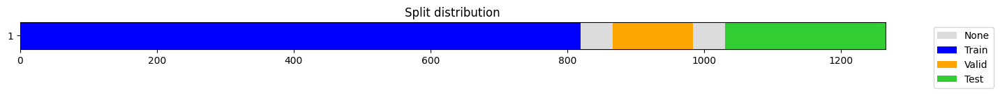

epoch,train_loss,valid_loss,mse,mae,time
0,0.299352,0.205082,0.205082,0.381246,00:00
1,0.272532,0.232540,0.232540,0.392927,00:00
2,0.253880,0.151180,0.151180,0.295647,00:00
3,0.236030,0.172204,0.172204,0.330215,00:00
4,0.213254,0.132055,0.132055,0.287209,00:00
5,0.202397,0.133731,0.133731,0.280028,00:00
6,0.186453,0.218992,0.218992,0.370070,00:00
7,0.172589,0.152425,0.152425,0.308910,00:00
8,0.152958,0.208269,0.208269,0.364127,00:00
9,0.137146,0.130603,0.130603,0.272739,00:00


[I 2024-12-14 15:23:54,361] Trial 490 finished with value: 0.16277729368905064 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 56, 'patch_len': 16, 'batch_size': 16, 'epochs': 20, 'n_layers': 3, 'd_ff': 224, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


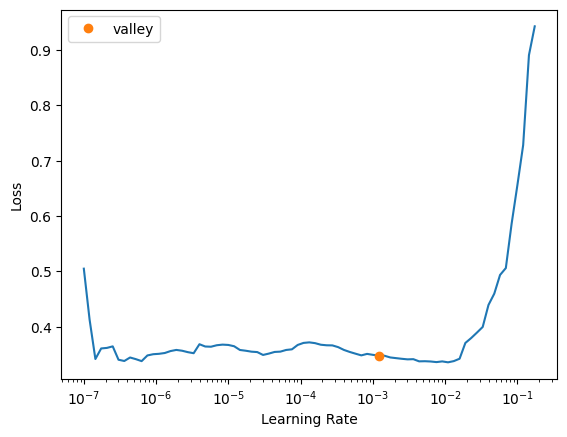

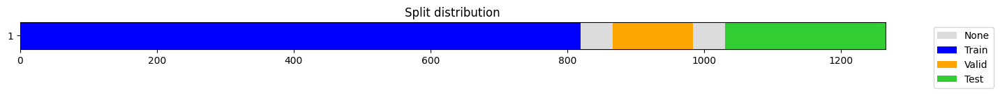

epoch,train_loss,valid_loss,mse,mae,time
0,0.396024,0.328913,0.328913,0.500073,00:00
1,0.345145,0.225764,0.225764,0.405515,00:00
2,0.308712,0.195459,0.195459,0.370616,00:00
3,0.281293,0.193935,0.193935,0.361298,00:00
4,0.260745,0.192201,0.192201,0.352405,00:00
5,0.247930,0.199676,0.199676,0.361479,00:00
6,0.235085,0.184031,0.184031,0.345909,00:00
7,0.224255,0.173647,0.173647,0.339702,00:00
8,0.212009,0.188813,0.188813,0.344128,00:00
9,0.199971,0.179066,0.179066,0.333698,00:00


[I 2024-12-14 15:24:03,154] Trial 491 finished with value: 0.19232931799676897 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 208, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


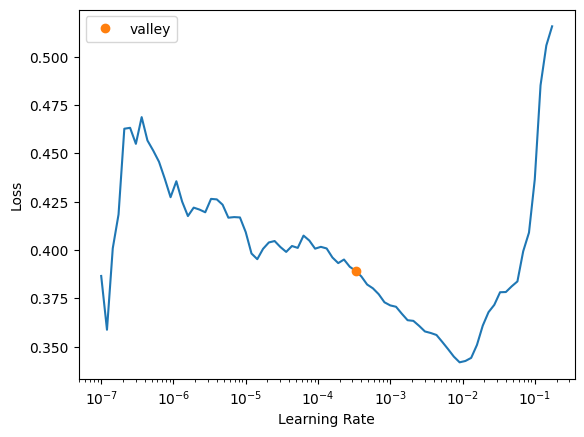

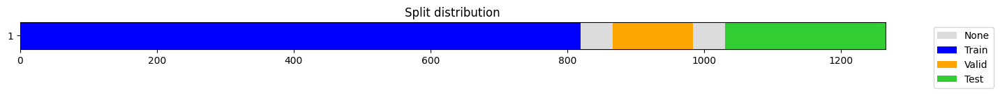

epoch,train_loss,valid_loss,mse,mae,time
0,0.369672,0.315505,0.315505,0.491138,00:00
1,0.331781,0.235914,0.235914,0.416934,00:00
2,0.302918,0.214520,0.214520,0.392936,00:00
3,0.279744,0.203728,0.203728,0.374686,00:00
4,0.264158,0.194108,0.194108,0.362242,00:00
5,0.251352,0.194851,0.194851,0.362189,00:00
6,0.241967,0.187819,0.187819,0.354100,00:00
7,0.233004,0.186300,0.186300,0.351848,00:00
8,0.224054,0.180890,0.180890,0.344640,00:00
9,0.216652,0.176563,0.176563,0.341174,00:00


[I 2024-12-14 15:24:11,749] Trial 492 finished with value: 0.17545751714650581 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 48, 'patch_len': 16, 'batch_size': 24, 'epochs': 20, 'n_layers': 2, 'd_ff': 216, 'attn_dropout': 0.5, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


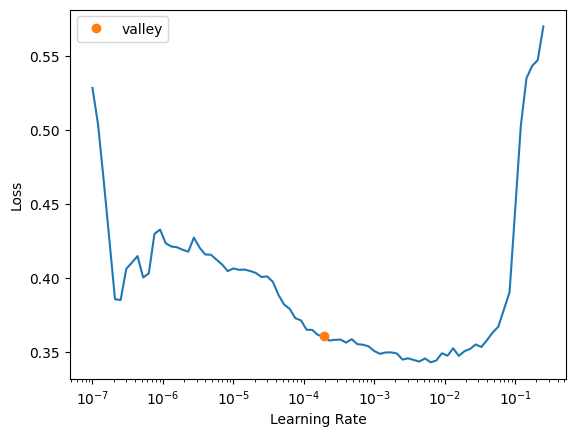

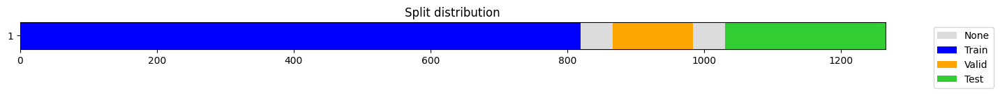

epoch,train_loss,valid_loss,mse,mae,time
0,0.352771,0.273299,0.273299,0.452575,00:00
1,0.305159,0.202923,0.202923,0.379536,00:00
2,0.278611,0.201396,0.201396,0.368522,00:00
3,0.252813,0.221823,0.221823,0.373169,00:00
4,0.230866,0.204705,0.204705,0.344816,00:00
5,0.213800,0.217847,0.217847,0.360241,00:00
6,0.198617,0.187957,0.187957,0.334863,00:00
7,0.185471,0.202381,0.202381,0.344196,00:00
8,0.172400,0.196870,0.196870,0.337974,00:00
9,0.165773,0.178281,0.178281,0.319727,00:00


[I 2024-12-14 15:24:20,416] Trial 493 finished with value: 0.16686472191647403 and parameters: {'fcst_history': 64, 'n_heads': 1, 'd_model': 40, 'patch_len': 16, 'batch_size': 32, 'epochs': 20, 'n_layers': 3, 'd_ff': 144, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (117, 1, 48)


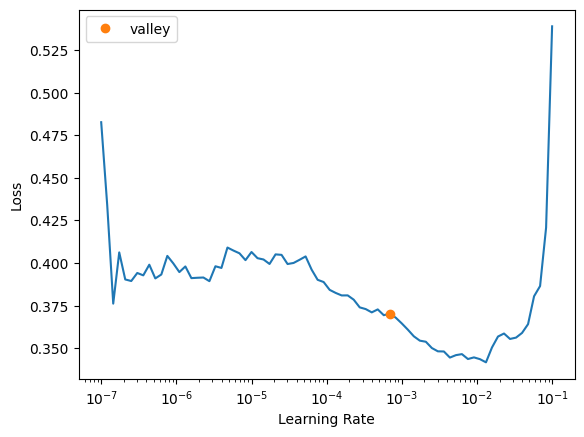

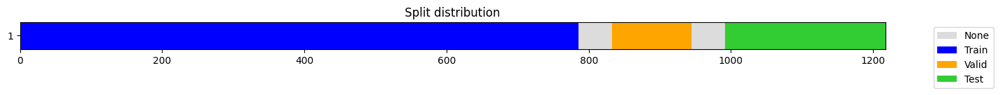

epoch,train_loss,valid_loss,mse,mae,time
0,0.472755,0.317576,0.317576,0.494563,00:00
1,0.370659,0.248431,0.248431,0.426725,00:00
2,0.322044,0.283252,0.283252,0.450933,00:00
3,0.283012,0.241777,0.241777,0.410821,00:00
4,0.239664,0.207668,0.207668,0.362234,00:00
5,0.196784,0.236661,0.236661,0.379193,00:00
6,0.172991,0.250647,0.250647,0.385033,00:00
7,0.148347,0.288040,0.288040,0.418740,00:00
8,0.133396,0.197122,0.197122,0.341076,00:00
9,0.122608,0.264482,0.264482,0.385228,00:00


[I 2024-12-14 15:24:29,410] Trial 494 finished with value: 0.26094160023722324 and parameters: {'fcst_history': 112, 'n_heads': 3, 'd_model': 24, 'patch_len': 96, 'batch_size': 24, 'epochs': 15, 'n_layers': 3, 'd_ff': 216, 'attn_dropout': 0.30000000000000004, 'dropout': 0.2, 'stride': 1}. Best is trial 134 with value: 0.11745386543381209.


scaled_preds.shape: (112, 1, 48)


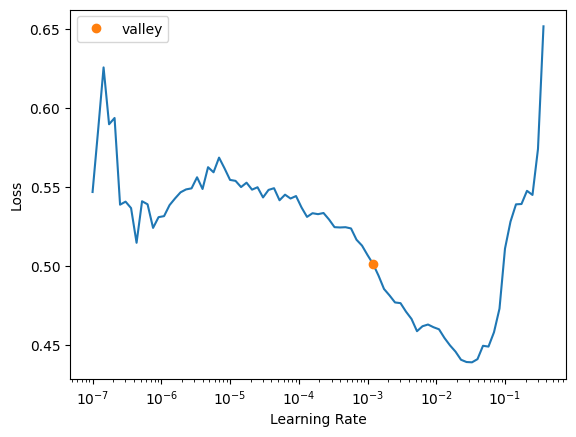

In [41]:
study = optuna.create_study(direction="minimize",
                            sampler=optuna.samplers.TPESampler(),
                            study_name='patchtst_medium_tune',
                            storage='sqlite:///patchtst_medium_tune.db', 
                            load_if_exists=True)
for i in range(10): 
    study.optimize(objective, n_trials=10)
    joblib.dump(study, "patchtst_medium_tune.pkl")

## Best Medium Model

In [110]:
study = joblib.load("patchtst_medium_tune.pkl")
sorted_trials = sorted(study.trials, key=lambda trial: trial.values[0] if trial.values else float('inf'))


In [111]:
value = sorted_trials[0].value
print(value)
HPs = sorted_trials[0].params
HPs

0.11745386543381209


{'fcst_history': 64,
 'n_heads': 1,
 'd_model': 80,
 'patch_len': 16,
 'batch_size': 56,
 'epochs': 20,
 'n_layers': 3,
 'd_ff': 192,
 'attn_dropout': 0.4,
 'dropout': 0.2,
 'stride': 1}

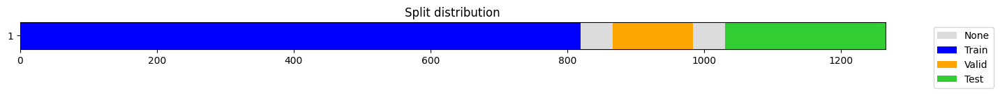

In [112]:
  datetime_col = 'Date'
  fcst_history = HPs['fcst_history']
  fcst_horizon = 48
  valid_size   = 0.1
  test_size    = 0.2

  #getting cross-val splots

  splits = get_forecasting_splits(crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                  valid_size=valid_size, test_size=test_size)

  train_data = crude_modeling_df.iloc[splits[0]]
  test_data = crude_modeling_df.iloc[splits[2]]
  val_data = crude_modeling_df.iloc[splits[1]]

  #scaling post cross-validation
  scaler = StandardScaler()
  scaled_crude_modeling_df = crude_modeling_df.copy()
  scaler.fit(train_data[['crude']])
  scaled_crude_modeling_df['crude'] = scaler.transform(crude_modeling_df[['crude']])

  #doing the sliding window step

  x_vars = 'crude'
  y_vars = 'crude'

  x, y = prepare_forecasting_data(scaled_crude_modeling_df, fcst_history=fcst_history, fcst_horizon=fcst_horizon, x_vars=x_vars, y_vars=y_vars)
  x.shape, y.shape

  x_tensor = torch.tensor(x, dtype=torch.float32)
  y_tensor = torch.tensor(y, dtype=torch.float32)




epoch,train_loss,valid_loss,mse,mae,time
0,0.381892,0.323383,0.323383,0.499425,00:00
1,0.343246,0.232279,0.232279,0.414036,00:00
2,0.314739,0.219051,0.219051,0.394806,00:00
3,0.291955,0.205494,0.205494,0.373574,00:00
4,0.275132,0.202495,0.202495,0.364852,00:00
5,0.258607,0.205027,0.205027,0.364299,00:00
6,0.246007,0.191053,0.191053,0.343919,00:00
7,0.234267,0.224078,0.224078,0.369171,00:00
8,0.221473,0.199879,0.199879,0.340849,00:00
9,0.210112,0.200154,0.200154,0.341404,00:00


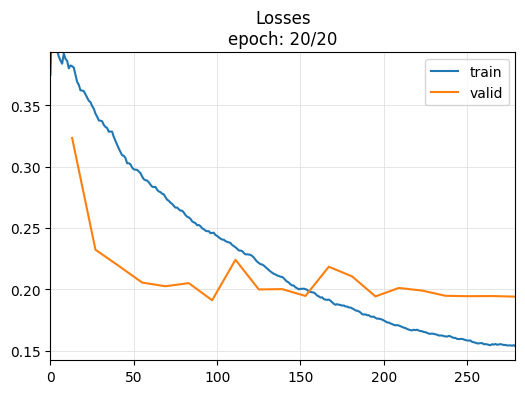

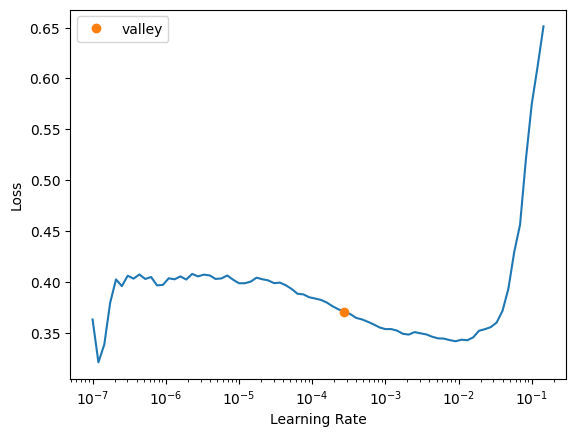

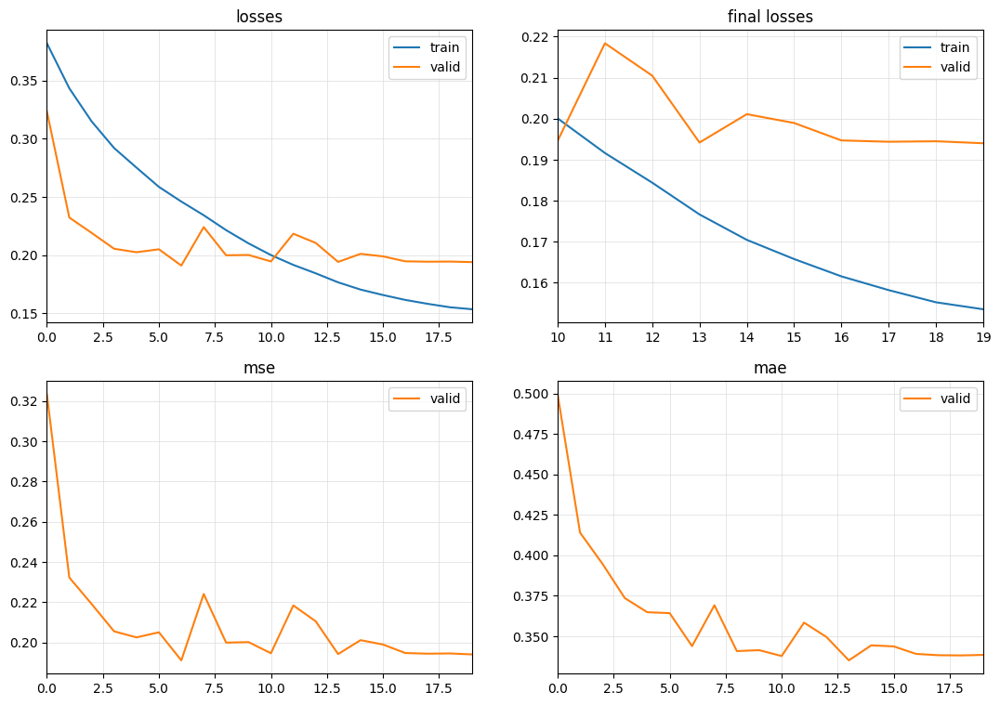

In [113]:
   

    arch_config = dict(
    n_layers= HPs['n_layers'],  # number of encoder layers
    n_heads = HPs['n_heads'],  # number of heads
    d_model= HPs['d_model'],  # dimension of model
    d_ff= HPs['d_ff'],  # dimension of fully connected network
    attn_dropout= HPs['attn_dropout'], # dropout applied to the attention weights
    dropout= HPs['dropout'], # dropout applied to all linear layers in the encoder except q,k&v projections
    patch_len= HPs['patch_len'],  # length of the patch applied to the time series to create patches
    stride= HPs['stride'],  # stride used when creating patches
    padding_patch= True,  # padding_patch
    #batch_size = HPs['batch_size']         
    )

    #modelling
    learn = TSForecaster(x_tensor, y_tensor, splits = splits, batch_size = HPs['batch_size'],
                     arch="PatchTST", arch_config=arch_config, metrics=[mse, mae], cbs=ShowGraph())

    lr_max = learn.lr_find().valley
    learn.fit_one_cycle(HPs['epochs'] , lr_max =lr_max)
    learn.export('patchTST.pt')

    #validation set inference
  



In [114]:
learn = load_learner('patchTST.pt')
scaled_preds_train, *_ = learn.get_X_preds(x[splits[0]])
scaled_preds_train = to_np(scaled_preds_train)
print(f"scaled_preds.shape: {scaled_preds_train.shape}")

scaled_y_train = y[splits[0]]
loss = mean_squared_error(scaled_y_train.flatten(), scaled_preds_train.flatten())
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_train.flatten(), scaled_preds_train.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_train.flatten(), scaled_preds_train.flatten())

results_df

scaled_preds.shape: (820, 1, 48)


,mse,mae
valid,0.129228,0.261935


In [115]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(scaled_y_train.flatten(), scaled_preds_train.flatten())
results_df

,smape
valid,64.562824


In [116]:

x_train = x[splits[0]]
y_train = y[splits[0]]


inverse_scale_y_preds = scaler.inverse_transform(scaled_preds_train.reshape(-1, 1)).flatten().reshape(820, 1, fcst_horizon)
inverse_scale_y_true = (scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()).reshape(820, 1, fcst_horizon)
inverse_scale_x_test = scaler.inverse_transform(x_train.reshape(-1, 1)).flatten().reshape(820, 1, fcst_history)


results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())

results_df

,mse,mae
valid,34.251354,4.264373


In [117]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df

,smape
valid,5.152036


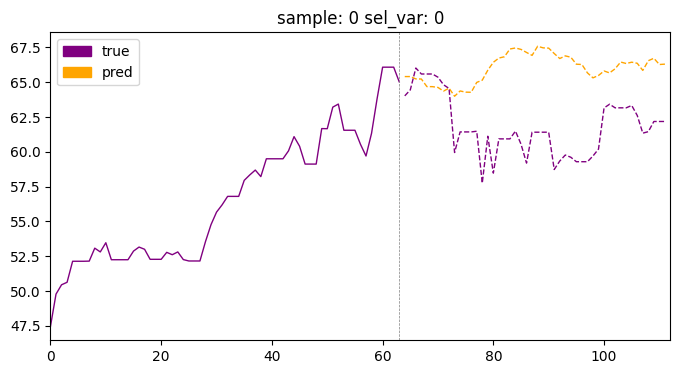

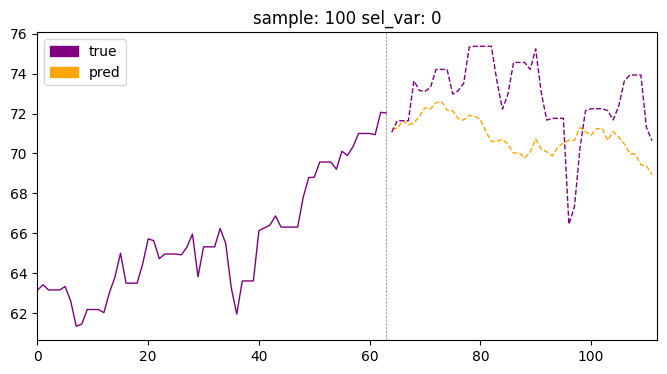

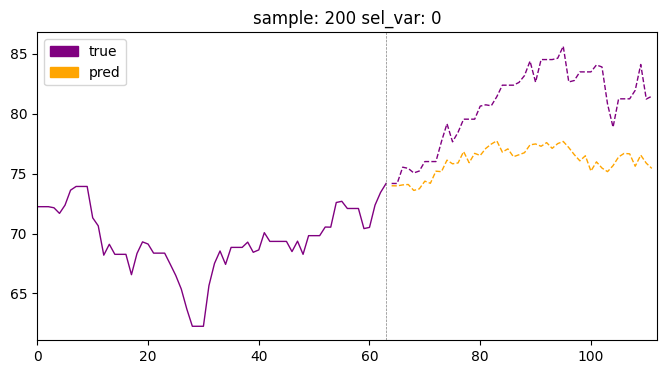

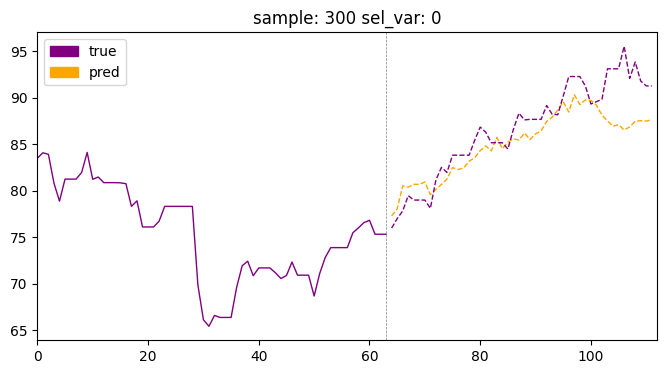

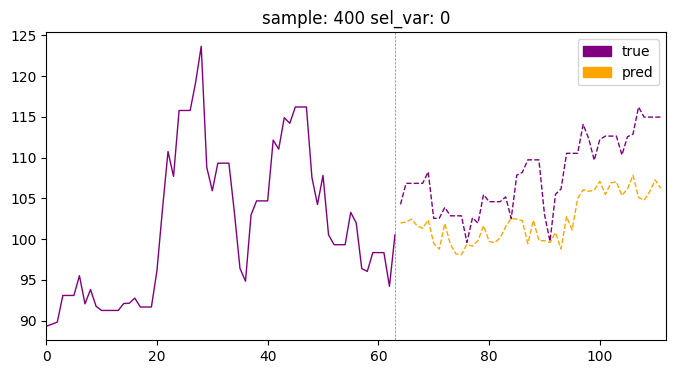

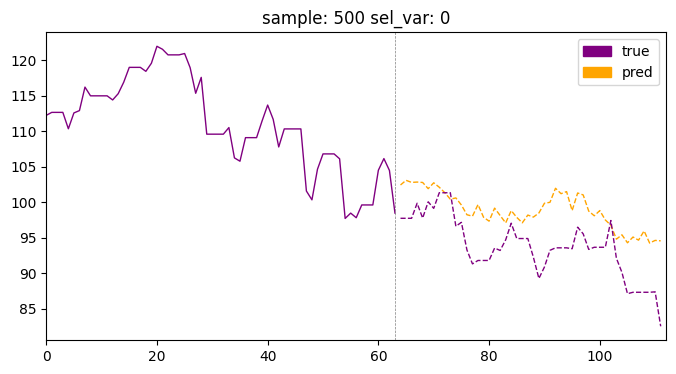

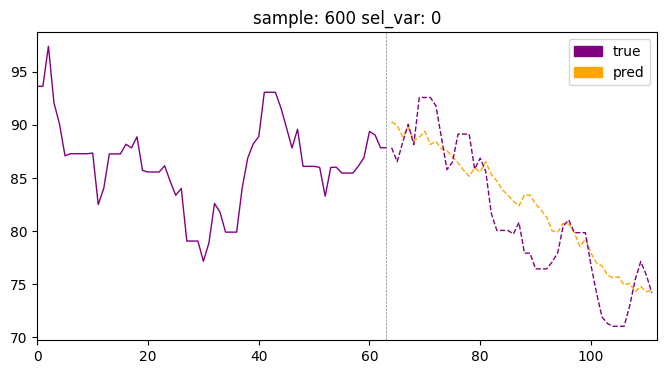

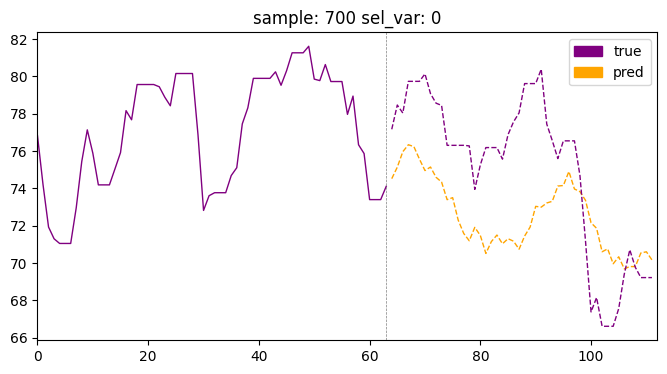

In [118]:
for id in range (0,800, 100):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


In [95]:
learn = load_learner('patchTST.pt')
scaled_preds_val, *_ = learn.get_X_preds(x[splits[1]])
scaled_preds_val = to_np(scaled_preds_val)
print(f"scaled_preds.shape: {scaled_preds_val.shape}")

scaled_y_true_val = y[splits[1]]
loss = mean_squared_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(scaled_y_true_val.flatten(), scaled_preds_val.flatten())

results_df

scaled_preds.shape: (117, 1, 48)


,mse,mae
valid,0.146658,0.303632


In [119]:

x_val = x[splits[1]]
y_val = y[splits[1]]


inverse_scale_y_preds = scaler.inverse_transform(scaled_preds_val.reshape(-1, 1)).flatten().reshape(117, 1, fcst_horizon)
inverse_scale_y_true = (scaler.inverse_transform(y_val.reshape(-1, 1)).flatten()).reshape(117, 1, fcst_horizon)
inverse_scale_x_test = scaler.inverse_transform(x_val.reshape(-1, 1)).flatten().reshape(117, 1, fcst_history)


results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df

,mse,mae
valid,38.871259,4.943199


In [122]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df

,smape
valid,6.019337


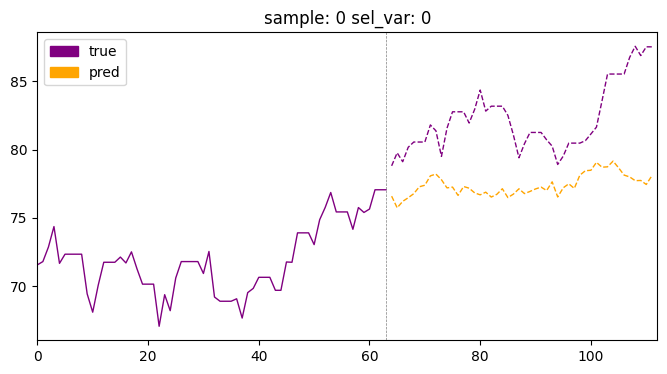

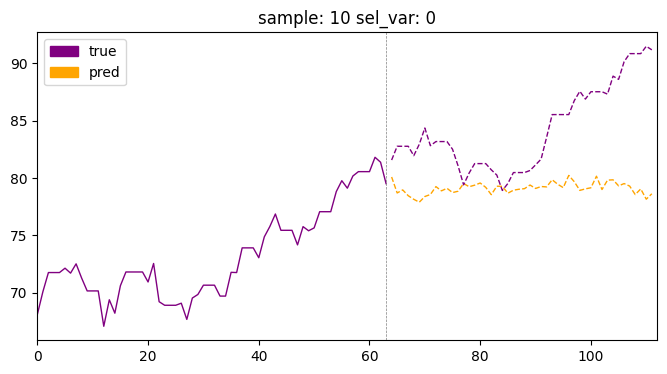

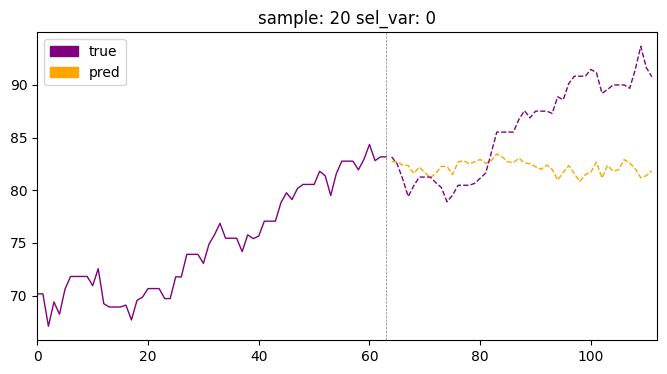

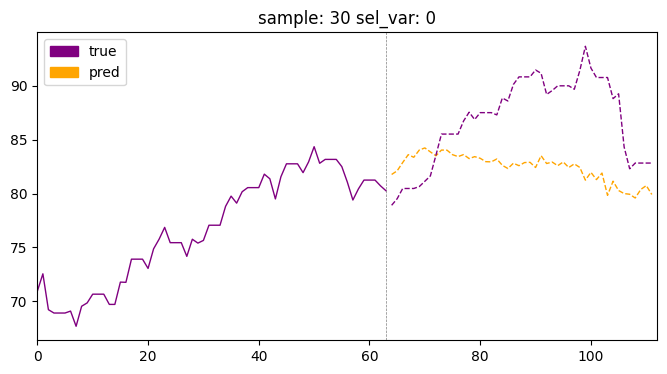

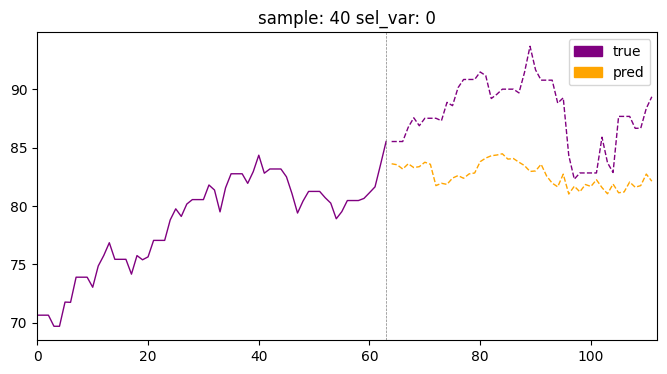

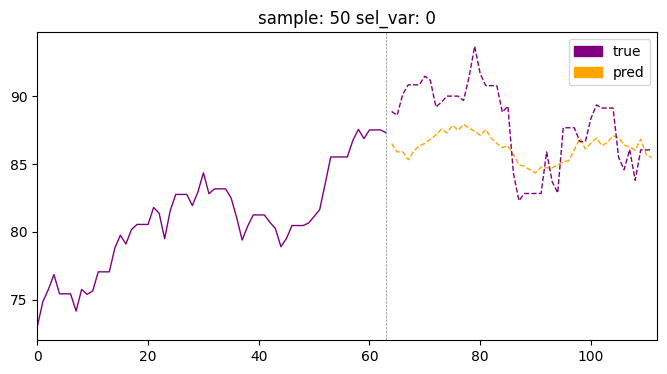

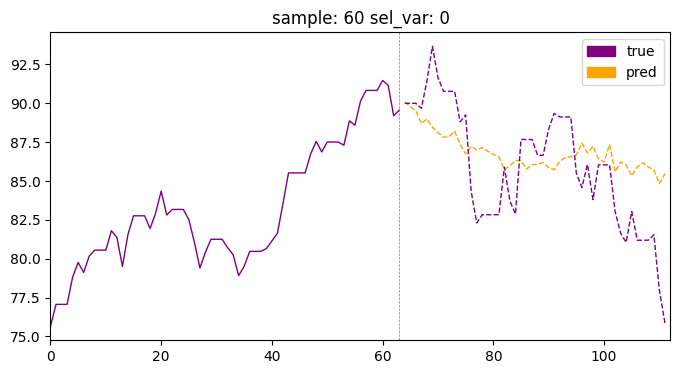

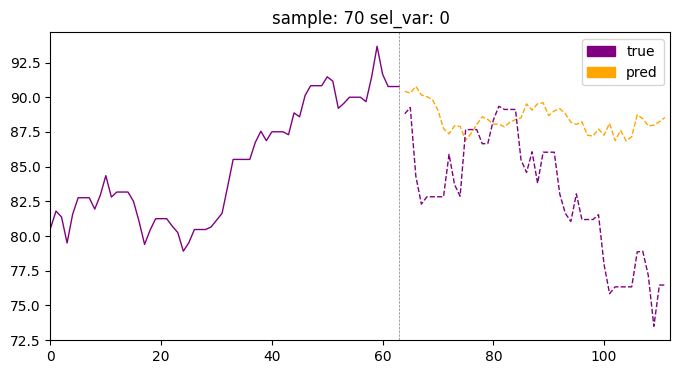

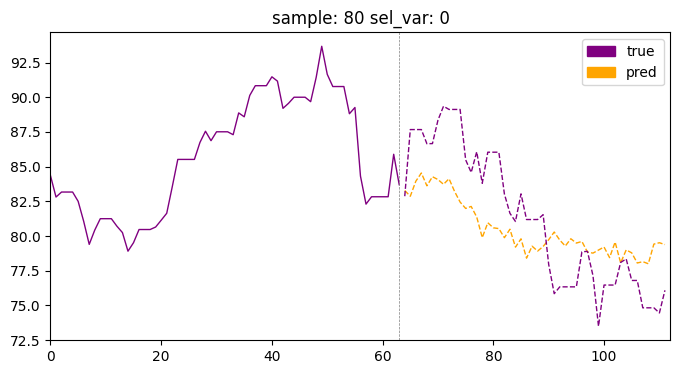

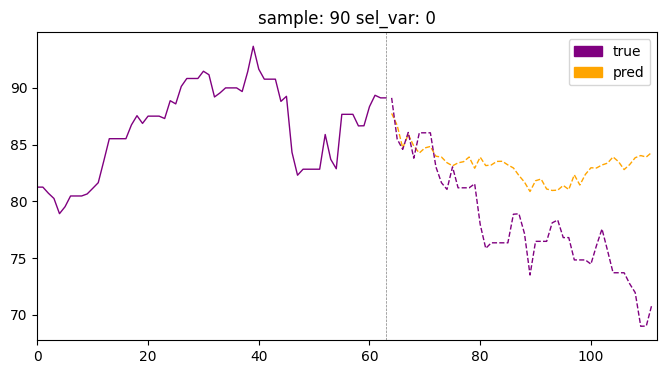

In [123]:
for id in range (0,100, 10):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


In [124]:
learn = load_learner('patchTST.pt')
y_test_preds, *_ = learn.get_X_preds(x[splits[2]])
y_test_preds = to_np(y_test_preds)
print(f"y_test_preds.shape: {y_test_preds.shape}")

y_test = y[splits[2]]
results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["test", "mse"] = mean_squared_error(y_test.flatten(), y_test_preds.flatten())
results_df.loc["test", "mae"] = mean_absolute_error(y_test.flatten(), y_test_preds.flatten())
results_df






y_test_preds.shape: (234, 1, 48)


,mse,mae
test,0.083484,0.236076


In [125]:

x_test = x[splits[2]]
y_test = y[splits[2]]


inverse_scale_y_preds = scaler.inverse_transform(y_test_preds.reshape(-1, 1)).flatten().reshape(234, 1, fcst_horizon)
inverse_scale_y_true = (scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()).reshape(234, 1, fcst_horizon)
inverse_scale_x_test = scaler.inverse_transform(x_test.reshape(-1, 1)).flatten().reshape(234, 1, fcst_history)


results_df = pd.DataFrame(columns=["mse", "mae"])
results_df.loc["valid", "mse"] = mean_squared_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df.loc["valid", "mae"] = mean_absolute_error(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df

,mse,mae
valid,22.127146,3.843379


In [126]:
results_df = pd.DataFrame(columns=["smape"])
results_df.loc["valid", "smape"] = smape(inverse_scale_y_true.flatten(), inverse_scale_y_preds.flatten())
results_df

,smape
valid,4.863289


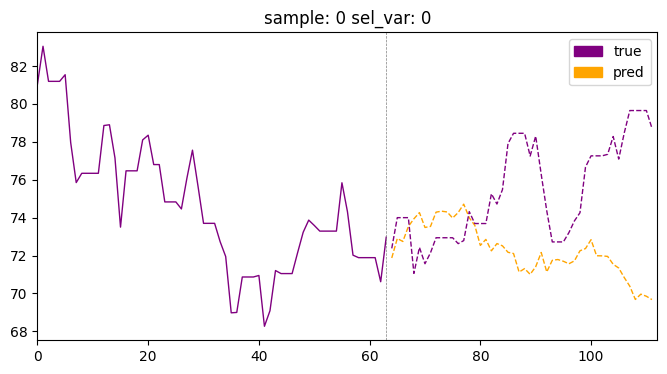

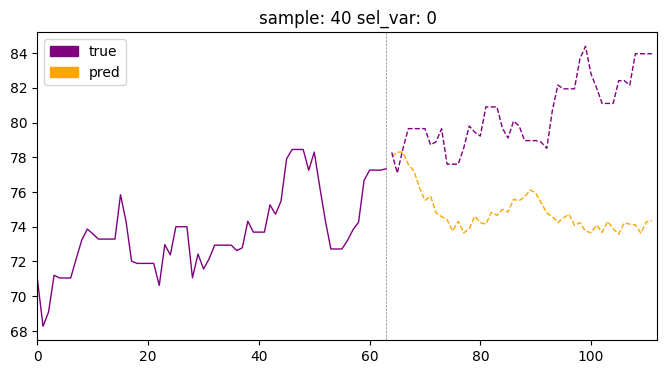

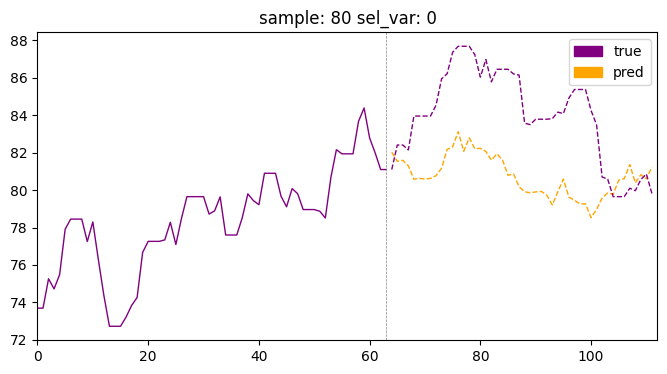

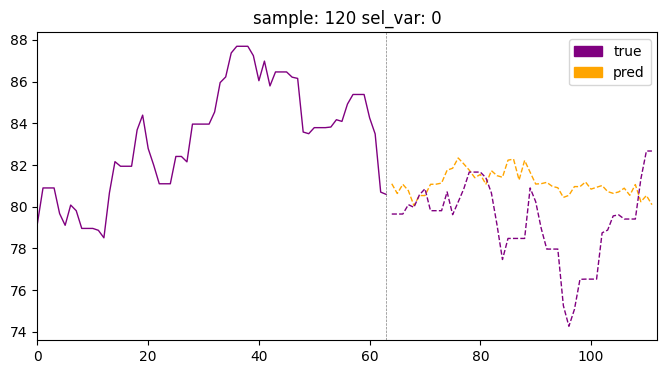

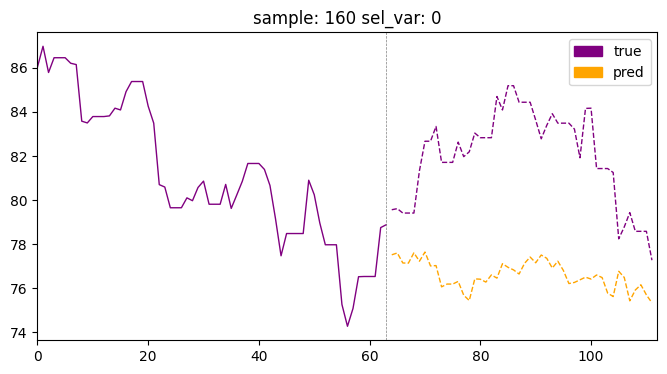

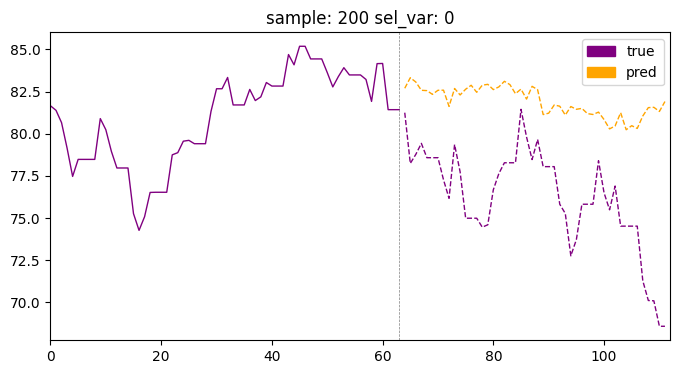

In [127]:
for id in range (0,240, 40):
  plot_forecast(inverse_scale_x_test, inverse_scale_y_true, inverse_scale_y_preds, sel_vars = True, idx = id)


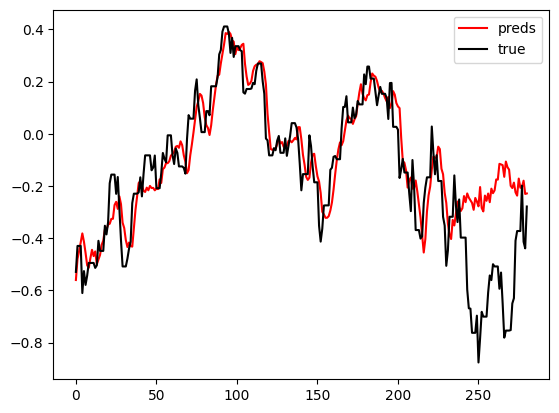

In [128]:
x_test = torch.tensor(x_test)
y_test = torch.tensor(y_test)
y_test_preds = torch.tensor(y_test_preds)



y_preds_one = y_test_preds[:, 0, 0]
y_true_one = y_test[:, 0, 0]

y_preds_last = y_test_preds[-1, 0, 1:]
y_true_last = y_test[-1, 0, 1:]

y_preds_appended = torch.cat((y_preds_one, y_preds_last))
y_true_appended = torch.cat((y_true_one, y_true_last))



plt.plot(y_preds_appended, c = 'r', label = 'preds')
plt.plot(y_true_appended, c = 'k', label = 'true')
plt.legend()
